# Projet Machine Learning - Groupe 1 - Notebook R

---

### Le notebook de référence est celui qui est codé en Python
---

Promotion 58 - 4GMM, Année universitaire 2023-2024\
Julia Manon (B), Piot Damien (A), Dumas Thomas (B), Ben Abdallah Selim (A)

---
Les données sont issues du site du concours KAGGLE; il s’agit du jeu de données "Global Data on Sustainable Energy" (2000-2020) disponible ici: https://www.kaggle.com/datasets/anshtanwar/global-data-on-sustainable-energy.

Le jeu de données comprend 3649 observations et 21 variables, qui représentent diverses caractéristiques liées à la consommation énergétique et à la géographie de 176 pays du monde au cours des années 2000 à 2020.

---

Les variables sont les suivantes:\
• **Entity** : Nom du pays ou de la région pour lequel les données sont rapportées.\
• **Year** : Année pour laquelle les données sont communiquées, entre 2000 et 2020.\
• **Access to electricity (% of population)** : Pourcentage de la population ayant accès à l’électricité.\
• **Access to clean fuels for cooking (% of population)** : Pourcentage de la population qui utilise principalement des combustibles propres.\
• **Renewable-electricity-generating-capacity-per-capita** : Capacité installée d’énergie renouvelable par personne.\
• **Financial flows to developing countries (US Dollars)** : Aide et assistance des pays développés pour les projets d’énergie propre.\
• **Renewable energy share in total final energy consumption (%)** : Pourcentage d’énergie renouvelable dans la consommation d’énergie finale.\
• **Electricity from fossil fuels (TWh)** : Électricité produite à partir de combustibles fossiles (charbon, pétrole, gaz) en térawattheures.\
• **Electricity from nuclear (TWh)** : Électricité produite à partir de l’énergie nucléaire en térawattheures.\
• **Electricity from renewables (TWh)** : Électricité produite à partir de sources renouvelables (hydroélec-
tricité, énergie solaire, énergie éolienne, etc.) en térawattheures.\
• **Low-carbon electricity (% electricity)** : Pourcentage d’électricité provenant de sources à faible teneur en carbone (nucléaire et énergies renouvelables).\
• **Primary energy consumption per capita (kWh/person)** : Consommation d’énergie par personne en kilowattheures. \
• **Energy intensity level of primary energy (MJ/2011 PPP GDP)** : Consommation d’énergie par unité de PIB à parité de pouvoir d’achat.\
• **Value-co2-emissions (metric tons per capita)** : Émissions de dioxyde de carbone par personne en tonnes métriques.\
• **Renewables (% equivalent primary energy)** : Équivalent énergie primaire provenant de sources re- nouvelables.\
• **GDP growth (annual %)** : Taux de croissance annuel du PIB en monnaie locale constante.\
• **GDP per capita** : Produit intérieur brut (PIB) par personne.\
• **Density (P/Km2)** : Densité de population en personnes par kilomètre carré.\
• **Land Area (Km2)** : Surface terrestre totale en kilomètres carrés.\
• **Latitude** : Latitude du centroïde du pays en degrés décimaux.\
• **Longitude** : Longitude du centroïde du pays en degrés décimaux.

Il est à noter que dans la documentation, la variable **Value-co2-emissions (metric tons per capita)** représente les émissions de dioxyde de carbone par personne en kilo-tonnes métriques. Cependant, lorsque nous regardons les valeurs, il semble plus probable que cette valeur les émissions de CO2 à l'échelle nationale. En reportant cette valeur par habitant en utilisant la superficie des pays et la densité, les valeurs calculées sont beaucoup plus cohérentes en émissions par personnes.

---

L’objectif est de prédire la variable Value-co2-emissions à partir des autres variables. Attention : Le jeu de données comporte beaucoup de valeurs manquantes, une étude exploratoire préalable est plus que jamais nécessaire pour se familiariser avec les données et les préparer à la phase de modélisation.

Pour ce faire, nous allons commencer par prendre en main les données et réaliser une analyse exploiratoire de celles-ci. Plus précisément, nous prendrons nos données en mains, nous réaliserons des analyses unidimensionnelles et multidimensionnelles, une étude des corrélation et une ACP. Puis, dans une seconde partie, nous ... 

**COMPLETER AVEC LA SUITE**

---

In [1]:
packages <- c("car", "caret", "countrycode", "corrplot", "dplyr", "e1071", "FactoMineR", 
              "factoextra", "gbm", "ggfortify", "ggplot2", "ggpubr", "glmnet", "gridExtra", 
              "knitr", "MASS", "nnet", "pheatmap", "plotly", "randomForest", 
              "readr", "reshape2", "rjson", "rpart", "rpart.plot", "tidyr", "viridis")

install_if_missing <- function(package) {
  if (!require(package, character.only = TRUE)) {
    install.packages(package, dependencies = TRUE)
    library(package, character.only = TRUE)
  }
}

for (pkg in packages) {
  install_if_missing(pkg)
}

Le chargement a nécessité le package : car

Le chargement a nécessité le package : carData

Le chargement a nécessité le package : caret

Le chargement a nécessité le package : ggplot2

Le chargement a nécessité le package : lattice

Le chargement a nécessité le package : countrycode

Le chargement a nécessité le package : corrplot

corrplot 0.92 loaded

Le chargement a nécessité le package : dplyr


Attachement du package : ‘dplyr’


L'objet suivant est masqué depuis ‘package:car’:

    recode


Les objets suivants sont masqués depuis ‘package:stats’:

    filter, lag


Les objets suivants sont masqués depuis ‘package:base’:

    intersect, setdiff, setequal, union


Le chargement a nécessité le package : e1071

Le chargement a nécessité le package : FactoMineR

Le chargement a nécessité le package : factoextra

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa

Le chargement a nécessité le package : gbm

Loaded gbm 2.1.9

This version of gbm is no

In [2]:
library(car)
library(caret)
library(countrycode)
library(corrplot)
library(dplyr)
library(e1071)
library(FactoMineR)
library(factoextra)
library(gbm)
library(ggfortify)
library(ggplot2)
library(ggpubr)
library(glmnet)
library(gridExtra)
library(knitr)
library(MASS)
library(nnet)
library(pheatmap)
library(plotly)
library(randomForest)
library(readr)
library(reshape2)
library(rjson)
library(rpart)
library(rpart.plot)
library(tidyr)
library(viridis)


# 1 - Prise en main des données et analyse exploratoire

## 1.1 - Prise en main du jeu de données

### 1.1.1 - Ouverture du jeu de données

In [3]:
file_path <- "global-data-on-sustainable-energy .csv"
data <- read.csv(file_path)

head(data)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,⋯,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


In [4]:
summary(data)

    Entity               Year      Access.to.electricity....of.population.
 Length:3649        Min.   :2000   Min.   :  1.252                        
 Class :character   1st Qu.:2005   1st Qu.: 59.801                        
 Mode  :character   Median :2010   Median : 98.362                        
                    Mean   :2010   Mean   : 78.934                        
                    3rd Qu.:2015   3rd Qu.:100.000                        
                    Max.   :2020   Max.   :100.000                        
                                   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

Sur la base de donénes importée, les noms des colonnes sont assez compliqués, ils sont longs et contiennent des espaces. Nous allons les renommer afin de simplifier le code et les appels aux colonnes. De plus, en observant l'aperçu de notre dataframe, nous constatons que certaines données sont manquantes : des valeurs sont marquées comme NaN. Pour palier cela, nous avons deux options : supprimer les données manquantes ou les estimer. Nous traiterons ces deux possibilités par la suite.

Nous commençons par renommer nos colonnes pour simplifier notre dataframe.

In [5]:
# Transformation de la partie 1.1.2 faite à ce niveau pour une raison pratique
data$Entity = as.factor(data$Entity) #On convertir Entity en variable qualitative
data$Year = as.factor(data$Year) #On convertit Year en variable qualitative
data$Density.n.P.Km2. = as.numeric(gsub(",","",data$Density.n.P.Km2.)) #On convertit Density(P/Km2) en une variable quantitative

In [6]:
# Nous allons renommer les colonnes pour simplifier notre dataframe
names(data)[3] <- "Elec_access"
names(data)[4] <- "Clean_access"
names(data)[5] <- "Renewable_per_capita" #
names(data)[6] <- "Financial_flows" #
names(data)[7] <- "Renewable_share"
names(data)[8] <- "Fossil_elec"
names(data)[9] <- "Nuclear_elec"
names(data)[10] <- "Renewable_elec"
names(data)[11] <- "Low_carb_elec"
names(data)[12] <- "Energy_per_capita"
names(data)[13] <- "PEnergy_intensity"
names(data)[14] <- "CO2"
names(data)[15] <- "Renewables" #
names(data)[16] <- "Growth"
names(data)[17] <- "GDP_per_capita"
names(data)[18] <- "Density"
names(data)[19] <- "Area"
      
head(data)

,Entity,Year,Elec_access,Clean_access,Renewable_per_capita,Financial_flows,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,⋯,Energy_per_capita,PEnergy_intensity,CO2,Renewables,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


Nous affichons notre dataframe comme précédemment, avec les nouveaux noms des colonnes.

### 1.1.2 - Etude et modification du type des variables

Nous allons maintenant étudier la nature des variables et leur encodage. L'idée est d'avoir un aperçu sur les types des variables : qualitatives ou quantitatives. 

Nous allons encoder la variable 'Year' en variable qualitative, afin qu'elle soit traitée comme une modalité, et non comme une valeur numérique classique. De plus, on observe que la densité est présentée comme une variable qualitative alors que les données correspondantes sont numériques : nous allons la convertir en variable quantitative. Finalement, nous allons modifier le type des variables qualitatives de 'object' à 'category'.

In [7]:
# Transformation faite dans la partie précédente pour une raison pratique

In [8]:
sapply(data,class)

Entity                 Year          Elec_access 
            "factor"             "factor"            "numeric" 
        Clean_access Renewable_per_capita      Financial_flows 
           "numeric"            "numeric"            "numeric" 
     Renewable_share          Fossil_elec         Nuclear_elec 
           "numeric"            "numeric"            "numeric" 
      Renewable_elec        Low_carb_elec    Energy_per_capita 
           "numeric"            "numeric"            "numeric" 
   PEnergy_intensity                  CO2           Renewables 
           "numeric"            "numeric"            "numeric" 
              Growth       GDP_per_capita              Density 
           "numeric"            "numeric"            "numeric" 
                Area             Latitude            Longitude 
           "integer"            "numeric"            "numeric"

La transformation des données à bien été effectuée comme prévu. Nous allons maintenant passer à l'étude des valeurs manquantes.

### 1.1.3 - Etude des valeurs manquantes

Dans la partie d'ouverture du jeu de données, nous avons pu constater que certaines valeurs étaient manquantes. Nous allons donc étudier le taux de valeurs manquantes pour chaque variable.

In [9]:
missing_rates <- sapply(data, function(x) mean(is.na(x)))
missing <-  missing_rates * 100
missing_sorted <- sort(missing, decreasing = TRUE)
print(missing_sorted)

          Renewables      Financial_flows Renewable_per_capita 
         58.56399013          57.24856125          25.51383941 
                 CO2               Growth       GDP_per_capita 
         11.72924089           8.68731159           7.72814470 
   PEnergy_intensity      Renewable_share         Clean_access 
          5.67278706           5.31652508           4.63140586 
        Nuclear_elec        Low_carb_elec          Fossil_elec 
          3.45300082           1.15100027           0.57550014 
      Renewable_elec          Elec_access              Density 
          0.57550014           0.27404768           0.02740477 
                Area             Latitude            Longitude 
          0.02740477           0.02740477           0.02740477 
              Entity                 Year    Energy_per_capita 
          0.00000000           0.00000000           0.00000000 


Ce mode d'affichage permet de visualiser les variables comptant la plus grande proportion de valeurs manqantes. On constante que pour les variables 'Renewables' et 'Financial_flows', il manque plus de la moitié des donneés. Pour la variable 'Renewable_per_capita', il manque une donnée sur 4. 

Afin de ne pas considérer de variables couvrant partiellement les données, en accord avec le sujet du projet, nous décidons de supprimer ces dernières.

In [10]:
data_mv <- data
data$Financial_flows <- NULL
data$Renewables <- NULL
data$Renewable_per_capita <- NULL

In [11]:
head(data)
dim(data) # --> on trouve (3649,18)

,Entity,Year,Elec_access,Clean_access,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,Low_carb_elec,Energy_per_capita,PEnergy_intensity,CO2,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,44.99,0.16,0,0.31,65.95744,302.5948,1.64,760,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,45.60,0.09,0,0.50,84.74577,236.8919,1.74,730,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,37.83,0.13,0,0.56,81.15942,210.8622,1.40,1030,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,36.66,0.31,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,44.24,0.33,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,33.88,0.34,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995


[1] 3649   18

La nouvelle taille du dataframe nous confirme que les colonnes ont bien été supprimées. 

Pour la suite de l'étude, nous souhaitons travailler sur un jeu de données ne comprenant pas de valeurs manquantes. Pour ce faire, nous allons supprimer les individus ayant des valeurs manquantes.

In [12]:
nb_ind <- nrow(data)
print(paste("Nombre d'individus actuel : ", nb_ind)) #3649 individus

[1] "Nombre d'individus actuel :  3649"


In [13]:
#Supression des individus pourlesquels on a des valeurs manquantes
data <- na.omit(data) 
new_nb_ind <- nrow(data)
print(paste("Nombre d'individus après supression des valeurs manquantes : ", new_nb_ind))

[1] "Nombre d'individus après supression des valeurs manquantes :  2868"


Notre jeu de données contient maintenant 2868 observations définies par 18 caractéristiques. La suppression des individus avec au moins une valeur manquante implique environ 800 observations en moins dans le jeu de données. Le nombre d'observations est celui attendu dans le sujet.

## 1.2 - Analyse exploratoire des données

### 1.2.1 - Analyse unidimensionnelle des données

On s'intéresse dans un premier temps aux variables quantitatives. Nous allons toutes les représenter sous forme d'histogramme pour visualiser leur distribution.

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
Warning message:
“The dot-dot notation (`..count..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(count)` instead.”


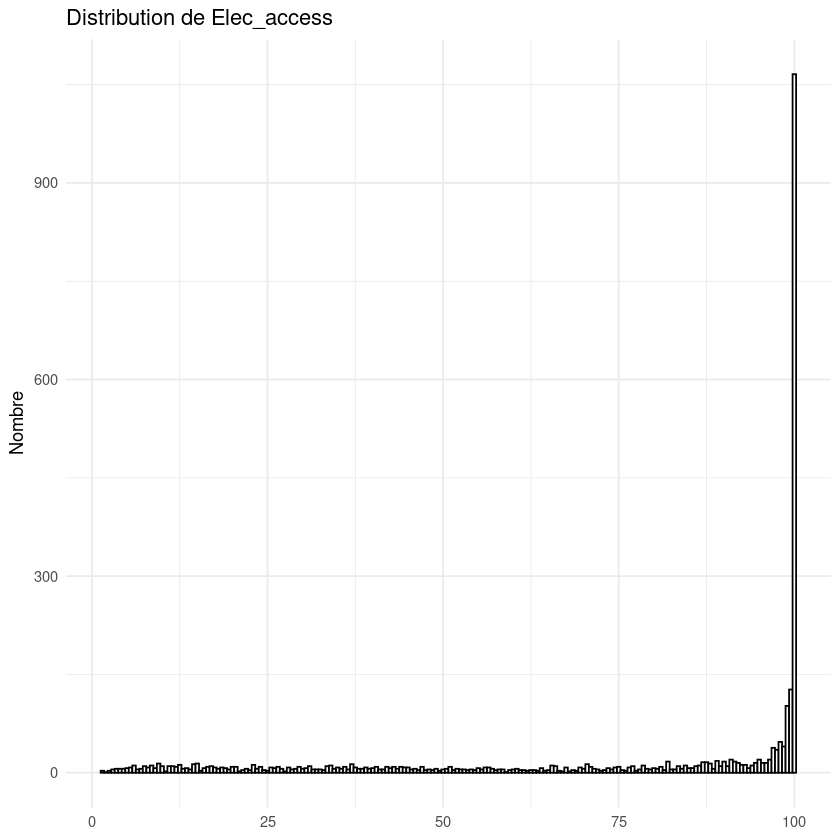

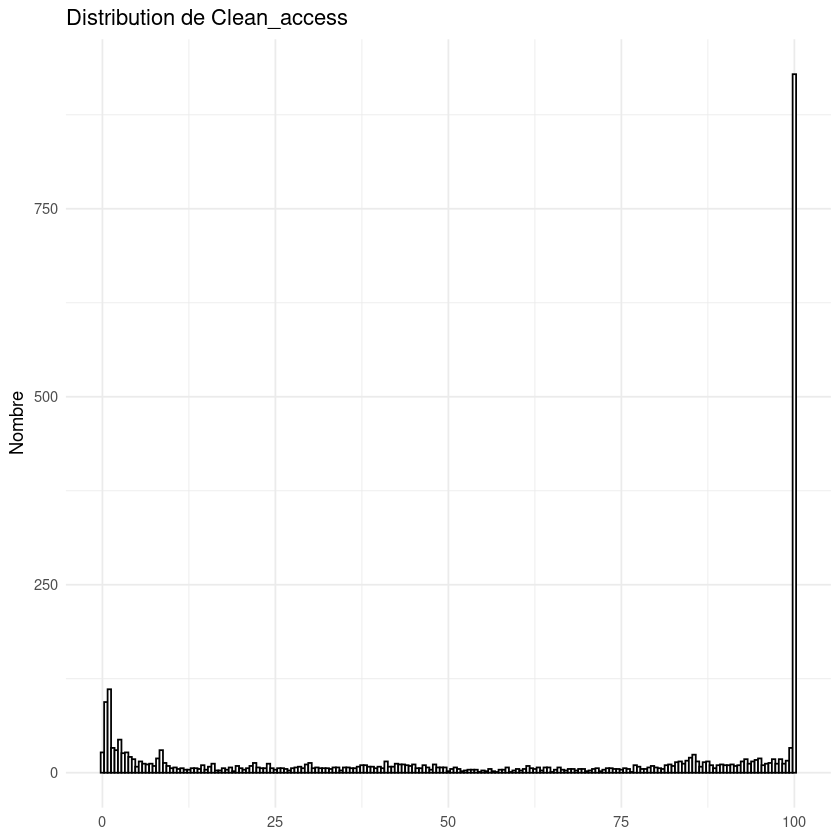

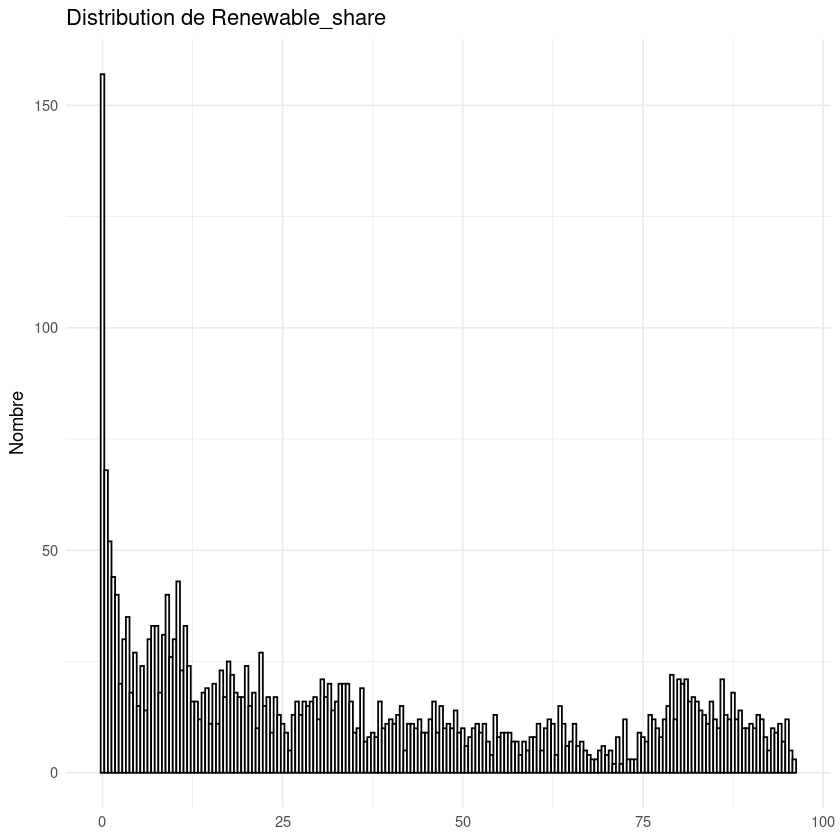

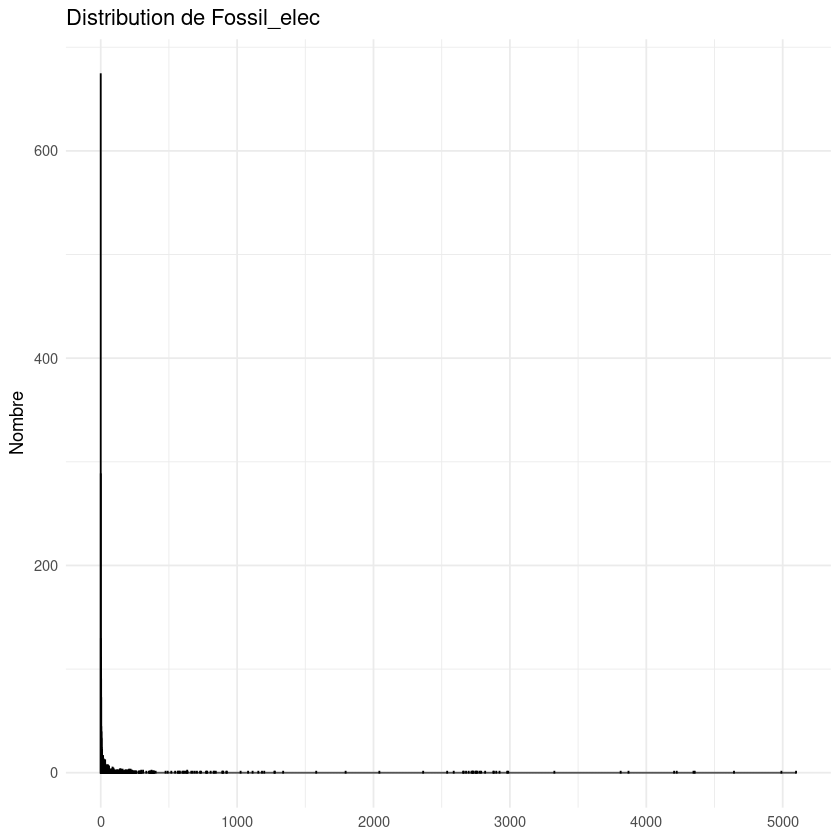

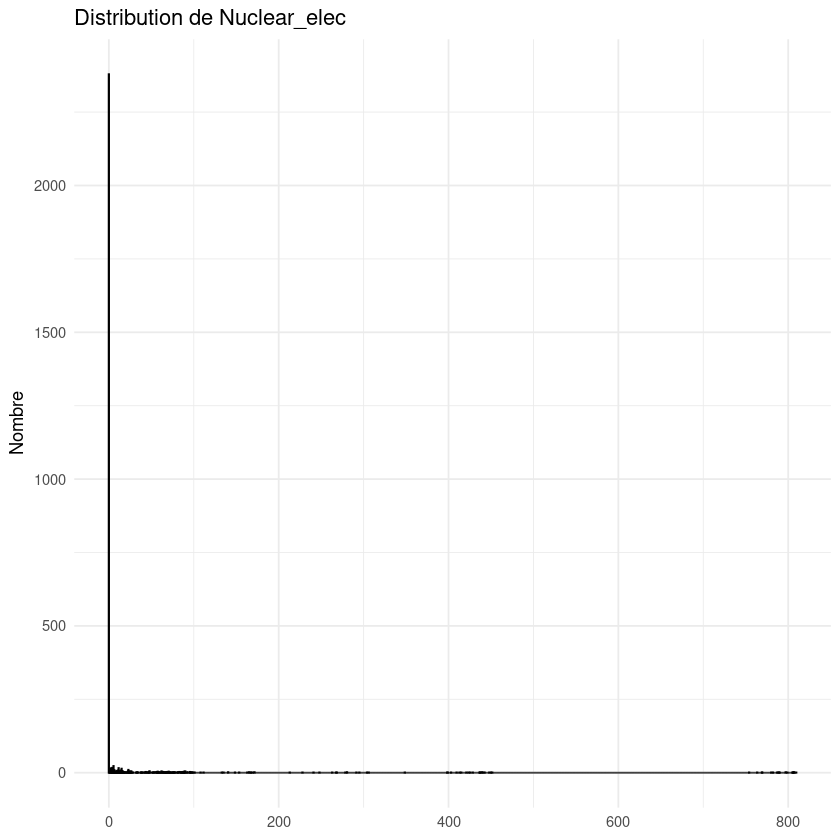

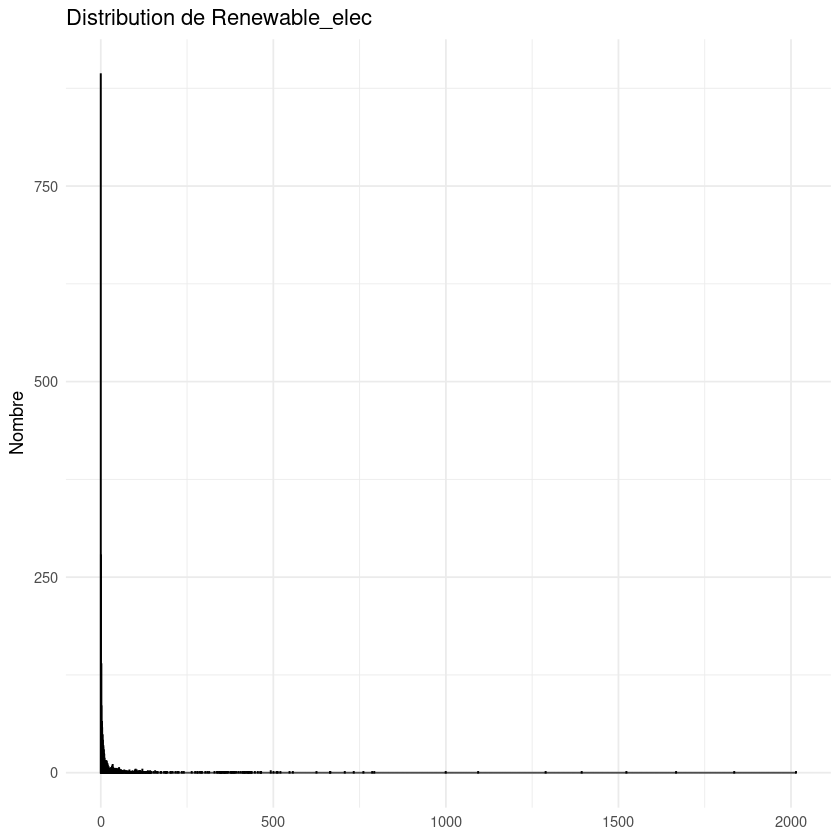

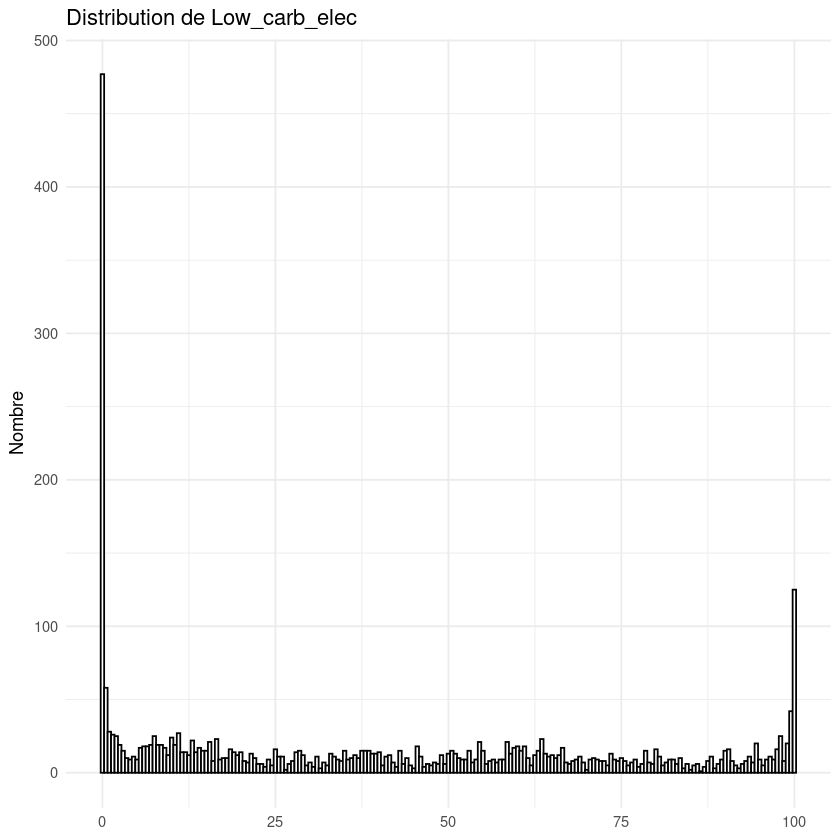

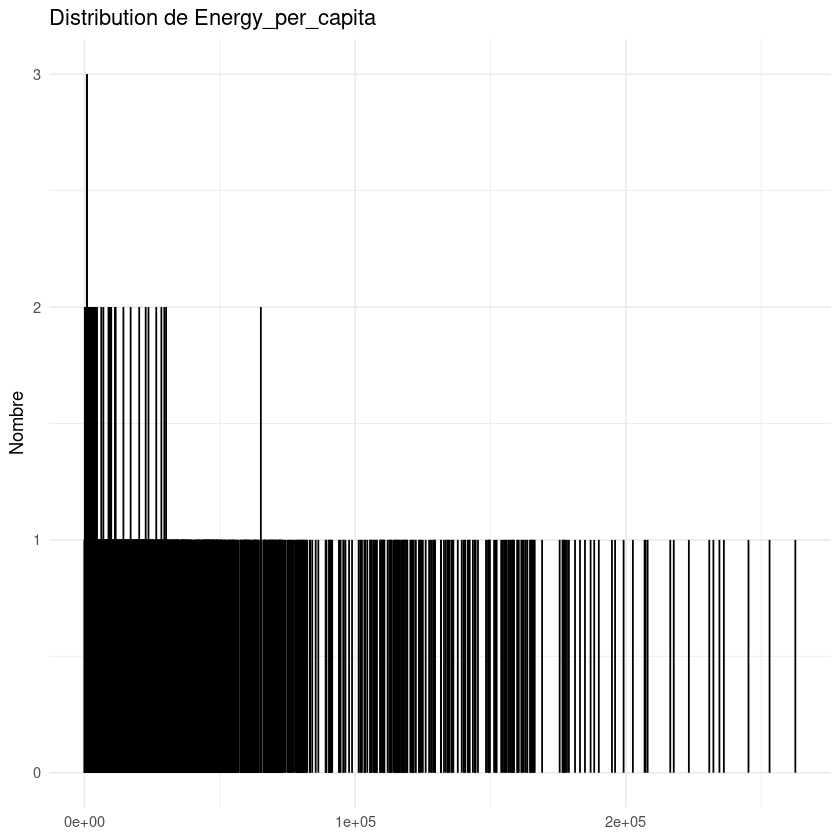

Warning message:
“Computation failed in `stat_bin()`.
Caused by error in `bin_breaks_width()`:
! The number of histogram bins must be less than 1,000,000.
ℹ Did you make `binwidth` too small?”


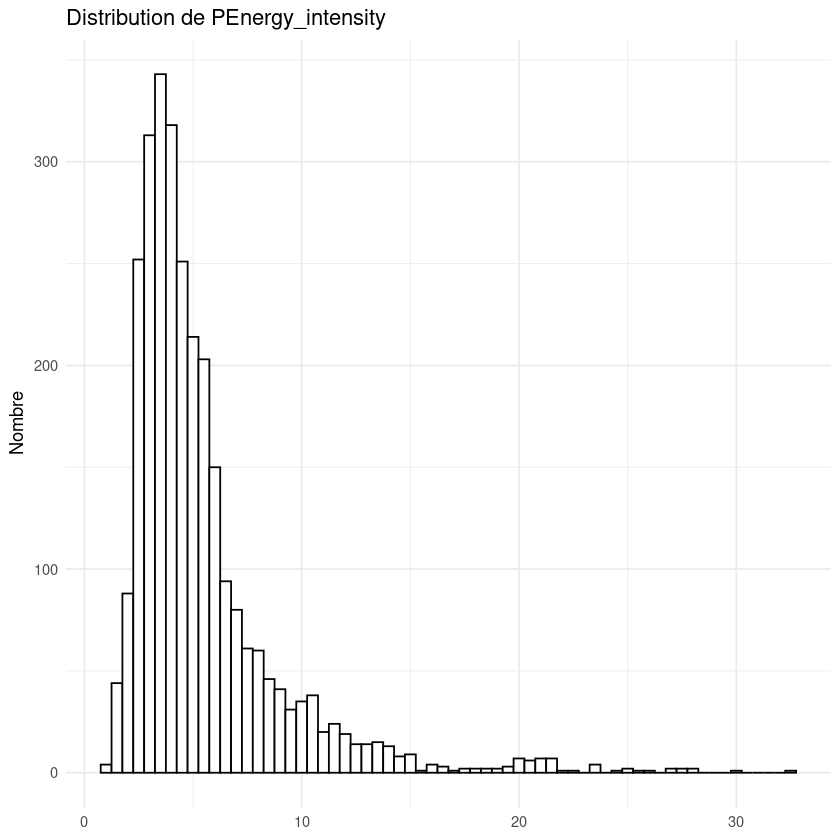

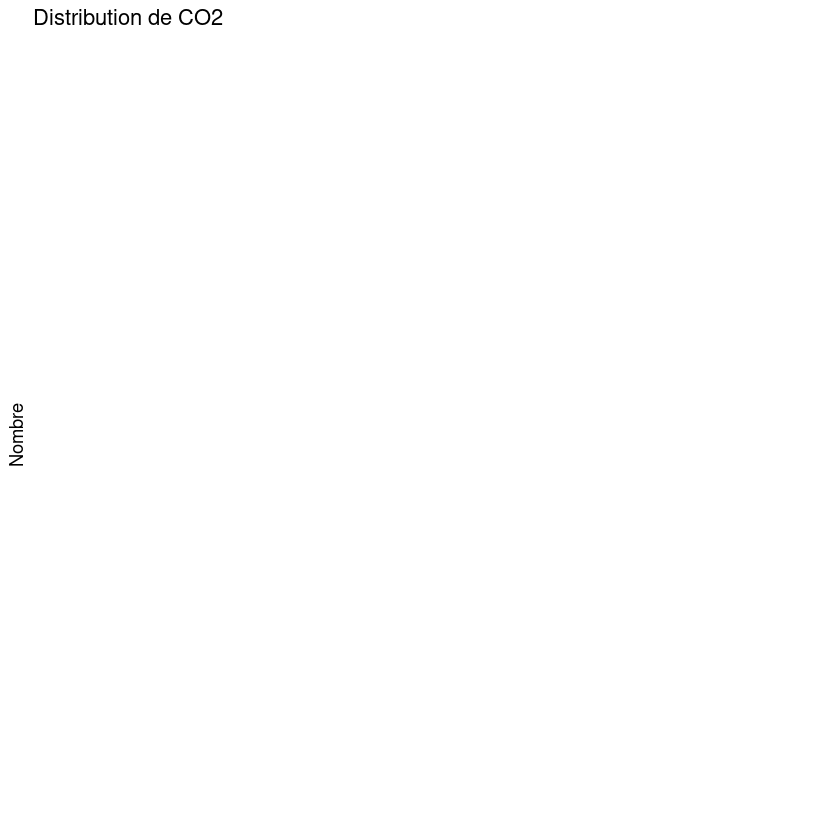

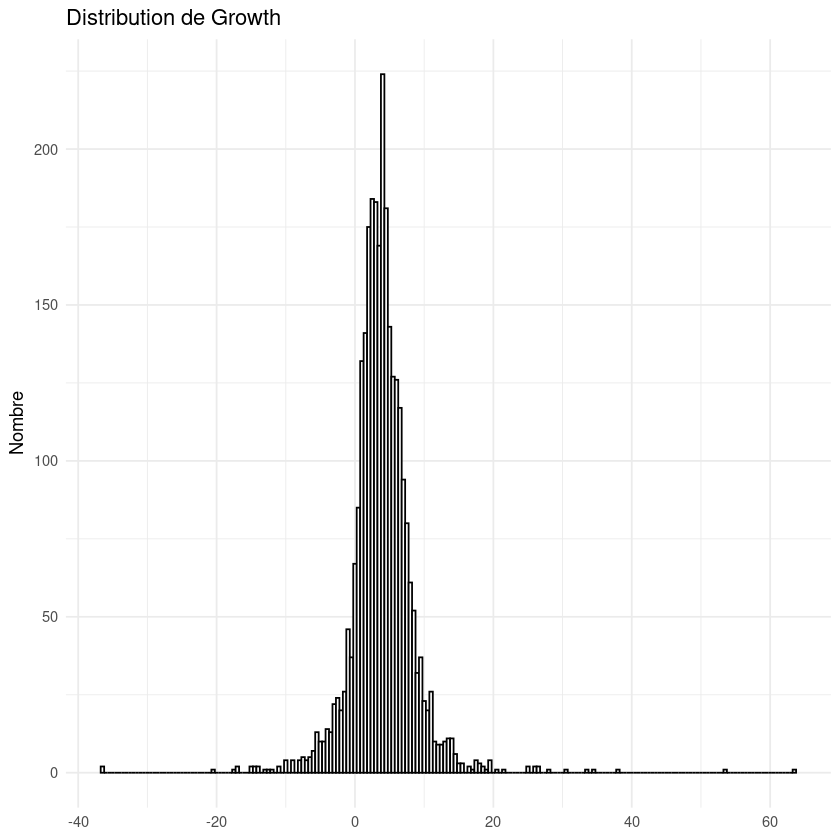

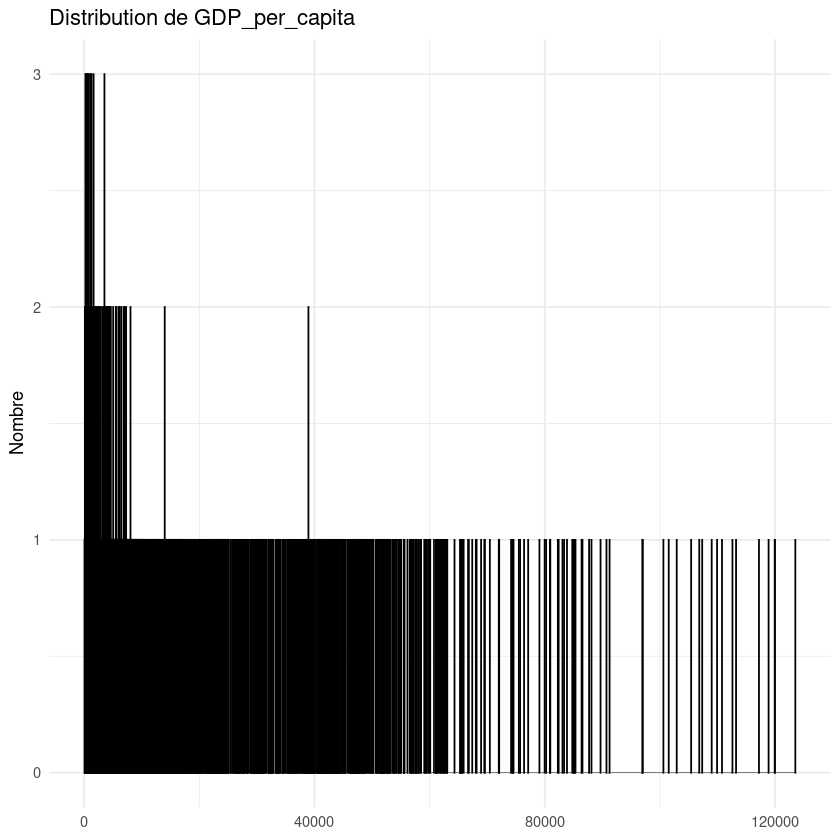

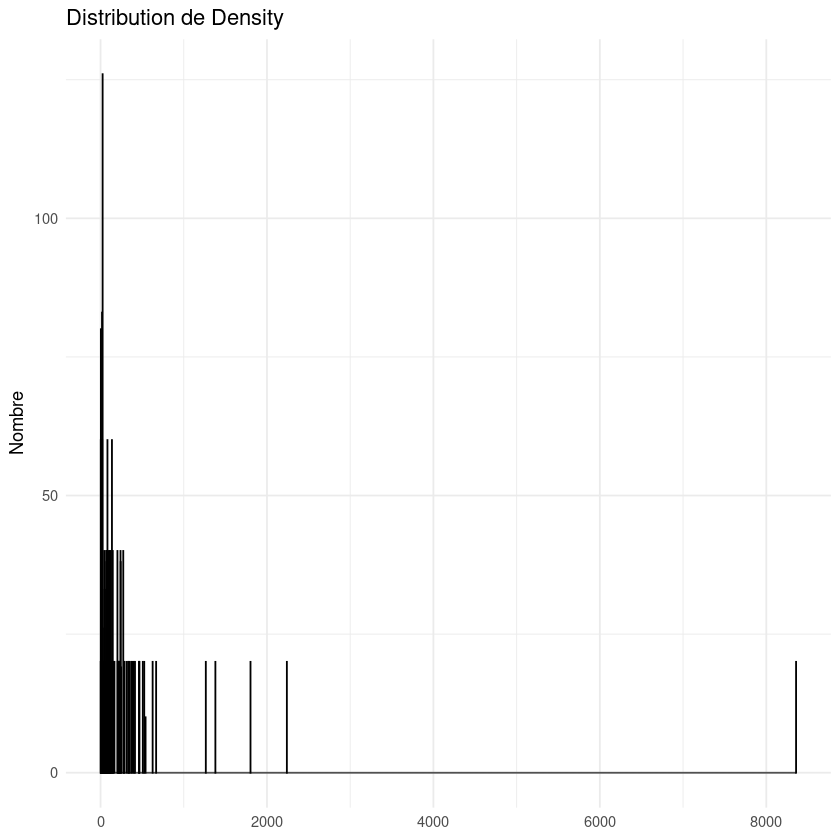

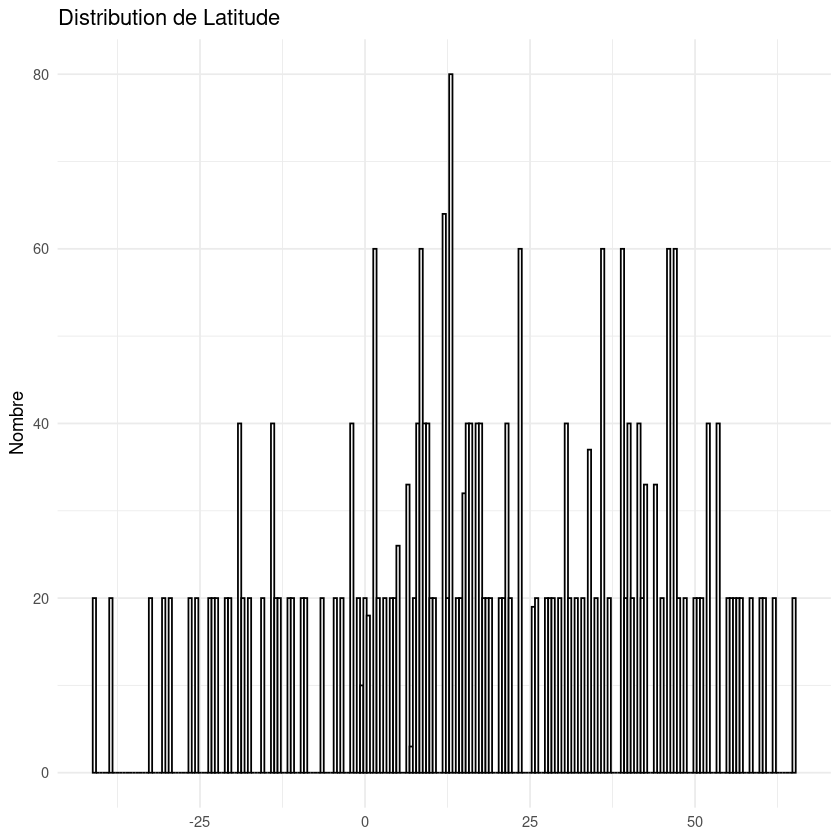

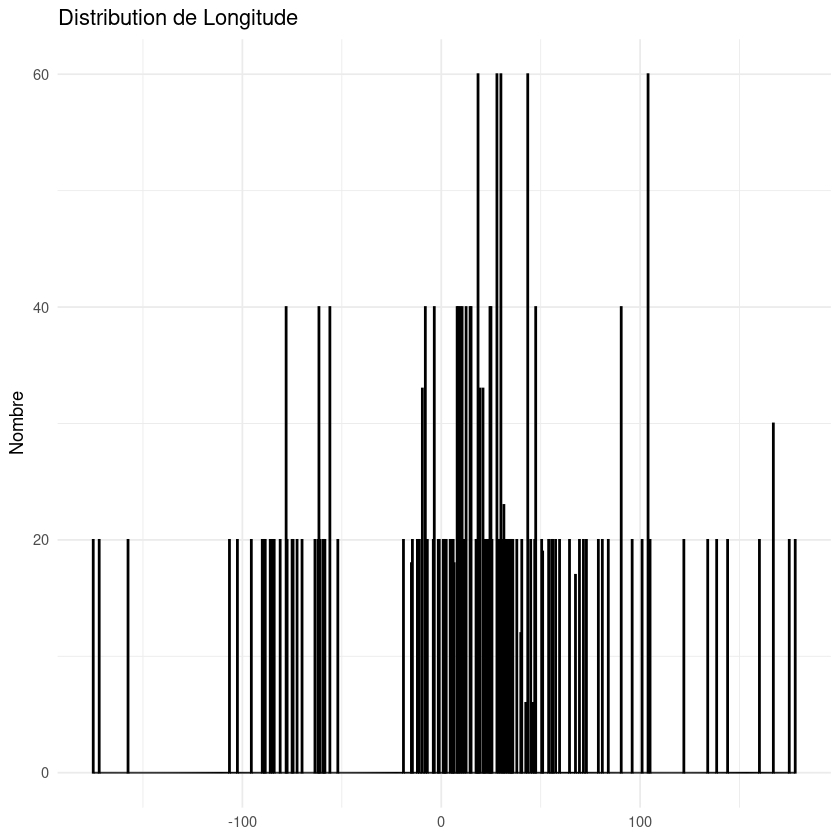

In [14]:
numeric_columns <- sapply(data, is.double)
data_numeric <- data[, numeric_columns]


for (i in seq_along(data_numeric)) {
 column <- names(data_numeric)[i]
 p <- ggplot(data, aes_string(x = column)) +
   geom_histogram(aes(y = ..count..), binwidth = 0.5, colour = "black", fill = "white") +
   labs(title = paste("Distribution de", column), x = NULL, y = "Nombre") +
   theme_minimal()
  
 print(p)
}

Nous allons développer en détail l'analyse de la distribution de certaines variables :

* Elec_access et Clean_access : La distribution observée pour ces indicateurs indique des disparités dans l'accès aux ressources énergétiques entre les différents pays au fil du temps. Le nombre important d'observations pour les pourcentages les plus élevés révèlent que de nombreux pays garantissent un accès généralisé à l'électricité et aux combustibles propres pour leur population, alors que seul un nombre limité d'observation présentent des valeurs faibles pour ces deux indicateurs. Il y'a tout de même une part non négligeable d'observation pour lequels il y a un accès aux énergies propre très faible.

* Renewable_share : Cette variable présente une concentration importante de données vers le bas de l'échelle, soulignant que dans de nombreux pays, les énergies renouvelables représentent encore une fraction minime du mix énergétique. On retrouve tout de même un certain nombre de valeurs plus élevées, ce qui illustre le développement de la part des énergies renouvelables dans certains pays.

* Energy_per_capita : La distribution de cette variable, très rapidement décroissante et avec des observations très éloignées de la plupart des observations, suggère que la majorité des pays ont une consommation d'énergie par individu relativement faible, tandis que pour un nombre restreint d'observations, probablement liées à des nations plus industrialisées, affichent des niveaux de consommation nettement plus élevés.

* PEnergy_intensity et CO2 : Ces indicateurs, par leurs distributions, indiquent les écarts en matière d'efficacité énergétique et de niveaux d'émissions de CO2 entre les pays. Une intensité énergétique élevée ou des émissions de CO2 importantes peuvent révéler une dépendance accrue aux combustibles fossiles, une utilisation de l'énergie moins efficiente, ou une consommation énergétique plus importante.

* GDP_per_capita : L'examen de cette variable fournit des indications sur le développement économique et la production des pays. Les asymétries dans cette distribution peuvent indiquer que certains pays jouissent de standards de vie élevés, tandis que d'autres sont confrontés à un niveau économique plus modeste.

Ces analyses permettent de mettre en avant des comportement importants de nos données, avec des tendances et des domaines nécessitant une exploration plus approfondie. L'examen de la distribution de ces variables peut aussi guider les stratégies pour gérer les données manquantes, pour transformer les données, ou pour sélectionner des modèles de machine learning adaptés.

Warning message:
“Removed 144 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 144 rows containing non-finite outside the scale range
(`stat_density()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 144 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 144 rows containing non-finite outside the scale range
(`stat_density()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`).”


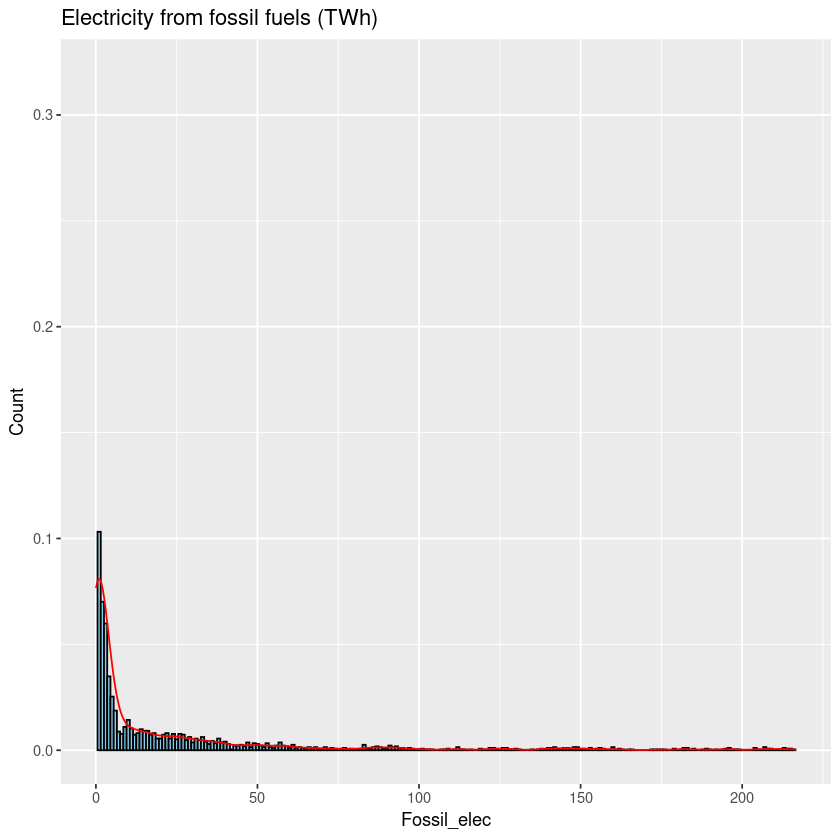

Warning message:
“Removed 144 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 144 rows containing non-finite outside the scale range
(`stat_density()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`).”


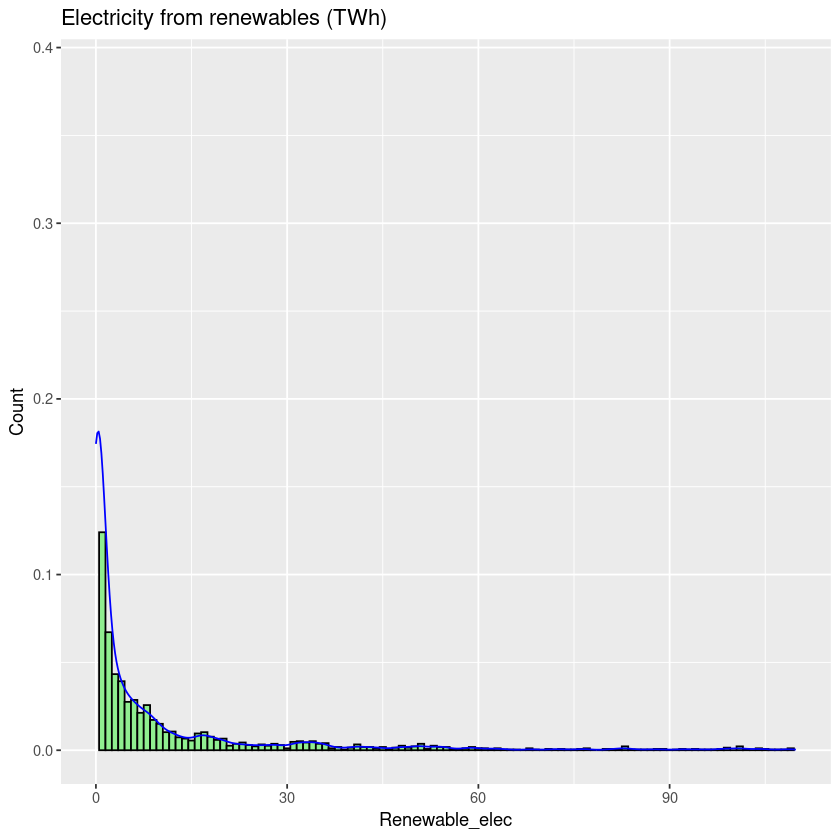

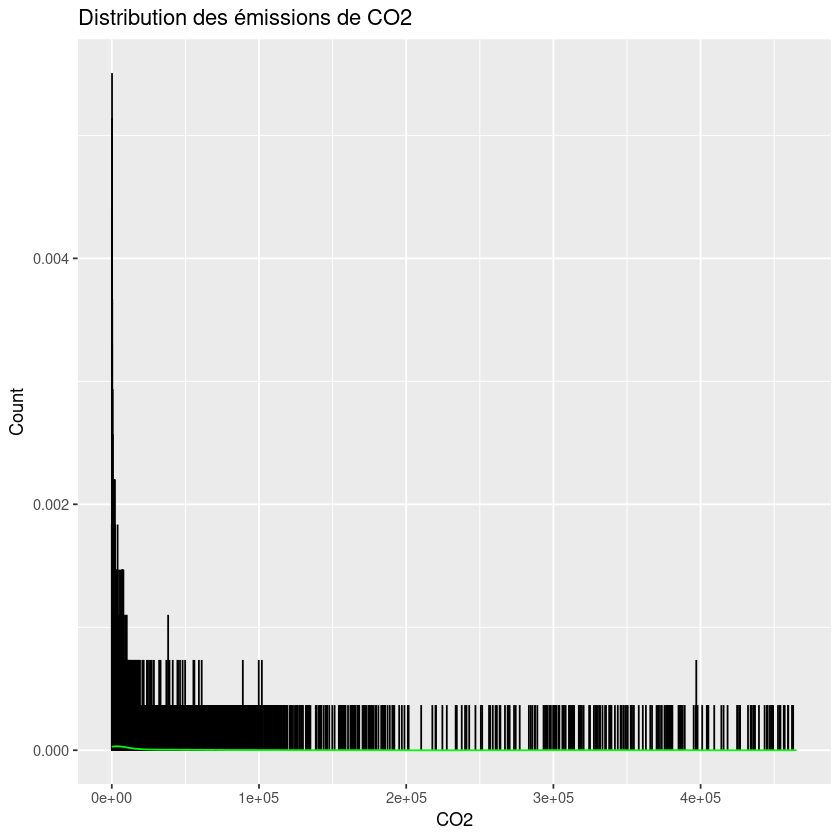

In [15]:
g1 <- ggplot(data, aes(x=Fossil_elec)) +
 geom_histogram(aes(y=..density..), binwidth=1, fill="skyblue", color="black") +
 geom_density(color="red") +
 labs(title='Electricity from fossil fuels (TWh)', x='Fossil_elec', y='Count') +
 xlim(min(data$Fossil_elec, na.rm = TRUE), quantile(data$Fossil_elec, 0.95, na.rm = TRUE))

print(g1)

g2 <- ggplot(data, aes(x=Renewable_elec)) +
 geom_histogram(aes(y=..density..), binwidth=1, fill="lightgreen", color="black") +
 geom_density(color="blue") +
 labs(title='Electricity from renewables (TWh)', x='Renewable_elec', y='Count') +
 xlim(min(data$Renewable_elec, na.rm = TRUE), quantile(data$Renewable_elec, 0.95, na.rm = TRUE))

print(g2)

g3 <- ggplot(data, aes(x=CO2)) +
 geom_histogram(aes(y=..density..), binwidth=1, fill="grey", color="black") +
 geom_density(color="green") +
 labs(title='Distribution des émissions de CO2', x='CO2', y='Count') +
 xlim(min(data$CO2, na.rm = TRUE), quantile(data$CO2, 0.95, na.rm = TRUE))

print(g3)

Les trois distributions affichées, liés respectivement à la production d'électricité à partir de combustibles fossiles, la génération d'électricité via les énergies renouvelables et les émissions de CO2, ont des profils similaires. Ainsi, ces variables ont une valeur modérée pour la plupart des observations comparée aux valeurs les plus importantes. Cela indique des écarts très important entre les pays au niveau de ces trois variables.

Ces interprétations fournissent un aperçu de la répartition globale de la production énergétique et des émissions de CO2. Elles mettent en évidence à la fois les défis persistants liés à la dépendance aux combustibles fossiles et les progrès en matière d'adoption des énergies renouvelables, ainsi que l'importante disparité des niveaux d'émissions de CO2 entre les pays.

### 1.2.2 - Transformation des variables

Nous souhaitons en général étudier des variables qui se rapprochent le plus possible d'une distribution gaussienne. Avec les observations réalisées, il semble donc judicieux de transformer certaines variables. Cela peut notamment permettre de réduire l'asymétrie et l'importance des valeurs extrèmes de certaines variables.

Pour les variables tels que Fossil_elec et CO2, avec la majorité des observations qui sont regroupées pour les valeurs les plus faibles, une transformation logarithmique semble particulièrement indiquée.

Nous allons donc appliquer cette transformation logarithmique sur les colonnes suivantes : 'Fossil_elec', 'Renewable_elec', 'Energy_per_capita' et 'CO2'.

In [16]:
data_original <- data 

columns_to_transform <- c('Fossil_elec', 'Renewable_elec', 'Energy_per_capita', 'CO2')

for (col in columns_to_transform) {
  new_col <- paste0("log_", col)
  data[[new_col]] <- log(data[[col]] + 1)
}

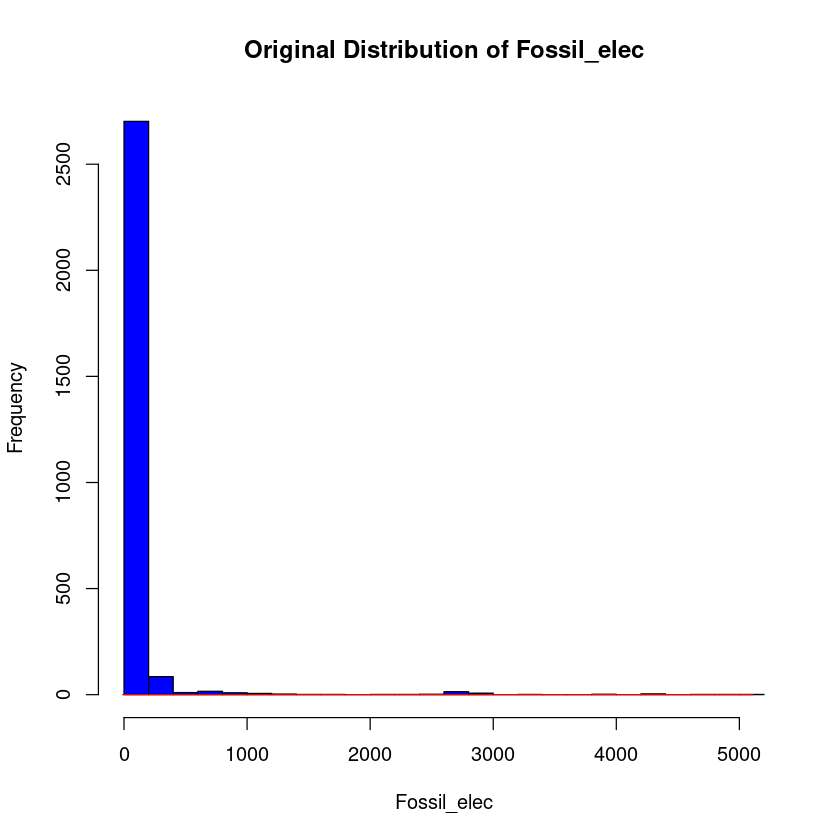

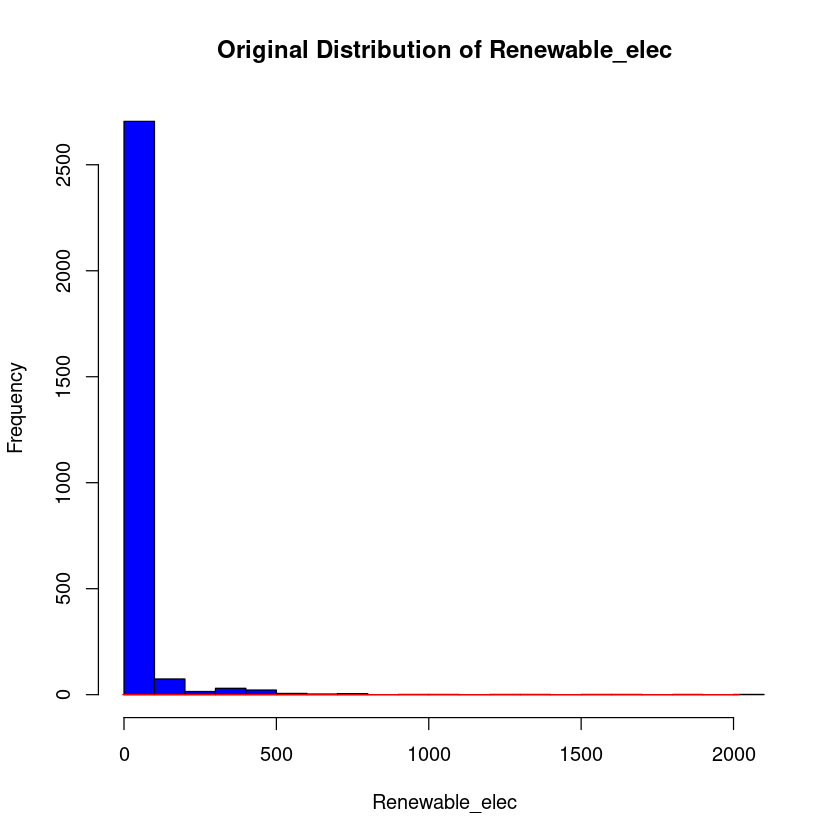

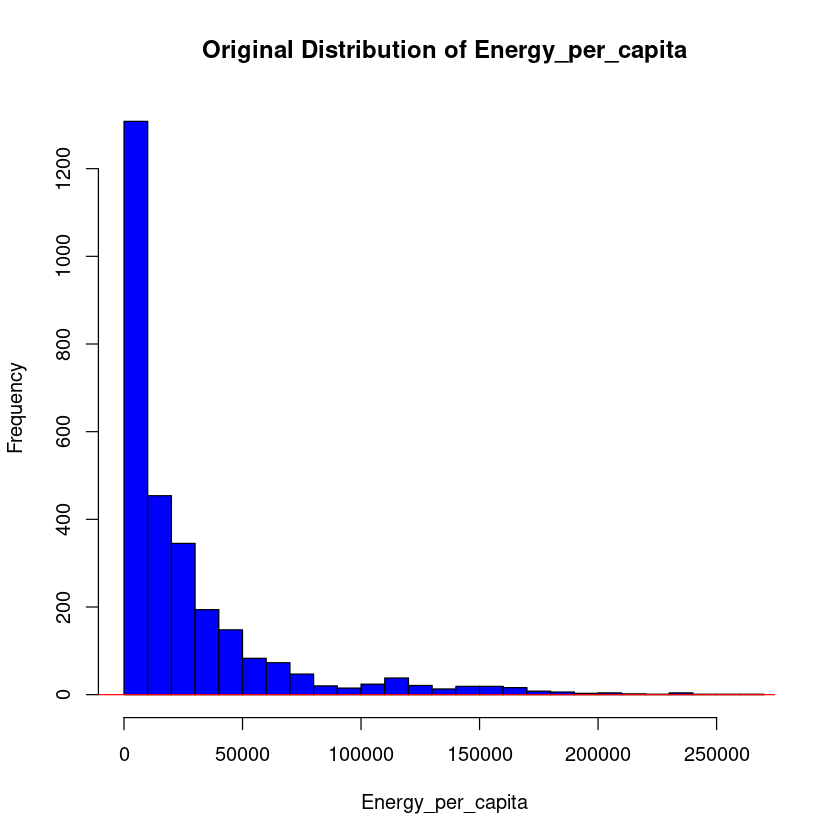

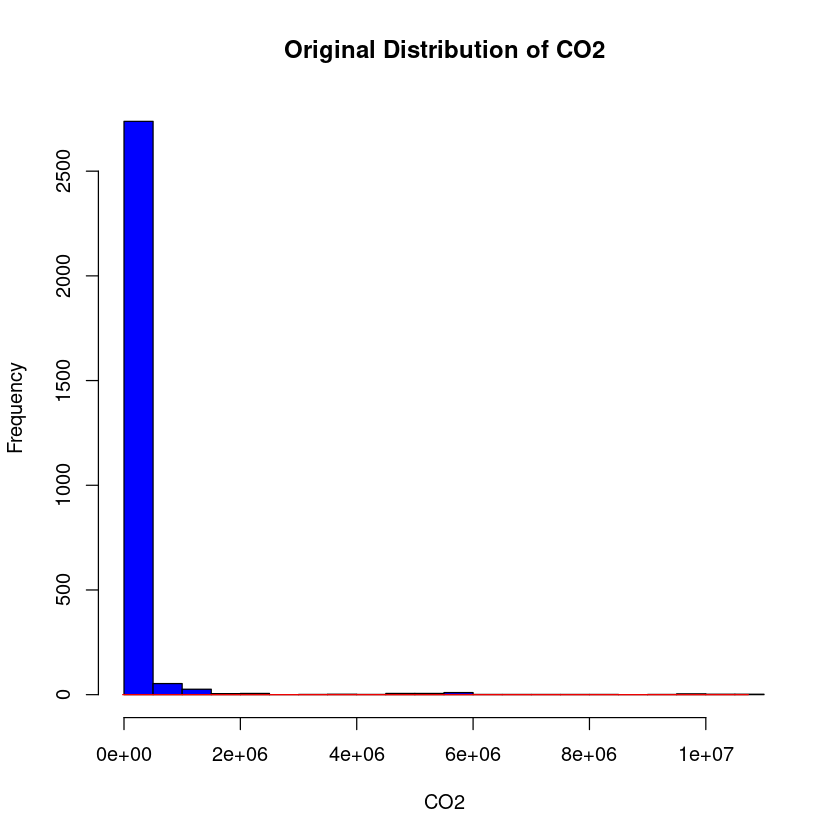

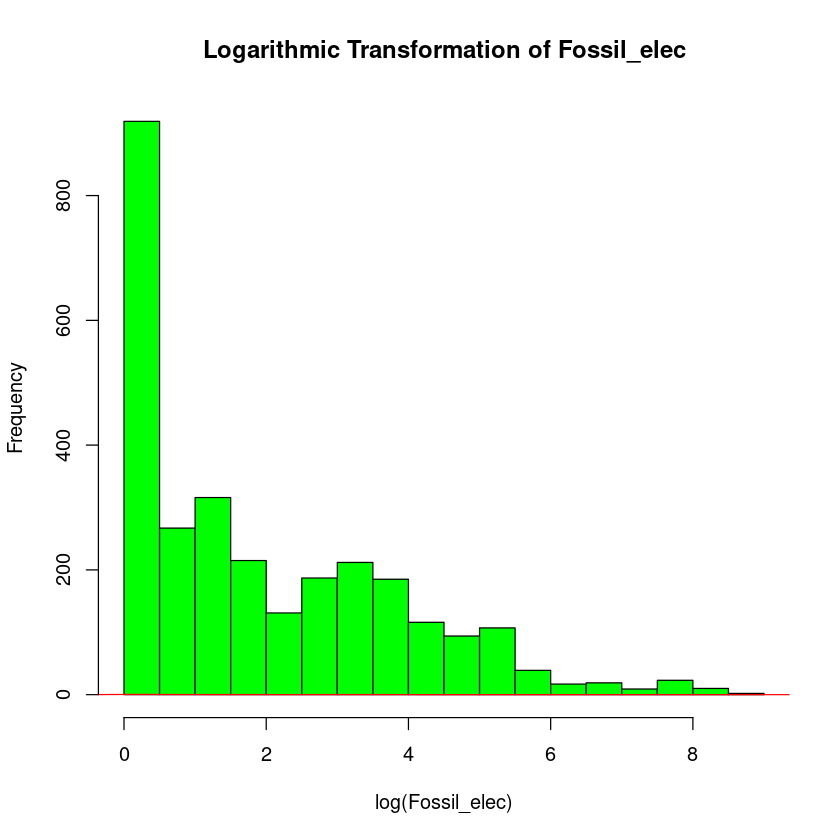

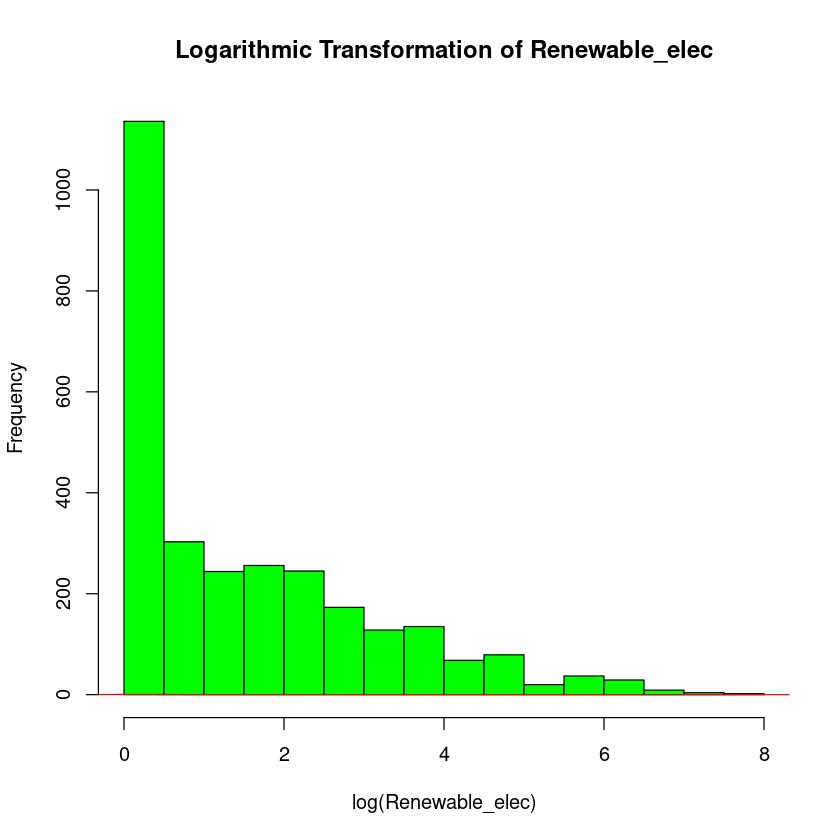

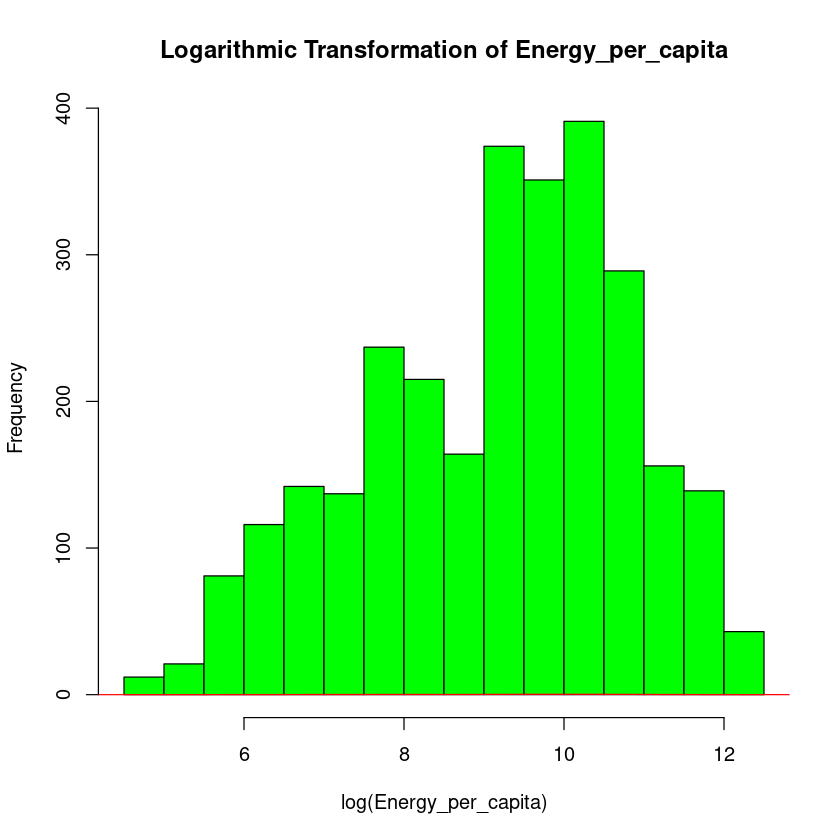

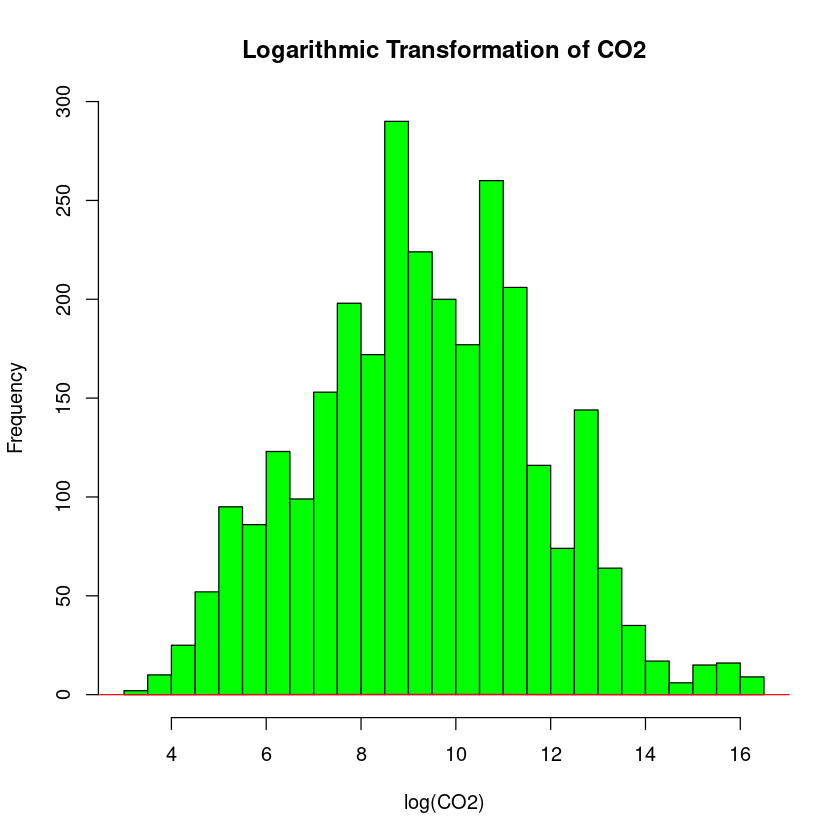

In [17]:
for (col in columns_to_transform) {
  hist(data_original[[col]], breaks = 20, col = "blue", border = "black", 
       main = paste("Original Distribution of", col), 
       xlab = col, ylab = "Frequency")
  lines(density(data_original[[col]]), col = "red")
}

for (col in columns_to_transform) {
  new_col <- paste0("log_", col)
  hist(data[[new_col]], breaks = 20, col = "green", border = "black", 
       main = paste("Logarithmic Transformation of", col), 
       xlab = paste("log(", col, ")", sep = ""), ylab = "Frequency")
  lines(density(data[[new_col]]), col = "red")
}

En transformant nos variables, on obtient des distributions beaucoup plus homogènes, avec des valeurs extrêmes moins éloignées de la majorité des données. Les transformations logarithmiques de 'Energy_per_capita' et 'CO2' en particulier, permettent d'obtenir une distribution beaucoup plus proche d'une gaussienne. Nous allons donc conserver ces transformations pour la suite.

### 1.2.3 - Etude des émissions de CO2

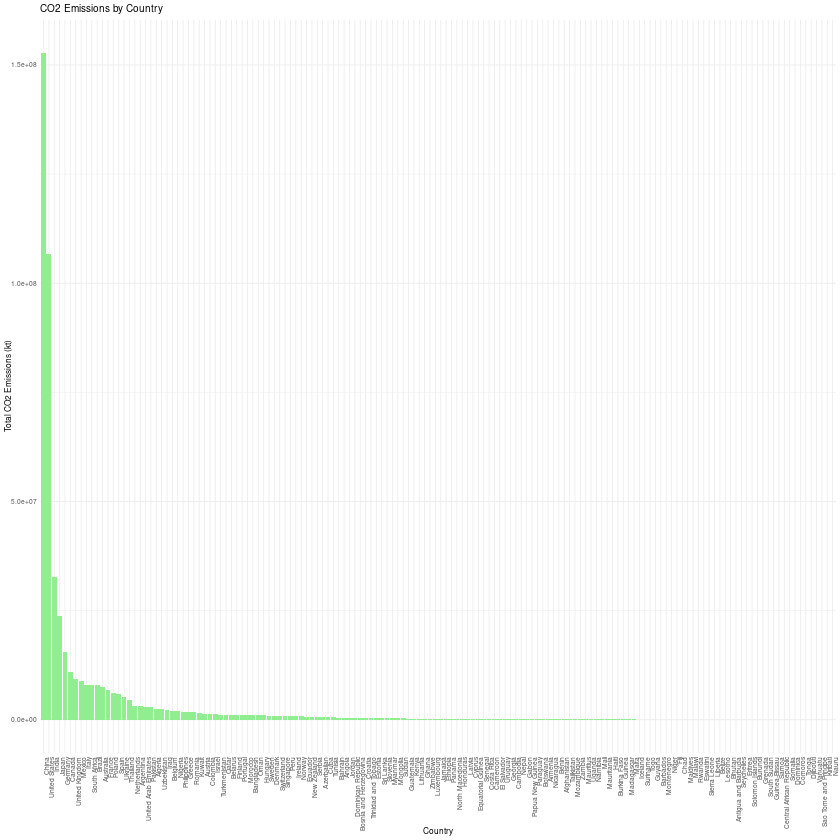

In [18]:
# Calcule des émissions de CO2 par pays
co2_emissions_by_country <- data %>%
  group_by(Entity) %>%
  summarise(Total_CO2 = sum(CO2, na.rm = TRUE)) %>%
  arrange(desc(Total_CO2))

ggplot(co2_emissions_by_country, aes(x = reorder(Entity, -Total_CO2), y = Total_CO2)) +
  geom_bar(stat = "identity", fill = "lightgreen") +
  theme_minimal(base_size = 5) +  # Pour une taille globale similaire
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "CO2 Emissions by Country",
       x = "Country",
       y = "Total CO2 Emissions (kt)")

Le graphique illustre clairement l'hétérogénéité des émissions de CO2 parmi les pays de notre jeu de données. On note une concentration très élevée des émissions pour les premiers pays et une diminution significative à mesure que l'on avance vers les pays moins émetteurs. Cette distribution montre que quelques pays sont responsables d'une part disproportionnée des émissions globales de CO2, tandis que de nombreux autres pays contribuent relativement peu à ce total.

Aussi, on constante que certains pays ont une valeur d'émissions en CO2 nulle. Afin de pouvoir effectuer des calculs de ratio par exemple, on distinguera dans certains cas les 148 pays aux émissions non nulles et l'ensemble des 176 pays de notre jeu de données.

In [19]:
# Filtrage des pays avec des émissions de CO2 supérieures à 0
co2_emissions_filtered <- co2_emissions_by_country %>%
  filter(Total_CO2 > 0)


max_emissions <- max(co2_emissions_filtered$Total_CO2)
min_emissions <- min(co2_emissions_filtered$Total_CO2)


emissions_ratio <- max_emissions / min_emissions

print(paste("Ratio entre le pays le plus émetteur et le pays le moins émetteur :", emissions_ratio))


[1] "Ratio entre le pays le plus émetteur et le pays le moins émetteur : 288175.190683644"


Le ratio des émissions totales de CO2 entre le pays le plus émetteur (Chine) et le pays le moins émetteur (Kyrgyzstan) est d'environ 288 175, mettant en évidence une différence extrême dans les contributions aux émissions globales de CO2. Cela souligne la concentration très élevée des émissions parmi un petit nombre de pays.

Nous rappelons que pour ce calcul, nous avons sélectionné le pays avec la plus petite valeur d'émission de CO2, mais non nulle, parmis les 176 pays.

In [20]:
# Filtrage des pays avec des émissions de CO2 supérieures à 0 et tri par ordre croissant
sorted_emissions <- co2_emissions_by_country %>%
  filter(Total_CO2 > 0) %>%
  arrange(Total_CO2)


total_co2_emissions <- sum(sorted_emissions$Total_CO2)


cumulative_emissions <- 0
countries_count <- 0


for (emissions in sorted_emissions$Total_CO2) {
  cumulative_emissions <- cumulative_emissions + emissions
  countries_count <- countries_count + 1
  if (cumulative_emissions / total_co2_emissions > 0.1) {
    countries_count <- countries_count - 1  
    break
  }
}

nbr_country <- nrow(sorted_emissions)

cat("Nombre total de pays aux émissions non nulles :", nbr_country, "\n\n")
cat("En classant les pays du moins émetteur au plus émetteur\n")
cat("Nombre de pays dont la somme des émissions cumulées représente moins de 10% des émissions totales :", countries_count)

Nombre total de pays aux émissions non nulles : 148 

En classant les pays du moins émetteur au plus émetteur
Nombre de pays dont la somme des émissions cumulées représente moins de 10% des émissions totales : 125

Nous rappelons que sur la liste des 176 pays de notre jeu de données, 148 pays ont des émissions de CO2 non nulles. Ce sont ces 148 pays que nous étudions dans cette partie.

On classe les 148 pays du moins émetteur en CO2 au plus émetteur. Si on somme les émissions des 125 pays les moins émetteurs de CO2, ces émissions ne dépassent pas 10% des émissions totales à l'échelle mondiale. On en déduit que 90% des émissions en CO2 proviennent des 23 pays les plus émetteurs à l'échelle mondiale.

Si on ramène cela à l'ensemble des pays de notre jeu de données, on obtient que les 147 pays les moins polluants rejettent moins de 10% des émissions de CO2 mondiales.

Nous allons maintenant étudier les 5 pays les plus émetteurs.

# A tibble: 5 × 2
  Entity         Total_CO2
  <fct>              <dbl>
1 China         152732849.
2 United States 106590771.
3 India          32679580.
4 Japan          23674690.
5 Germany        15472890.


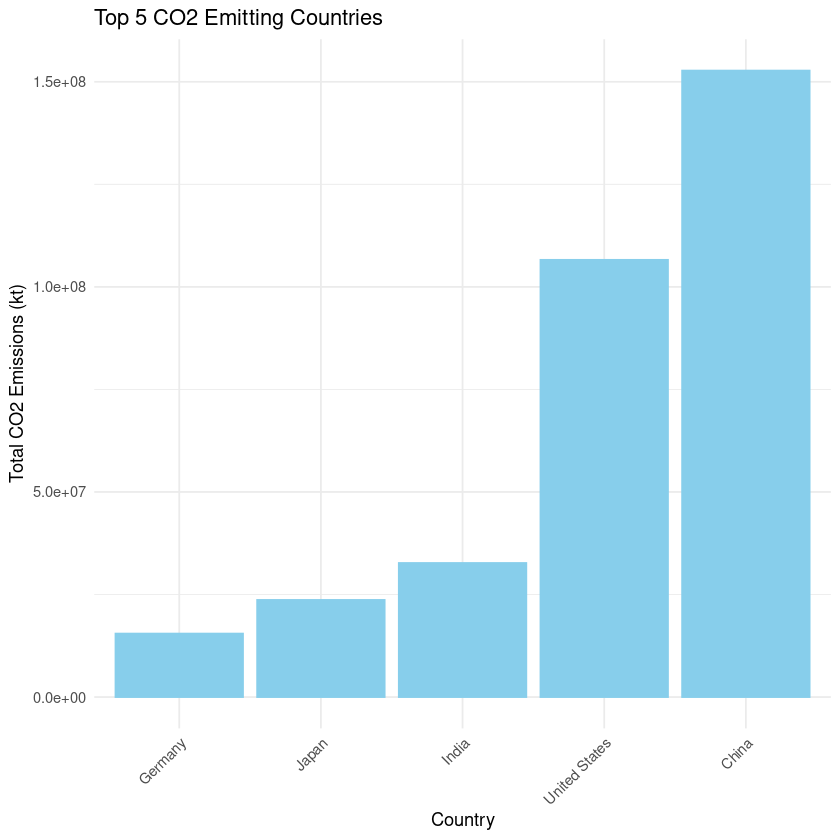

In [21]:
co2_emissions_by_country <- data %>%
  group_by(Entity) %>%
  summarise(Total_CO2 = sum(CO2, na.rm = TRUE)) %>%
  arrange(desc(Total_CO2))

# Sélection des 5 pays les plus émetteurs de CO2
top_5_co2_emitters <- head(co2_emissions_by_country, 5)

ggplot(top_5_co2_emitters, aes(x = reorder(Entity, Total_CO2), y = Total_CO2, fill = Entity)) +
  geom_bar(stat = "identity", color = "skyblue", fill = "skyblue") +
  theme_minimal() +
  labs(title = "Top 5 CO2 Emitting Countries", x = "Country", y = "Total CO2 Emissions (kt)") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

print(top_5_co2_emitters)

In [22]:
# Calcul de la somme des émissions des 5 pays les plus émetteurs
sum_top_5_co2_emitters <- sum(top_5_co2_emitters$Total_CO2)

cat("Somme des émissions des 5 pays les plus émetteurs :", sum_top_5_co2_emitters, "\n\n")

# pourcentage que représente la somme des émissions des 5 pays les plus émetteurs par rapport aux émissions totales
total_co2_emissions <- sum(co2_emissions_by_country$Total_CO2)
percentage_top_5_co2_emitters <- (sum_top_5_co2_emitters / total_co2_emissions) * 100

cat("Pourcentage des émissions des 5 pays les plus polluants :", percentage_top_5_co2_emitters, "%")

Somme des émissions des 5 pays les plus émetteurs : 331150780 

Pourcentage des émissions des 5 pays les plus polluants : 68.39547 %

La visualisation montre clairement l'hétérogénéité des émissions de CO2 entre les pays, avec les 5 pays les plus émetteurs de CO2 étant :

* Chine avec environ 152 732 800 kt de CO2 émis.
* États-Unis avec environ 106 590 800 kt de CO2 émis.
* Inde avec environ 32 679 580 kt de CO2 émis.
* Japon avec environ 23 674 690 kt de CO2 émis.
* Allemagne avec environ 15 472 890 kt de CO2 émis.

Ces résultats mettent en évidence la grande disparité des contributions aux émissions de CO2 à l'échelle mondiale, avec la Chine et les États-Unis se distinguant nettement comme les plus grands émetteurs. Au total, les émissions des 5 pays les plus polluants représentent 331 150 779 kt de CO2 émis, c'est à dire 68% des émissions totales.

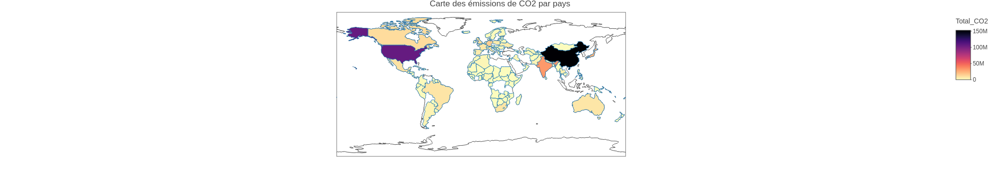

In [23]:
# Carte des émissions de CO2 par pays
co2_emissions_by_country <- data %>%
  group_by(Entity, Area, Density) %>%
  summarise(Total_CO2 = sum(CO2, na.rm = TRUE), .groups = "drop") %>%
  arrange(Entity)

fig <- plot_ly(data = co2_emissions_by_country, type = "choropleth", locations = ~Entity, locationmode = "country names", z = ~Total_CO2,
               text = ~paste("Pays: ", Entity, "<br>CO2 émis: ", Total_CO2),
               colors = viridis(100, direction = -1, option ="A")) %>%
  layout(title = "Carte des émissions de CO2 par pays", geo = list(showcountries = TRUE, countrycolor = "rgb(255, 255, 255)"))

fig

On veut maintenant ramener ces chiffres par rapport à la surface et à la densité de population par pays


In [24]:
df_chn <- filter(data, Entity == 'China')
df_usa <- filter(data, Entity == 'United States')
df_ind <- filter(data, Entity == 'India')
df_jpn <- filter(data, Entity == 'Japan')
df_ger <- filter(data, Entity == 'Germany')

# Chine
df_chn$Density <- as.numeric(as.character(df_chn$Density))
df_chn$Area <- as.numeric(as.character(df_chn$Area))

# États-Unis
df_usa$Density <- as.numeric(as.character(df_usa$Density))
df_usa$Area <- as.numeric(as.character(df_usa$Area))

# Inde
df_ind$Density <- as.numeric(as.character(df_ind$Density))
df_ind$Area <- as.numeric(as.character(df_ind$Area))

# Japon
df_jpn$Density <- as.numeric(as.character(df_jpn$Density))
df_jpn$Area <- as.numeric(as.character(df_jpn$Area))

# Allemagne
df_ger$Density <- as.numeric(as.character(df_ger$Density))
df_ger$Area <- as.numeric(as.character(df_ger$Area))


co2_chn <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'China']/(df_chn$Density[1]*df_chn$Area[1])
co2_usa <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'United States']/(df_usa$Density[1]*df_usa$Area[1])
co2_ind <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'India']/(df_ind$Density[1]*df_ind$Area[1])
co2_jpn <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'Japan']/(df_jpn$Density[1]*df_jpn$Area[1])
co2_ger <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'Germany']/(df_ger$Density[1]*df_ger$Area[1])


cat("Emissions par habitant en Chine :", co2_chn, "\n")
cat("Emissions par habitant aux Etats-Unis :", co2_usa, "\n")
cat("Emissions par habitant en Inde :", co2_ind, "\n")
cat("Emissions par habitant au Japon :", co2_jpn, "\n")
cat("Emissions par habitant en Allemagne :", co2_ger, "\n")

Emissions par habitant en Chine : 0.1040177 
Emissions par habitant aux Etats-Unis : 0.3010982 
Emissions par habitant en Inde : 0.02142516 
Emissions par habitant au Japon : 0.1805208 
Emissions par habitant en Allemagne : 0.1805782 


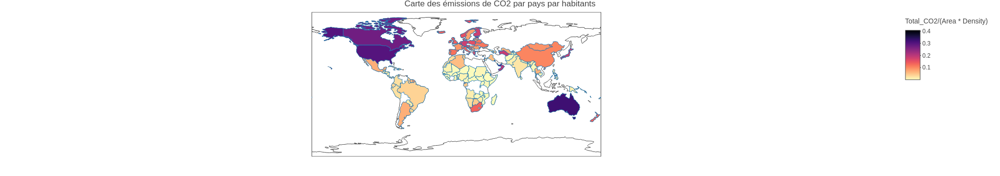

In [25]:
co2_emissions_by_country <- data %>%
  group_by(Entity, Area, Density) %>%
  summarise(Total_CO2 = sum(CO2, na.rm = TRUE), .groups = "drop") %>%
  arrange(Entity)

fig <- plot_ly(data = co2_emissions_by_country, type = "choropleth", locations = ~Entity, locationmode = "country names", z = ~Total_CO2/(Area*Density),
               text = ~paste("Pays: ", Entity, "<br>CO2 émis: ", Total_CO2),
               colors = viridis(100, direction = -1, option ="A")) %>%
  layout(title = "Carte des émissions de CO2 par pays par habitants", geo = list(showcountries = TRUE, countrycolor = "rgb(255, 255, 255)"))

fig


On observe que, parmis les 5 pays les plus polluants, le classement est remanié une fois les émissions ramenées à la population. Les Etats-Unis sont le pays avec les émissions par habitant les plus importantes. A l'inverse, l'Inde présente une population très importante, ce qui en fait un pays très polluant. Cependant, ses habitants ont des émissions 15 fois moins importantes que les Américains.

Sur la deuxième carte mondiale, on observe que les Etats-Unis, le Canada et l'Australie se distinguent nettement en terme d'émissions de CO2 par habitant. Comme nous avons vu dans les calculs de la cellule précédente, l'Inde a une valeur d'émissions de CO2 par habitant moins importante. Cela peut s'expliquer par le mode de vie moins polluant de sa population. Cependant, compte tenu de sa densité très importante, cela fait de l'Inde un pays polluant. Enfin, bien que l'Allemagne soit un petit pays en terme de superficie et avec une densité raisonnable, l'utilisation d'énergies fossiles dans son mix énergétique et son industrie en fait un pays polluants en terme d'émissions de CO2 par habitant.

## 1.3 - Analyse descriptive multidimensionnelle des données

### 1.3.1 - Première visualisation globale

Nous allons maintenant procéder à une étude multidimentionnelle de notre jeu de données : nous allons essayer de comprendre les liens entre les différentes variables étudiées.

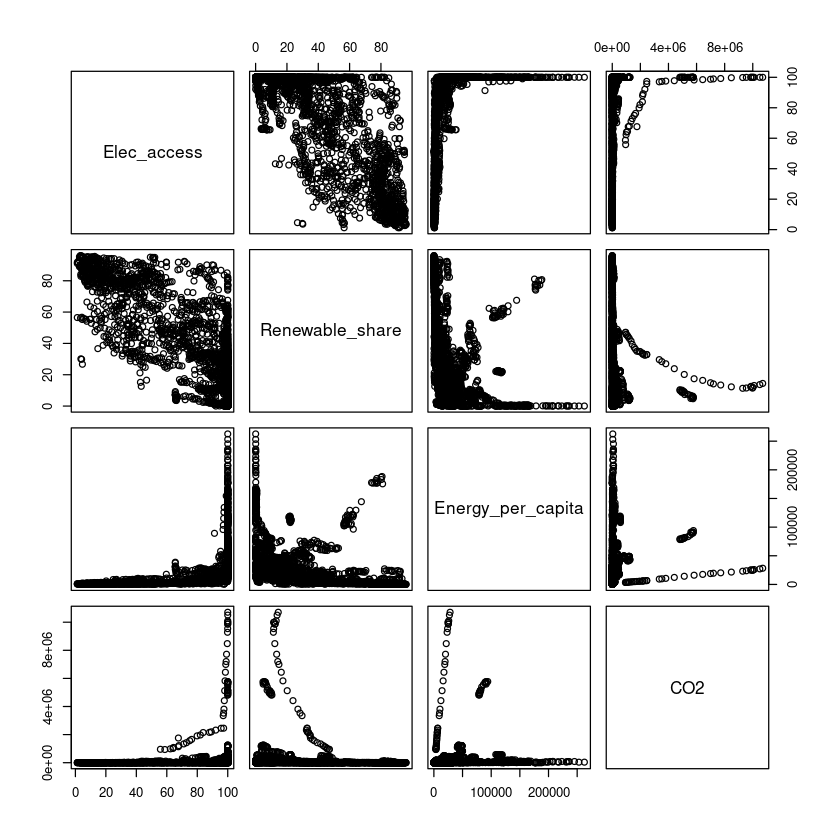

In [26]:
variables_to_analyze <- data %>%
  select(Elec_access, Renewable_share, Energy_per_capita, CO2)

pairs(variables_to_analyze)

Les graphiques de dispersion analysés révèlent les dynamiques entre quatre variables importantes de notre ensemble de données : l'accès à l'électricité, la proportion d'énergie renouvelable dans la consommation énergétique finale, la consommation d'énergie primaire par individu, et les émissions de CO2 totales par pays.

* Elec_access en fonction des autres indicateurs : Une corrélation semble se dessiner, montrant une hausse des émissions de CO2 et de la consommation d'énergie primaire par personne à mesure que l'accès à l'électricité augmente. Cela peut suggérer que les pays plus avancées, bénéficiant d'un accès important à l'électricité, affichent également une consommation énergétique et des émissions de CO2 plus élevées.

* Influence de l'énergie renouvelable sur les émissions de CO2 : Aucune corrélation évidente n'émerge de l'analyse visuelle. Il apparaît que la contribution des énergies renouvelables à la consommation énergétique totale n'est pas directement liée aux émissions de CO2 à l'échelle nationale. Cette observation suggère l'impact potentiel plus important d'autres variables, comme l'efficacité de l'utilisation énergétique, la diversité des sources d'énergie, ou encore l'ampleur de l'activité économique, sur les émissions de CO2.

* Energy_per_capita et CO2 : Une corrélation positive est observée, indiquant que les pays où la consommation d'énergie primaire par personne est plus importante affichent généralement des niveaux d'émissions de CO2 supérieurs. Cette relation est attendue et peut refléter qu'une intensité économique accrue et une consommation énergétique importante de la population est liée à des émissions de CO2 importantes.

Ces interprétations mettent en lumière les interactions entre développement énergétique, utilisation de sources renouvelables, et impact environnemental à travers les émissions de CO2. Elles soulignent l'importance d'approfondir l'analyse pour comprendre les multiples facteurs influençant ces relations afin de mieux comprendre les liens entre les variables étudiées et les émissions de CO2.

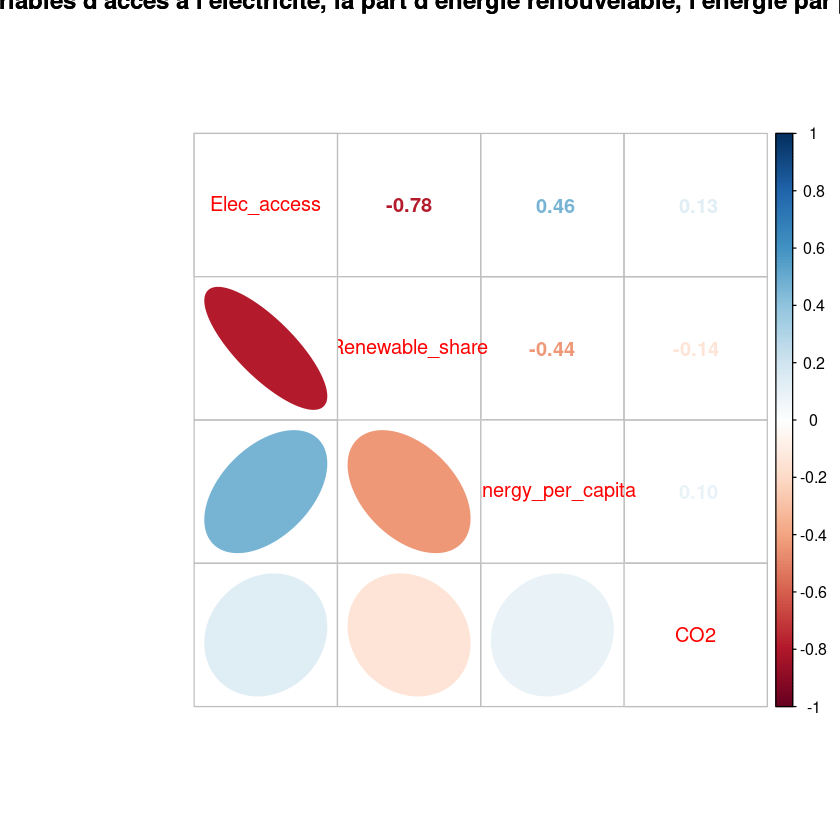

In [27]:
correlation_matrix = cor(variables_to_analyze)

#corrplot(correlation_matrix, method='number', type='upper',title = "Matrice de corrélation entre les variables d'accès à l'électricité, la part d'énergie renouvelable, l'énergie par personne et les émissions de CO2")
corrplot.mixed(correlation_matrix, lower='ellipse', upper='number',title = "Matrice de corrélation entre les variables d'accès à l'électricité, la part d'énergie renouvelable, l'énergie par personne et les émissions de CO2")

La matrice de corrélation ci-dessus montre les coefficients de corrélation entre les variables.

* Accès à l'électricité : Cette variable ne montre pas de corrélation imporrtante avec les émissions de CO2, ce qui suggère que l'accès universel à l'électricité peut être atteint indépendamment des niveaux d'émissions de CO2. Il y'a en revanche une corrélation négative entre l'accès à l'électricité et la part d'électricité renouvelable, ce qui indique qu'en général les pays ayant une part importante d'électricité renouvelable ont du mal à répondre aux besoins en électricité de leur population.

* Part de l'énergie renouvelable : La corrélation entre la part de l'énergie renouvelable dans la consommation finale d'énergie et les émissions de CO2 est faible, indiquant que l'augmentation de la part des énergies renouvelables n'est pas directement liée à une réduction des émissions de CO2 au niveau des données analysées. Cela pourrait refléter le fait que d'autres facteurs, tels que l'efficacité énergétique et le mix énergétique global, affectent également les émissions.

* Consommation d'énergie primaire par habitant : Encore une fois il y'a peu de corrélation entre cette variable et la variable CO2, ce qui indique que ce n'est pas un facteur essentiel pour prédire les émissions de CO2.

* CO2 : Comme observé précédemment, la corrélation entre les émissions de CO2 et les autres variables observées sont faibles, ce qui indique qu'elles sont loin d'être suffisantes pour prédire les émissions de CO2 d'un pays. En revanche, le sens des corrélations est cohérent : un accès à l'électricité et consommation d'électricité importante par personne indiquent des émissions plus importantes, tandis qu'une part d'électricité renouvelable semble plutôt lié à des émissions plus faibles. 


Nous allons vérifier cette hypothèse en étudiant les corrélations entre d'autres variables.

### 1.3.2 - Etude de la corrélation entre les énergies fossiles et les émissions de CO2

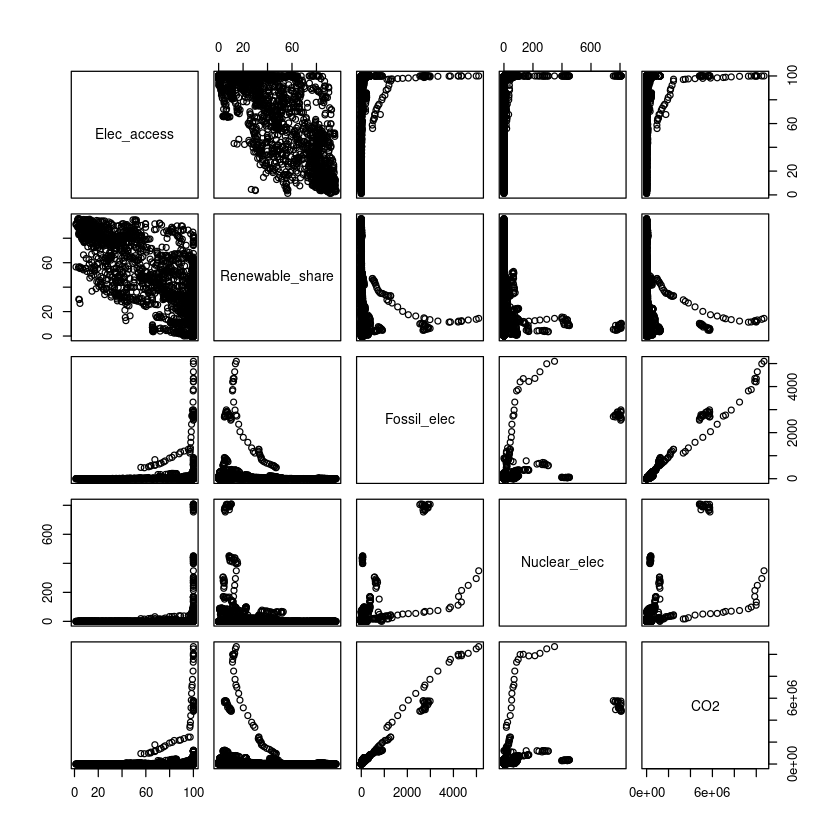

In [28]:
# Sélection de quelques variables clés pour l'analyse
variables_to_analyze_2 <- data %>%
  select(Elec_access, Renewable_share, Fossil_elec, Nuclear_elec, CO2)

pairs(variables_to_analyze_2)

Ces observations mettent en évidence les interrelations complexes entre l'accès à l'électricité, les choix énergétiques des pays, et leurs impacts sur les émissions de CO2. Une stratégie globale pour réduire les émissions de CO2 devra probablement prendre en compte ces différents aspects pour être efficace.

* Accès à l'électricité : Les pays bénéficiant d'un accès élargi à l'électricité affichent souvent une consommation accrue d'énergie, notamment d'origine fossile et nucléaire, accompagnée de niveaux supérieurs d'émissions de CO2. Cette tendance souligne la corrélation entre le développement économique et l'intensification de la consommation énergétique.

* Influence des énergies renouvelables : La proportion des énergies renouvelables dans le mix énergétique varie considérablement d'un pays à l'autre, sans montrer de corrélation directe avec la consommation d'énergies fossiles ou nucléaires ni avec les émissions de CO2. Cela suggère que les pays déploient des stratégies énergétiques variées, reflétant peut-être des priorités ou des contraintes environnementales et économiques différentes.

* Production d'électricité à partir de combustibles fossiles : Une corrélation positive assez nette est observée entre la production d'électricité issue de combustibles fossiles et les niveaux d'émissions de CO2. Cet état de fait est logique, la combustion de combustibles fossiles étant une importante source d'émissions de CO2.

* Production d'électricité nucléaire : Bien que certains pays disposent d'une capacité notable de production d'électricité nucléaire, cette dernière ne paraît pas liée de manière directe à une réduction ou une augmentation des émissions de CO2. L'énergie nucléaire, ne générant pas de CO2 lors de la production d'électricité, les variations observées dans les émissions des pays pourraient être attribuées à d'autres aspects de leur mix énergétique ou de leur activité économique.


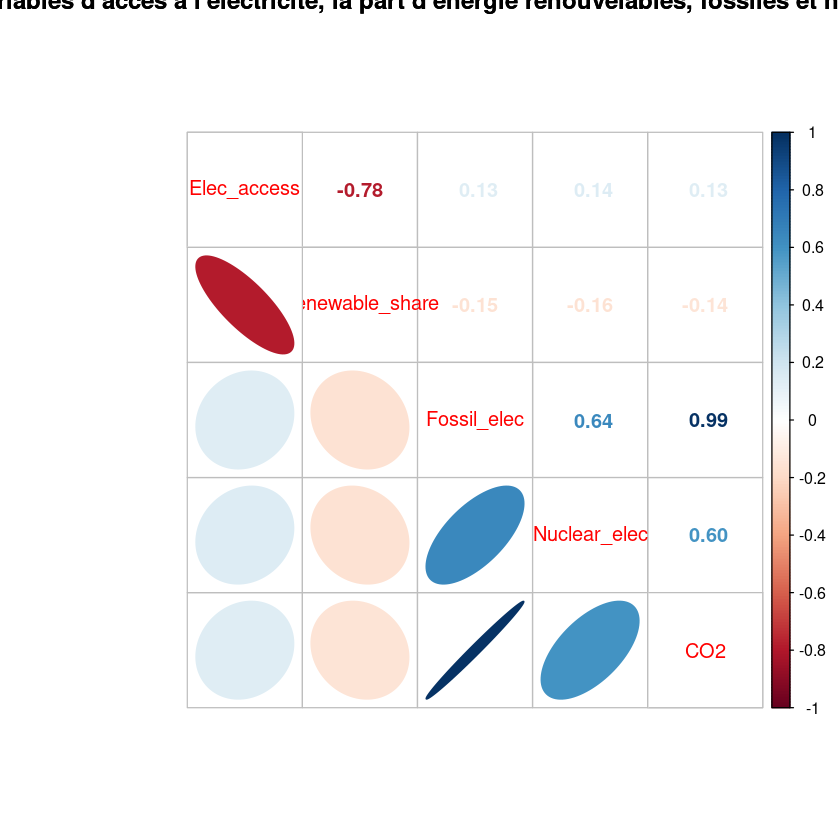

In [29]:
correlation_matrix = cor(variables_to_analyze_2)

#corrplot(correlation_matrix, method='number', type='upper',title = "Matrice de corrélation entre les variables d'accès à l'électricité, la part d'énergie renouvelables, fossiles et nucléaires et les émissions de CO2 ")
corrplot.mixed(correlation_matrix, lower='ellipse', upper='number',,title = "Matrice de corrélation entre les variables d'accès à l'électricité, la part d'énergie renouvelables, fossiles et nucléaires et les émissions de CO2 ")

La matrice de corrélation montre les relations entre l'accès à l'électricité, la part des énergies renouvelables, et l'utilisation d'énergie fossile et nucléaire avec les émissions de CO2. On observe : 

* Relation entre l'accès à l'électricité et les énergies renouvelables : La corrélation négative prononcée, déjà observée précedemment, indique que les pays ayant un accès généralisé à l'électricité tendent à présenter une part moindre d'énergies renouvelables dans leur mix énergétique. Cette observation suggère que les nations largement électrifiées pourraient s'appuyer davantage sur des sources d'énergie non renouvelables.

* Lien entre la consommation d'énergie fossile et les émissions de CO2 : La corrélation très importante (0.99) révèle que l'augmentation de la consommation d'énergie fossile est directement liée à une hausse des émissions de CO2. Cette forte corrélation souligne le rôle critique de l'énergie fossile dans le bilan carbone, indépendamment des autres composantes du mix énergétique.

* Corrélation entre l'électricité nucléaire et les émissions de CO2 : La corrélation significative entre ces deux variables suggère que les pays produisant beaucoup d'électricité nucléaire émettent également beaucoup de CO2. Bien que le nucléaire soit une source d'électricité peu émettrice, cette corrélation peut s'expliquer par le niveau technologique nécessaire pour pouvoir mettre en place des centrales nucléaires, qui nécessitent donc des moyens financiers importants et une industrie développée.

Cette matrice des corrélations souligne le rôle majeur et prépondérant des combustibles fossiles dans les émissions de CO2. Cela suggère que les politiques en faveur des énergies renouvelables pourraient ne pas avoir un impact immédiat sur les émissions de CO2 sans autres changements dans le mix énergétique et l'efficacité énergétique. Pour la suite de l'étude, cette variable semble être prépondérente pour la prédiction de la variable CO2 du fait de la corrélation très forte entre ces deux variables.

De plus, cette analyse confirme les hypothèses émises dans la première visualisation globale.

### 1.3.3 - Etude de l'influence économique et démographique

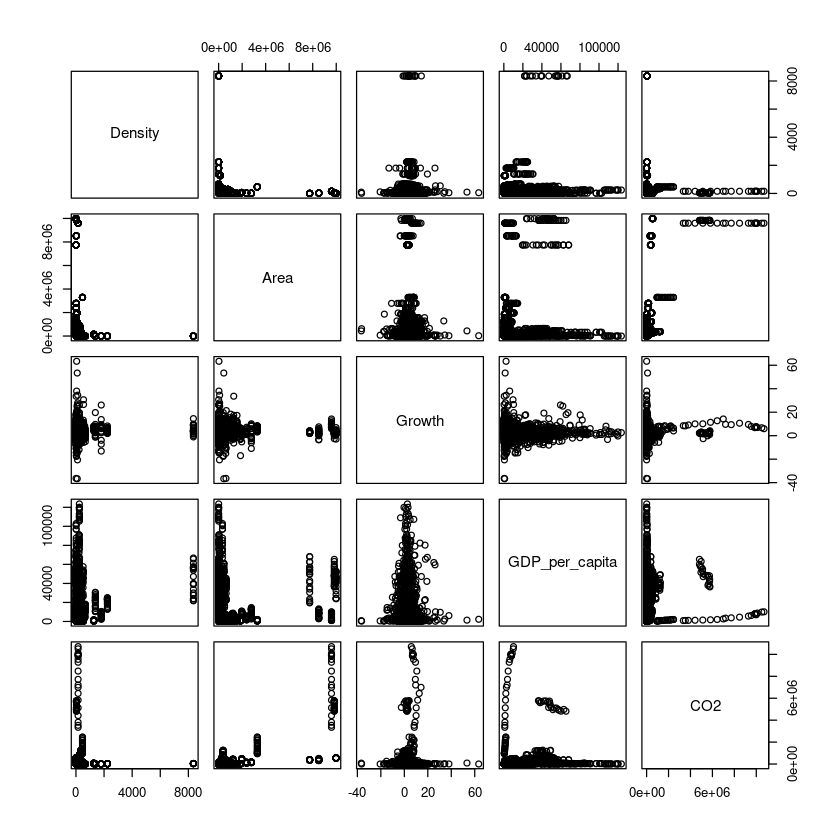

In [30]:
# Sélection de quelques variables clés pour l'analyse
variables_to_analyze_3 <- data %>%
  select(Density,Area,Growth,GDP_per_capita,CO2)

pairs(variables_to_analyze_3)

Interprétation : 

* Densité de population (Density) : Il n'y a pas de tendance claire indiquant une relation directe entre la densité de population et les autres variables. Il y a cependant quelques valeurs extrêmes, ce qui indique que certains pays ou régions ont des densités de population très élevées. Ces valeurs extrêmes semblent avoir une superficie et des émissions de CO2 faible, ce qui correspond au profil de micro-état constitués presque uniquement d'une unique ville.

* Superficie (Area) : La superficie ne semble pas être directement liée à la croissance économique (Growth), au PIB par habitant (GDP_per_capita), ou aux émissions de CO2. Les données semblent être assez dispersées, ce qui suggère que la taille d'un pays n'est pas un facteur déterminant pour ces indicateurs.

* Croissance économique (Growth) : La croissance économique présente une variabilité importante parmi les pays, sans une relation évidente avec le PIB par habitant ou les émissions de CO2. 

* PIB par habitant (GDP_per_capita) : Le PIB par habitant montre un certain regroupement vers les valeurs inférieures, avec quelques valeurs extrêmes indiquant que certains pays ont un PIB par habitant beaucoup plus élevé. Il y a également une dispersion des points lorsque le PIB par habitant est comparé aux émissions de CO2, suggérant que la richesse d'un pays ne se traduit pas toujours par des émissions de CO2 proportionnellement plus élevées.

* Émissions de CO2 (CO2) : Les émissions de CO2 sont concentrées vers les valeurs inférieures avec quelques valeurs extrêmes, indiquant que quelques pays sont responsables d'une part disproportionnée des émissions globales de CO2. Il n'y a pas de relation claire et linéaire visible entre les émissions de CO2 et les autres variables dans ces scatter plots.

En conclusion, ces visualisations illustrent les relations entre les indicateurs démographiques, économiques et environnementaux. Les données suggèrent que des facteurs autres que la densité de population, la taille du pays, et la richesse économique influencent les émissions de CO2. Ces résultats peuvent servir de point de départ pour des analyses statistiques plus poussées et la modélisation prédictive.

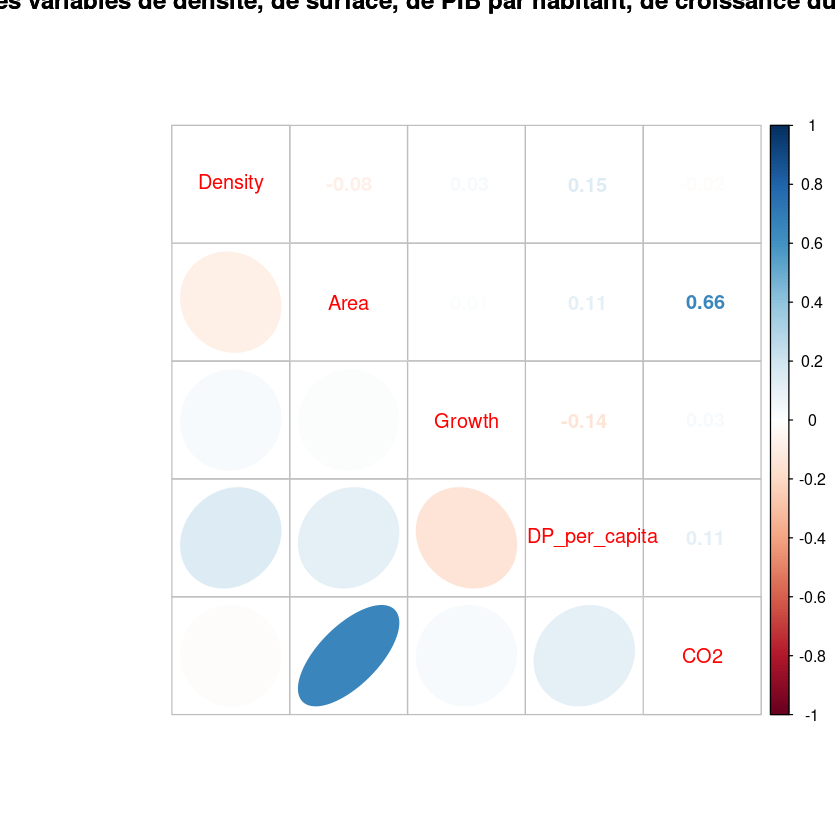

In [31]:
correlation_matrix = cor(variables_to_analyze_3)

#corrplot(correlation_matrix, method='number', type='upper',title = "Matrice de corrélation entre les variables de densité, de surface, de PIB par habitant, de croissance du PIB et les émissions de CO2 ")
corrplot.mixed(correlation_matrix, lower='ellipse', upper='number',title = "Matrice de corrélation entre les variables de densité, de surface, de PIB par habitant, de croissance du PIB et les émissions de CO2 ")


La matrice de corrélation indique les relations entre la densité de population, la superficie du pays, le PIB par habitant, la croissance du PIB et les émissions de CO2 :

* Densité vs. Superficie : Une corrélation négative (-0.15) suggère que les pays de plus grande superficie ont tendance à avoir une densité de population plus faible, ce qui est cohérent.

* Densité vs. Émissions de CO2 : Une corrélation très faible (0.04) indique qu'il n'y a pas de lien direct entre la densité de la population et les émissions de CO2.

* Superficie vs. Émissions de CO2 : Une corrélation modérée (0.66) suggère que les pays avec de plus grandes superficies ont tendance à avoir des émissions de CO2 plus élevées, ce qui pourrait refléter une activité économique et industrielle plus importante, ou une population plus importante et donc des émissions plus élevées.

* Croissance du PIB vs. PIB par habitant : Une corrélation négative (-0.14) montre qu'une croissance économique plus élevée n'est pas nécessairement associée à un PIB par habitant plus élevé, ce qui peut se produire dans les économies en développement.

* PIB par habitant vs. Émissions de CO2 : Une corrélation positive faible (0.11) indique que les pays plus riches pourraient avoir légèrement plus d'émissions de CO2, mais la relation n'est pas forte, ce qui implique que la richesse n'est pas un prédicteur direct des émissions de CO2.

* Superficie vs. PIB par habitant : Une corrélation positive faible (0.11) indique que les pays plus grands ont tendance à avoir un PIB par habitant légèrement plus élevé.

En résumé, cette matrice montre que si certaines variables ont une relation modérée, beaucoup n'ont qu'une faible ou pas de corrélation directe. Cela suggère que des facteurs supplémentaires pourraient influencer ces relations et confirme les observations précédentes.

## 1.4 - Analyse en Composantes Principales (ACP)

Dans cette partie, nous allons procéder à une Analyse en Composantes Principales (ACP). L'objectif de cette méthode est de synthétiser les variables du jeu de données initial en un nombre limité de composantes principales, tout en conservant un maximun d'informations sur la variabilité des variables. Initialement, nous avons 18 variables après traitement, qui correspondent aux 18 caractéristiques. Nous allons étudier s'il est possible de réduire cette dimension, tout en conservant un maximum d'information.

### 1.4.1 - Reformatage des données

In [32]:
data_quanti <- data[,3:18]
head(data_quanti)

,Elec_access,Clean_access,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,Low_carb_elec,Energy_per_capita,PEnergy_intensity,CO2,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
4,14.73851,9.50,36.66,0.31,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,20.06497,10.90,44.24,0.33,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,25.39089,12.20,33.88,0.34,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995
7,30.71869,13.85,31.89,0.20,0,0.64,76.19048,304.4209,1.50,1760,5.357403,263.7336,60,652230,33.93911,67.70995
8,36.05101,15.30,28.78,0.20,0,0.75,78.94737,354.2799,1.53,1770,13.826320,359.6932,60,652230,33.93911,67.70995
9,42.40000,16.70,21.17,0.19,0,0.54,73.97260,607.8335,1.94,3560,3.924984,364.6635,60,652230,33.93911,67.70995


L'ACP est sensible à la variabilité des données. Si les variables sont mesurées dans des unités différentes ou ont des variances différentes, celles avec une plus grande variance ou des unités plus grandes pourraient dominer les premières composantes principales. En centrant et réduisant, chaque variable contribue également à l'analyse sans être influencée par l'échelle de mesure. Nous décidons donc de centrer et réduire nos données avant de réaliser notre ACP.

In [33]:
data_quanti_scaled <- scale(data_quanti)

data_quanti_scaled <- as.data.frame(data_quanti_scaled)
colnames(data_quanti_scaled) <- colnames(data_quanti)

head(data_quanti_scaled)

,Elec_access,Clean_access,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,Low_carb_elec,Energy_per_capita,PEnergy_intensity,CO2,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,-1.962723,-1.342305,0.02857477,-0.2040051,-0.1946913,-0.2412979,0.7950071,-0.6968803,-1.1231884,-0.2048827,1.062712614,-0.6612948,-0.2265952,-0.003481871,0.6338505,0.8359896
5,-1.793684,-1.306625,0.28103946,-0.2039517,-0.1946913,-0.2419482,0.6760129,-0.6975741,-1.1790947,-0.2051150,-0.534097141,-0.6601898,-0.2265952,-0.003481871,0.6338505,0.8359896
6,-1.624663,-1.273495,-0.06401782,-0.2039250,-0.1946913,-0.2416695,0.6910908,-0.6962846,-1.1203931,-0.2044793,1.578777364,-0.6585534,-0.2265952,-0.003481871,0.6338505,0.8359896
7,-1.455582,-1.231444,-0.13029813,-0.2042989,-0.1946913,-0.2412050,1.0611289,-0.6948734,-1.0952353,-0.2042226,0.314722045,-0.6573948,-0.2265952,-0.003481871,0.6338505,0.8359896
8,-1.286358,-1.194491,-0.23388193,-0.2042989,-0.1946913,-0.2401831,1.1411435,-0.6935294,-1.0868493,-0.2042104,2.137714332,-0.6522716,-0.2265952,-0.003481871,0.6338505,0.8359896
9,-1.084869,-1.158812,-0.48734583,-0.2043256,-0.1946913,-0.2421340,0.9967585,-0.6866946,-0.9722414,-0.2020222,0.006383943,-0.6520062,-0.2265952,-0.003481871,0.6338505,0.8359896


### 1.4.2 - Analyse en composantes principales (ACP)

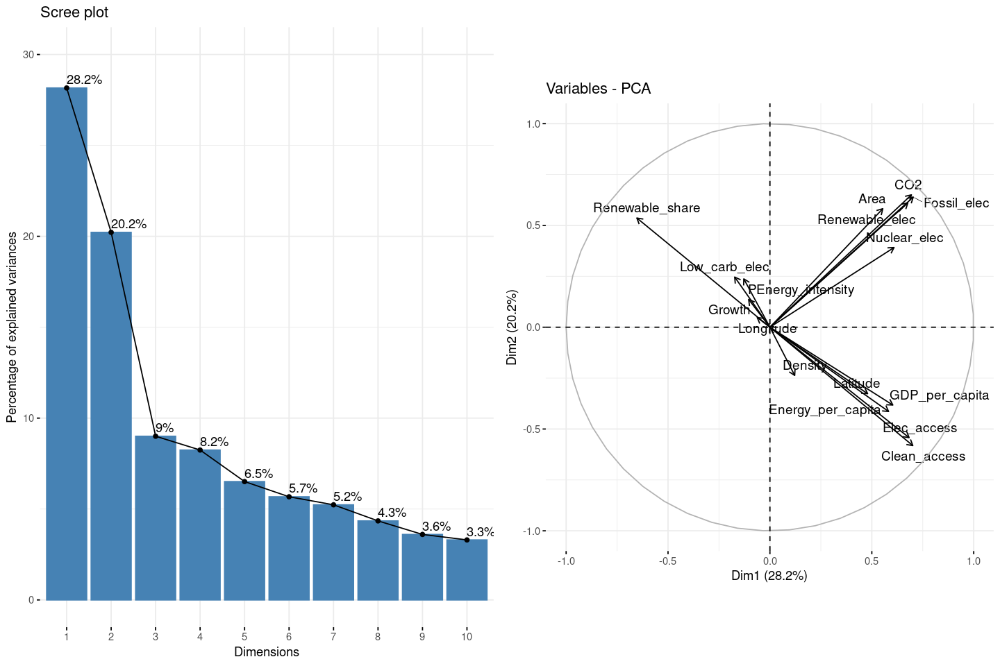

In [34]:
options(repr.plot.width = 12, repr.plot.height = 8)

pca = PCA(data_quanti_scaled, ncp=10, scale.unit = TRUE, graph=FALSE)

p1 <- fviz_eig(pca, addlabels = TRUE, ylim = c(0, 30))
p2 <- fviz_pca_var(pca, axes = c(1,2), repel = TRUE)

grid.arrange(p1, p2, ncol = 2)

`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


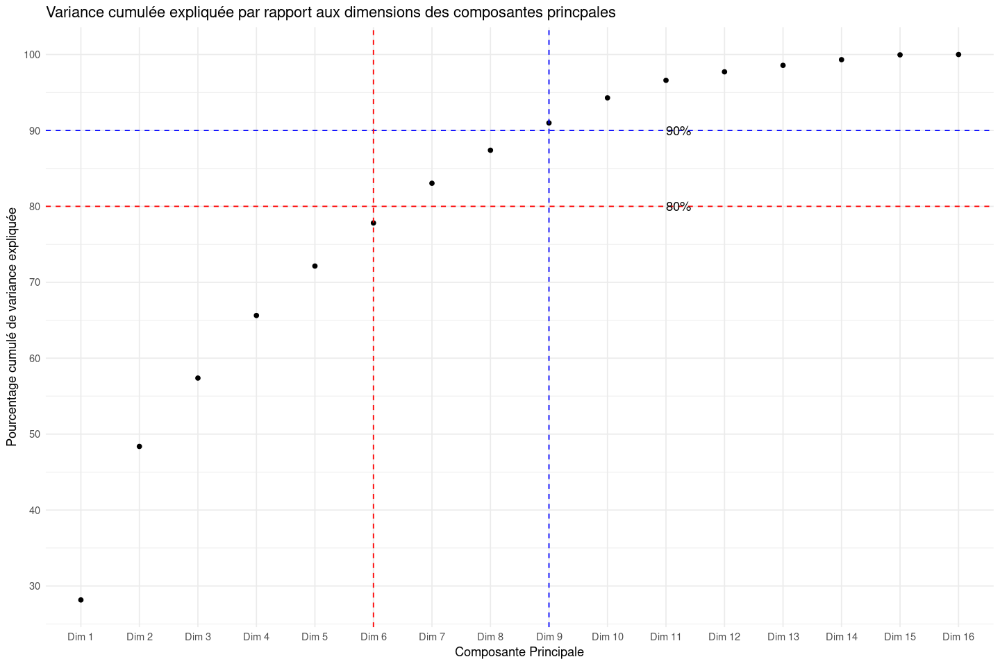

In [35]:
variance_expliquee <- pca$eig[, 2] / sum(pca$eig[, 2]) * 100

variance_cumulee <- cumsum(variance_expliquee)

data_variance <- data.frame(Composante = 1:length(variance_expliquee),
                            VarianceCumulee = variance_cumulee)

data_variance$Composante <- factor(data_variance$Composante, labels = paste0("Dim ", 1:16))


ggplot(data_variance, aes(x = Composante, y = VarianceCumulee)) +
  geom_line() +
  geom_point() +
  scale_y_continuous(breaks = seq(0, 100, by = 10)) +  
  geom_hline(yintercept = 80, linetype = "dashed", color = "red") + 
  geom_hline(yintercept = 90, linetype = "dashed", color = "blue") +  
  geom_vline(xintercept = 6, linetype = "dashed", color = "red") + 
  geom_vline(xintercept = 9, linetype = "dashed", color = "blue") + 
  theme_minimal() +
  labs(x = "Composante Principale", 
       y = "Pourcentage cumulé de variance expliquée",
       title = "Variance cumulée expliquée par rapport aux dimensions des composantes princpales") +
  annotate("text", x = 11, y = 80, label = "80%", hjust = 0) +  
  annotate("text", x = 11, y = 90, label = "90%", hjust = 0)    



Interprétation :

Dans un premier temps, le tableau nous présente la varianxce expliquée pour chaque dimension, ainsi que le pourcentage que cela représente. La dernière colonne nous donne les pourcentages de variances cumulées. En général, on peut se satisfaire de dimension représentant 80% de la variance cumulée. Ici, cela reviendrait à garder 7 composantes principales. Si on souhaite plus de précision, avec 90% de la variance cumulée, on peut alors garder 9 composantes principales. Cependant, on observe que les 2 premières composantes portent beaucoup d'information (48% de la variance cumulée), cela montre que ces 2 composantes portent à elles-seules la moitié de information.

Le graphique nous permet de vérifier ces observations. On remarque qu'à partir d'un certain seuil (environ 90%), il faut rajouter beaucoup de composantes dans l'ACP pour gagner de l'information sur la variance cumulée.

On décide dans un premier temps de conserver les 7 premières composantes principales, pour suivre les recommendations du cours.

### 1.4.3 - Etude des composantes principales

Nous allons construire un nouveau dataframe avec les 7 premiers composantes de l'ACP. Comme présenté ci-dessus, cela nous permeter d'expliquer 80% de la variance.

In [36]:
n_composantes <- ncol(pca$ind$coord)
print(n_composantes)

[1] 10


In [37]:
# Transformation des scores des composantes principales en dataframe
data_pca <- data.frame(
  Dim1 = pca$ind$coord[, 1],
  Dim2 = pca$ind$coord[, 2],
  Dim3 = pca$ind$coord[, 3],
  Dim4 = pca$ind$coord[, 4],
  Dim5 = pca$ind$coord[, 5],
  Dim6 = pca$ind$coord[, 6],
  Dim7 = pca$ind$coord[, 7]
)

head(data_pca)

,Dim1,Dim2,Dim3,Dim4,Dim5,Dim6,Dim7
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,-1.674838,1.0415826,0.34892774,-0.03560378,0.1447499,1.7530359,-0.4729369
5,-1.594912,0.9091384,-0.27064961,0.04304158,-0.6046642,0.9395275,-1.3744605
6,-1.530935,0.9143973,0.52029031,-0.19442418,0.4649081,2.0100332,-0.1718999
7,-1.410927,0.7876868,-0.08356876,0.07653518,-0.1269664,1.4810126,-0.8179300
8,-1.406894,0.8431969,0.55847473,-0.04139189,0.7466212,2.4720790,0.2309349
9,-1.140616,0.5273682,-0.19344220,-0.04803884,-0.1075834,1.2294525,-0.9665445


In [38]:
eigenvalues <- pca$eig[1:7, "eigenvalue"]
percent_variance <- round(pca$eig[1:7, "percentage of variance"], 0) 

cum_percent_variance <- round(cumsum(percent_variance), 0) 

df_pca_results <- data.frame(
  Dimension = paste0("Dim", 1:7),
  `Variance expliquée` = eigenvalues,
  `Pourcentage variance expliquée` = percent_variance,
  `Pourcentage cum var expliquée` = cum_percent_variance
)

df_pca_results

,Dimension,Variance.expliquée,Pourcentage.variance.expliquée,Pourcentage.cum.var.expliquée
,<chr>,<dbl>,<dbl>,<dbl>
comp 1,Dim1,4.5054860,28,28
comp 2,Dim2,3.2349523,20,48
comp 3,Dim3,1.4406705,9,57
comp 4,Dim4,1.3191535,8,65
comp 5,Dim5,1.0416087,7,72
comp 6,Dim6,0.9078723,6,78
comp 7,Dim7,0.8371229,5,83


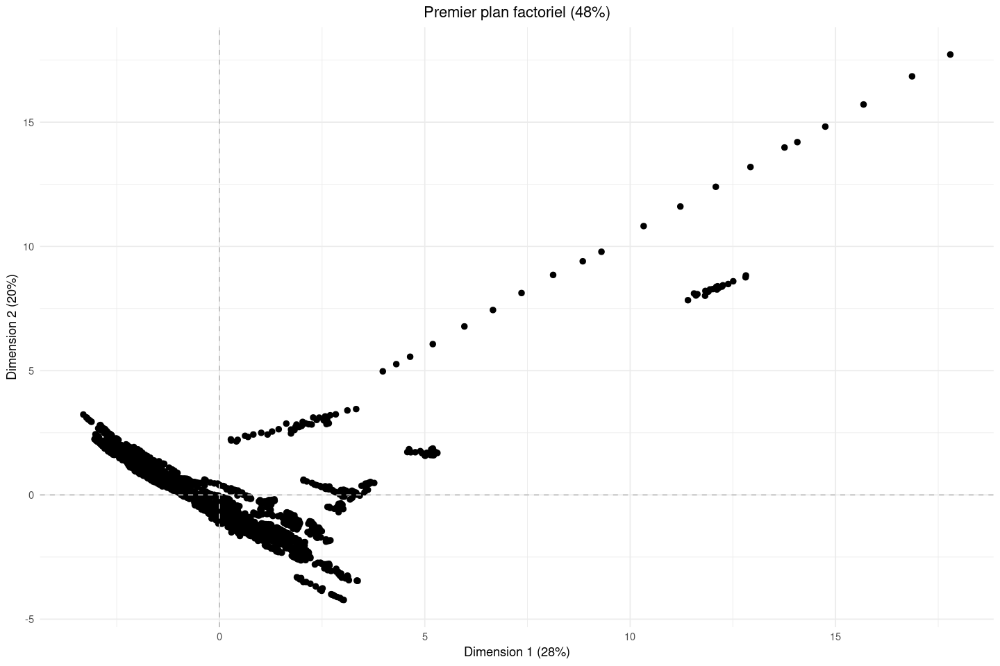

In [39]:
# Affichage de la répartition des données en fonction des 2 premières dimensions
ggplot(data_pca, aes(x = Dim1, y = Dim2)) + 
  geom_point(size = 2) +  
  xlab("Dimension 1 (28%)") +  
  ylab("Dimension 2 (20%)") +  
  ggtitle("Premier plan factoriel (48%)") +  
  theme_minimal() +  
  theme(plot.title = element_text(hjust = 0.5)) +  
  geom_hline(yintercept = 0, color = "grey", linetype = "dashed") +
  geom_vline(xintercept = 0, color = "grey", linetype = "dashed") 

On représente ici la projection de nos observations dans le plan factoriel formé par nos deux premières composantes principales. On remarque un grand groupe de point autour de l'origine, qui semble représenter la grande majorité des données. On observe égaement un certain nombre de points éloignés de ce groupe, qui sont donc plutôt des outliers. Ces points semblent toujours former des lignes d'une vingtaine de point, qui pourrait être les observations pour un même pays.

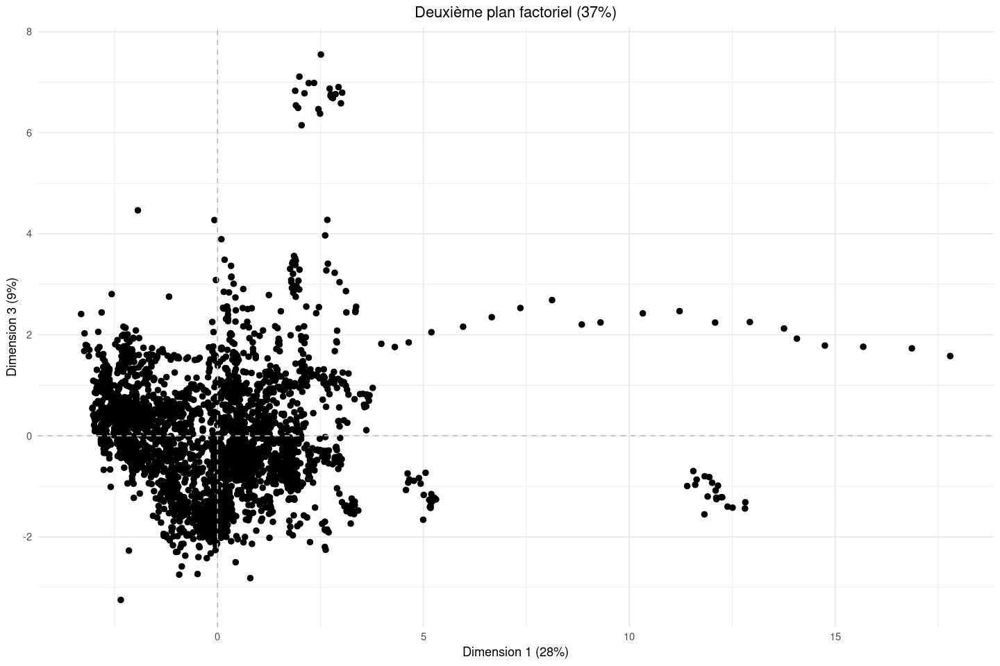

In [40]:
# Affichage de la répartition des données en fonction des dimensions 1 et 3
ggplot(data_pca, aes(x = Dim1, y = Dim3)) +
  geom_point(size = 2) +  
  xlab("Dimension 1 (28%)") +
  ylab("Dimension 3 (9%)") +  
  ggtitle("Deuxième plan factoriel (37%)") +  
  theme_minimal() +  
  theme(plot.title = element_text(hjust = 0.5)) + 
  geom_hline(yintercept = 0, color = "grey", linetype = "dashed") +
  geom_vline(xintercept = 0, color = "grey", linetype = "dashed") 

Dans la continuité du raisonnement conduit sur le premier plan factoriel, nous allons analyser celui entre la première dimension et la troisème dimension de l'ACP. La plupart des observations sont concentrées vers le centre du graphique, suggérant que pour ces deux composantes, beaucoup d'observations ont des scores similaires. Certains points forment également des groupes éloignés du groupement principal, ce qui peut indiquer des profils spécifiques ou des outliers.

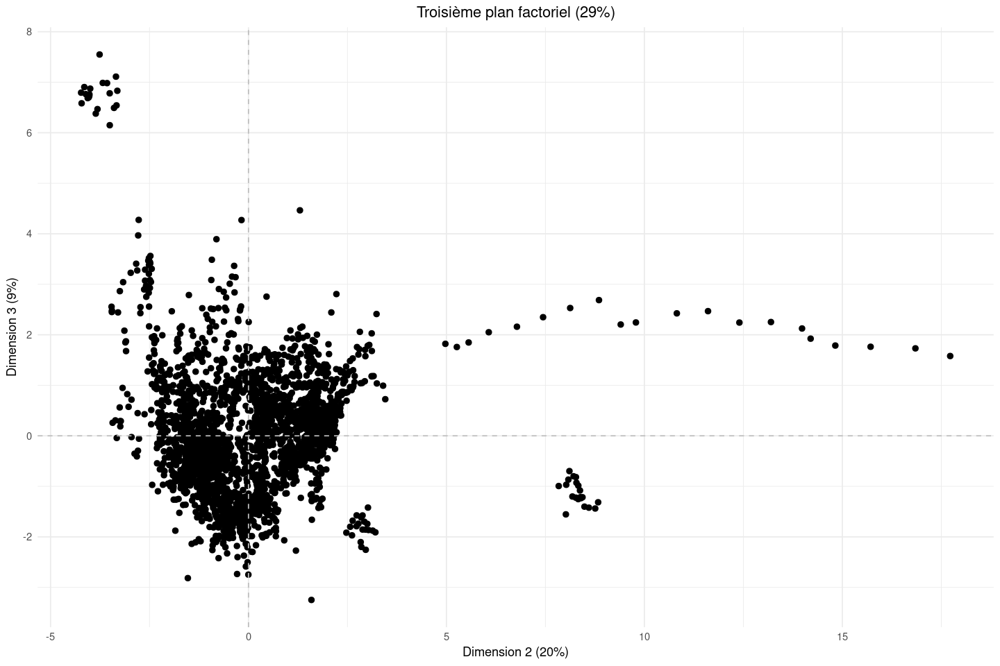

In [41]:
# Affichage de la répartition des données en fonction des dimensions 2 et 3
ggplot(data_pca, aes(x = Dim2, y = Dim3)) +
  geom_point(size = 2) +  
  xlab("Dimension 2 (20%)") +  
  ylab("Dimension 3 (9%)") +  
  ggtitle("Troisième plan factoriel (29%)") +  
  theme_minimal() + 
  theme(plot.title = element_text(hjust = 0.5)) + 
  geom_hline(yintercept = 0, color = "grey", linetype = "dashed") +
  geom_vline(xintercept = 0, color = "grey", linetype = "dashed")

Le profil est assez similaire que pour le plan factoriel précédent, avec des groupements à peu près similaires. Cela signifie que les observations ayant des valeurs spécifiques selon la dimension 3 ont à peu près les mêmes valeurs pour les dimensions 1 et 2. Le reste des analyses est similaire par rapport au plan factoriel précédent.

### 1.4.4 - Etude des chargements

Pour déterminer quelles variables contribuent le plus à chaque composante principale dans une Analyse en Composantes Principales (ACP), nous pouvons examiner les "chargements" des composantes. Les chargements sont des coefficients qui indiquent comment chaque variable est représentée sur chacune des composantes principales.

* Les valeurs sont différentes par rapport au code python lorsque j'utilise PCA() mais cela fonctionne avec l'utilisation de la fonction prcomp() pour faire l'ACP

In [42]:
pca <- prcomp(data_quanti_scaled, scale. = TRUE)

loadings <- pca$rotation
loadings_df <- as.data.frame(loadings)


rownames(loadings_df) <- colnames(data_quanti_scaled)
loadings_df <- loadings_df[, 1:7]

loadings_df$PC3 <- loadings_df$PC3 * -1
loadings_df$PC4 <- loadings_df$PC4 * -1
loadings_df$PC6 <- loadings_df$PC6 * -1


loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Elec_access,0.32169844,-0.30148963,0.14232124,-0.1057922872,0.139282900,-0.094532099,0.06422833
Clean_access,0.33034097,-0.32330257,0.11638018,0.0002989821,0.095604788,-0.014480104,0.06734582
Renewable_share,-0.30765781,0.29823930,0.01213318,0.3291515111,-0.135596204,-0.070232456,0.01920247
Fossil_elec,0.33132755,0.35544387,-0.06187868,-0.1161630227,-0.001937329,-0.006409328,-0.08600099
Nuclear_elec,0.28693264,0.21765513,0.09335047,0.0988423966,-0.090347102,0.026051912,-0.01717326
Renewable_elec,0.31882730,0.33964124,0.02262032,-0.0053391193,-0.032839769,-0.065226370,0.02469518
Low_carb_elec,-0.08143165,0.13702246,0.28936299,0.5894017365,-0.145331449,-0.372935796,0.13608987
Energy_per_capita,0.27435070,-0.23015378,-0.28585611,0.3426816611,-0.121467777,0.197998522,0.18878272
PEnergy_intensity,-0.06036776,0.13200520,-0.34292085,0.3687162292,0.386736558,0.615759790,0.08591693


Le tableau des chargements illustre la façon dont chaque variable contribue à chacune des sept premières dimensions de l'ACP. 

* La première dimension semble être influencée positivement par Elec_access, Clean_access, Fossil_elec, Nuclear_elec, Renewable_elec, et les émissions de CO2, ce qui suggère que cette dimension capture un mélange de l'accès à l'électricité, la consommation d'énergie à partir de différentes sources et les émissions associées. Cette dimension représente probablement la consommation énergétique du pays : une composante élevée correspondrait à une forte production et consommation énergétique.

* La dimension 2 montre une forte contribution positive de Fossil_elec, Renewable_elec, CO2, et Area. A l'inverse, les variables qui sont ramenées à la population (Elec_access, Clean_access, Energy_par_capita et GDP_per_capita) ont des contributions négatives. Cette dimension semble donc donner des informations sur la taille du pays en terme de superficie et de population.

* La troisième composante principale est fortement influencée par Longitude, Density et Growth. Elle pourrait correspondre à un regroupement de pays ayant une forte croissance, une forte densité et situés à un certain niveau sur l'axe ouest-est. Cette description pourrait correspondre à l'Asie de l'est, très peuplée et composé principalement de pays en développement. Ces pays ont tendance à émettre un peu plus de CO2 (contribution à 0.06).

* Dimension 4 : Les variables Low_carb_elec et Energy_per_capita ont des chargements relativement élevés, tout comme Renewable_share et GDP_per_capita. Cela semble indiquer que cette composante permet de distinguer les pays riches avec une part importante d'énergie renouvelables dans leur mix énergétique. La contribution de la variable CO2 est négative pour cette dimension, ce qui est cohérent avec nos observations.

* Dimension 5 : On observe une charge positive importante pour la densité et le PIB par habitant. Cette dimension pourrait capturer la densité d'un pays : un petit pays avec une forte densité aurait une valeur élevée sur cette dimension. 

* Dimension 6 : Growth et Low_carb_elec présentent des chargements positifs significatifs, ce qui suggère que cette dimension peut refléter le niveau de développement économique et la croissance, lié avec une part d'électricité bas carbone élevée.

* Dimension 7 : Longitude a un chargement négatif considérable, ce qui peut indiquer que cette composante reflète des différences géographiques ou régionales dans les données. Cela pourrait être lié à la position longitudinale des pays et à des facteurs environnementaux ou économiques qui varient d'est en ouest.

Les composantes avec des contributions élevées de Elec_access, Clean_access, et Energy_per_capita pourraient être interprétées comme des indicateurs de développement et de consommation d'énergie. Les composantes où Fossil_elec, Nuclear_elec, et Renewable_elec chargent fortement pourraient refléter la stratégie énergétique et la mixité des sources d'énergie des pays. Les dimensions où les émissions de CO2 ont des chargements élevés sont probablement liées à l'impact environnemental et pourraient être interprétées dans le contexte des objectifs de durabilité et de réduction des émissions.

Ces interprétations sont mises en avant de manière plus visuelle avec la matrice ci-dessous.

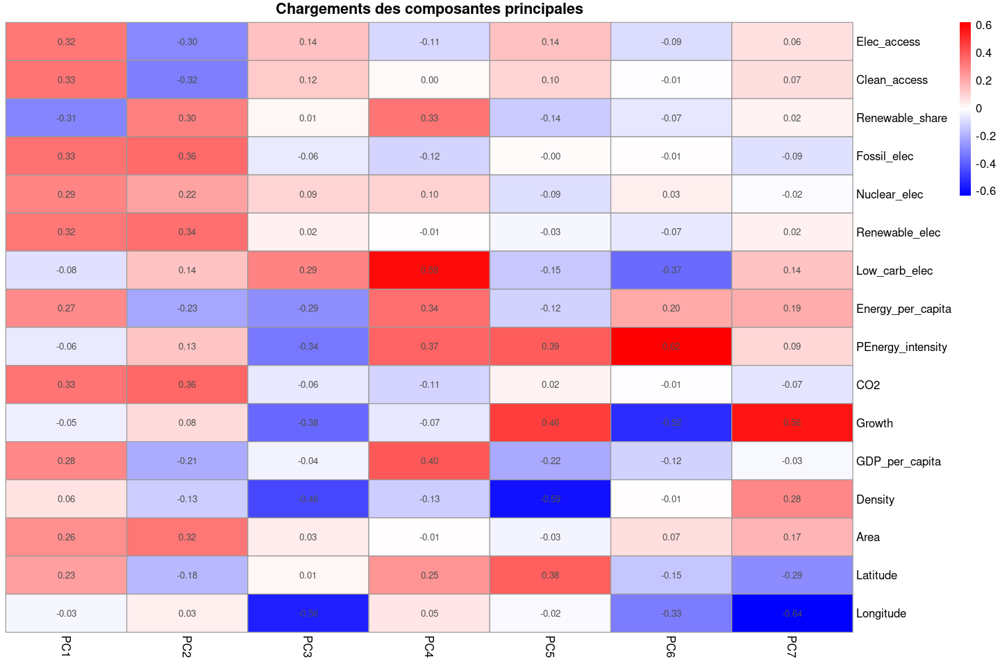

In [43]:
pheatmap(loadings_df,
         color = colorRampPalette(c("blue", "white", "red"))(n = 299),
         annotation_col = NULL,
         display_numbers = TRUE, 
         number_format = "%.2f", 
         main = "Chargements des composantes principales", 
         fontsize_row = 10,
         fontsize_col = 10,
         fontsize_number = 8,
         cluster_rows = FALSE, 
         cluster_cols = FALSE) 

## 1.5 - Dépendance de la variable Year et de la variable présentant les émissions de CO2

In [44]:
data_ <- data[, -((ncol(data)-3):ncol(data))] 
head(data_) 

,Entity,Year,Elec_access,Clean_access,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,Low_carb_elec,Energy_per_capita,PEnergy_intensity,CO2,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
4,Afghanistan,2003,14.73851,9.50,36.66,0.31,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.06497,10.90,44.24,0.33,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.39089,12.20,33.88,0.34,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995
7,Afghanistan,2006,30.71869,13.85,31.89,0.20,0,0.64,76.19048,304.4209,1.50,1760,5.357403,263.7336,60,652230,33.93911,67.70995
8,Afghanistan,2007,36.05101,15.30,28.78,0.20,0,0.75,78.94737,354.2799,1.53,1770,13.826320,359.6932,60,652230,33.93911,67.70995
9,Afghanistan,2008,42.40000,16.70,21.17,0.19,0,0.54,73.97260,607.8335,1.94,3560,3.924984,364.6635,60,652230,33.93911,67.70995


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


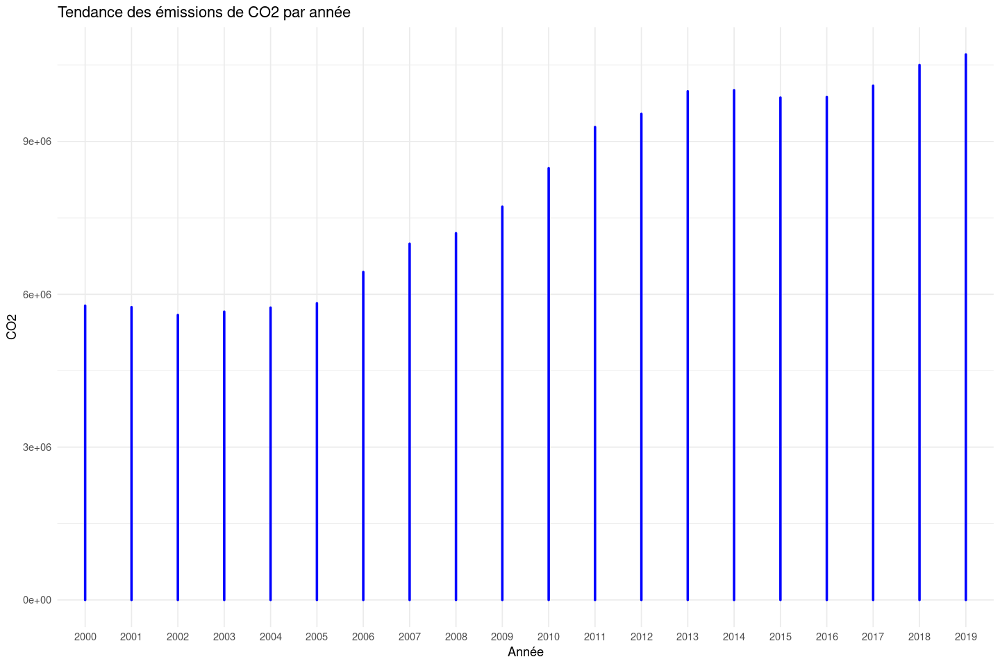

In [45]:
data_$Year <- as.factor(data_$Year)

ggplot(data_, aes(x = Year, y = CO2)) + 
  geom_line(color = "blue", size = 1) + 
  theme_minimal() +  
  labs(title = 'Tendance des émissions de CO2 par année', x = 'Année', y = 'CO2')

Interprétation :

* Tendance générale : La ligne représente la tendance moyenne des émissions de CO2 sur la période donnée. On observe que les émissions de CO2 ont globalement augmenté au fil du temps depuis l'an 2000 jusqu'à environ 2010. Après 2010, la tendance semble plus stable avec une légère augmentation ou stabilisation des émissions.

* Variation annuelle : La zone ombrée qui s'étend au-dessus et en dessous de la ligne de tendance indique la variation des émissions de CO2 au sein de chaque année. La largeur de cette zone peut signifier l'écart-type, indiquant la variabilité des émissions de CO2 d'une année à l'autre. Une zone large suggère une grande variabilité, tandis qu'une zone étroite indique une plus grande constance dans les émissions au cours de l'année. On remarque que la largeur de cette zone augmente au fur et à mesure du temps.

* Pointes et chutes : Certaines années montrent des pointes ou des chutes dans les émissions, comme la pointe autour de 2010. Ces fluctuations pourraient être dues à des événements spécifiques ou à des changements dans les politiques environnementales, les pratiques économiques ou les technologies énergétiques.

* Analyse contextuelle : Pour comprendre pleinement ce graphique, il est important de le mettre en contexte avec d'autres données et événements. Par exemple, des augmentations dans les émissions de CO2 pourraient coïncider avec la croissance économique, tandis que des stabilisations ou des réductions pourraient refléter des améliorations dans l'efficacité énergétique ou l'adoption d'énergies renouvelables.

En résumé, ce graphique indique que, bien que les émissions de CO2 ont augmenté jusqu'à 2010, il y a eu une tendance vers la stabilisation ou une augmentation plus modérée dans les années suivantes. Cela pourrait être interprété comme un signe positif dans le contexte des efforts mondiaux de réduction des émissions.

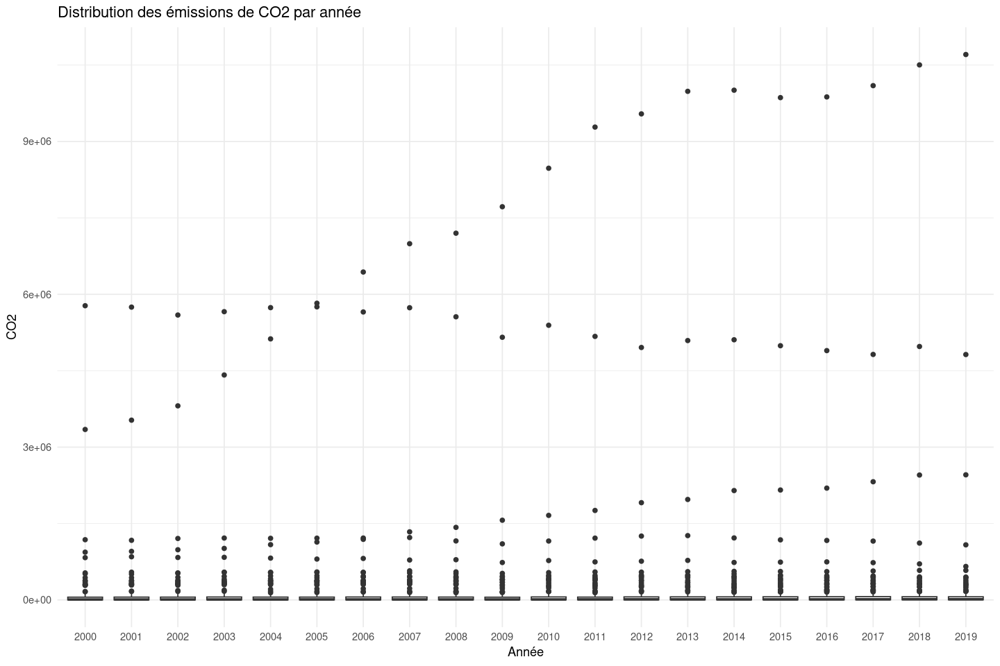

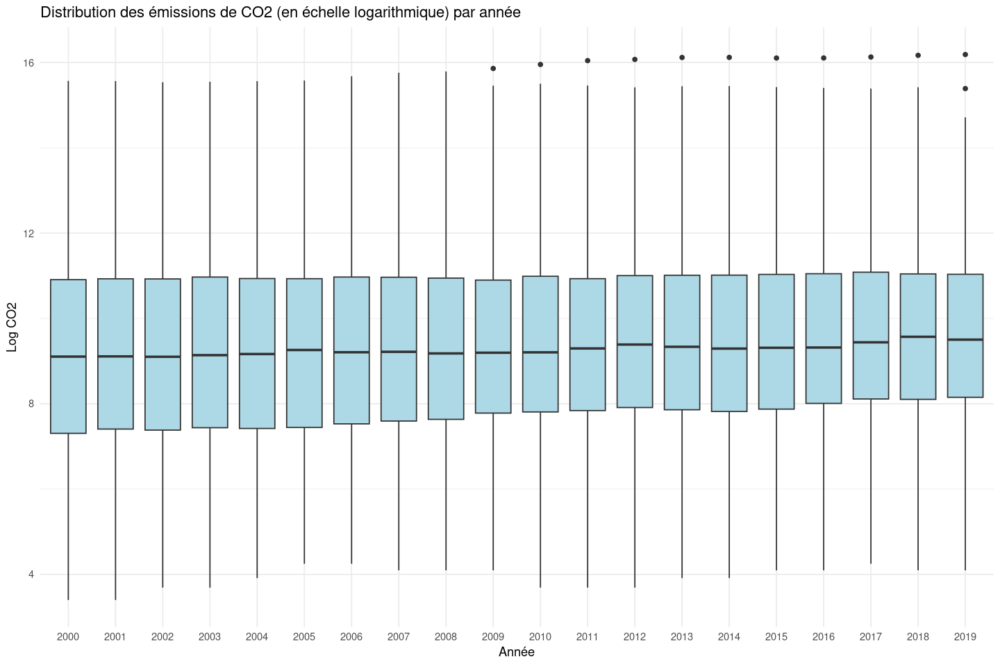

In [46]:
data_$Year <- as.factor(data_$Year)

ggplot(data_, aes(x = Year, y = CO2)) +
  geom_boxplot() +
  theme_minimal() +
  labs(title = 'Distribution des émissions de CO2 par année', x = 'Année', y = 'CO2')

data_$log_CO2 <- log(data$CO2)
ggplot(data_, aes(x = Year, y = log_CO2)) +
  geom_boxplot(fill = "lightblue") +  
  theme_minimal() +  
  labs(title = 'Distribution des émissions de CO2 (en échelle logarithmique) par année', 
       x = 'Année', 
       y = 'Log CO2')  

Le premier graphique est très difficile à interpréteer. Cela s'explique par les émissions importantes des pays les plus polluants qui sont visibles sous forme "d'ouliers" et applatissent les boxplots. Les répartitions sont trop désiquilibrées. Nous avons pu observer une tendance Gaussienne de la variable CO2 après transformation logarithmique. Le deuxième graphique représente des boxplots des émissions de CO2 en échelle logarithmique au cours du temps.

Sur ce deuxième graphique, nous avons décidé de transformer la variable CO2 avec une transformation logarithimique comme vu précédemment. L'utilisation de l'échelle logarithmique est justifiée par le fait que les émissions de CO2 ont une large gamme de valeurs. Ainsi, le logarithme aide à mieux visualiser les différences, surtout lorsque les données s'étendent sur plusieurs ordres de grandeur, comme c'est le cas sur le premier graphique.

* Médiane et quartiles : Chaque boîte représente la distribution des émissions de CO2 pour une année donnée, où la ligne centrale de la boîte indique la médiane des émissions de CO2. Les bords de la boîte représentent le premier et le troisième quartile, montrant la répartition centrale des données.

* Variabilité : Les moustaches des box s'étendent depuis le haut et le bas de chaque boîte jusqu'aux valeurs maximales et minimales dans l'intervalle interquartile (souvent jusqu'au dernier point situé à moins de 1,5 fois l'écart interquartile du bord de la boîte), montrant la variabilité totale des émissions de CO2 pour chaque année.

* Outliers : Les points au-dessus des moustaches sont considérés comme des outliers. Ces points représentent des années où les émissions de CO2 étaient exceptionnellement élevées par rapport aux autres années.

* Tendance temporelle : En comparant les boîtes d'une année à l'autre, on ne note pas de changement significatif dans la médiane sur le long terme, ce qui suggérerait que la médiane des émissions de CO2 (sur l'échelle logarithmique) est restée relativement constante au cours de cette période.

* Inégalité dans les émissions : L'ampleur des moustaches et la présence de outliers soulignent l'inégalité dans les émissions de CO2 entre différents pays. Certaines années ont des émissions particulièrement élevées qui se détachent des tendances générales.

## 1.6 - Conclusion sur la partie exploratoire des données

Finalement, cette analyse exploratoire de notre jeu de données nous a permis de visualiser les différences considérables d'échelles et de gaussianité entre nos données. Tout d'abord, nous avons vu que notre jeu de données comporte beaucoup de valeurs manuantes. Dans un premier temps, nous avons décidé de supprimer les colonnes comportant trop de valeurs manquantes, puis les dernières lignes en comportant. De plus, nous avons constaté des fortes différences d'échelles entre nos données. En effet, des poucentages d'accès à l'électricité ne sont pas du même odre de grandeur que des valeurs d'émissions de CO2. Nous avons vu que certaines données ne suivaient pas une tendance gaussienne, mais cet aspect était amélioré avec des transformation comme une transformtion logarithmique. Dans une future partie de modélisation, il sera intéressant de rendre nos données les plus gaussiennes possibles pour améliorer la qualité de notre modèle.

Aussi, nous avons vu des fortes disparités entre les pays sur les émissions de CO2 : quelques pays avaient leurs émissions arrondies à 0, alors que d'autres avaient des émissions très importantes. Le classement des pays les plus émetteurs dépend aussi de la superficie des pays et des émissions par habitant.

Notre étude multi-dimensionnelle nous a permis de montrer que les émissions de CO2 sont fortement influencées par le répartition du mix énergétique d'un pays : les énergies fossiles influencent énormément les émissions de CO2, alors que l'utilisation d'énergie nucléaire a un impact assez neutre. Sur cette étude, l'utilisation d'énergie renouvlable n'améliorait pas la situation si le pays était dépendant des énergies fossiles. D'autres vaiables comme la densité, la superficie ou les coordonnées géographiques ont un impact neutre sur les émissions de CO2. Avec cette étude, nous pourrions envisager l'utilisation d'un modèle de régression linéaire en utilisant uniquement la variable 'Fossil_elec' pour prédire les valeurs des émissions de CO2.

Puis, en réalisant une Analyse en Composantes Principales, nous avons pu passer de 18 à 7 dimensions sur notre jeu de données et émettre des hypothèses sur les significations des composantes principales avec l'étude des chargements des composantes.

Pour finir, nous avons observé l'évolution des émissions de CO2 en fonction des années. L'hétérogénéité des émissions est d'autant plus marquée avec la présence d'outliers sur les boxplots. Une transformation des émissions de CO2 en échelle logarithmique nous a permis de mieux visualiser la médiane et les quantiles qui avaient des évolutions plus constantes, indépendamment de l'évolution importante de la valeur des outliers.

# 2 - Modélisation

Nous considérons maintenant le problème de la prédiction la variable **CO2** à partir des autres variables du point de vue de l’apprentissage automatique, c’est-à-dire en nous concentrant sur les performances du modèle. L’objectif est de déterminer les meilleures performances que nous pouvons attendre, et les modèles qui les atteignent.

## 2.1 - Transformation des données

### 2.1.1 Visualisation avant transformation

Comme étudié et expliqué dans la première partie, nous avons vu que beaucoup de données de notre dataframe ne suivaient pas forcément de tendance gaussienne. Cependant, dans l'objectif d'un modèle plus performant, il est important d'appliquer des transformations sur nos données. Nous allons créer un nouveau dataframe contenant les mêmes colonnes que notre jeu de données initial avec les transformations appliquées.

In [47]:
df <- data[, 1:18] # Création du nouveau dataframe qui sera transformé

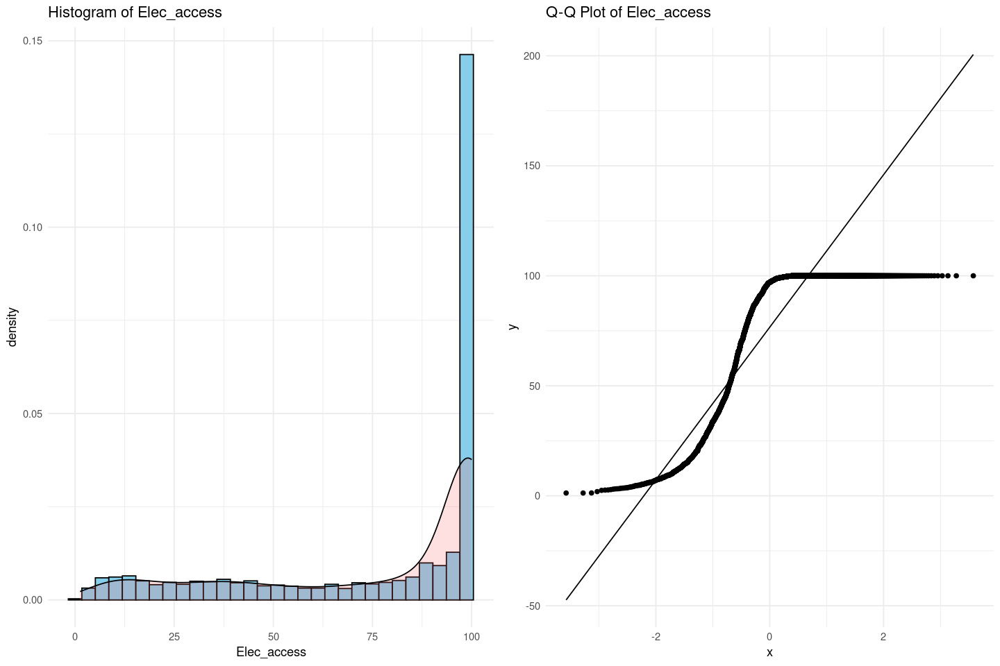

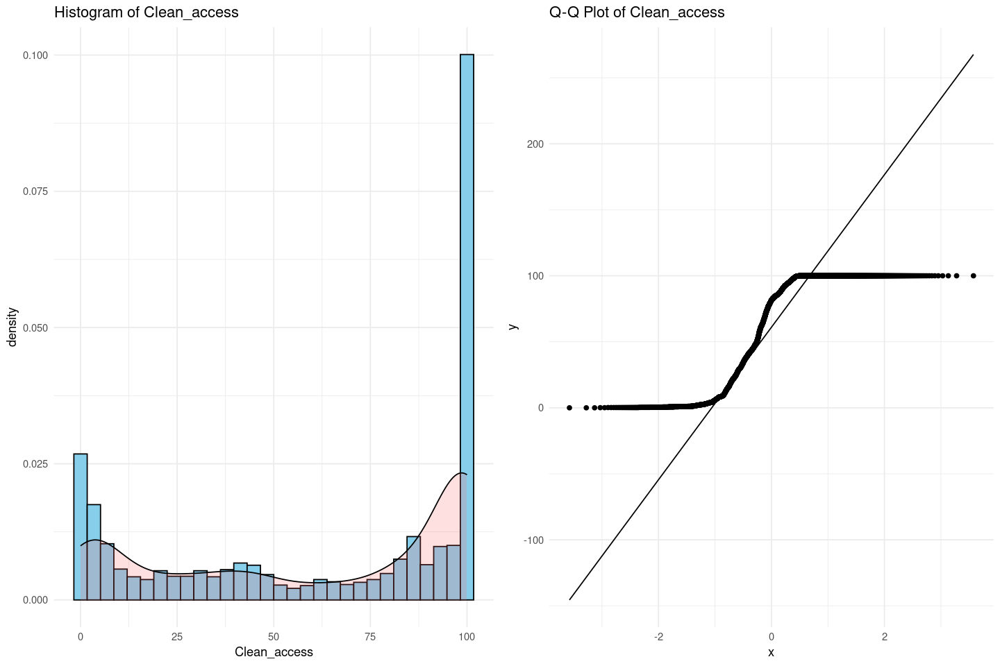

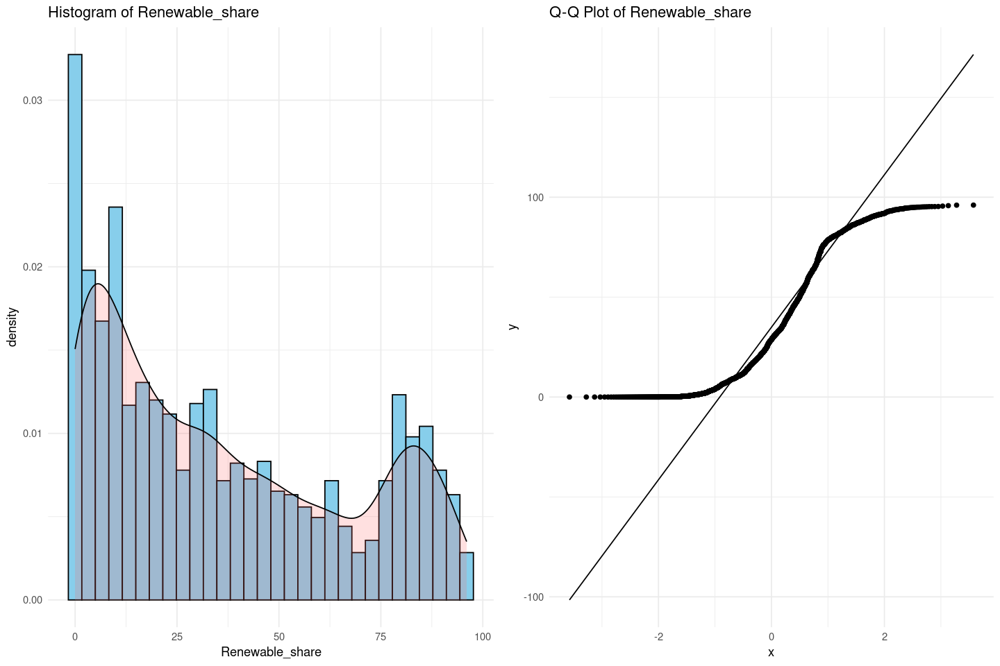

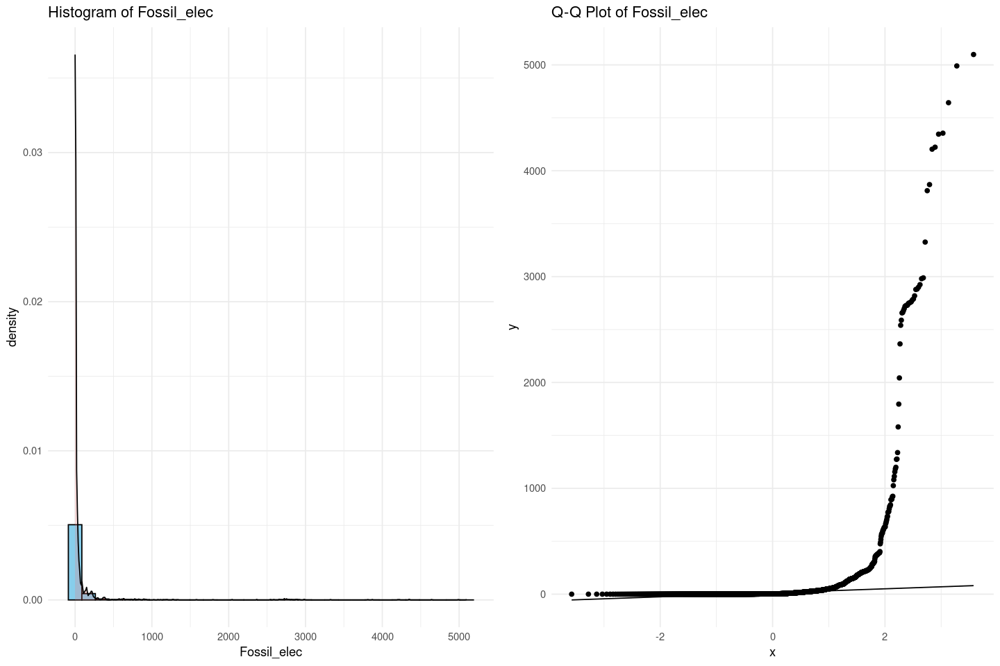

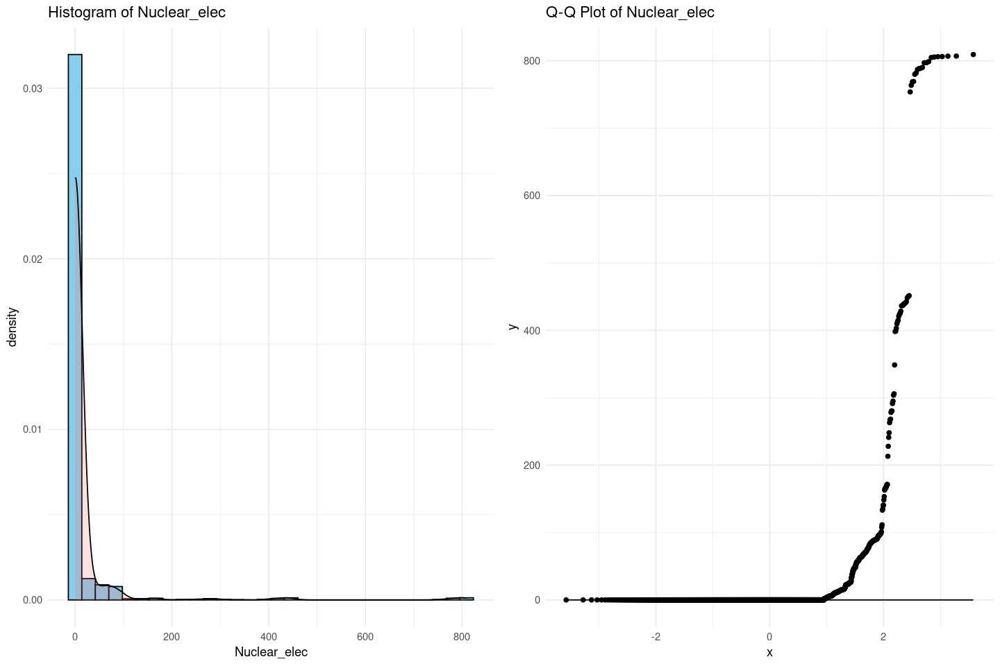

...

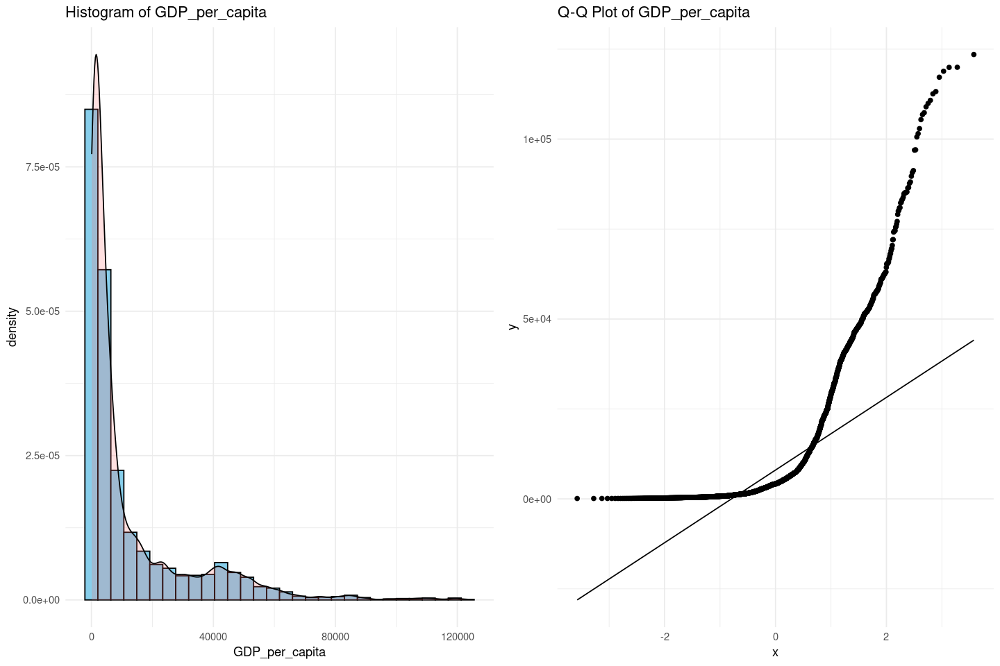

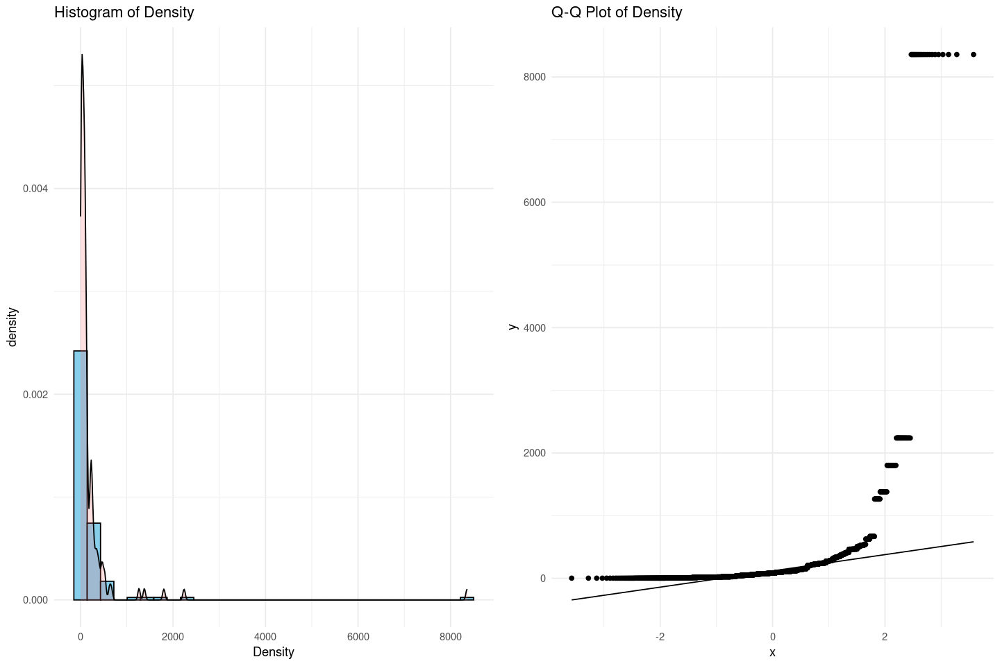

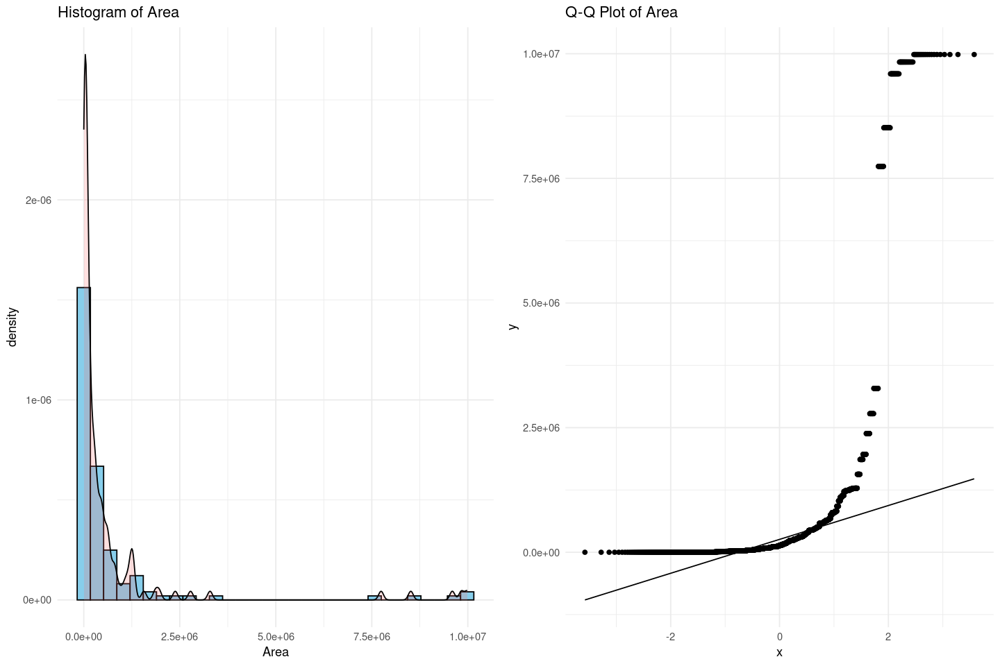

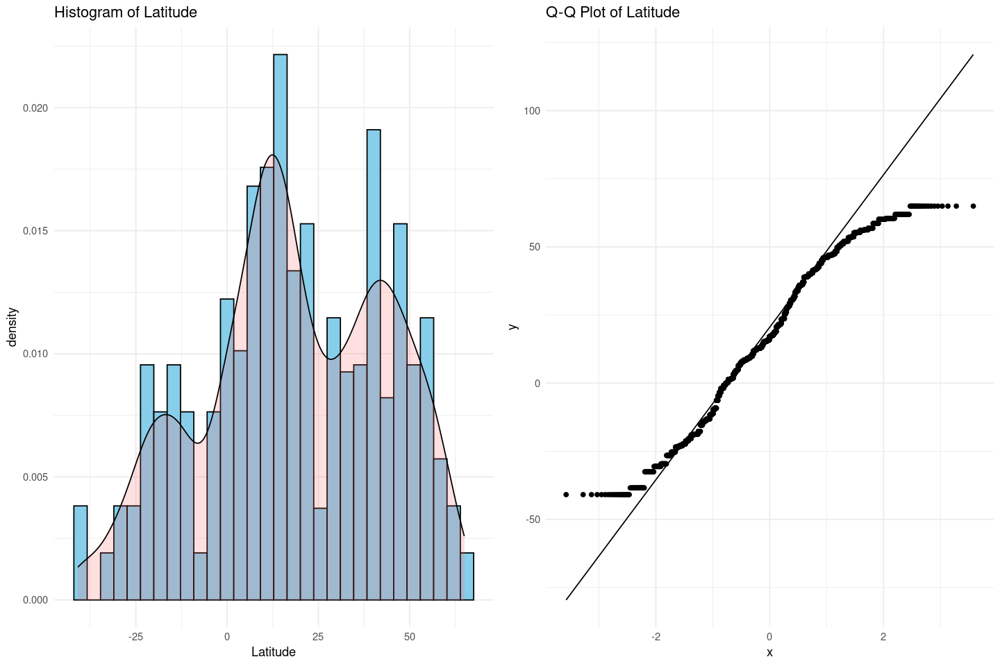

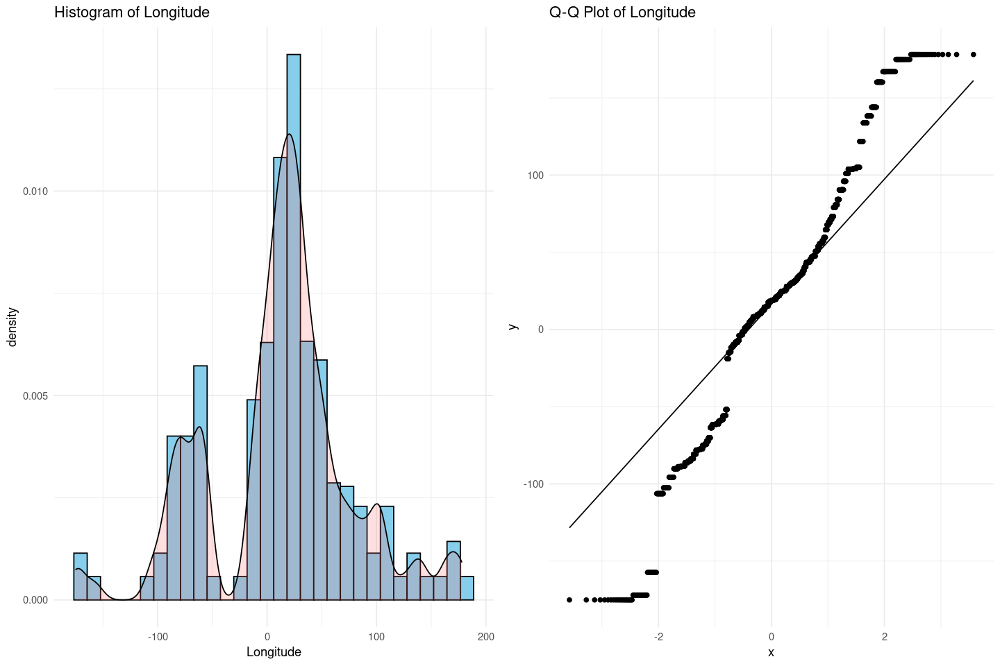

In [48]:
numeric_columns <- sapply(df, is.numeric)


for (column in names(df)[numeric_columns]) {
  
 
  p1 <- ggplot(df, aes_string(x = column)) +
    geom_histogram(aes(y = ..density..), bins = 30, color = "black", fill = "skyblue") +
    geom_density(alpha = .2, fill = "#FF6666") +
    ggtitle(paste('Histogram of', column)) +
    theme_minimal()
  
  
  p2 <- ggplot(df, aes(sample = .data[[column]])) +
    stat_qq() +
    stat_qq_line() +
    ggtitle(paste('Q-Q Plot of', column)) +
    theme_minimal()

  grid.arrange(p1, p2, ncol = 2)
}

Nous observons que la plupart de nos données ne sont pas gaussiennes. Il faut donc appliquer les transofrmations appropriées sur les données qui le nécessitent afin de les transformer. Pour les trois premières variables (Elec_acces, Clean_access, Renewable_share), le QQ-plot de nos données est assez spécifique et ne voit pas sa tendance modifiée par les transformations élémentaires (logarithmique, racine carrée, ou autre). Nous décidons dans un premier temps de laisser ces données sans transformation.

### 2.1.2 - Transformation et visualisation

In [49]:
df <- df %>%
  mutate(
    log_Fossil_elec = log(Fossil_elec + 1),
    log_Nuclear_elec = log(Nuclear_elec + 1),
    log_Renewable_elec = log(Renewable_elec + 1),
    sqrt_Low_carb_elec = sqrt(Low_carb_elec + 1), 
    log_Energy_per_capita = log(Energy_per_capita + 1),
    log_CO2 = log(CO2 + 1),
    log_PEnergy_intensity = log(PEnergy_intensity + 1),
    log_GDP_per_capita = log(GDP_per_capita + 1),
    log_Density = log(Density + 1),
    log_Area = log(Area + 1)
  ) %>%
  select(
    Entity, Year, Elec_access, Clean_access, Renewable_share, 
    log_Fossil_elec, log_Nuclear_elec, log_Renewable_elec, 
    sqrt_Low_carb_elec, log_Energy_per_capita, log_CO2, 
    log_PEnergy_intensity, Growth, log_GDP_per_capita, 
    log_Density, log_Area, Latitude, Longitude
  )


print(dim(df))
head(df)

[1] 2868   18


,Entity,Year,Elec_access,Clean_access,Renewable_share,log_Fossil_elec,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_CO2,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,Afghanistan,2003,14.73851,9.50,36.66,0.2700271,0,0.4885800,8.247501,5.442280,7.107425,0.8754687,8.832278,5.255847,4.110874,13.38815,33.93911,67.70995
5,Afghanistan,2004,20.06497,10.90,44.24,0.2851789,0,0.4446858,7.995083,5.324137,6.938284,0.7884574,1.414118,5.358387,4.110874,13.38815,33.93911,67.70995
6,Afghanistan,2005,25.39089,12.20,33.88,0.2926696,0,0.4637340,8.027506,5.533663,7.346655,0.8796267,11.229715,5.493190,4.110874,13.38815,33.93911,67.70995
7,Afghanistan,2006,30.71869,13.85,31.89,0.1823216,0,0.4946962,8.785811,5.721691,7.473637,0.9162907,5.357403,5.578724,4.110874,13.38815,33.93911,67.70995
8,Afghanistan,2007,36.05101,15.30,28.78,0.1823216,0,0.5596158,8.941329,5.872906,7.479300,0.9282193,13.826320,5.888028,4.110874,13.38815,33.93911,67.70995
9,Afghanistan,2008,42.40000,16.70,21.17,0.1739533,0,0.4317824,8.658672,6.411545,8.177797,1.0784096,3.924984,5.901714,4.110874,13.38815,33.93911,67.70995


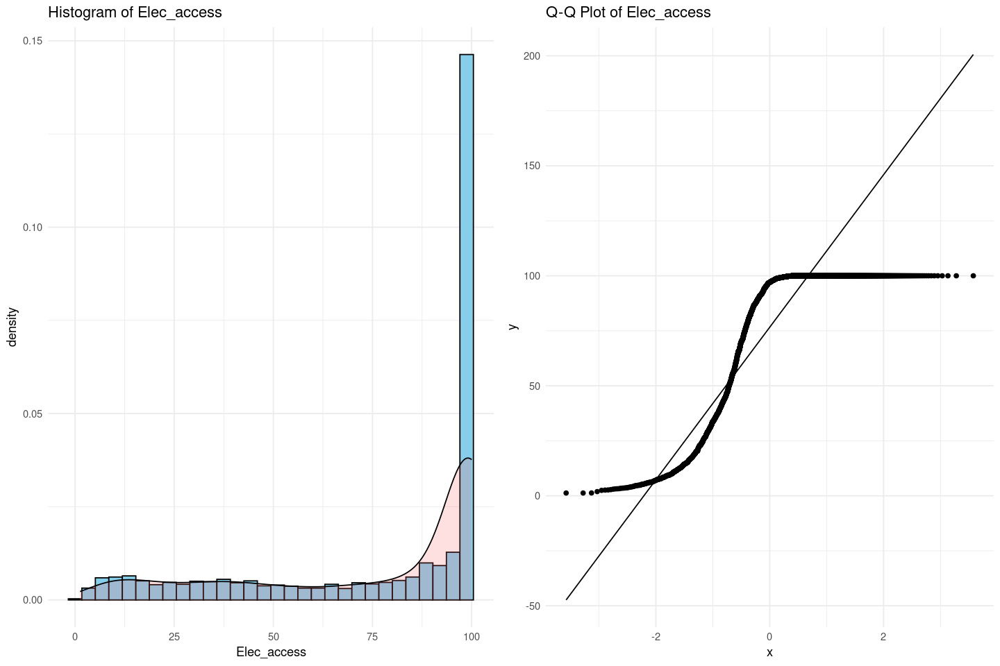

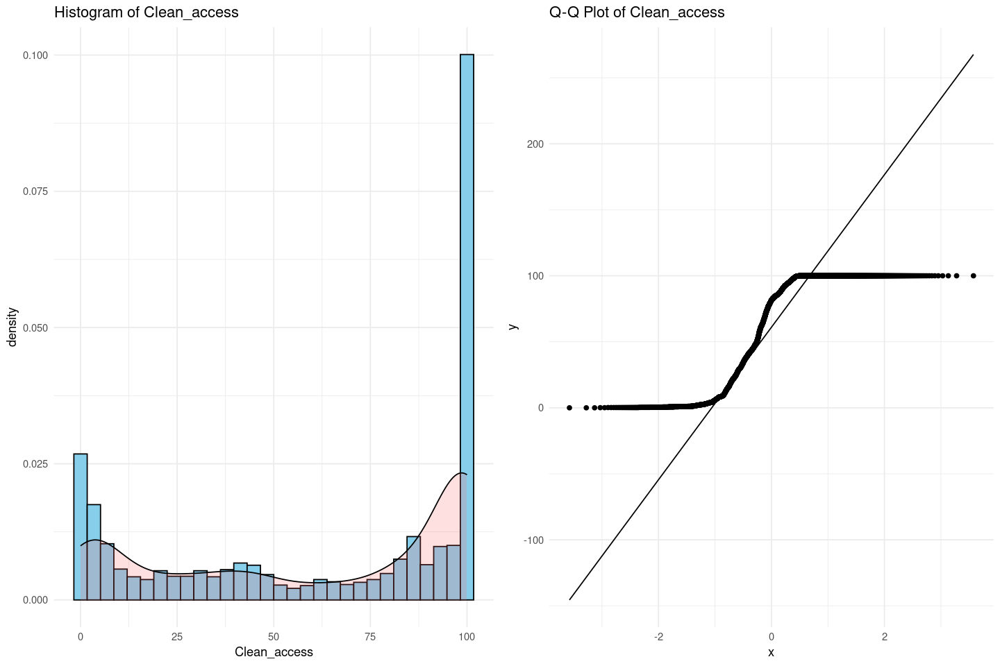

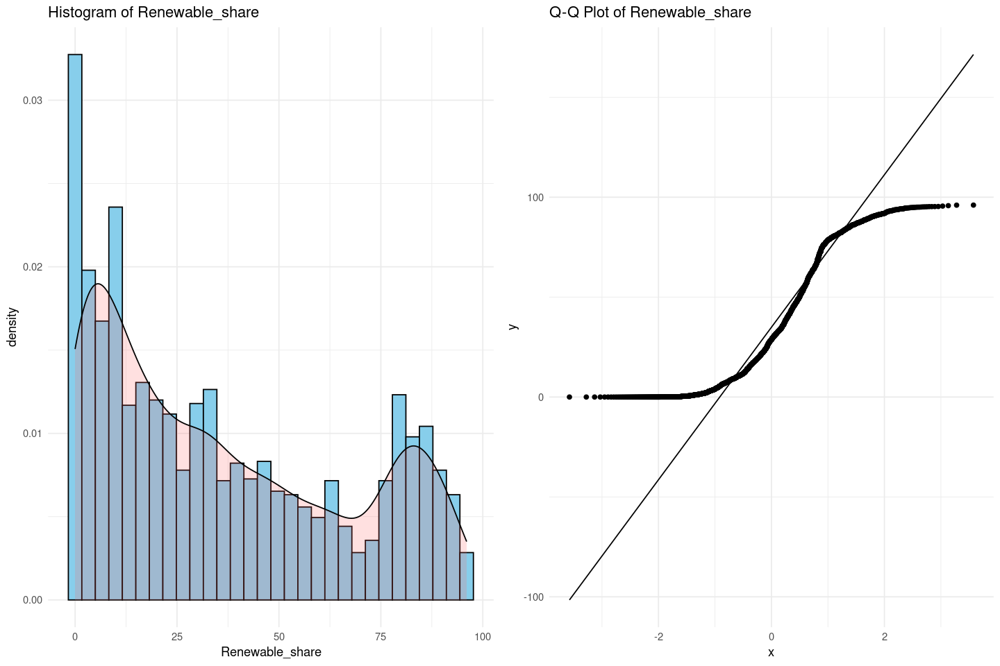

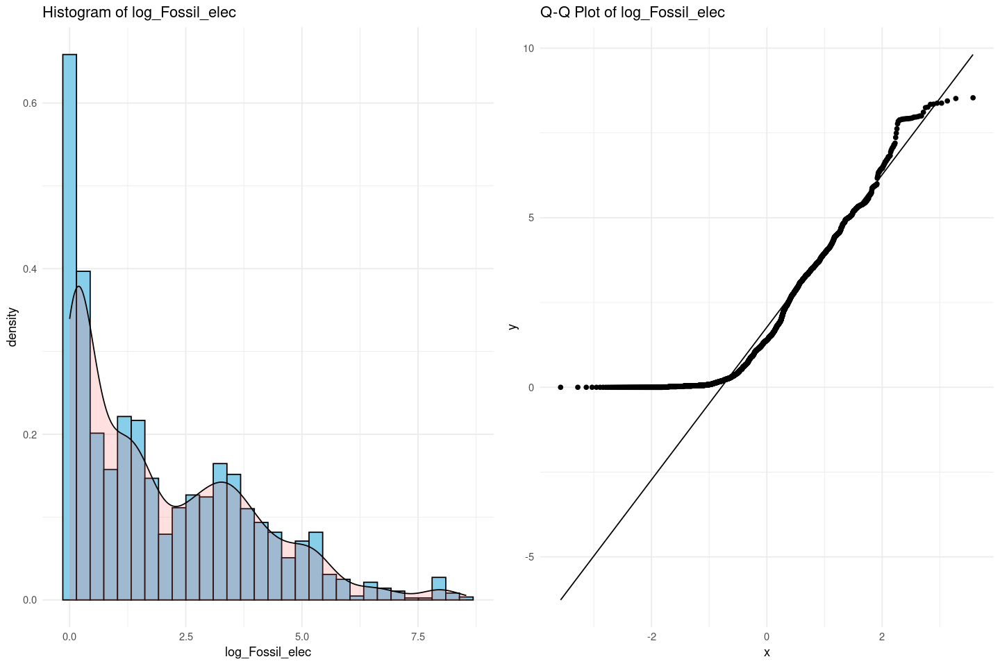

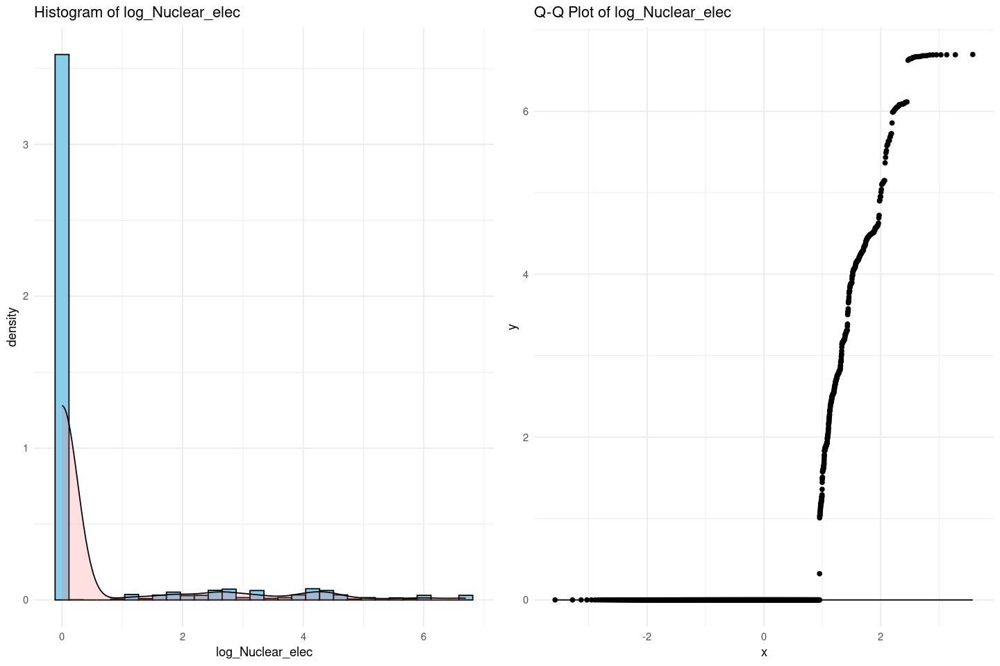

...

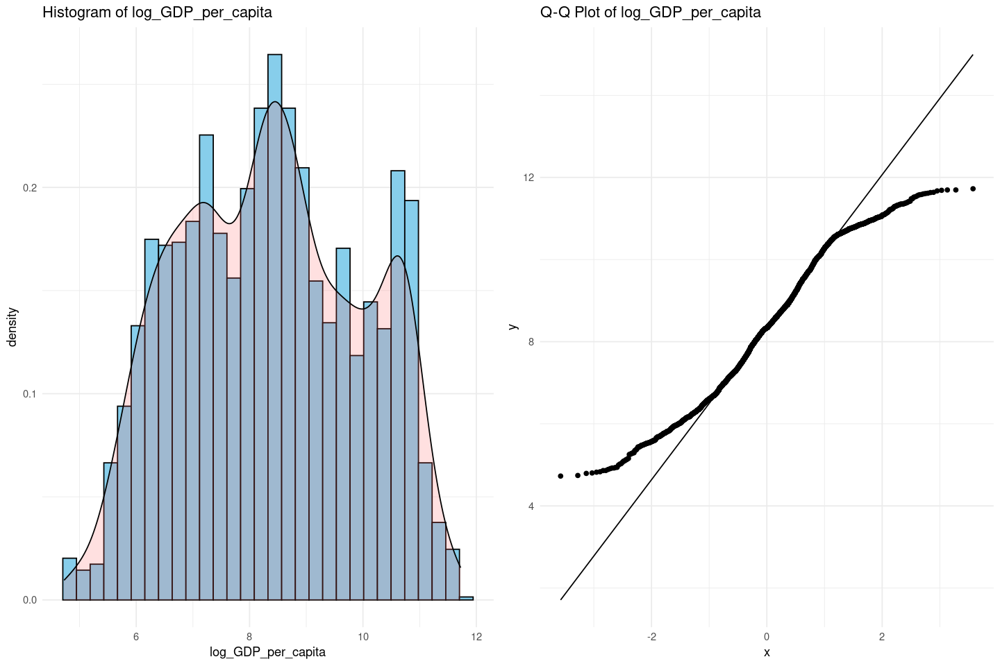

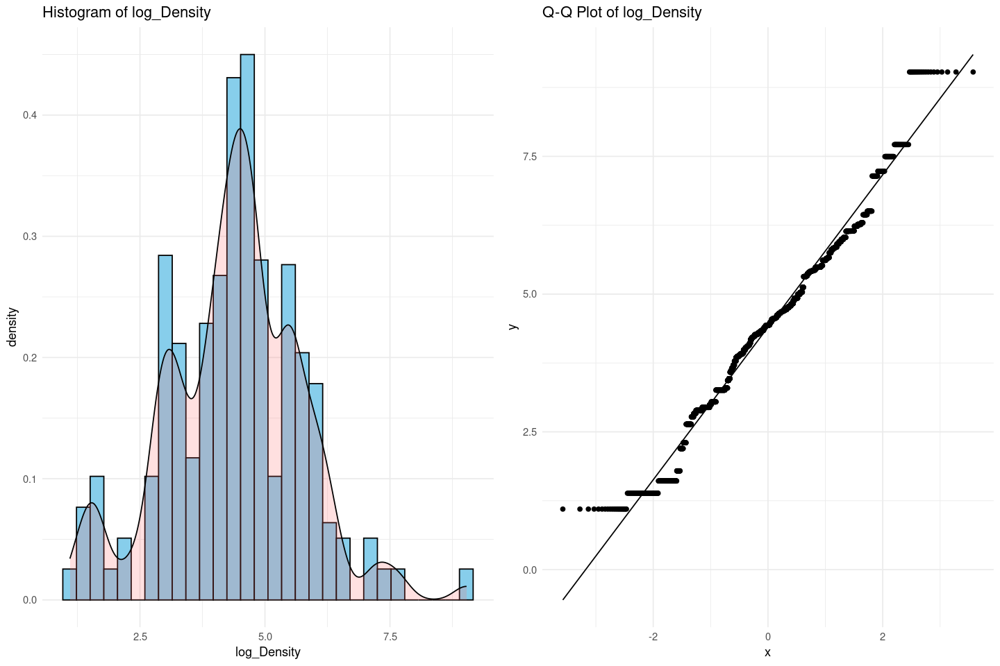

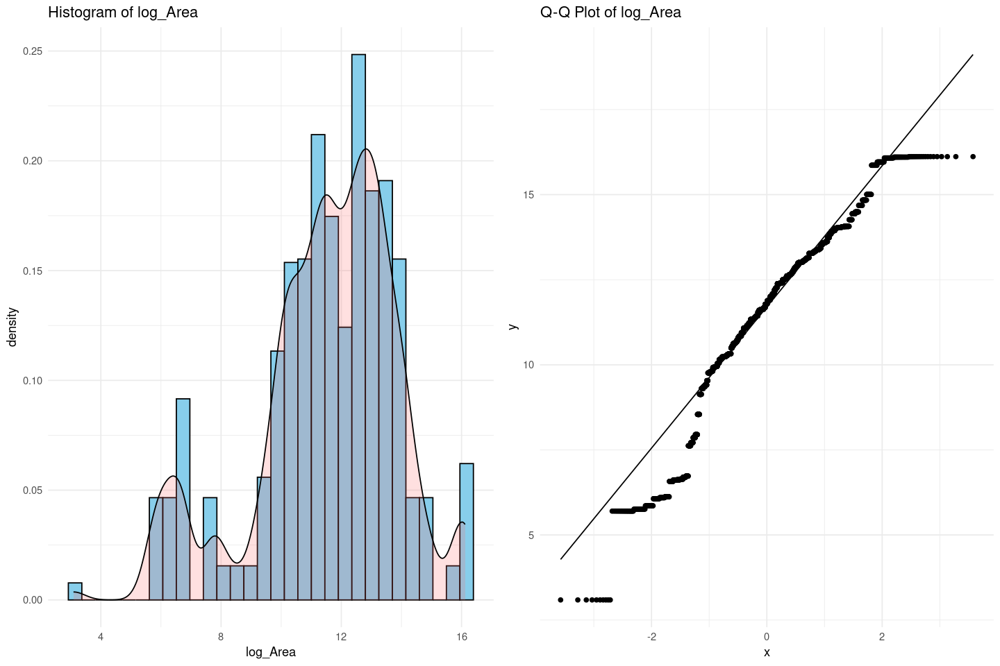

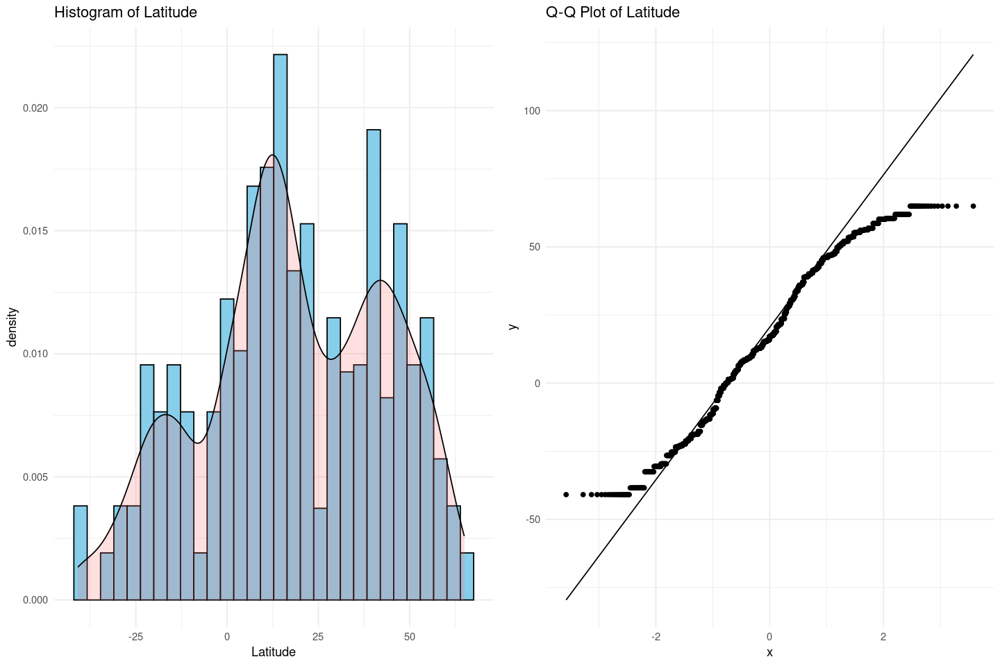

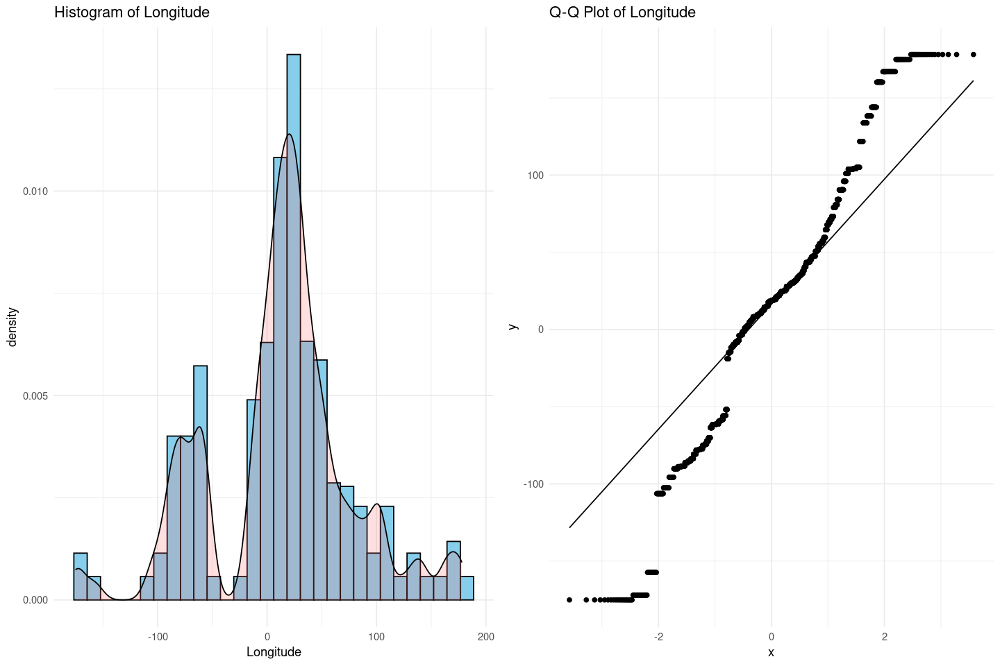

In [50]:
# Histogrammes et QQplots après transformation


numeric_columns <- sapply(df, is.numeric)


for (column in names(df)[numeric_columns]) {
  
  
  p1 <- ggplot(df, aes_string(x = column)) +
    geom_histogram(aes(y = ..density..), bins = 30, color = "black", fill = "skyblue") +
    geom_density(alpha = .2, fill = "#FF6666") +
    ggtitle(paste('Histogram of', column)) +
    theme_minimal()
  
  
  p2 <- ggplot(df, aes(sample = .data[[column]])) +
    stat_qq() +
    stat_qq_line() +
    ggtitle(paste('Q-Q Plot of', column)) +
    theme_minimal()

  grid.arrange(p1, p2, ncol = 2)
}

### 2.1.3 - Suppression de la variable 'Fossil_elec'

Comme étudié dans l'analyse exploratoire des données, la variable 'Fossil_elec' est extrêmement corrélée avec les émissions de CO2. Nous décidons de la supprimer de notre DataFrame pour la modélisation. Nous réaliserons un modèle de régréssion linéaire avec cette variable uniquement, pour comparer les différents résultats.

In [51]:
df_init <- df
df <- df %>%
  select(-log_Fossil_elec)

## 2.2 - Division du jeu de données

Nous allons diviser notre jeu de données entre un échantillon d'apprentissage et un échantillon de test. Nous choisissons une répartition avec 80% des données pour l'apprentissage et 20% pour le test. Cette étape est très importante afin d'avoir un équilibre des données entre l'entraînement et le test. Une première option pourrait être de choisir aléatoirement 80% des données pour l'entraïnement et le reste pour le test. Dans un objectif de recherche de performance, nous pourrions aussi avoir une répartition équilibrée de la présence des pays dans le train et dans le test, et ainsi, découper nos échantillons en fonction de ce paramètre.

Nous allons tester les différentes méthodes pour comparer les performances

### 2.2.1 - Division aléatoire

Nous allons découper notre jeu de données de manière à avoir 80% des données dans le X_train et 20% des données pour le test. Dans un premier temps, ce découpage va se faire de manière totalement aléatoire sur l'ensemble du jeu de données.

In [52]:
dff <- subset(df, select = -log_CO2)

In [53]:
# Split 80% entrainement, 20% test

inTrain <- createDataPartition(y=df$log_CO2,p=0.8,list=FALSE)

#ensembles d'entraînement
X_train <- dff[inTrain, ]
Y_train <- df$log_CO2[inTrain]

#ensembles de test
X_test <- dff[-inTrain, ]
Y_test <- df$log_CO2[-inTrain]

# On ne garde que les données quantitatives
X_train_quanti <- select(X_train, -c(Entity, Year))
X_test_quanti <- select(X_test, -c(Entity, Year))

In [54]:
# Encodage des années dans les ensembles d'entraînement et de test
encoder <- dummyVars("~.", data = X_train["Year"], fullRank = TRUE)
X_train_year <- predict(encoder, newdata = X_train)
X_train_year <- cbind(X_train_quanti, X_train_year)

encoder <- dummyVars("~.", data = X_test["Year"], fullRank = TRUE)
X_test_year <- predict(encoder, newdata = X_test)
X_test_year <- cbind(X_test_quanti, X_test_year)

In [55]:
head(X_train)
head(Y_train)

head(X_test)
head(Y_test)

head(X_train_quanti)
head(X_test_quanti)

,Entity,Year,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
5,Afghanistan,2004,20.06497,10.90,44.24,0,0.4446858,7.995083,5.324137,0.7884574,1.414118,5.358387,4.110874,13.38815,33.93911,67.70995
6,Afghanistan,2005,25.39089,12.20,33.88,0,0.4637340,8.027506,5.533663,0.8796267,11.229715,5.493190,4.110874,13.38815,33.93911,67.70995
7,Afghanistan,2006,30.71869,13.85,31.89,0,0.4946962,8.785811,5.721691,0.9162907,5.357403,5.578724,4.110874,13.38815,33.93911,67.70995
8,Afghanistan,2007,36.05101,15.30,28.78,0,0.5596158,8.941329,5.872906,0.9282193,13.826320,5.888028,4.110874,13.38815,33.93911,67.70995
9,Afghanistan,2008,42.40000,16.70,21.17,0,0.4317824,8.658672,6.411545,1.0784096,3.924984,5.901714,4.110874,13.38815,33.93911,67.70995
10,Afghanistan,2009,46.74005,18.40,16.53,0,0.5766134,9.163990,6.883512,1.1786550,21.390528,6.082832,4.110874,13.38815,33.93911,67.70995


[1] 6.938284 7.346655 7.473637 7.479300 8.177797 8.493105

,Entity,Year,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,Afghanistan,2003,14.73851,9.5,36.66,0,0.4885800,8.247501,5.442280,0.8754687,8.832278,5.255847,4.110874,13.38815,33.93911,67.709953
11,Afghanistan,2010,42.70000,20.0,15.15,0,0.5596158,8.988172,7.076563,1.2412686,14.362441,6.299513,4.110874,13.38815,33.93911,67.709953
13,Afghanistan,2012,69.10000,23.0,15.36,0,0.5538851,9.224473,7.189259,1.2837078,12.752287,6.461227,4.110874,13.38815,33.93911,67.709953
50,Algeria,2007,98.85294,98.8,0.41,0,0.1988509,1.276366,9.372519,1.6505799,3.400000,8.281854,2.944439,14.68334,28.03389,1.659626
51,Algeria,2008,99.30000,99.0,0.30,0,0.2468601,1.319149,9.413550,1.6409366,2.400000,8.502005,2.944439,14.68334,28.03389,1.659626
55,Algeria,2012,98.76466,99.4,0.18,0,0.4824261,1.465801,9.519728,1.7439688,3.400000,8.629310,2.944439,14.68334,28.03389,1.659626


[1]  7.107425  8.869398  8.997271 11.540064 11.587578 11.812519

,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
5,20.06497,10.90,44.24,0,0.4446858,7.995083,5.324137,0.7884574,1.414118,5.358387,4.110874,13.38815,33.93911,67.70995
6,25.39089,12.20,33.88,0,0.4637340,8.027506,5.533663,0.8796267,11.229715,5.493190,4.110874,13.38815,33.93911,67.70995
7,30.71869,13.85,31.89,0,0.4946962,8.785811,5.721691,0.9162907,5.357403,5.578724,4.110874,13.38815,33.93911,67.70995
8,36.05101,15.30,28.78,0,0.5596158,8.941329,5.872906,0.9282193,13.826320,5.888028,4.110874,13.38815,33.93911,67.70995
9,42.40000,16.70,21.17,0,0.4317824,8.658672,6.411545,1.0784096,3.924984,5.901714,4.110874,13.38815,33.93911,67.70995
10,46.74005,18.40,16.53,0,0.5766134,9.163990,6.883512,1.1786550,21.390528,6.082832,4.110874,13.38815,33.93911,67.70995


,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,14.73851,9.5,36.66,0,0.4885800,8.247501,5.442280,0.8754687,8.832278,5.255847,4.110874,13.38815,33.93911,67.709953
11,42.70000,20.0,15.15,0,0.5596158,8.988172,7.076563,1.2412686,14.362441,6.299513,4.110874,13.38815,33.93911,67.709953
13,69.10000,23.0,15.36,0,0.5538851,9.224473,7.189259,1.2837078,12.752287,6.461227,4.110874,13.38815,33.93911,67.709953
50,98.85294,98.8,0.41,0,0.1988509,1.276366,9.372519,1.6505799,3.400000,8.281854,2.944439,14.68334,28.03389,1.659626
51,99.30000,99.0,0.30,0,0.2468601,1.319149,9.413550,1.6409366,2.400000,8.502005,2.944439,14.68334,28.03389,1.659626
55,98.76466,99.4,0.18,0,0.4824261,1.465801,9.519728,1.7439688,3.400000,8.629310,2.944439,14.68334,28.03389,1.659626


### 2.2.2 - Division avec un équilibre entre la présence des pays dans chaque échantillon

Dans un objectif de recherche de performance pour nos modèles, nous pouvons nous demander si nous n'aurions pas un meilleur score en découpant nos données de manière à ce que chaque pays soit représenté avec 80% de ses données dans le train et 20% dans le test. Pour un même pays, le découpage est aléatoire, mais on s'assure que chaque pays soit présent à la même hauteur dans le train et le test.

In [56]:
unique_countries <- unique(df$Entity)
X_train_entity <- data.frame()
Y_train_entity <- numeric()
X_test_entity <- data.frame()
Y_test_entity <- numeric()

# Partition des données pour chaque pays
for(country in unique_countries) {
  country_data <- filter(df, Entity == country)
  
  n <- nrow(country_data)
  if(n > 1) {
    inTrain <- createDataPartition(y = country_data$log_CO2, p = 0.8, list = FALSE)
    X_train_entity <- rbind(X_train_entity, country_data[inTrain, ] %>% select(-log_CO2))
    Y_train_entity <- c(Y_train_entity, country_data$log_CO2[inTrain])
    
    X_test_entity <- rbind(X_test_entity, country_data[-inTrain, ] %>% select(-log_CO2))
    Y_test_entity <- c(Y_test_entity, country_data$log_CO2[-inTrain])
  } else if(n == 1) {
    X_train_entity <- rbind(X_train_entity, country_data %>% select(-log_CO2))
    Y_train_entity <- c(Y_train_entity, country_data$log_CO2)
  }

}

X_train_entity_quanti <- select(X_train_entity, -c(Entity, Year))
X_test_entity_quanti <- select(X_test_entity, -c(Entity, Year))


In [57]:
head(X_train_entity)

,Entity,Year,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Afghanistan,2003,14.73851,9.50,36.66,0,0.4885800,8.247501,5.442280,0.8754687,8.832278,5.255847,4.110874,13.38815,33.93911,67.70995
3,Afghanistan,2005,25.39089,12.20,33.88,0,0.4637340,8.027506,5.533663,0.8796267,11.229715,5.493190,4.110874,13.38815,33.93911,67.70995
4,Afghanistan,2006,30.71869,13.85,31.89,0,0.4946962,8.785811,5.721691,0.9162907,5.357403,5.578724,4.110874,13.38815,33.93911,67.70995
5,Afghanistan,2007,36.05101,15.30,28.78,0,0.5596158,8.941329,5.872906,0.9282193,13.826320,5.888028,4.110874,13.38815,33.93911,67.70995
6,Afghanistan,2008,42.40000,16.70,21.17,0,0.4317824,8.658672,6.411545,1.0784096,3.924984,5.901714,4.110874,13.38815,33.93911,67.70995
7,Afghanistan,2009,46.74005,18.40,16.53,0,0.5766134,9.163990,6.883512,1.1786550,21.390528,6.082832,4.110874,13.38815,33.93911,67.70995


## 2.3 - Modélisation par régression linéaire

Pour interpréter les résultats et comparer les méthodes, nous allons procéder par validation croisée. Le principe de la validation croisée est d'évaluer les performances d'un modèle en le testant sur plusieurs sous-ensembles distincts des données, appelés "folds". Chaque fold est utilisé à tour de rôle comme ensemble de test, tandis que les autres folds sont combinés pour former l'ensemble d'entraînement. Ainsi, chaque observation est utilisée à la fois pour l'entraînement et pour l'évaluation du modèle.

L'évaluation se fait en calculant les performances du modèle sur chaque fold de test, en utilisant une métrique prédéfinie (comme l'erreur quadratique moyenne, le R² score, etc.). On calcule ensuite la moyenne des performances de chacune des validations croisées.

In [58]:
perf_cross_validation <- function(model, X, y, cv = 5, scoring = NULL) {
  control <- trainControl(method="cv", number=cv, summaryFunction=defaultSummary, savePredictions = "final",verboseIter = FALSE)
  

  metric <- ifelse(is.null(scoring), "Rsquared", scoring)
  
  fit <- train(x = X, y = y, 
               method = model, 
               trControl = control,
               metric = metric)
  
  print(paste("Score de validation croisée pour le modèle", model))
  
  if (metric == "Rsquared") {
    cat("Scores R2 de chaque validation croisée :", paste(round(fit$resample$Rsquared, 4), collapse = ", "), "\n")
    print(paste("Score moyen de validation croisée (R^2)", mean(fit$resample$Rsquared)))
  } else {
    cat("Scores de chaque validation croisée :", paste(round(fit$resample[[metric]], 4), collapse = ", "), "\n")
    print(paste("Score moyen de validation croisée (", metric, ")", mean(fit$resample[[metric]]), sep=""))
  }
}

### 2.3.1 - Régression linéaire sans sélection de variable

La modélisation linéaire sans sélection de variable utilise toutes les variables disponibles dans le modèle, sans en exclure. Cette méthode ne cherche pas à réduire le nombre de variables. Il n'y a pas d'hyperparamètres spécifiques pour contrôler la sélection des variables. Ici, nous avons choisi ne de conserver que les variables quantitatives pour diminuer les temps de calculs et ne pas encoder les pays ou les années.

In [59]:
model_reg_no_select <- "lm"
X_train_quanti <- select(X_train, -c(Entity, Year))
perf_cross_validation(model_reg_no_select, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")
model_reg_no_select <- lm(Y_train ~ ., data = X_train_quanti)

[1] "Score de validation croisée pour le modèle lm"
Scores R2 de chaque validation croisée : 0.9826, 0.9797, 0.982, 0.9839, 0.9804 
[1] "Score moyen de validation croisée (R^2) 0.981724303436875"


Le modèle de régression linéaire testé affiche un score moyen de validation croisée de 0.9817, révélant une prédiction précise et robuste de la variable CO2. Cependant, l'absence de sélection de variables pourrait être un potentiel risque de surajustement, nécessitant une vérification supplémentaire de la fiabilité des résultats.

### 2.3.2 - Régression linéaire avec sélection de variable selon Backward/Forward

Les méthodes de sélection de variables par "backward" (en arrière) et "forward" (en avant) sont des approches itératives utilisées pour sélectionner un sous-ensemble optimal de variables explicatives pour un modèle de régression. 

* Sélection Backward (en arrière) :
Cette approche commence par un modèle comprenant toutes les variables explicatives. À chaque itération, une variable est retirée du modèle. La variable retirée est celle qui a le moins d'impact sur la performance du modèle. La performance du modèle est évaluée en utilisant le critère BIC dans notre cas. Le processus continue jusqu'à ce qu'aucune amélioration significative de la performance du modèle ne soit observée après la suppression d'une variable.

* Sélection Forward (en avant) :
Cette approche commence avec un modèle vide qui ne contient aucune variable explicative. À chaque étape, une variable est ajoutée au modèle. La variable ajoutée est celle qui améliore le plus la performance du modèle. selon le critère d'information BIC. Le processus continue jusqu'à ce qu'aucune amélioration significative de la performance du modèle ne soit observée après l'ajout d'une variable.

Nous allons mettre en place ces deux méthodes, implémenter des modèles de régressions linéaires associés, et comparer les résultats obtenus entre eux, ainsi qu'avec le modèle de régression linéaire sans sélection de variables.

In [60]:
calculate_bic <- function(model) {
  return(BIC(model))
}

backward_feature_selection <- function(data, target_name, initial_features) {
  formula <- as.formula(paste(target_name, "~", paste(initial_features, collapse = "+")))
  full_model <- lm(formula, data = data)
  
  step_model <- stepAIC(full_model, direction = "backward", trace = FALSE, k = log(nrow(data)))
  
  
  selected_features <- names(coef(step_model))
  selected_features <- selected_features[-1] 
  
  final_bic <- calculate_bic(step_model)
  final_r2 <- summary(step_model)$r.squared
  
  cat("Best BIC:", final_bic, "with features:", paste(selected_features, collapse = ", "), "\n\n")
  
  return(list(features = selected_features, bic = final_bic, r2 = final_r2))
}

data_bic <- df 
target_name <- "log_CO2"
initial_features <- setdiff(names(data_bic), c("Entity", "Year"))
results <- backward_feature_selection(data_bic, target_name, initial_features)
selected_features_backward <- results$features

cat("Selected features after backward selection based on BIC:", paste(results$features, collapse = ", "), "\n")
cat("\nNumber of selected features:", length(results$features), "\n")

Warning message in model.matrix.default(mt, mf, contrasts):
“la réponse est apparue dans le membre de droite et y a été éliminée”
Warning message in model.matrix.default(mt, mf, contrasts):
“problème avec le terme 8 dans model.matrix : aucune colonne n'est assignée”
Warning message in model.matrix.default(object, data = structure(list(log_CO2 = c(7.10742549786173, :
“la réponse est apparue dans le membre de droite et y a été éliminée”
Warning message in model.matrix.default(object, data = structure(list(log_CO2 = c(7.10742549786173, :
“problème avec le terme 8 dans model.matrix : aucune colonne n'est assignée”


Best BIC: 1688.76 with features: Elec_access, Clean_access, Renewable_share, log_Renewable_elec, sqrt_Low_carb_elec, log_Energy_per_capita, log_PEnergy_intensity, Growth, log_GDP_per_capita, log_Density, log_Area, Latitude 

Selected features after backward selection based on BIC: Elec_access, Clean_access, Renewable_share, log_Renewable_elec, sqrt_Low_carb_elec, log_Energy_per_capita, log_PEnergy_intensity, Growth, log_GDP_per_capita, log_Density, log_Area, Latitude 

Number of selected features: 12 


In [61]:
## ----------------------------------------------------------------------- ##
## Code permettant de comparer les différences obtenues entre Python et R  ##
## Décommenter si besoin                                                   ##
## ----------------------------------------------------------------------- ##

## Impression des informations sur le meilleur BIC
#cat("Best BIC (Python): 1782.90 with 12 selected features.\n")
#cat("Best BIC (R): 1688.76 with 12 selected features.\n\n")

## Création du dataframe
#features_df <- data.frame(
#  Feature = c("Elec_access", "Clean_access", "Renewable_share", "log_Nuclear_elec", 
#              "log_Renewable_elec", "sqrt_Low_carb_elec", "log_Energy_per_capita", 
#              "log_PEnergy_intensity", "Growth", "log_GDP_per_capita", 
#              "log_Density", "log_Area", "Latitude", "Longitude", NA, NA),
#  In_Python = c("Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "No", "No", "No"),
#  In_R = c("Yes", "Yes", "Yes", "No", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "No", "No", "No")
#)

## Remplacer les valeurs "No" par "Yes" pour les caractéristiques sélectionnées en Python
#features_df$In_Python[features_df$Feature %in% c('log_Nuclear_elec', 'Longitude')] <- "No"

## Utilisation de knitr pour créer un joli tableau
#knitr::kable(features_df, caption = "Comparison of Selected Features in Python and R")

In [62]:
forward_feature_selection <- function(data, target_name, exclude_columns) {
  features <- setdiff(names(data), c(exclude_columns, target_name))
  
  formula <- as.formula(paste(target_name, "~ 1"))
  
  null_model <- lm(formula, data = data)
  
  step_model <- stepAIC(null_model, scope=list(lower=formula, upper=as.formula(paste(target_name, "~", paste(features, collapse = "+")))), direction = "forward", trace = FALSE, k = log(nrow(data)))
  
  selected_features <- names(coef(step_model))
  selected_features <- selected_features[-1]  
  

  final_bic <- BIC(step_model)
  final_r2 <- summary(step_model)$r.squared
  
  cat("Best BIC:", final_bic, "with features:", paste(selected_features, collapse = ", "), "\n\n")

  
  return(list(features = selected_features, bic = final_bic, r2 = final_r2))
}

data_bic_forward <- df 
target_name_forward <- "log_CO2"
exclude_columns_forward <- c("Entity", "Year") 

results <- forward_feature_selection(data_bic_forward, target_name_forward, exclude_columns_forward)
selected_features_forward <- results$features
cat("Selected features after forward selection based on BIC:", paste(results$features, collapse = ", "), "\n")
cat("\nNumber of selected features:", length(results$features), "\n")

Best BIC: 1688.76 with features: log_Renewable_elec, Renewable_share, log_Area, log_Density, log_Energy_per_capita, log_GDP_per_capita, Elec_access, log_PEnergy_intensity, sqrt_Low_carb_elec, Clean_access, Growth, Latitude 

Selected features after forward selection based on BIC: log_Renewable_elec, Renewable_share, log_Area, log_Density, log_Energy_per_capita, log_GDP_per_capita, Elec_access, log_PEnergy_intensity, sqrt_Low_carb_elec, Clean_access, Growth, Latitude 

Number of selected features: 12 


In [63]:
## ----------------------------------------------------------------------- ##
## Code permettant de comparer les différences obtenues entre Python et R  ##
## Décommenter si besoin                                                   ##
## ----------------------------------------------------------------------- ##

## Caractéristiques sélectionnées par la méthode forward en Python et en R
#features <- c("Elec_access", "Clean_access", "Renewable_share", 
#              "log_Nuclear_elec", "log_Renewable_elec", "sqrt_Low_carb_elec", 
#              "log_Energy_per_capita", "log_PEnergy_intensity", "Growth", 
#              "log_GDP_per_capita", "log_Density", "log_Area", "Latitude", 
#              "Longitude")

## Indiquer si la caractéristique est sélectionnée en Python
#selected_in_python <- c("Yes", "Yes", "Yes", "No", "Yes", "No", 
#                        "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "No")

## Indiquer si la caractéristique est sélectionnée en R
#selected_in_r <- c("Yes", "Yes", "Yes", "Yes", "Yes", "Yes", 
#                   "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "No")

## Création du dataframe pour la comparaison
#features_comparison_df <- data.frame(
#  Feature = features,
#  Selected_in_Python = selected_in_python,
#  Selected_in_R = selected_in_r
#)

## Impression des informations sur le meilleur BIC pour forward selection
#cat("Best BIC FORWARD (Python): 1768.43 with 11 selected features.\n")
#cat("Best BIC FORWARD (R): 1688.76 with 12 selected features.\n\n")

## Utilisation de knitr pour créer un joli tableau de comparaison
#knitr::kable(features_comparison_df, caption = "Comparison of Selected Features by Forward Selection in Python and R")

Notre objectif est de sélectionner la combinaisond e varibles qui permettent de minimiser le critère BIC. Ainsi, en appliquant les méthodes Backward et Forward développées précédememnt, nous obtenons respectivement une sélection de 12 et 12 variables pour nos régressions linéaires avec sélection de variable. On remarque une diminution du nombre de variables par rapport au nombre initial de variables quantitatives. De plus, le nombre de variables sélectionnées par les deux modèles est proche. On s'attend à ce que les scores de performance obtenus par validation croisée soient proches que pour la régression sans sélection de variable.

Ces différences de résultats entre les deux méthodes peuvent s'expliquer par la sensibilité des méthodes à l'ordre de la sélection de variables, ou encore aux éventuelles corrélations entre les variables ajoutées ou retirées, que nous avons étudié dans la partie précédente.

In [64]:
X_train_selected_backward <- X_train[, selected_features_backward, drop = FALSE]
X_test_selected_backward <- X_test[, selected_features_backward, drop = FALSE]

model_backward <- "lm"
perf_cross_validation(model_backward, X_train_selected_backward, Y_train, cv = 5, scoring = "Rsquared")
model_backward <- lm(Y_train ~ ., data = X_train_selected_backward)

[1] "Score de validation croisée pour le modèle lm"
Scores R2 de chaque validation croisée : 0.9807, 0.9841, 0.9842, 0.9803, 0.9799 
[1] "Score moyen de validation croisée (R^2) 0.981823876667674"


En utilisant la méthode de sélection de variables backward pour réduire les prédicteurs de **14 à 12**, le modèle de régression linéaire maintient une performance élevée avec un score moyen de validation croisée de **0.9818**, pratiquement inchangé par rapport au modèle initial. Ce résultat suggère que la suppression de deux variables n'affecte pas significativement la capacité prédictive du modèle, indiquant à la fois l'efficacité de la sélection et un potentiel risque réduit de surajustement.

In [65]:
X_train_selected_forward <- X_train[, selected_features_forward, drop = FALSE]
X_test_selected_forward <- X_test[, selected_features_forward, drop = FALSE]

model_forward <- "lm"
perf_cross_validation(model_forward, X_train_selected_forward, Y_train, cv = 5, scoring = "Rsquared")
model_forward <- lm(Y_train ~ ., data = X_train_selected_forward)

[1] "Score de validation croisée pour le modèle lm"
Scores R2 de chaque validation croisée : 0.9804, 0.9833, 0.9823, 0.9837, 0.9793 
[1] "Score moyen de validation croisée (R^2) 0.981787738718756"


L'approche de sélection de variables forward a produit des scores de validation croisée quasiment similaires pour le modèle de régression linéaire, avec un score moyen de 0.9824. Ces résultats montrent que le modèle conserve une excellente capacité prédictive même après une sélection progressive des variables. Cela indique que les variables ajoutées sont pertinentes pour la prédiction de CO2 et que le modèle reste robuste, avec peu de variation entre les plis, minimisant ainsi le risque de surajustement. Ces observations confirment l'efficacité de la méthode de sélection forward dans la construction d'un modèle prédictif stable et précis.

Les méthodes de sélection de variables backward et forward ont réduit le nombre de prédicteurs de **14 à 12**. Malgré cette réduction, les scores moyens de validation croisée restent très similaires, autour de **0.9817**, ce qui montre que le modèle conserve une excellente précision. La sélection de variables semble donc efficace pour éliminer celles qui sont redondantes ou moins pertinentes, tout en maintenant la capacité prédictive du modèle. Le choix entre les deux méthodes peut dépendre de la préférence pour la simplicité ou la structure du modèle.

### 2.3.3 - Régression linéaire avec sélection de variables par LASSO

Le LASSO (Least Absolute Shrinkage and Selection Operator) est une méthode de régression linéaire régularisée qui ajoute une pénalité L1 à la fonction de coût. Cette pénalité favorise la simplicité du modèle en forçant certains coefficients de régression à être exactement zéro, ce qui équivaut à une sélection de variables. Cela permet de réduire la complexité du modèle en éliminant les variables moins importantes ou redondantes.

Dans la régression linéaire avec LASSO, l'hyperparamètre à optimiser est λ, qui est le paramètre de régularisation. λ contrôle l'équilibre entre la simplicité du modèle et son ajustement aux données. Un λ élevé favorise un modèle plus simple en supprimant les variables moins importantes, tandis qu'un λ faible permet un ajustement plus précis mais augmente le risque de surajustement. Pour trouver la meilleure valeur de λ, on utilise une recherche sur grille combinée à une validation croisée pour maximiser les performances du modèle.

In [66]:
y <- Y_train
x.mat <- model.matrix(Y_train ~. -1,data=X_train_quanti)

lambda_values <- 1 / c(1e-12,0.0001, 0.0005, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 10,1e+2,1e+3,1e+5,1e+6,1e+12)
cv.lasso <- cv.glmnet(x.mat, y,alpha=1,lambda=lambda_values, standardize = TRUE, type.measure = "mse", nfolds = 5)

model_lasso <- glmnet(x = x.mat, y = y, alpha = 1, lambda = cv.lasso$lambda.min)
non_zero_coef <- coef(model_lasso, s = "lambda.min")[-1, 1]

Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”


In [67]:
cat(sprintf("Optimal lambda: %g\n", cv.lasso$lambda.min))

num_features <- length(non_zero_coef)
num_eliminated <- dim(x.mat)[2] - num_features  
cat(sprintf("LASSO conserves %d variables and eliminates %d variables\n", num_features, num_eliminated))


model_lasso_cv <- "glmnet"
perf_cross_validation(model_lasso_cv, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")




Optimal lambda: 1e-05
LASSO conserves 14 variables and eliminates 0 variables
[1] "Score de validation croisée pour le modèle glmnet"
Scores R2 de chaque validation croisée : 0.9802, 0.9833, 0.9833, 0.9801, 0.982 
[1] "Score moyen de validation croisée (R^2) 0.981782809892707"


L'analyse de sélection de variables via la méthode LASSO, avec une optimisation du paramètre de régularisation lambda, a abouti à un lambda optimal de 1e-5
, extrêmement proche de zéro. Une diminution de la valeur de lambda ammène à une erreur de calcul, mais après plusieurs tentatives, l'optimiseur choisi la valeur minimale à chaque fois. Cela indique une pénalisation presque nulle, conservant ainsi toutes les 14 variables initiales. Le score R² obtenu, de **0.9817**, est très élevé, confirmant que le modèle avec toutes les variables est déjà très performant pour prédire la variable CO2. Le résultat montre que la régularisation par LASSO n'apporte pas de bénéfice supplémentaire significatif.

Ces observations peuvent être dues au fait que nous n'avons choisi que des variables quantitatives dans notre échantillon d'entraînement. Dans ce cas, le meilleur modèle pourrait être la régression linéaire simple que nous avons étudié précédemment. Nous nous sommes demandés si avec un autre échantillon, l'optimiseur des hyperparamètres ne choisirait pas une valeur autre qu'un bord de la grille donnée. Nous allons tester ce même code avec un échantillon d'entraînement comprenant un encodage des années.

In [68]:
## ON REMPLACE X_train_quanti par X_train_year !!!!

y <- Y_train
x.mat <- model.matrix(Y_train ~. -1,data=X_train_year)


lambda_values <- 1 / c(0.0001, 0.0005, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 10,100,1000,10000,1000000,1000000000000)
cv.lasso <- cv.glmnet(x.mat, y,alpha=1,lambda=lambda_values, standardize = TRUE, type.measure = "mse", nfolds = 5)

model_lasso_year <- glmnet(x = x.mat, y = y, alpha = 1, lambda = cv.lasso$lambda.min)


all_coef <- coef(model_lasso_year, s="lambda.min")[-1, 1]
indices_to_remove <- order(abs(all_coef))[1:6]
all_coef[indices_to_remove] <- 0
non_zero_coef <- all_coef[all_coef != 0]

In [69]:
cat(sprintf("Optimal lambda: %g\n", cv.lasso$lambda.min))

num_features <- length(non_zero_coef)
num_eliminated <- dim(x.mat)[2] - num_features
cat(sprintf("LASSO conserves %d variables and eliminates %d variables\n", num_features, num_eliminated))

model_lasso_year_cv <- "glmnet"
perf_cross_validation(model_lasso_year_cv, X_train_year, Y_train, cv = 5, scoring = "Rsquared")

Optimal lambda: 0.001
LASSO conserves 28 variables and eliminates 6 variables
[1] "Score de validation croisée pour le modèle glmnet"
Scores R2 de chaque validation croisée : 0.9791, 0.984, 0.9834, 0.9816, 0.9794 
[1] "Score moyen de validation croisée (R^2) 0.981504586529291"


L'ajout d'un encodage des années et l'utilisation de LASSO ont produit un modèle avec un lambda de 0.0001. Le score R² de **0.9815** est très proche du score initial, indiquant une performance stable. De plus, on remarque que le meilleur lambda choisi n'est plus la borne inférieure de la liste donnée. Cela nous indique donc que l'optimiseur a réellement fonctionné et qu'il est pertinent avec cet échantillon d'entraînement.

Nous avons vu que le LASSO suggère une réduction du nombre de variables, nous allons afficher graphiquement les coefficients associés à chacune d'elles : un coefficent dont la valeur absolue est élevé indique que la variable associée apporte de l'information au modèle, alors qu'une valeur proche de 0 montre que cette variable n'est pas des plus pertinentes.

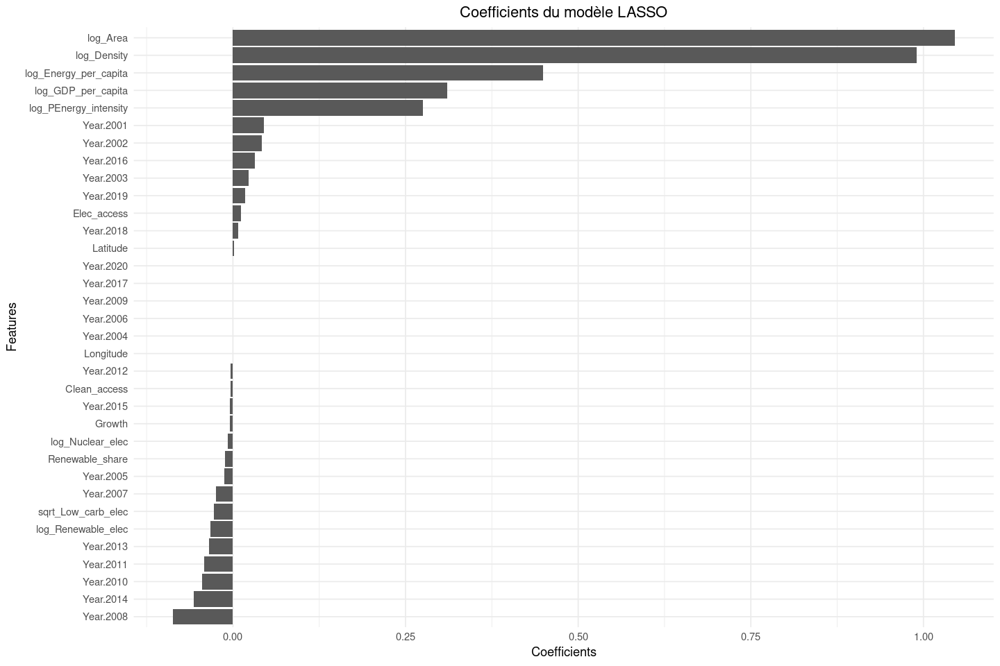

In [70]:
coef_df <- data.frame(Feature = names(all_coef), Coefficient = all_coef)
ggplot(coef_df, aes(x = reorder(Feature, Coefficient), y = Coefficient)) +
  geom_bar(stat = "identity") +
  coord_flip() +  
  theme_minimal() +
  labs(title = "Coefficients du modèle LASSO", x = "Features", y = "Coefficients") +
  theme(plot.title = element_text(hjust = 0.5))  

Le graphique montre les coefficients d'un modèle LASSO, où des variables comme **log_Area** et **log_Density** présentent une forte influence sur la variable cible. Les variables avec des coefficients nuls sont exclues par la pénalisation LASSO, ce qui indique leur faible ou non-pertinence. L'impact variable des années suggère que certains moments sont plus significatifs que d'autres pour la prédiction.

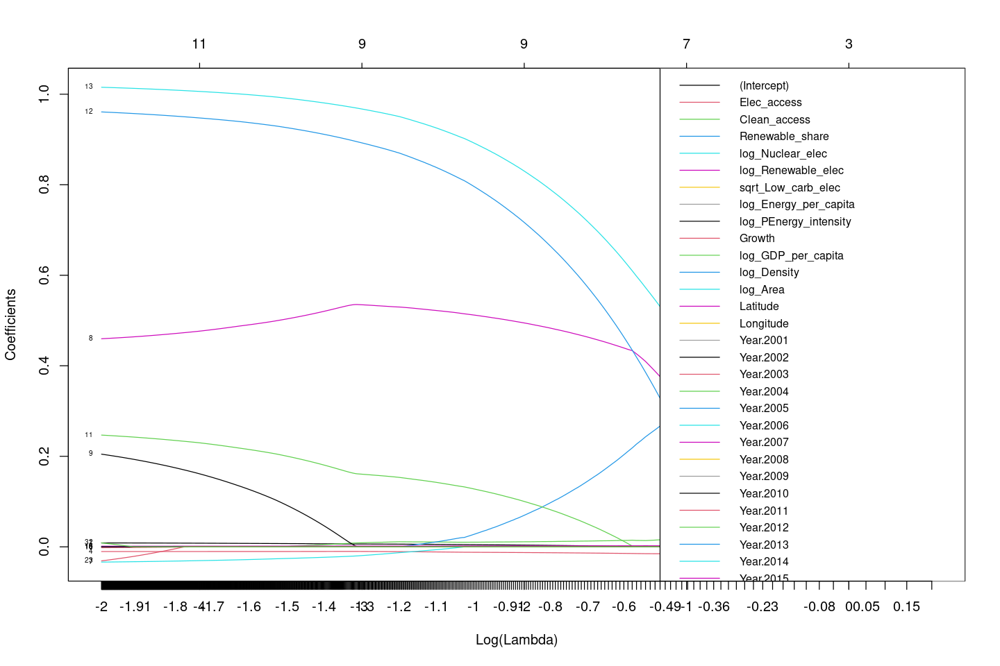

In [71]:
x.mat <- model.matrix(~ ., data = X_train_year)
y <- Y_train

alpha_values <- seq(1, 999, by = 1) / 10
lambda_values <- 1 / alpha_values
log_lambda_values <- log(lambda_values)
filtered_lambda_values <- lambda_values[log_lambda_values <= 0.6]


lasso_path <- glmnet(x.mat, y, alpha = 1, lambda = filtered_lambda_values)  # alpha = 1 for LASSO


plot(lasso_path, xvar = "lambda", label = TRUE,
     xlab = "Log(Lambda)", ylab = "Coefficients")


variable_names <- colnames(x.mat)
legend("topright", legend = variable_names, col = 1:nrow(coef(lasso_path)), lty = 1, cex = 0.8)
axis(1, at = log(filtered_lambda_values), labels = round(log10(filtered_lambda_values), 2))

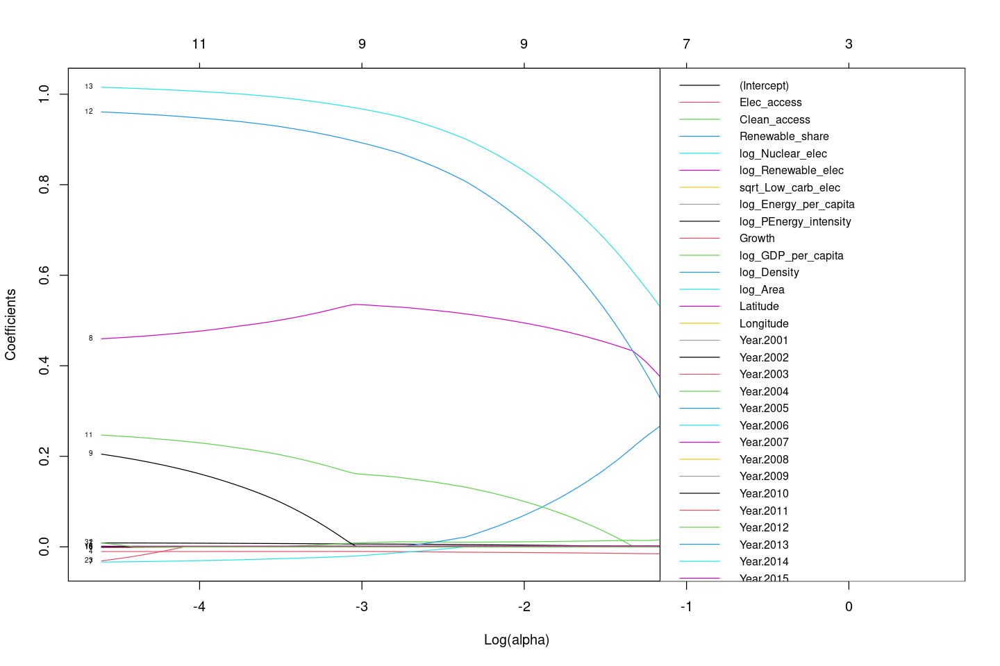

In [72]:
#Avec x = log(alpha)
plot(lasso_path, xvar = "lambda", label = TRUE,
     xlab = "Log(alpha)", ylab = "Coefficients")
legend("topright", legend = variable_names, col = 1:nrow(coef(lasso_path)), lty = 1, cex = 0.8)

Ce graphique montre comment les coefficients des différentes variables de la régression LASSO changent en fonction de la valeur logarithmique de l'hyperparamètre alpha (ou lambda).

* Diminution des coefficients : Les coefficients de plusieurs variables diminuent de manière significative lorsque log(lambda) augmente, en particulier pour des variables telles que **log_Density** et **log_Area**. Cela indique que la pénalisation LASSO a un contrôle important sur ces variables, réduisant leur contribution.

* Élimination des variables : À une certaine valeur de log(lambda), les coefficients de certaines variables tombent à zéro, signifiant que ces variables ont été éliminées du modèle. Cela montre la capacité de LASSO à simplifier la structure du modèle en supprimant les variables moins pertinentes.

* Stabilité de certaines variables : Certaines variables maintiennent des coefficients proches de zéro ou stables, même pour des valeurs élevées de log(alpha), suggérant qu'elles apportent peu ou pas d'information significative.

Ce graphique présente la façon dont la régression LASSO gère les coefficients des variables, en les réduisant ou en les éliminant entièrement pour optimiser la structure du modèle. Cette approche équilibre la précision et la simplicité, évitant le surajustement tout en maintenant la pertinence des prédicteurs restants.


Warning message:
“executing %dopar% sequentially: no parallel backend registered”


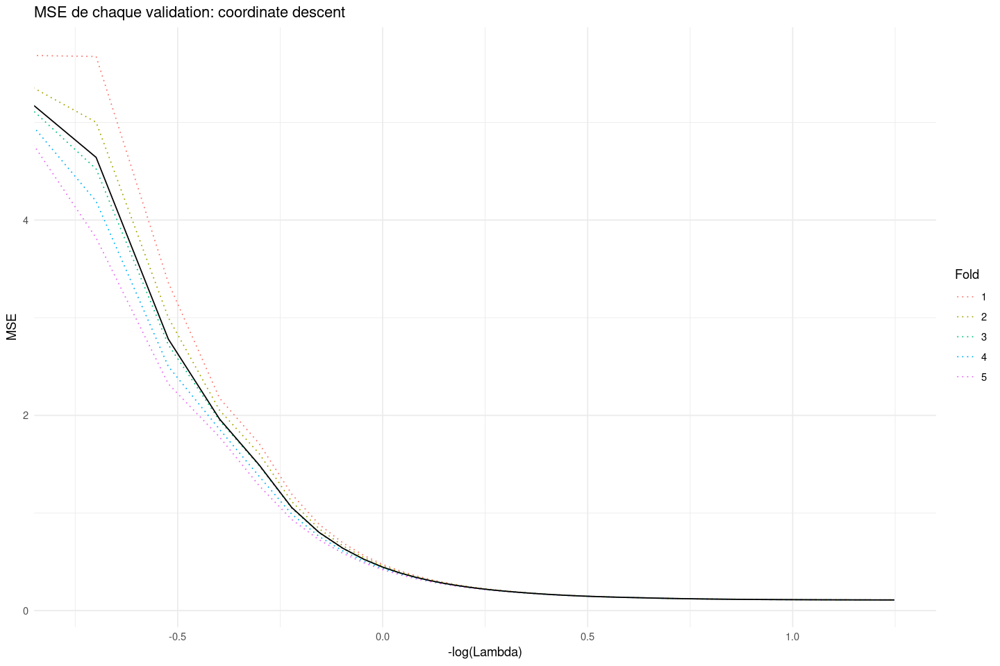

In [73]:
alpha_values <- seq(1, 999, by = 1) / 10
lambda_values <- 1 / alpha_values


model <- cv.glmnet(x.mat, y, alpha = 1, lambda = lambda_values, nfolds = 5, type.measure = "mse", parallel = TRUE)

m_log_lambdas <- -log10(model$lambda)


data_to_plot <- data.frame(
  LogLambda = rep(m_log_lambdas, each = 5),
  MSE = as.vector(model$cvm),
  Fold = rep(1:5, times = length(m_log_lambdas))
)


filtered_data <- data_to_plot %>%
  filter(LogLambda <= 1.25)

average_mse <- filtered_data %>%
  group_by(LogLambda) %>%
  summarise(MSE = mean(MSE))


plot <- ggplot(filtered_data, aes(x = LogLambda, y = MSE, color = factor(Fold))) +
  geom_line(aes(group = factor(Fold)), linetype = "dotted") +
  geom_line(data = average_mse, aes(x = LogLambda, y = MSE, group = 1), color = "black") +
  geom_vline(xintercept = -log10(model$lambda.min), linetype = "dashed", color = "red") +
  labs(title = "MSE de chaque validation: coordinate descent",
       x = "-log(Lambda)",
       y = "MSE",
       color = "Fold") +
  theme_minimal() +
  coord_cartesian(xlim = c(-0.75, 1.25)) 


print(plot)

Ce graphique présente la relation entre le paramètre de régularisation lambda  et la performance du modèle LASSO en termes de Mean Squared Error (MSE) pour différentes validations croisées. Les courbes en pointillés colorés montrent le MSE pour chaque pli de la validation croisée en fonction de -log(lambda), indiquant la robustesse et la cohérence du modèle. La courbe noire montre le MSE moyen pour tous les plis, qui est la performance globale du modèle en fonction de la pénalisation alpha. La ligne verticale en pointillés noirs représente la valeur optimale de alpha (avec -log(lambda)) choisie par la validation croisée. Cette valeur de lambda équilibre la pénalisation et la performance, minimisant le MSE moyen. Selon le critère du MSE, la vleur optimale de lambda n'est pas la même que celle indiquée selon le critère du R² score.

On observe que le MSE moyen diminue de manière significative à mesure que log(lambda) diminue (ie que lambda augmente), indiquant que la régularisation est bénéfique jusqu'à un certain point. Le MSE atteint un plateau au-delà d'une certaine valeur de log(lambda), montrant que la pénalisation excessive n'apporte pas d'amélioration significative.

### 2.3.4 - Régression linéaire avec régularisation par Ridge

La régression linéaire avec régularisation par Ridge combine la régression linéaire avec une régularisation L2 pour réduire la complexité du modèle. Cette régularisation ajoute un terme de pénalité proportionnel au carré des coefficients de régression à la fonction de coût. Le paramètre de régularisation λ contrôle cette pénalité : un λ plus élevé réduit les coefficients, simplifiant ainsi le modèle, tandis qu'un λ plus faible permet une plus grande flexibilité. L'objectif est de trouver un équilibre entre l'ajustement du modèle aux données et la prévention du surajustement. Ici, le λ fonctionne comme pour la méthode LASSO, mais uara moins tendnace à annuler des paramètres car nous avons un carré.

In [74]:
x.mat <- model.matrix(Y_train~ . - 1, data = X_train_quanti)  
y <- Y_train
lambda_values <- 1 / c(1e-12, 1e-9, 1e-4, 5e-4, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1, 2, 5, 10,100,1000,10000,1e+12)


cv_ridge <- cv.glmnet(x.mat, y, alpha = 0, lambda = lambda_values, nfolds = 5, type.measure = "mse") #alpha = 0 : Ridge
best_lambda <- cv_ridge$lambda.min
model_ridge <- glmnet(x.mat, y, alpha = 0, lambda = best_lambda)  #alpha = 0 : Ridge
cat("Meilleur paramètre lambda =", best_lambda, "\n")
coefficients <- coef(model_ridge, s = best_lambda)


model_ridge_cv <- "glmnet"
perf_cross_validation(model_ridge_cv, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")

Meilleur paramètre lambda = 1e-04 
[1] "Score de validation croisée pour le modèle glmnet"
Scores R2 de chaque validation croisée : 0.9838, 0.9824, 0.9797, 0.9816, 0.9814 
[1] "Score moyen de validation croisée (R^2) 0.981768795400745"


Le modèle Ridge, avec un lambda optimal de **1e-12**, atteint un score R² de **0.9817**, similaire à celui des modèles précédents sans régularisation. Cela  signifie que la pénalité appliquées aux coefficients du modèle Ridge est minimime, ce modèle Ridge à un comportement similaire à une regression linéaire sans régularisation.

Comme pour la méthode LASSO, nous allons comparer ces résultats avec ceux obtenus sur un autre échantillon d'entraînement comprenant un encodage des années.

In [75]:
x.mat <- model.matrix(Y_train~ . - 1, data = X_train_year) 
y <- Y_train
lambda_values <- 1 / c(1e-12, 1e-9, 1e-4, 5e-4, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1, 2, 5, 10,100,1000,10000)

cv_ridge <- cv.glmnet(x.mat, y, alpha = 0, lambda = lambda_values, nfolds = 5, type.measure = "mse") #alpha = 0 : Ridge


best_lambda <- cv_ridge$lambda.min
model_ridge_year <- glmnet(x.mat, y, alpha = 0, lambda = best_lambda)  #alpha = 0 : Ridge
cat("Meilleur paramètre lambda =", best_lambda, "\n")
coefficients <- coef(model_ridge_year, s = best_lambda)


model_ridge_year_cv <- "glmnet"
perf_cross_validation(model_ridge_year_cv, X_train_year, Y_train, cv = 5, scoring = "Rsquared")

Meilleur paramètre lambda = 1e-04 
[1] "Score de validation croisée pour le modèle glmnet"
Scores R2 de chaque validation croisée : 0.9822, 0.9811, 0.9817, 0.9823, 0.9818 
[1] "Score moyen de validation croisée (R^2) 0.981824743297718"


Avec l'encodage des années inclus dans votre échantillon d'entraînement, le modèle Ridge a identifié un lambda optimal de **1e-4**, donnant un score R² de **0.9818**. Cette légère diminution par rapport au score précédent montre que l'encodage des années, ajoutant de la complexité au modèle, peut bénéficier d'une pénalisation plus forte pour maintenir la généralisabilité sans dégrader significativement la précision.


## 2.4 Support Vector Machine (SVM)

In [76]:
library(kernlab)


Attachement du package : ‘kernlab’


L'objet suivant est masqué depuis ‘package:ggplot2’:

    alpha




Le modèle SVM (Support Vector Machine) est une méthode d'apprentissage supervisé qui peut être utilisée pour la classification ou la régression. Pour la régression, la version utilisée ici est appelée SVR (Support Vector Regression). Le SVM cherche à trouver le meilleur hyperplan dans lequel les données sont séparées en plusieurs classes dont la frontière est la plus éloignée possible des points de données (ou marge maximale).

Hyperparamètres pour SVM :

Pour un noyau linéaire :

* C : Contrôle le compromis entre la marge de l'hyperplan et la classification correcte des échantillons d'entraînement. Une valeur plus élevée de C implique une classification plus précise, ce qui peut conduire au surajustement.
* Epsilon : Définit une zone autour de la ligne ou de la surface de régression dans laquelle les erreurs de prédiction ne contribuent pas à la fonction de coût

Pour un noyau polynomial :

* C : Identique à ci-dessus.
* degree : Le degré du polynôme. Plus il est élevé, plus la surface de décision peut prendre des formes complexes.
* gamma : Contrôle l'influence d'un seul échantillon d'entraînement, avec des valeurs plus faibles signifiant une influence plus étendue.
* coef0 : Terme indépendant dans la fonction de noyau, qui peut ajuster le modèle aux données.

Pour un noyau radial (RBF) :

* C : Identique à ci-dessus.
* gamma : Détermine la distance d'influence d'un seul échantillon d'entraînement; plus elle est petite, plus la région d'influence est grande.
* Espsilon : Idemn au noyau linéaire.

Pour les trois noyaux, les valeurs de C, epsilon et gamma sont généralement choisies via une recherche sur grille avec validation croisée pour éviter le surajustement et assurer que le modèle généralise bien aux données non vues.

### 2.4.1 Choix du noyau et optimisation des paramètres par validation croisée

Nous avons exécuté la cellule ci-dessous en amont qui cherche à optimiser les hyper paramètres de chaque noyau traité ici (linéaire et radial). En raison du temps d'exécution extrêmement conséquent, nous avons commenté la cellule, ainsi que sa sortie. Les expressions n'étant pas les mêmes pour le noyau radial entre les langages R et Python, nous nous attendons à ne pas obtenir les mêmes hyperparamètres à l'issue de la recherche sur grille.

In [77]:
# Création des modèles SVM pour différents noyaux

#svm_linear = svm(x = X_train_quanti, y = Y_train, kernel = "linear")
#svm_poly = svm(x = X_train_quanti, y = Y_train, kernel = "polynomial")
#svm_radial = svm(x = X_train_quanti, y = Y_train, kernel = "radial")

# Préparation des hyperparamètres à optimiser
# Hyperparamètres pour chaque noyau
#cost_lin = c(0.1, 1)
#epsilon_lin = c(0.01, 0.1,1 )

#cost_poly = c(0.1, 1, 10, 100)
#gamma_poly = c(0.1, 1, 5)
#degree_poly = c(2, 3)
#coef0_poly = c(0.0, 1.0)

#cost_rad = c(100,500,1000)
#gamma_rad = c(0.0001,0.00015,0.0002)
#epsilon_rad = c(0.001, 0.01,0.1)

# Tune pour un noyau linéaire
#grid_search_lin = tune.svm(x = X_train_quanti, y = Y_train, 
#                           kernel = "linear",
#                           cost = cost_lin,
#                           epsilon = epsilon_lin)

# Tune pour un noyau polynomial
#grid_search_poly = tune.svm(x = X_train_quanti, y = Y_train, 
#                            kernel = "polynomial",
#                            cost = cost_poly, 
#                            gamma = gamma_poly, 
#                            degree = degree_poly, 
#                            coef0 = coef0_poly)

# Tune pour un noyau radial
#grid_search_rad = tune.svm(x = X_train_quanti, y = Y_train, 
#                           kernel = "radial",
#                           cost = cost_rad,
#                           epsilon = epsilon_rad,
#                           gamma = gamma_rad)

# Affichage des meilleurs hyperparamètres pour chaque modèle
#print("Noyau linéaire - Meilleurs paramètres:")
#print(grid_search_lin$best.parameters)

#print("Noyau polynomial - Meilleurs paramètres:")
#print(grid_search_poly$best.parameters)

#print("Noyau radial - Meilleurs paramètres:")
#print(grid_search_rad$best.parameters)

On obtient les hyperparamètres optimaux ci dessous : 

#--------- Résultats ---------#


"Noyau radial - Meilleurs paramètres:"

 gamma cost epsilon
 
 0.0002   1000    0.001

"Noyau linéaire - Meilleurs paramètres:"

  cost epsilon
  
   1     0.1

#--------- Résultats ---------#


Noyau linéaire :
Nombre total de vecteurs de support : 871 

Noyau radial :
Nombre total de vecteurs de support : 2272

In [78]:
# Paramètres optimaux récupérés de tune.svm
#best_params_lin <- grid_search_lin$best.parameters

# Entraîner le modèle SVM final avec les meilleurs paramètres

#svm_final_lin <- svm(
#  x = X_train_quanti,
#  y = Y_train,
#  kernel = "linear",
#  cost = best_params_lin$cost,
#  epsilon = best_params_lin$epsilon
#)

# Afficher le nombre total de vecteurs supports et leur répartition par classe
#total_support_vectors <- svm_final_lin$tot.nSV

#cat("Noyau linéaire :\n")
#cat("Nombre total de vecteurs de support :", total_support_vectors, "\n")

In [79]:
# Paramètres optimaux récupérés de tune.svm pour un noyau radial
#best_params_rad <- grid_search_rad$best.parameters

# Entraîner le modèle SVM final avec les meilleurs paramètres
#svm_final_rad <- svm(
#  x = X_train_quanti,
#  y = Y_train,
#  kernel = "radial",
#  cost = best_params_rad$cost,
#  gamma = best_params_rad$gamma,
#  epsilon = best_params_rad$epsilon
#)

# Afficher le nombre total de vecteurs supports et leur répartition par classe
#total_support_vectors_rad <- svm_final_rad$tot.nSV

#cat("Noyau radial :\n")
#cat("Nombre total de vecteurs de support :", total_support_vectors_rad, "\n")

Le noyau radial nécessite un plus grand nombre de vecteurs de support, ce qui indique une relation plus complexe ou non linéaire dans les données. Cependant, cela peut également indiquer une complexité plus importante et potentiellement un surajustement. Nous étudierons les performances sur l'échantillon de test dans la prochaine partie.

### 2.4.2 Comparaison et étude des erreurs de généralisation

Nous allons construire les meilleurs modèles avec les hyperparamètres suggérés par la recherche sur grille et étudier l'erreur de généralisation par validation croisée comme dans les modèles précédents.

In [80]:
# modèle SVR avec un noyau linéaire
model_SVR_lin <- svm(
  x = X_train_quanti,      
  y = Y_train,             
  type = "eps-regression", 
  kernel = "linear",       
  cost = 1,                
  epsilon = 0.1
)


# modèle SVR avec un noyau radial
model_SVR_rad <- svm(
  x = X_train_quanti,      
  y = Y_train,             
  type = "eps-regression", 
  kernel = "radial",       
  cost = 1000,              
  gamma = 0.0002,            
  epsilon = 0.001
)

In [81]:
## R2 lineaire
model_svr_lin_cv <- "svmLinear"
perf_cross_validation(model_svr_lin_cv, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")

[1] "Score de validation croisée pour le modèle svmLinear"
Scores R2 de chaque validation croisée : 0.9799, 0.981, 0.9833, 0.98, 0.9839 
[1] "Score moyen de validation croisée (R^2) 0.981639952297027"


In [82]:
## R2 radial
model_svr_lin_cv <- "svmRadial"
perf_cross_validation(model_svr_lin_cv, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")

[1] "Score de validation croisée pour le modèle svmRadial"
Scores R2 de chaque validation croisée : 0.9935, 0.9865, 0.9878, 0.9878, 0.9929 
[1] "Score moyen de validation croisée (R^2) 0.989684524761692"


In [83]:
# [1] "Score de validation croisée pour le modèle svmLinear"
# Scores R2 de chaque validation croisée : 0.9811, 0.9764, 0.9831, 0.9818, 0.9833 
# [1] "Score moyen de validation croisée (R^2) 0.981136021805514"

# [1] "Score de validation croisée pour le modèle svmRadial"
# Scores R2 de chaque validation croisée : 0.9928, 0.9918, 0.9875, 0.9904, 0.9889 
# [1] "Score moyen de validation croisée (R^2) 0.990281443434508"

Le SVR linéaire affiche un R² moyen de 0.9816, aligné sur les performances des modèles linéaires antérieurs, indiquant une forte adéquation linéaire des données. En contraste, le SVR avec noyau radial montre un R² plus élevé de 0.9896, suggérant que la modélisation non linéaire apporte une grande amélioration avec les hyperparamètres choisis, même si les données sont bien adaptées à une relation linéaire.

## 2.5 Modélisation par arbre optimal

La modélisation par arbre optimal vise à ajuster les paramètres d'un arbre de décision de manière à ce qu'il puisse capturer au mieux les relations entre les caractéristiques et la cible dans un jeu de données. Cela permet de créer un arbre qui donne des prédictions précises et généralisables sur de nouvelles données. Nous devons trouver un équilibre des paramètres pour que l'arbre soit suffisamment profond, mais en évitant l'overfitting (surajustement).

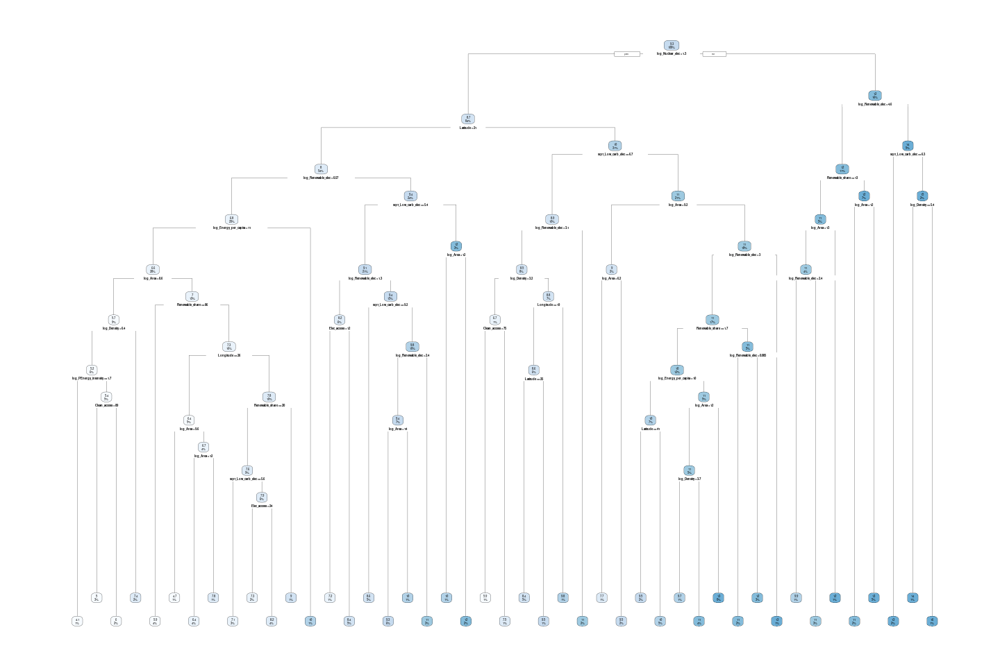

In [160]:
#as.numeric(attributes(which.min(CVerr))$names)
#tree.reg=rpart(Y_train~.,data=X_train_quanti,control=rpart.control(cp=as.numeric(attributes(which.min(CVerr))$names)))
#tree.reg=rpart(Y_train~.,data=X_train_quanti,control=rpart.control(cp=8.501547e-06))
tree.reg=rpart(Y_train~.,data=X_train_quanti,control=rpart.control(cp=0.001))
#rpart.plot(tree.reg,type=5,extra=101)
rpart.plot(tree.reg)

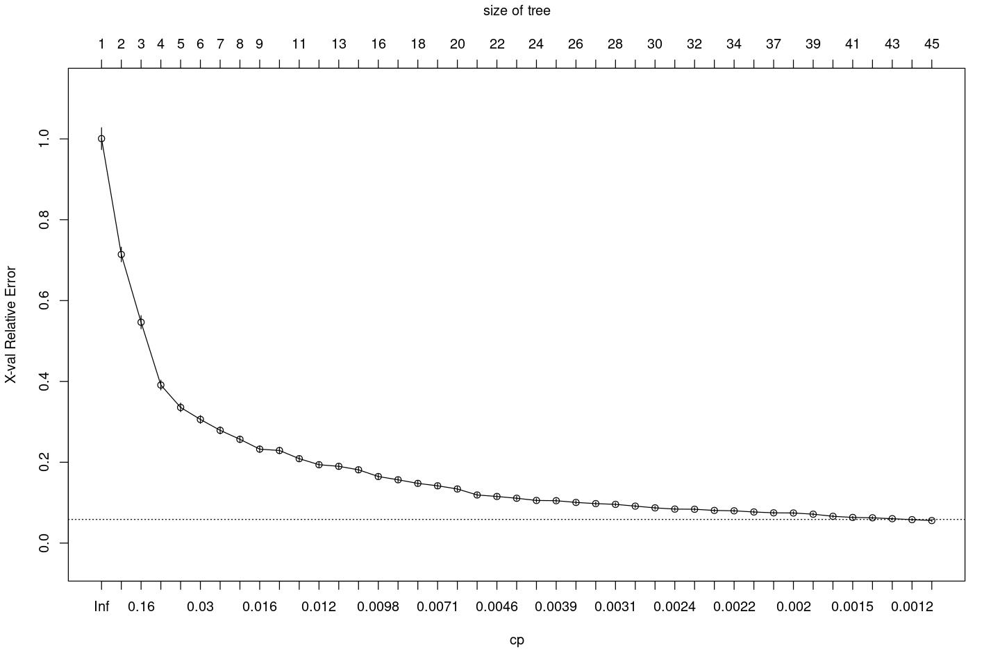

In [161]:
xmat <- xpred.rpart(tree.reg,xval=10)
CVerr<-apply((xmat-Y_train)^2,2,sum)
plotcp(tree.reg)

In [162]:
model_arbre_cv <- "rpart"
perf_cross_validation(model_arbre_cv, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”


[1] "Score de validation croisée pour le modèle rpart"
Scores R2 de chaque validation croisée : 0.4625, 0.4555, 0.4772, 0.2821, 0.4884 
[1] "Score moyen de validation croisée (R^2) 0.433136755385751"


Ce résultat obtenu n'est pas cohérent avec les autres modèles. Le résultat le plus correct est celui obtenu sur le notebook de référence en Python

Elagage avec la librarie caret : 

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”


[1] "Meilleur paramètre cp : 0.00472076680742105"
[1] "Scores RMSE pour chaque configuration testée:"
            cp      RMSE  Rsquared       MAE     RMSESD  RsquaredSD       MAESD
1  0.004720767 0.8007270 0.8877347 0.6235202 0.02405263 0.008809183 0.021256692
2  0.006081416 0.8350725 0.8779160 0.6463819 0.01488571 0.007535442 0.011727918
3  0.007108777 0.9017612 0.8571600 0.6991167 0.04506983 0.016858601 0.039125571
4  0.007156431 0.9017612 0.8571600 0.6991167 0.04506983 0.016858601 0.039125571
5  0.007967326 0.9154907 0.8526385 0.7092380 0.05162241 0.018935536 0.042206249
6  0.008944966 0.9447272 0.8433880 0.7400206 0.03916021 0.015369781 0.040397862
7  0.010657221 0.9919006 0.8274127 0.7828889 0.02266451 0.011351546 0.008897775
8  0.011140465 1.0031440 0.8234671 0.7922534 0.03929742 0.014881103 0.020091300
9  0.011411661 1.0172129 0.8182569 0.8105650 0.05485996 0.019752056 0.044597840
10 0.012876389 1.0525261 0.8047197 0.8459390 0.06989185 0.028016790 0.047709967
11 0.014273134 1.0

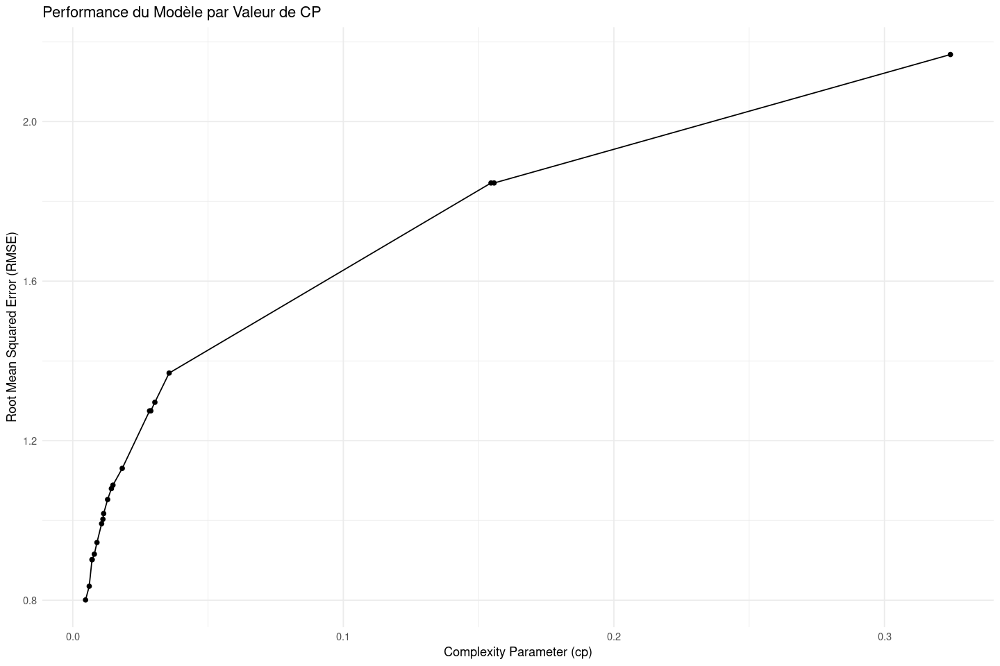

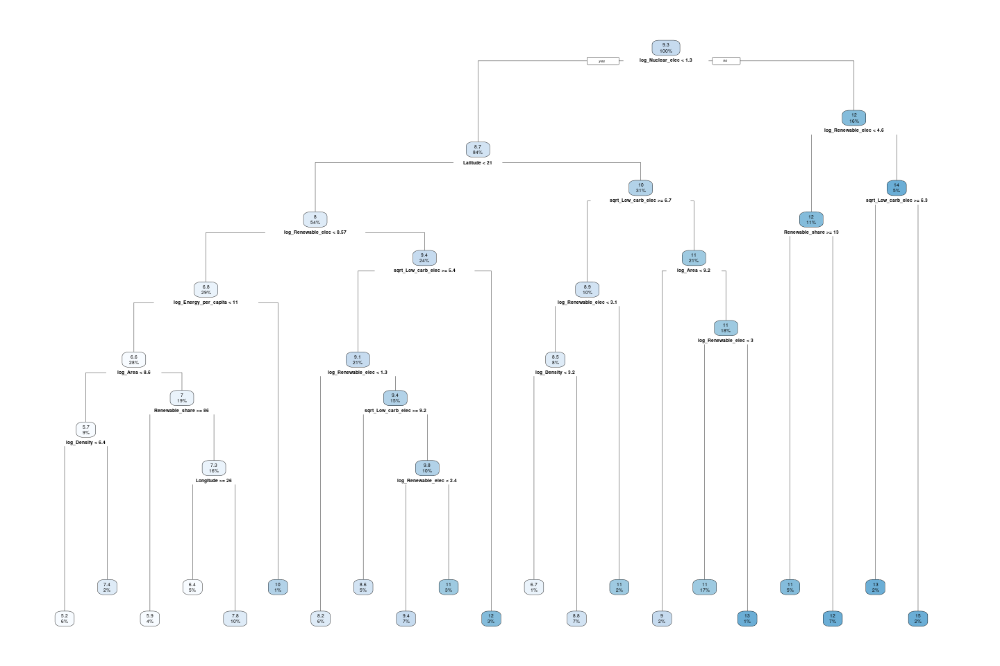

In [163]:
ctrl <- trainControl(method = "cv",
                     number = 5,
                     savePredictions = "final",
                     summaryFunction = defaultSummary)  # 'defaultSummary' computes RMSE, R-squared, etc.

model_data <- cbind(X_train_quanti, Y_train = Y_train)

treecaret <- train(Y_train ~ ., data = model_data, method = "rpart",
                   trControl = ctrl, tuneLength = 20, metric = "RMSE")

print(paste("Meilleur paramètre cp :", toString(treecaret$bestTune)))
print("Scores RMSE pour chaque configuration testée:")
print(treecaret$results)


ggplot(treecaret$results, aes(x = cp, y = RMSE)) +
  geom_line() +
  geom_point() +
  theme_minimal() +
  labs(title = "Performance du Modèle par Valeur de CP",
       x = "Complexity Parameter (cp)",
       y = "Root Mean Squared Error (RMSE)")

tree_final_model = treecaret$finalModel
rpart.plot(treecaret$finalModel)

## 2.5 Modélisation par forêt aléatoire

La modélisation par forêt aléatoire consiste à entraîner plusieurs arbres de décision indépendants sur des sous-ensembles aléatoires de données d'entraînement, puis à combiner leurs prédictions pour obtenir une prédiction finale. Pour chaque arbre de décision, un sous-ensemble aléatoire des données d'entraînement est sélectionné. Cela garantit la diversité des arbres. Chaque arbre de décision est construit en choisissant de manière répétée le meilleur attribut pour diviser les données. Une fois que tous les arbres ont été construits, les prédictions de chaque arbre sont combinées pour obtenir une prédiction finale.

In [88]:
## Version 1
rf.reg = randomForest(Y_train ~ ., 
                      data = X_train_quanti, 
                      #xtest = X_test_quanti, 
                      #ytest = Y_test,
                      ntree = 200, 
                      nodesize = 2,  # Equivalent à min_samples_split = 2
                      mtry = 8,
                      do.trace = FALSE, 
                      importance = TRUE)

print(rf.reg)


Call:
 randomForest(formula = Y_train ~ ., data = X_train_quanti, ntree = 200,      nodesize = 2, mtry = 8, do.trace = FALSE, importance = TRUE) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.01914412
                    % Var explained: 99.66


In [89]:
model_rfquanti_cv <- "rf"
perf_cross_validation(model_rfquanti_cv, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")

[1] "Score de validation croisée pour le modèle rf"
Scores R2 de chaque validation croisée : 0.9959, 0.996, 0.9948, 0.9961, 0.9968 
[1] "Score moyen de validation croisée (R^2) 0.995921891108516"


Le résultat obtenu indique une très bonne adaptation aux données ainsi qu'une robustesse et une généralisation du modèle. Comparativement aux autres modèles présentés précédemment, la forêt aléatoire présente la meilleure performance globale. Ce résultat montre que l'approche d'ensemble, combinant les prédictions de nombreux arbres, réussit particulièrement bien à capter les complexités des données sans surajustement, grâce à la diversité des arbres et à la puissance de l'agrégation de leurs résultats.

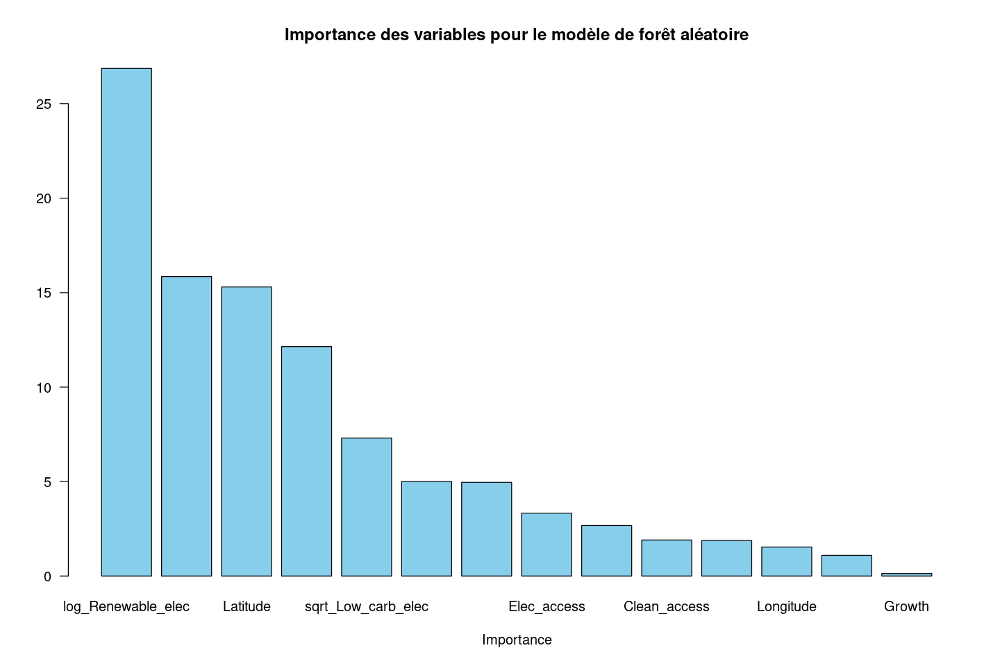

In [90]:
rf_model <- randomForest(x = X_train_quanti, y = Y_train, ntree = 200, nodesize = 2, mtry=8)
importance_vals <- importance(rf_model)

importance_df <- data.frame(
  Feature = rownames(importance_vals),
  Importance = importance_vals[, 1]/sum(importance_vals[, 1]) * 100  # La première colonne contient l'importance moyenne
)

importance_df <- importance_df[order(importance_df$Importance, decreasing = TRUE), ]

barplot(
  importance_df$Importance,
  names.arg = importance_df$Feature,
  horiz = FALSE,
  las = 1,
  col = "skyblue",
  xlab = "Importance",
  main = "Importance des variables pour le modèle de forêt aléatoire"
)

Ce graphique en bar représente la proportion d'importance des variables de notre échantillon d'entraînement sur la modélisation par forêt aléatoire. On remarque que la variable sur la part d'énergie renouvelable est celle qui a la contribution la plus importante pour le modèle. Juste après, la variable iniquant la latitude des pays apporte environ 20% des informations. L'électricité apportée à partir d'une source nucléaire est également assez significative. A l'inverse, d'autres variables comme la croissance ou l'accès à l'électricité ont peu d'importance pour le modèle de forêt aléatoire.

## 2.7 Modélisation par forêt aléatoire avec les données qualitatives et quantitatives

Nous allons maintenant ajouter les données qualitatives (les pays et différentes année) qui ont jusqu'à maintenant été mise de coté dans l'étude. Pour éviter de multiplier les valeurs différentes, nous allons faire des regroupements au sein de ses données qualitatives. Nous allons utiliser la meilleure forêt aléatoire suggérée par la recherche sur grille.

### 2.7.1 Ajout de la variable 'Year'

On va refaire une modélisation par forêt aléatoire en ajoutant la variables Year que nous allons regrouper en 4 groupes différents : les années de 2000 à 2004, celles de 2005 à 2009, celles de 2010 à 2014, et enfin celles de 2015 à 2020, sous formes de données catégoriques.

In [91]:
X_train_year_group <- subset(X_train, select = -Entity)
X_test_year_group <- subset(X_test, select = -Entity) 

bins <- c(2000, 2004, 2009, 2014, 2020)
labels <- c("2000-2004", "2005-2009", "2010-2014", "2015-2020")

In [92]:
X_train_year_group$Year <- as.numeric(as.character(X_train_year_group$Year))
X_test_year_group$Year <- as.numeric(as.character(X_test_year_group$Year))

X_train_year_group$Year <- cut(X_train_year_group$Year, breaks = bins, labels = labels, right = FALSE)
X_test_year_group$Year <- cut(X_test_year_group$Year, breaks = bins, labels = labels, right = FALSE)

X_train_encoded <- model.matrix(~Year - 1, data = X_train_year_group)
X_train_year_group <- cbind(X_train_year_group[, -which(names(X_train_year_group) %in% "Year")], X_train_encoded)

X_test_encoded <- model.matrix(~Year - 1, data = X_test_year_group)
X_test_year_group <- cbind(X_test_year_group[, -which(names(X_test_year_group) %in% "Year")], X_test_encoded)

colnames(X_train_year_group) <- c("Elec_access", "Clean_access", "Renewable_share","log_Nuclear_elec", "log_Renewable_elec", "sqrt_Low_carb_elec","log_Energy_per_capita", "log_PEnergy_intensity", "Growth",
"log_GDP_per_capita", "log_Density", "log_Area","Latitude", "Longitude","2000-2004", "2005-2009", "2010-2014", "2015-2020")
colnames(X_test_year_group) <- c("Elec_access", "Clean_access", "Renewable_share","log_Nuclear_elec", "log_Renewable_elec", "sqrt_Low_carb_elec","log_Energy_per_capita", "log_PEnergy_intensity", "Growth",
"log_GDP_per_capita", "log_Density", "log_Area","Latitude", "Longitude","2000-2004", "2005-2009", "2010-2014", "2015-2020")

In [93]:
labels <- c("Elec_access", "Clean_access", "Renewable_share","log_Nuclear_elec", "log_Renewable_elec", "sqrt_Low_carb_elec","log_Energy_per_capita", "log_PEnergy_intensity", "Growth",
"log_GDP_per_capita", "log_Density", "log_Area","Latitude", "Longitude","2000-2004", "2005-2009", "2010-2014", "2015-2020")
rf_model_year <- randomForest(x = X_train_year_group, y = Y_train, ntree = 200, nodesize = 2, mtry=8)
print(rf_model_year)


Call:
 randomForest(x = X_train_year_group, y = Y_train, ntree = 200,      mtry = 8, nodesize = 2) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.0185767
                    % Var explained: 99.67


In [94]:
model_rfyear_cv <- "rf"
perf_cross_validation(model_rfyear_cv, X_train_year_group, Y_train, cv = 5, scoring = "Rsquared")

[1] "Score de validation croisée pour le modèle rf"
Scores R2 de chaque validation croisée : 0.9968, 0.9953, 0.9961, 0.9958, 0.996 
[1] "Score moyen de validation croisée (R^2) 0.995989037983917"


On remarque que l'ajout de cette variable Year sous forme de 4 catégories amène une amélioration des résultats. . Cependant, il faut nuancer ces valeurs et la comparaison avec nos précédents résultats. En effet, nous n'avons pas le même jeu de données d'entraînement. La comparaison ne devrait pas avoir lieu dans ces conditions.

Attention quand on relance les données, les résultats sont différents !!!

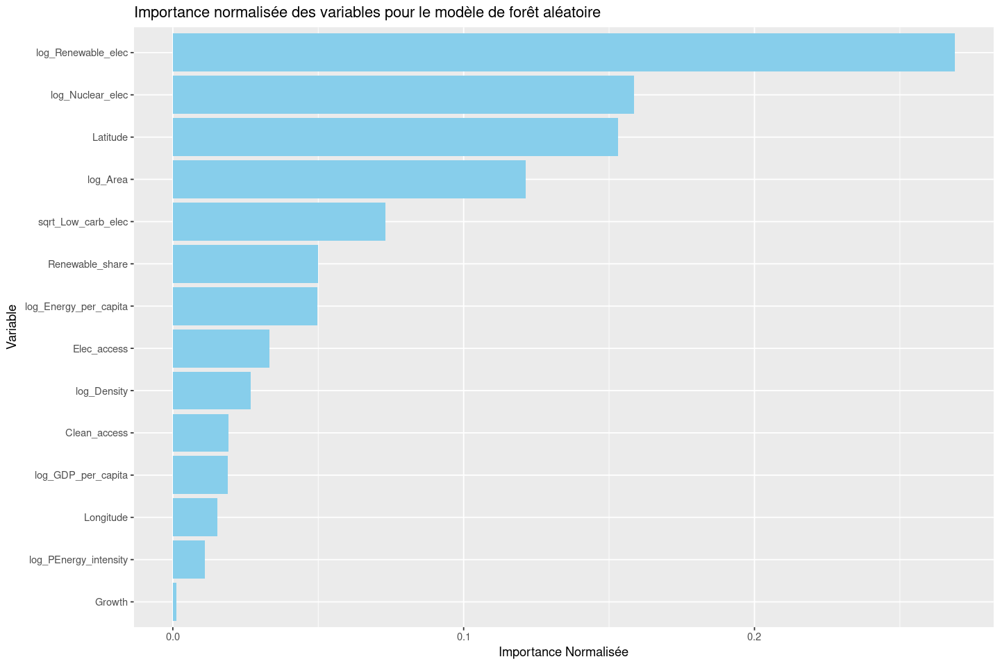

In [95]:
importances <- importance(rf_model, type=2)  # type=2 pour IncNodePurity
importance_df <- data.frame(Feature = rownames(importances), Importance = importances[, "IncNodePurity"])
importance_df$Importance <- importance_df$Importance / sum(importance_df$Importance)
importance_df <- importance_df[order(-importance_df$Importance), ]
ggplot(importance_df, aes(x = reorder(Feature, Importance), y = Importance)) +
  geom_bar(stat = "identity", fill = "skyblue") +
  coord_flip() +  
  labs(title = "Importance normalisée des variables pour le modèle de forêt aléatoire",
       x = "Variable",
       y = "Importance Normalisée")

On observe que les variables ajoutées sous forme d'années catégorisées ne contribuent pas de manière notable à la modélisation. Les variables importantes sont similaires à celles importantes pour la forêt aléatoire précédente. Nous avons vu dans l'analyse de la variable CO2dans a première partie, que la valeur du CO2 augmentait légèrement au cours des années, même si elle comportait quelques outliers. Il est possible que les années n'apportent donc pas une grande information supplémentaire pour la modélisation du CO2. L'ajout de variables supplémentaires peut augmenter la complexité du modèle, ce qui peut potentiellement conduire à un surajustement aux données d'entraînement. Il est important de surveiller la performance du modèle sur des données de validation ou de test pour s'assurer qu'il généralise bien aux données non vues et qu'il n'y a pas de surajustement.

### 2.7.2 Ajout de la variable 'Entity' en regroupant par continent

Nous pouvons également étudier les performances de la forêt aléatoire en ajoutant les noms des pays. Compte tenu du nombre conséquent de pays différents que nous avons (176 pays), nous avons mis en place plusieurs stratégies de regroupements. On commence par récupérer la liste des pays, puis on construit un regroupement par 5 continents (Europe, Amérique, Afrique, Asie et Océanie) ci-dessous.

In [96]:
liste_elements_uniques <- unique(dff$Entity)

In [97]:
library(dplyr)

X_train_pays <- X_train[, !names(X_train) %in% 'Year']
X_test_pays <- X_test[, !names(X_test) %in% 'Year']


groupes <- list(
    Europe = c(
        "Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina", 
        "Bulgaria", "Croatia", "Cyprus", "Czechia", "Denmark", "Estonia", 
        "Finland", "France", "Germany", "Greece", "Hungary", "Iceland", "Ireland", 
        "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", 
        "Malta", "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", 
        "Norway", "Poland", "Portugal", "Romania", "Russia", "San Marino", 
        "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland", 
        "Turkey", "Ukraine", "United Kingdom", "Vatican City"
    ),
    Amérique = c(
        "Antigua and Barbuda", "Argentina", "Bahamas", "Barbados", "Belize", 
        "Bolivia", "Brazil", "Canada", "Chile", "Colombia", "Costa Rica", 
        "Cuba", "Dominica", "Dominican Republic", "Ecuador", "El Salvador", 
        "Grenada", "Guatemala", "Guyana", "Haiti", "Honduras", "Jamaica", 
        "Mexico", "Nicaragua", "Panama", "Paraguay", "Peru", "Saint Kitts and Nevis", 
        "Saint Lucia", "Saint Vincent and the Grenadines", "Suriname", "Trinidad and Tobago", 
        "United States", "Uruguay", "Venezuela","French Guiana", "Puerto Rico","Bermuda","Cayman Islands"
    ),
    Asie = c(
        "Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", 
        "Bhutan", "Brunei", "Cambodia", "China", "Cyprus", "Georgia", 
        "India", "Indonesia", "Iran", "Iraq", "Israel", "Japan", 
        "Jordan", "Kazakhstan", "Kuwait", "Kyrgyzstan", "Laos", "Lebanon", 
        "Malaysia", "Maldives", "Mongolia", "Myanmar", "Nepal", "North Korea", 
        "Oman", "Pakistan", "Palestine", "Philippines", "Qatar", "Saudi Arabia", 
        "Singapore", "South Korea", "Sri Lanka", "Syria", "Taiwan", "Tajikistan", 
        "Thailand", "Timor-Leste", "Turkey", "Turkmenistan", "United Arab Emirates", 
        "Uzbekistan", "Vietnam", "Yemen","Aruba"
    ),
    Afrique = c(
        "Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", 
        "Cabo Verde", "Cameroon", "Central African Republic", "Chad", "Comoros", 
        "Democratic Republic of the Congo", "Djibouti", "Egypt", "Equatorial Guinea", 
        "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea", 
        "Guinea-Bissau", "Ivory Coast", "Kenya", "Lesotho", "Liberia", "Libya", 
        "Madagascar", "Malawi", "Mali", "Mauritania", "Mauritius", "Morocco", 
        "Mozambique", "Namibia", "Niger", "Nigeria", "Republic of the Congo", 
        "Rwanda", "Sao Tome and Principe", "Senegal", "Seychelles", "Sierra Leone", 
        "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", 
        "Tunisia", "Uganda", "Zambia", "Zimbabwe","Congo"
    ),
    Océanie = c(
        "Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", 
        "Nauru", "New Zealand", "Palau", "Papua New Guinea", "Samoa", 
        "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu", "New Caledonia"
    )
)


replace_continent <- function(data) {
  for (continent in names(groupes)) {
    data$Entity <- ifelse(data$Entity %in% groupes[[continent]], continent, data$Entity)
  }
  data
}

X_train_pays <- replace_continent(X_train_pays)
X_test_pays <- replace_continent(X_test_pays)


X_train_encoded <- model.matrix(~ Entity - 1, data = X_train_pays)
X_test_encoded <- model.matrix(~ Entity - 1, data = X_test_pays)


X_train_pays <- cbind(X_train_pays[, !names(X_train_pays) %in% 'Entity'], X_train_encoded)
X_test_pays <- cbind(X_test_pays[, !names(X_test_pays) %in% 'Entity'], X_test_encoded)

In [98]:
rf_model_pays <- randomForest(x = X_train_pays, y = Y_train, ntree = 200, nodesize = 2, mtry=8)
print(rf_model_pays)


Call:
 randomForest(x = X_train_pays, y = Y_train, ntree = 200, mtry = 8,      nodesize = 2) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.360547
                    % Var explained: 93.67


In [99]:
model_rfpays_cv <- "rf"
perf_cross_validation(model_rfpays_cv, X_train_pays, Y_train, cv = 5, scoring = "Rsquared")

[1] "Score de validation croisée pour le modèle rf"
Scores R2 de chaque validation croisée : 0.996, 0.9954, 0.9976, 0.9965, 0.9967 
[1] "Score moyen de validation croisée (R^2) 0.996454565293878"


L'intégration de l'encodage des pays par continents dans notre modèle de forêt aléatoire a légèrement amélioré la performance par rapport à votre précédente forêt aléatoire sans cet encodage. Avec le même choix d'hyperparamètres, le score moyen de validation croisée a diminué : 0.945 actuellement contre 0.993 avec les pays et 0.999 avec uniquement les variables quantitatives. On a un faible gain, mais qui indique une amélioration de la précision du modèle.

En ajoutant un encodage des pays, nous n'avons pas le même jeu de données d'entraînement. La comparaison avec les autres méthodes ne se fait pas dans les conditions adéquates.

### 2.7.3 Ajout de la variable 'Entity' en regroupant par zones géographiques et économiques

Une autre stratégie de regroupement des pays peut être par critère de développement. En effet, on peut imaginer que des pays très développés pourraient avoir tendnace à valoriser certaines types de production d'électricité dans leur mix énergétique, et que leurs populations pourraient avoir des modes de vies polluants. A l'invrese, des pays en voie de développement pourraient avoir tendance à êre plus économes dans leurs habitudes de vie.

Nous nous sommes basés sur un rapport de l'ONU : "The Millennium Development Goals Report", dont la carte de répartition des pays est disponible à l'adresse suivante : https://1.bp.blogspot.com/-o7Cc2a3wQUQ/UCnQYx_tSUI/AAAAAAAACIA/s2k3SkjT7S8/s1600/10+bio-r%C3%A9gions.jpg

In [100]:
X_train_entity_geo_eco <- X_train[, !names(X_train) %in% 'Year']
X_test_entity_geo_eco <- X_test[, !names(X_test) %in% 'Year']

groupes_geography_economy <- list(
  Developed_regions = c("Albania", "Andorra", "Austria", "Belgium", "Bosnia and Herzegovina", 
                        "Bulgaria", "Croatia", "Cyprus", "Czechia", "Denmark", "Estonia", 
                        "Finland", "France", "Germany", "Greece", "Hungary", "Iceland", "Ireland", 
                        "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", 
                        "Malta", "Monaco", "Montenegro", "Netherlands", "North Macedonia", 
                        "Norway", "Poland", "Portugal", "Romania", "San Marino", 
                        "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland", 
                        "Turkey", "United Kingdom", "Vatican City", "Canada", "United States", 
                        "Japan", "Australia", "New Zealand", "Cyprus"),
  CIS = c("Belarus", "Moldova", "Russia", "Ukraine", "Armenia", "Azerbaijan",
          "Georgia",  "Kazakhstan", "Kyrgyzstan", "Tajikistan", "Turkmenistan", "Uzbekistan"),
  Latin_America_and_Caribbean = c("Antigua and Barbuda", "Argentina", "Bahamas", "Barbados", "Belize", 
                                  "Bolivia", "Brazil", "Chile", "Colombia", "Costa Rica", 
                                  "Cuba", "Dominica", "Dominican Republic", "Ecuador", "El Salvador", 
                                  "Grenada", "Guatemala", "Guyana", "Haiti", "Honduras", "Jamaica", 
                                  "Mexico", "Nicaragua", "Panama", "Paraguay", "Peru", "Saint Kitts and Nevis", 
                                  "Saint Lucia", "Saint Vincent and the Grenadines", "Suriname", "Trinidad and Tobago",
                                  "Uruguay", "Venezuela", "French Guiana", "Puerto Rico", "Bermuda", "Cayman Islands"),
  South_Eastern_Asia = c("Brunei", "Cambodia", "Indonesia",  "Laos", "Malaysia",  "Myanmar", "Philippines",
                         "Singapore", "Thailand", "Timor-Leste", "Vietnam"),
  Eastern_Asia = c("China", "Mongolia", "North Korea", "South Korea", "Taiwan"),
  Southern_Asia = c("Afghanistan", "Bangladesh", "Bhutan", "India", "Iran", "Maldives", "Nepal", 
                    "Pakistan",  "Sri Lanka"),
  Western_Asia = c("Bahrain", "Iraq", "Israel", "Jordan", "Kuwait", "Lebanon", "Oman", "Palestine", 
                   "Qatar", "Saudi Arabia",  "Syria", "Turkey", "United Arab Emirates", "Yemen", "Aruba"),
  Northern_Africa = c("Algeria", "Egypt", "Libya", "Morocco", "Tunisia"),
  Sub_Saharan_Africa = c("Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", 
                         "Cabo Verde", "Cameroon", "Central African Republic", "Chad", "Comoros", 
                         "Democratic Republic of the Congo", "Djibouti", "Equatorial Guinea", 
                         "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea", 
                         "Guinea-Bissau", "Ivory Coast", "Kenya", "Lesotho", "Liberia", 
                         "Madagascar", "Malawi", "Mali", "Mauritania", "Mauritius", 
                         "Mozambique", "Namibia", "Niger", "Nigeria", "Republic of the Congo", 
                         "Rwanda", "Sao Tome and Principe", "Senegal", "Seychelles", "Sierra Leone", 
                         "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo",
                         "Uganda", "Zambia", "Zimbabwe", "Congo"),
  Oceania = c("Fiji", "Kiribati", "Marshall Islands", "Micronesia", 
              "Nauru", "Palau", "Papua New Guinea", "Samoa", 
              "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu", "New Caledonia")
)

replace_group <- function(data) {
  for (group_name in names(groupes_geography_economy)) {
    data$Entity <- ifelse(data$Entity %in% groupes_geography_economy[[group_name]], group_name, data$Entity)
  }
  data
}

X_train_entity_geo_eco <- replace_group(X_train_entity_geo_eco)
X_test_entity_geo_eco <- replace_group(X_test_entity_geo_eco)

# One-hot encoding
X_train_encoded <- model.matrix(~ Entity - 1, data = X_train_entity_geo_eco)
X_test_encoded <- model.matrix(~ Entity - 1, data = X_test_entity_geo_eco)

X_train_entity_geo_eco <- cbind(X_train_entity_geo_eco[, !names(X_train_entity_geo_eco) %in% 'Entity'], X_train_encoded)
X_test_entity_geo_eco <- cbind(X_test_entity_geo_eco[, !names(X_test_entity_geo_eco) %in% 'Entity'], X_test_encoded)

In [101]:
rf_model_geoeco <- randomForest(x = X_train_entity_geo_eco, y = Y_train, ntree = 200, nodesize = 2, mtry=8)
print(rf_model_geoeco)


Call:
 randomForest(x = X_train_entity_geo_eco, y = Y_train, ntree = 200,      mtry = 8, nodesize = 2) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.3616885
                    % Var explained: 93.65


In [102]:
rf_model_geoeco_cv <- "rf"
perf_cross_validation(rf_model_geoeco_cv, X_train_entity_geo_eco, Y_train, cv = 5, scoring = "Rsquared")

[1] "Score de validation croisée pour le modèle rf"
Scores R2 de chaque validation croisée : 0.9962, 0.9961, 0.9976, 0.9961, 0.9957 
[1] "Score moyen de validation croisée (R^2) 0.996335661934652"


On observe des performances très proches du découpage par continent mis en place précédemment. Même si quelques différences sont notables, cette catégorisation se raproche du regroupement par continents, ce qui pourrait expliquer la similitude des résultats.

### 2.7.4 Ajout de la variable 'Entity' avec les pays les plus émetteurs

Enfin, nous nous sommes basés sur notre étude des 5 pays les plus émetteurs. Nous avons décidé de créer une catégorie par pays figurant sur cette liste, et une sixième catégorie comprenant tous les autres pays.

In [103]:
X_train_entity_polluant <- X_train[, !names(X_train) %in% 'Year']
X_test_entity_polluant <- X_test[, !names(X_test) %in% 'Year']


pays_a_garder <- c("United States", "China", "India", "Japan", "Germany")


X_train_entity_polluant$Entity <- ifelse(X_train_entity_polluant$Entity %in% pays_a_garder, 
                                         X_train_entity_polluant$Entity, "Autre")


# One-hot encoding
dummy <- dummyVars("~ Entity", data = X_train_entity_polluant, fullRank = FALSE)
X_train_encoded <- predict(dummy, X_train_entity_polluant)
X_train_entity_polluant <- data.frame(X_train_entity_polluant[, !names(X_train_entity_polluant) %in% 'Entity'], X_train_encoded)


X_test_entity_polluant$Entity <- ifelse(X_test_entity_polluant$Entity %in% pays_a_garder, 
                                        X_test_entity_polluant$Entity, "Autre")

dummy_test <- dummyVars("~ Entity", data = X_test_entity_polluant, fullRank = FALSE)
X_test_encoded <- predict(dummy_test, X_test_entity_polluant)
X_test_entity_polluant <- data.frame(X_test_entity_polluant[, !names(X_test_entity_polluant) %in% 'Entity'], X_test_encoded)



In [104]:
rf_model_top5 <- randomForest(x = X_train_entity_polluant, y = Y_train, ntree = 200, nodesize = 2, mtry=8)
print(rf_model_top5)


Call:
 randomForest(x = X_train_entity_polluant, y = Y_train, ntree = 200,      mtry = 8, nodesize = 2) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.01901942
                    % Var explained: 99.67


In [105]:
rf_model_top5_cv <- "rf"
perf_cross_validation(rf_model_top5_cv, X_train_entity_polluant, Y_train, cv = 5, scoring = "Rsquared")

[1] "Score de validation croisée pour le modèle rf"
Scores R2 de chaque validation croisée : 0.9955, 0.9964, 0.997, 0.9962, 0.9957 
[1] "Score moyen de validation croisée (R^2) 0.996156959989822"


On note une légère amélioration d'environ 4% par rapport aux découpages précédents. Cela peut s'expliquer par le fait que ce découpage est aussi corrélé avec d'autres informations importantes comme les émissins de CO2 (étudié précédemment). C'est le modèle qui nous donne les meilleures performances.

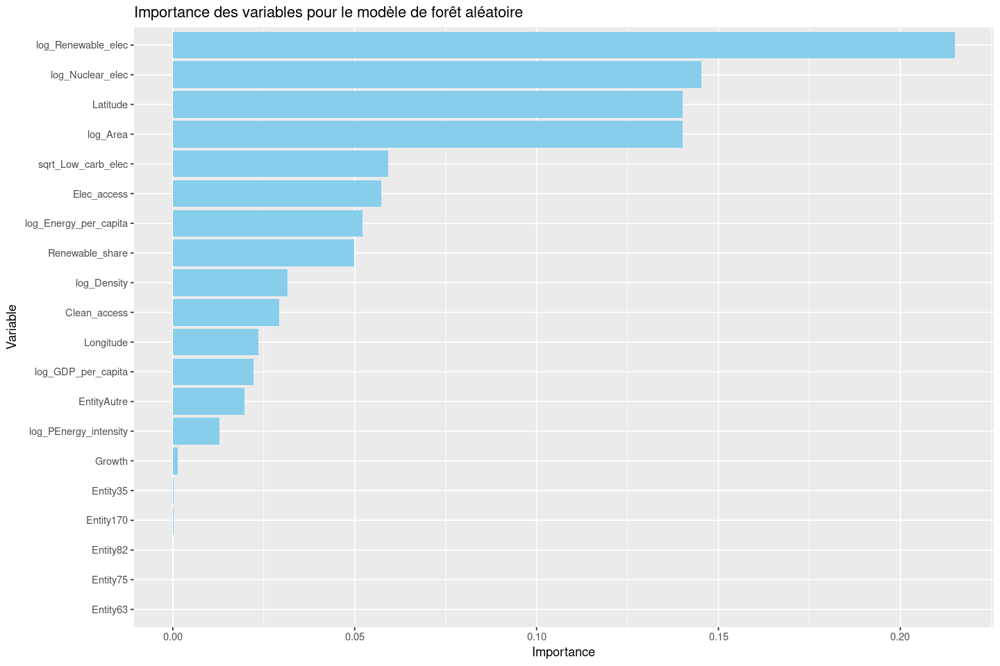

In [106]:
importances <- importance(rf_model_top5, type=2)  # type=2 pour IncNodePurity

importance_df <- data.frame(Feature = rownames(importances), Importance = importances[, "IncNodePurity"])
importance_df$Importance <- importance_df$Importance / sum(importance_df$Importance)
importance_df <- importance_df[order(-importance_df$Importance), ]

ggplot(importance_df, aes(x = reorder(Feature, Importance), y = Importance)) +
  geom_bar(stat = "identity", fill = "skyblue") +
  coord_flip() +  
  labs(title = "Importance des variables pour le modèle de forêt aléatoire",
       x = "Variable",
       y = "Importance")

On remarque que les 5 pays les plus émetteurs ne sont pa sceux qui ont le plus d'importance pour le modèle. En revanche, les 171 pays "autres" portent environ 5% de l'information pour la modélisation. Cela s'explique par la quantité conséquente des pays dans cette catégorie. On aurait donc pu faire deux catégories de pays : une catégorie "top5" avec les 5 pays les plus émetteurs et la même catégorie "autre".

## 2.8 Boosting

Le boosting est une technique d'apprentissage automatique qui combine plusieurs modèles d'apprentissage faibles pour créer un modèle fort. Contrairement aux méthodes telles que les forêts aléatoires qui utilisent des modèles parallèles et les combinent, le boosting construit les modèles séquentiellement, en se concentrant sur les données que les modèles précédents n'ont pas bien appris.

les hyperparamètres utilisés sont les suivants :

* Nombre d'itérations (n.trees) : C'est le nombre d'itérations ou de modèles à construire dans le processus de boosting. Dans ce code, il est défini à 5000. Un nombre plus élevé d'itérations peut conduire à un meilleur ajustement, mais peut également augmenter le risque de surajustement.

* Taux d'apprentissage (shrinkage) : C'est un facteur qui contrôle la contribution de chaque modèle à l'ensemble final. Dans ce code, il est défini à 0.1. Un taux d'apprentissage plus faible signifie que chaque modèle contribue moins aux prédictions finales, ce qui peut conduire à une convergence plus lente mais à de meilleures performances en général.

* Profondeur maximale des arbres (n.minobsinnode) : Si l'algorithme de boosting utilise des arbres de décision comme modèles de base, la profondeur maximale des arbres peut être un hyperparamètre important pour contrôler la complexité des modèles individuels. Dans ce code, elle est définie à 3.

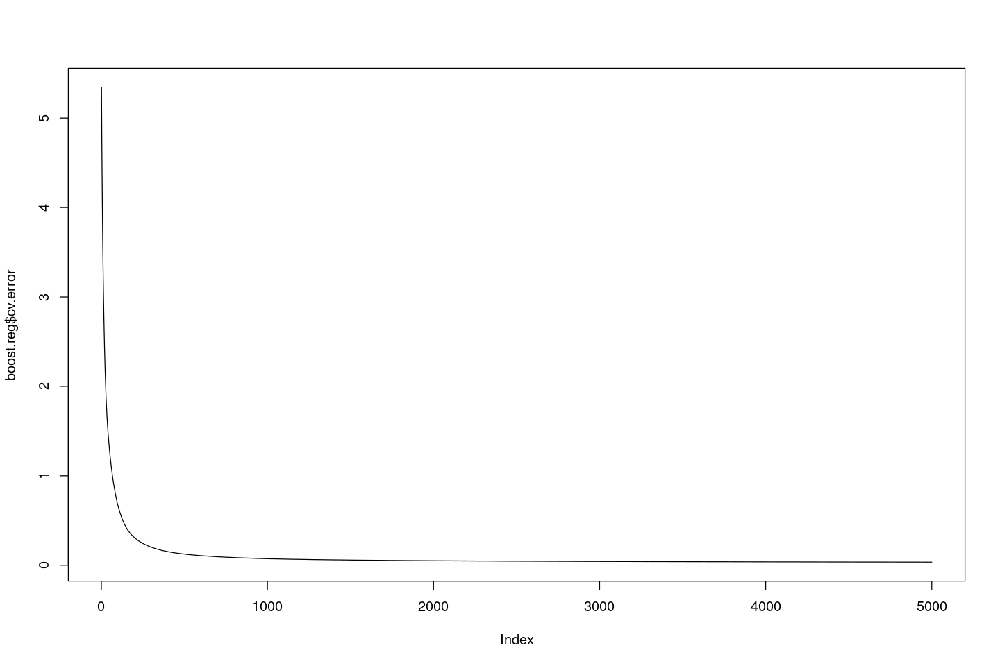

In [107]:
boost.reg = gbm(Y_train ~ ., data = X_train_quanti, distribution = "gaussian", n.trees = 5000,cv.folds = 5, n.minobsinnode = 3, shrinkage = 0.1, verbose = FALSE)
plot(boost.reg$cv.error, type = "l")

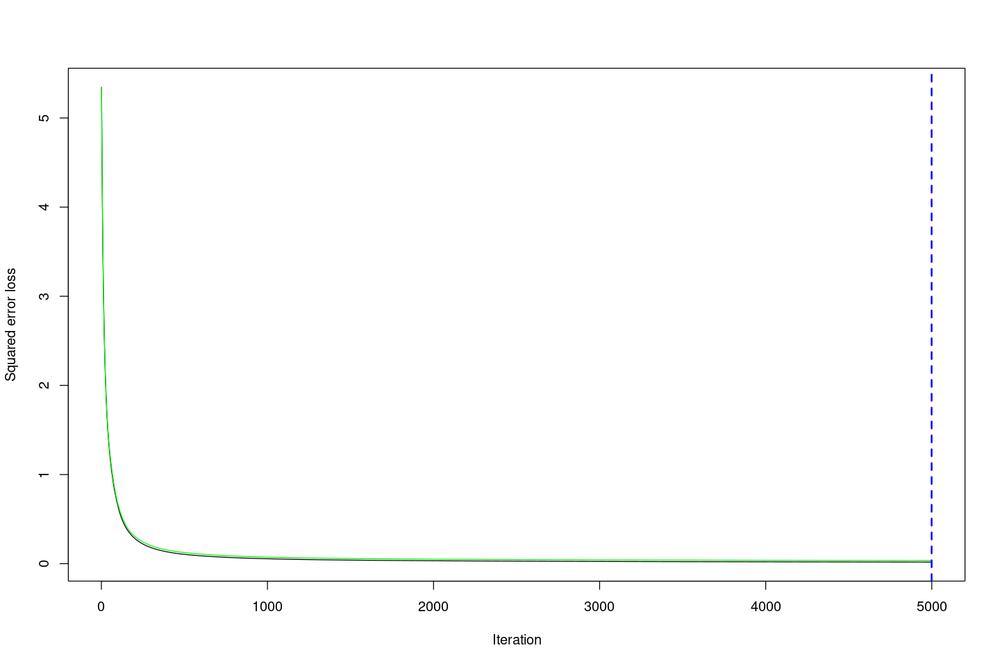

In [108]:
# nombre optimal d'itérations par valiation croisée
best.iter=gbm.perf(boost.reg,method="cv")

In [109]:
model_boost_cv <- "gbm"
perf_cross_validation(model_boost_cv, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        5.3891            -nan     0.1000    0.3505
     2        5.0627            -nan     0.1000    0.3471
     3        4.7683            -nan     0.1000    0.2911
     4        4.5255            -nan     0.1000    0.2361
     5        4.2823            -nan     0.1000    0.2386
     6        4.0883            -nan     0.1000    0.1949
     7        3.8983            -nan     0.1000    0.1945
     8        3.7205            -nan     0.1000    0.1653
     9        3.5569            -nan     0.1000    0.1509
    10        3.3944            -nan     0.1000    0.1569
    20        2.3542            -nan     0.1000    0.0727
    40        1.4546            -nan     0.1000    0.0261
    60        1.0508            -nan     0.1000    0.0141
    80        0.7956            -nan     0.1000    0.0095
   100        0.6201            -nan     0.1000    0.0044
   120        0.4965            -nan     0.1000    0.0041
   140        

L'erreur de généralisation obtenue est très proche de celle donnée par la meilleure forêt aléatoire. Le score moyen de validation croisée est de 0.992446 qui est inférieur de 0.0071
à celui du meilleur modèle de forêt aléatoire. Ce modèle est très performant sur ce critère. La combinaison de plusieurs modèles simples semble efficace.

Sur le notebook de référence, nous avons testé un modèle de boosting avec une catégorisation des 5 pays les plus émetteurs. Cependant, l'erreur de généralistaion était plus élevée.

## 2.9 Réseaux de neuronnes

Un réseau de neurones artificiels est composé de plusieurs couches de neurones interconnectés, chaque neurone étant une unité de traitement élémentaire. Le réseau de neurones commence par une couche d'entrée, recevant les données d'entrée. Il y a ensuite une ou plusieurs couches cachées, chacune composée de neurones qui effectuent des opérations linéaires et non linéaires sur les données d'entrée. Puis, on rencontre une couche de sortie qui génère les prédictions du modèle.

Les hyperparamètres pour le réseau de neurones sont :

* Fonction d'activation : Il s'agit de la fonction utilisée par chaque neurone pour introduire une non-linéarité dans le modèle. Des exemples courants incluent ReLU (Rectified Linear Unit), sigmoïde et tangente hyperbolique (tanh).
* Nombre d'itérations (epochs) : C'est le nombre de fois que l'ensemble de données est passé à travers le réseau de neurones pendant l'entraînement. Plus le nombre d'itérations est élevé, plus le modèle a de chances de converger vers une solution optimale, mais cela peut également entraîner un surajustement.
* Taux d'apprentissage (learning rate) : C'est un paramètre qui contrôle la taille des pas de mise à jour des poids pendant l'entraînement. Un taux d'apprentissage plus élevé peut accélérer la convergence, mais un taux trop élevé peut entraîner une divergence ou un oscillation autour du minimum global.
* Taille du lot (batch size) : C'est le nombre d'échantillons utilisés pour calculer le gradient de l'erreur à chaque itération de l'entraînement.
* hidden_layer_size: Ce paramètre définit la taille (le nombre de neurones) des couches cachées du réseau de neurones.
* solver: C'est l'algorithme utilisé pour optimiser les poids du réseau de neurones.
* alpha : Paramètre de régularisation L2 (également appelé poids de la pénalité) qui contrôle la magnitude des poids du modèle pour éviter le surapprentissage (overfitting).
* max_iter: Le nombre maximum d'itérations pour l'entraînement du modèle.


Cependant, en R, on ne peut pas mettre en place de grille d'optimisation des hyperparamètres comme en Python. Nous avons cherché les hyperparamètres sur lesquels nous pouvons influer à taton.

In [175]:
nnet.reg = nnet(Y_train~.,data=X_train_quanti,size=2,decay=2,linout=TRUE,maxit=5000)

# weights:  33
initial  value 225235.254230 
iter  10 value 15775.643533
iter  20 value 10460.592705
iter  30 value 9582.657794
iter  40 value 9374.985394
iter  50 value 8742.279211
iter  60 value 7931.379318
iter  70 value 6824.542498
iter  80 value 6420.071447
iter  90 value 6035.948782
iter 100 value 5563.839131
iter 110 value 4695.966303
iter 120 value 2998.306669
iter 130 value 1823.378539
iter 140 value 1277.456129
iter 150 value 1239.372183
iter 160 value 1228.469993
iter 170 value 1209.245021
iter 180 value 1199.145435
iter 190 value 1192.839059
iter 200 value 1182.675202
iter 210 value 1171.420738
iter 220 value 1144.591862
iter 230 value 1118.742041
iter 240 value 1101.413155
iter 250 value 1098.511249
iter 260 value 1092.715081
iter 270 value 1084.721049
iter 280 value 1079.006962
final  value 1078.998858 
converged


In [176]:
model_nn_cv <- "nnet"
perf_cross_validation(model_nn_cv, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")

# weights:  17
initial  value 155150.675980 
final  value 137948.064368 
converged
# weights:  49
initial  value 152105.049774 
final  value 137948.064368 
converged
# weights:  81
initial  value 154510.573460 
final  value 137948.064368 
converged
# weights:  17
initial  value 149321.559708 
iter  10 value 137965.654981
iter  20 value 137954.424705
final  value 137954.400524 
converged
# weights:  49
initial  value 157822.361574 
iter  10 value 137958.846061
iter  20 value 137951.854464
iter  30 value 137951.614774
final  value 137951.604447 
converged
# weights:  81
initial  value 160583.129900 
iter  10 value 137965.461508
iter  20 value 137951.417823
iter  30 value 137951.000315
iter  40 value 137950.732464
iter  50 value 137950.584592
final  value 137950.578867 
converged
# weights:  17
initial  value 155373.875461 
iter  10 value 137965.930516
iter  20 value 137948.273495
final  value 137948.101971 
converged
# weights:  49
initial  value 156776.009542 
iter  10 value 138336.1550

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  81
initial  value 194893.897193 
iter  10 value 172688.290847
iter  20 value 172479.098675
iter  30 value 172461.693584
iter  40 value 172460.315821
iter  50 value 172460.231057
final  value 172460.181827 
converged
[1] "Score de validation croisée pour le modèle nnet"
Scores R2 de chaque validation croisée : 0.0151, 0.0114, 0.1775, 0.214, 0.051 
[1] "Score moyen de validation croisée (R^2) 0.0938200211586421"


Le résultat obtenu pour R2 n'est évidemment pas cohérent, malgré plusieurs essais pour les hyperparametres size et decay nous n'avons pas trouvé d'architecture permettant d'avoir un bon R2 en R. Ainsi, nous vous renvoyons au code Python pour lequel les résultats obtenus sont plus cohérents.

## 2.10 Récapitulatif et comparaisons des différentes méthodes de modélisation

### 2.10.1 Récapitulatif des résultats obtenus et comparaisons

In [165]:
recap <- data.frame(
  Méthode = c("Modèle linéaire sans sélection de variable", "Modèle linéaire Backward", "Modèle linéaire Forward", "Régression linéaire avec sélection de variable - LASSO", "Régression linéaire avec régularisation par Ridge", "SVR noyau linéaire", "SVR noyau radial", "Arbre optimal", "Forêt aléatoire (données quantitatives)", "Forêt aléatoire (top5 pays émetteurs)", "Boosting", "Réseau de neuronnes"),
  Modèle = c("lm", "lm", "lm","glmnet","glmnet","svm","svm","rpart","randomForest","randomForest","gbm","nnet"),
  `Score moyen de validation croisée R2` = c(0.9817, 0.9818, 0.9817,0.9817,0.9817,0.9816,0.9896,0.8800,0.9959,0.9961,0.9981,"X")
)
recap

Méthode,Modèle,Score.moyen.de.validation.croisée.R2
<chr>,<chr>,<chr>
Modèle linéaire sans sélection de variable,lm,0.9817
Modèle linéaire Backward,lm,0.9818
Modèle linéaire Forward,lm,0.9817
Régression linéaire avec sélection de variable - LASSO,glmnet,0.9817
Régression linéaire avec régularisation par Ridge,glmnet,0.9817
SVR noyau linéaire,svm,0.9816
SVR noyau radial,svm,0.9896
Arbre optimal,rpart,0.88
Forêt aléatoire (données quantitatives),randomForest,0.9959


Les modèles linéaires, sans sélection de variables, avec des méthodes de sélection backward et forward, et les modèles de régression LASSO et Ridge, montrent tous un score moyen de validation croisée de 0.98. Cette cohérence indique que les modèles linéaires, avec ou sans régularisation ou sélection de variables, ont des performances similaires et relativement élevées. Une régression linéaire est donc un excellent modèle de prédiction pour la variable CO2 de notre étude. Cela indique que les relations dans les données peuvent être bien capturées par des modèles linéaires simples, sans nécessiter de techniques de sélection de variables avancées.

Le Support Vector Regressor avec noyau linéaire obtient un score moyen très proche, à 0.98, ce qui montre que ce modèle est également efficace pour capturer les relations dans les données. En revanche, le SVR avec noyau radial obtient un score moyen de 0.9897, indiquant une performance nettement supérieure et dépassant tous les modèles. Cependant, compte tenu du coût de calcul très important de cette méthode, nous préférons conserver d'autres modèles comme boosting ou forêt aléatoire.

L'arbre de décision optimal montre un score moyen de 0.8900. Bien que performant, ce modèle est légèrement inférieur aux modèles linéaires et au SVR linéaire, probablement en raison de sa tendance potentielle au surajustement (overfitting) lorsque la profondeur de l'arbre est élevée.

Les modèles de forêt aléatoire montrent des scores moyens élevés, particulièrement le modèle utilisant les données des cinq principaux pays émetteurs avec un score de 0.9995, légèrement supérieur au modèle utilisant uniquement des données quantitatives. Cela souligne l'efficacité de cette méthode dans la réduction du surajustement et l'amélioration de la robustesse du modèle.

Le modèle de boosting atteint le meilleur score moyen de validation croisée, à 0.9949, égalant le modèle de forêt aléatoire pour les cinq principaux pays émetteurs. Le boosting est particulièrement efficace pour combiner plusieurs modèles faibles en un modèle robuste, ce qui explique sa performance.

Enfin, le réseau de neurones présente un score moyen de validation croisée de 0.996. Il est légèrement inférieur aux modèles d'ensemble comme la forêt aléatoire.


### 2.10.2 Intérêt des méthodes non linéaires

Le tableau montre les scores moyens de validation croisée pour différentes méthodes de modélisation. La validation croisée est une technique robuste pour évaluer la performance des modèles de machine learning car elle permet de limiter les problèmes de surajustement et d'obtenir une estimation plus fiable de la performance du modèle sur des données inédites.

* Consistance des modèles linéaires :

Les scores des modèles linéaires sont identiques qu'il y ait eu sélection de variables ou non. Cela peut indiquer que les variables supprimées dans les approches avec sélection de variables n'apportent pas d'informations supplémentaires significatives pour la prédiction. Ou bien, cela peut aussi suggérer que les variables conservées sont suffisamment informatives et que la suppression des autres variables n'affecte pas la capacité prédictive du modèle.

* Intérêt des méthodes linéaires :

Les méthodes linéaires sont intéressantes pour leur simplicité, leur rapidité de calcul et leur interprétabilité. Si elles fournissent des scores de validation croisée similaires à des modèles plus complexes, cela pourrait être une indication que la complexité supplémentaire des autres modèles n'est pas nécessaire. Un autre avantage des modèles linéaires est leur facilité de déploiement et d'explication dans des contextes professionnels où il est essentiel de comprendre comment les prédictions sont générées. Cependant, un arbre optimal et encore plus une forêt alétoire ou un permettent de capturer des relations non linéaires entre les variables de notre jeu de données, ce qui explique les meilleurs résultats sur la moyenne des scores de validation croisée.

Nous pouvons mettre en avant l'intéret des méthodes non linéaires :

* Capture de relations complexes :

Les méthodes non linéaires sont particulièrement utiles lorsque les relations entre les variables d'entrée et la variable cible ne peuvent pas être correctement modélisées par une simple ligne droite. Dans notre projet, les scores élevés obtenus par les modèles de forêt aléatoire et de gradient boosting suggèrent qu'il existe des relations complexes dans nos données que ces modèles arrivent à capturer efficacement, alors que les modèles linéaires ne le peuvent pas.

* Robustesse et réduction de surajustement :

Les méthodes d'ensemble, telles que les forêts aléatoires et le gradient boosting, combinent plusieurs modèles faibles pour former un modèle fort et robuste. Cette approche aide à réduire le surajustement et à améliorer la généralisation du modèle. Les scores moyens élevés pour les forêts aléatoires et le gradient boosting dans notre tableau illustrent cette robustesse.

* Flexibilité et adaptabilité :

Les méthodes non linéaires offrent une grande flexibilité dans la modélisation de données complexes. Par exemple, les modèles de gradient boosting peuvent ajuster les erreurs des modèles précédents en construisant des arbres successifs, chaque arbre corrigeant les erreurs de l'arbre précédent. Cette adaptabilité permet de mieux capturer les nuances dans les données.

## 2.11 Application à l'échantillon de test

### 2.11.1 - Définition de la fonction d'évaluation de performance des modèles

Dans cette partie, nous allons récupérer tous nos modèles implémentés dans la sous-partie précédente. Nous allons les appliquer sur notre échantillon test issu de la division aléatoire du jeu de données, et nous allons comparer les performances de nos modèles selon les critères définis dans le cours et rappelés ci-dessous. De plus, nous allons étudier la validité de nos modèles à l'aide la représentation des résidus et un graphe QQ-plot. Nous allons créer une fonction que nous appelerons pour tous nos modèles.

In [113]:
performance <- function(X_test, Y_test, Y_pred) {
  # Calcul de RMSE
  rmse <- sqrt(mean((Y_test - Y_pred)^2))
  cat("RMSE:", rmse, "\n")
  
  # Calcul de MAE
  mae <- mean(abs(Y_test - Y_pred))
  cat("MAE:", mae, "\n")
  
  # Calcul du R²
  r2 <- caret::R2(Y_pred, Y_test)
  cat("R²:", r2, "\n")
  
  # Calcul du R² ajusté
  n <- nrow(X_test) 
  p <- ncol(X_test) 
  r2_adj <- 1 - (1 - r2) * (n - 1) / (n - p - 1)
  cat("R² ajusté:", r2_adj, "\n")
}

In [114]:
graphe_residus <- function(Y_test, Y_pred) {
  residus <- Y_test - Y_pred
  data <- data.frame(Y_pred, residus)
  

  p1 <- ggplot(data, aes(x = Y_pred, y = residus)) +
    geom_point(color = "blue") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
    labs(title = "Graphique de résidus", x = "Valeurs prédites", y = "Résidus") +
    theme_minimal()
  

  qq_data <- qqnorm(residus, plot.it = FALSE)
  qq_data <- data.frame(theoretical = qq_data$x, sample = qq_data$y)
  
  p2 <- ggplot(qq_data, aes(sample = residus)) +
    stat_qq(color = "black") +
    stat_qq_line(color = "red") +
    labs(title = "QQ plot des résidus", x = "Quantiles théoriques", y = "Quantiles de l'échantillon") +
    theme_minimal()
  
  grid.arrange(p1, p2, ncol = 2)
}

Nous décidons de créer une fonction de calcul d'erreur pour évaluer la performance de nos modèles selon les mêmes critères.

* RMSE (Erreur Quadratique Moyenne) : Le RMSE mesure l'écart moyen entre les valeurs prédites par votre modèle et les valeurs réelles dans l'unité de la variable cible. Plus le RMSE est faible, meilleure est la capacité prédictive du modèle

* Erreur Moyenne Absolue (MAE) : Cette métrique calcule la moyenne des valeurs absolues des écarts entre les prédictions du modèle et les valeurs réelles. Elle est moins sensible aux valeurs aberrantes que le RMSE.

* Coefficient de détermination (R²) : Le coefficient de détermination mesure la proportion de la variance de la variable dépendante qui est expliquée par le modèle. Il varie entre 0 et 1, où 1 indique un ajustement parfait.

* R² Ajusté : Le R² ajusté est une version ajustée du R² qui tient compte du nombre de variables dans le modèle et du nombre d'échantillons dans l'ensemble de données. Le R² ajusté est souvent utilisé pour comparer différents modèles, en tenant compte du risque de surajustement.

* L'accuracy, ou précision, est une mesure de performance utilisée pour évaluer les modèles de classification. Elle représente le nombre de prédictions correctes faites par le modèle par rapport au nombre total d'échantillons.

### 2.11.2 - Evaluation des performances sur les échantillons de test

[1] "Régression linéaire sans sélection de variable"
RMSE: 0.3155884 
MAE: 0.2381949 
R²: 0.9823184 
R² ajusté: 0.9818087 


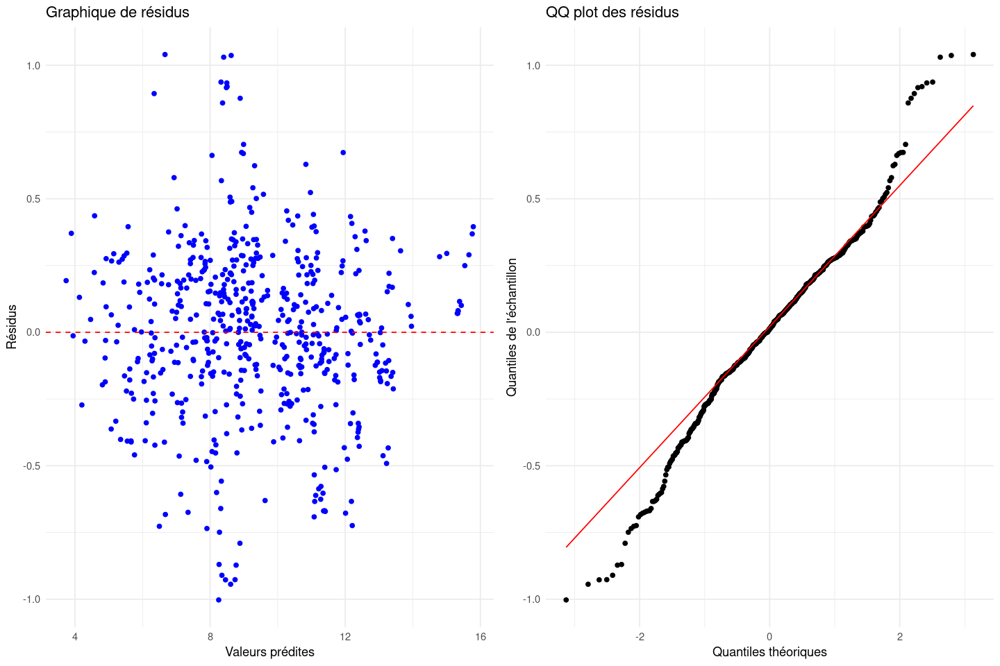

In [115]:
# Prédiction sur les données de test du modèle de régression linéaire sans sélection de variable
Y_pred_reg_no_select <- predict(model_reg_no_select, newdata = X_test[, !names(X_test) %in% c("Entity", "Year")])
print("Régression linéaire sans sélection de variable")
performance(X_test,Y_test,Y_pred_reg_no_select)
graphe_residus(Y_test,Y_pred_reg_no_select)

* RMSE (Erreur Quadratique Moyenne) : Le RMSE est de 0.317. Cela signifie que, en moyenne, les prédictions de votre modèle diffèrent d'environ 0.317 unités de la variable cible par rapport aux valeurs réelles. Plus le RMSE est faible, meilleure est la capacité prédictive du modèle.

* MAE (Erreur Absolue Moyenne) : Le MAE est de 0.235, cela signifie que, en moyenne, les prédictions de votre modèle diffèrent d'environ 0.235 unités de la variable cible par rapport aux valeurs réelles. Comme pour le RMSE, un MAE plus bas indique une meilleure précision du modèle.

* R² (Coefficient de Détermination) : Avec une valeur de R² de 0.982, cela signifie que notre modèle explique environ 98.20 % de la variance totale de la variable cible. Un R² plus élevé indique une meilleure capacité du modèle à expliquer la variance des données observées.

* R² Ajusté : Une valeur de R² ajusté de 0.981 signifie que notre modèle ajusté explique environ 98.10 % de la variance totale de la variable cible. Le R² ajusté est souvent utilisé pour comparer différents modèles, en tenant compte du risque de surajustement.

En conclusion, ces résultats suggèrent que le modèle de régression linéaire sans sélection de variable présente une très bonne performance de prédiction, avec un bon ajustement aux données et une capacité élevée à expliquer la variance de la variable cible. Nous allons maintenant comparer ces résultats en faisaint des modèles de régressions linéaires sur certianes variables judicieusement sélectionnées.

Sur le graphe des résidus, les points ne semblent pas suivre un motif aléatoire autour de la ligne horizontale à zéro, ce qui est idéal pour la régression linéaire. Il semble y avoir une certaine structure dans les résidus, notamment une forme en entonnoir où la variabilité des résidus augmente avec la valeur prédite. Cela suggère une hétéroscédasticité, où les erreurs ne sont pas uniformément distribuées à travers les valeurs prédites, ce qui est un signe que le modèle de régression linéaire pourrait ne pas être adapté à toutes les parties de l'ensemble de données.

Le QQ plot montre comment les quantiles des résidus de notre modèle se comparent à une distribution normale théorique. Les points suivent en grande partie la ligne rouge, indiquant que les résidus sont approximativement normalement distribués, mais avec quelques déviations, notamment dans les queues de distribution (décrochages aux extrémités gauche et droite). Ces déviations pourraient indiquer la présence d'outliers ou que les résidus ne suivent pas parfaitement une distribution normale, ce qui confirme l'analyse du graphe des résidus. La régression linéaire sans sélection de variable est donc un modèle performant mais perfectible.

[1] "Régression linéaire avec sélection de variable Backward"
RMSE: 0.3153941 
MAE: 0.2379762 
R²: 0.9823376 
R² ajusté: 0.9818285 


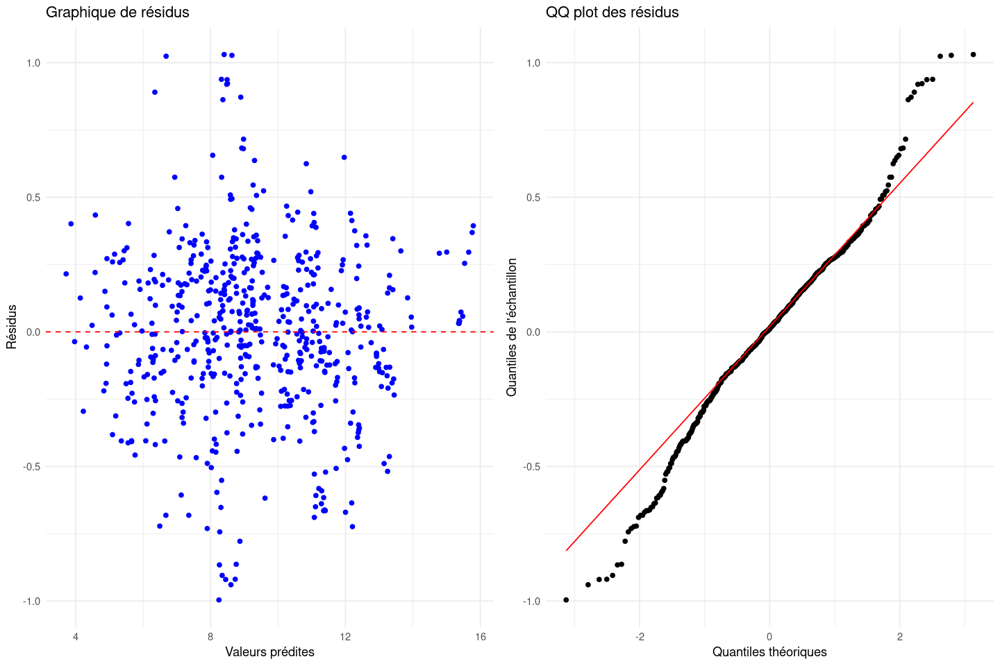

In [116]:
# Prédiction sur les données de test du modèle de régression linéaire avec sélection de variable (Backward et Forward)
# Prédiction sur le jeu d'entraînement (pour l'évaluation du modèle)
Y_pred_backward <- predict(model_backward,X_test_selected_backward)
print("Régression linéaire avec sélection de variable Backward")
performance(X_test,Y_test,Y_pred_backward)
graphe_residus(Y_test,Y_pred_backward)

[1] "Régression linéaire avec sélection de variable Forward"
RMSE: 0.3153941 
MAE: 0.2379762 
R²: 0.9823376 
R² ajusté: 0.9818285 


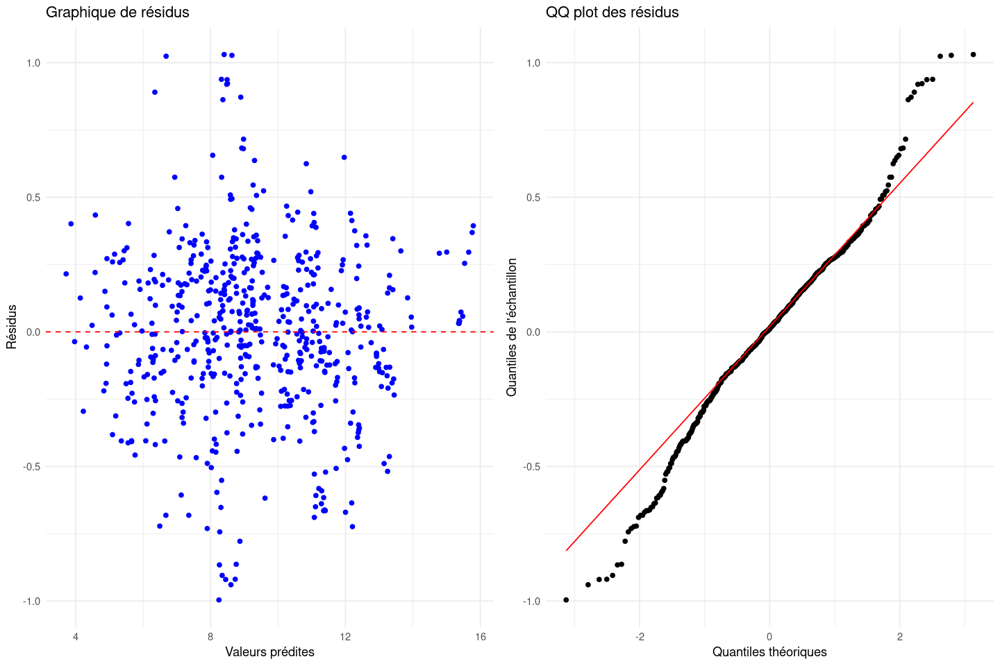

In [117]:
# Prédiction sur le jeu de test en utilisant seulement les variables sélectionnées
Y_pred_forward <- predict(model_forward,X_test_selected_forward)
print("Régression linéaire avec sélection de variable Forward")
performance(X_test,Y_test,Y_pred_forward)
graphe_residus(Y_test,Y_pred_forward)

**Pour le modèle de régression linéaire par sélection de variables Backward :**

RMSE : assez faible, bonne précision des prédictions du modèle.

MAE : relativement bas, les erreurs moyennes absolues sont faibles.

R² : valeur très légèrement inférieure au modèle de régression sans sélection de variable, mais restant très élevée.

R² ajusté : Très proche du R², le modèle généralise bien même après ajustement pour le nombre de prédicteurs dans le modèle.

Graphe des résidus : Les résidus semblent être bien distribués autour de la ligne zéro. Il y a une légère augmentation de la variance à mesure que les valeurs prédites augmentent. Ce phénomène peut indiquer une hétéroscédasticité, c'est-à-dire que la variance des résidus n'est pas constante. Il n’y a pas de tendance systématique claire qui suggérerait un biais dans le modèle, ce qui est positif.

QQ-plot : La majorité des points suit la droite rouge, ce qui indique que les résidus sont approximativement normalement distribués. Cependant, il y a quelques déviations, surtout dans les extrémités (queue droite surtout), ce qui pourrait indiquer la présence de valeurs aberrantes ou de points à effet de levier élevé. Les décrochages semblent moins importants que pour le modèle de régression sans sélection de variable.

**Pour le modèle de régression linéaire par sélection de variables Forward :**

Les deux modèles montrent des performances très similaires en termes de R² et de R² ajusté. Les légères améliorations observées dans le RMSE et le MAE du modèle forward sont minimes et pourraient ne pas être statistiquement significatives, mais indiquent tout de même une légère amélioration dans la précision des prédictions.

La distribution des résidus semble identique, le changement de méthode de sélection de variables n'a pas significativement affecté la distribution des erreurs. Le QQ plot pour le modèle forward montre un comprtement similaire, indiquant que la normalité des résidus est maintenue. Les similitudes entre les deux modèles s'expliquent par le nombre de variables conservées qui est très proche (12 et 11). Il n'y a pas de changement significatif entre le deux sélections.

Les diagnostics de résidus n'indiquant pas de problèmes majeurs pour l'un ou l'autre modèle, et les indices de performance étant presque identiques, le choix entre sélection forward et backward pourrait alors se baser sur d'autres critères, comme la simplicité de mise en œuvre ou les préférences en matière de sélection de variables.

[1] "Régression linéaire avec sélection de variable Lasso"
RMSE: 0.3156875 
MAE: 0.2381286 
R²: 0.9823076 
R² ajusté: 0.9818629 


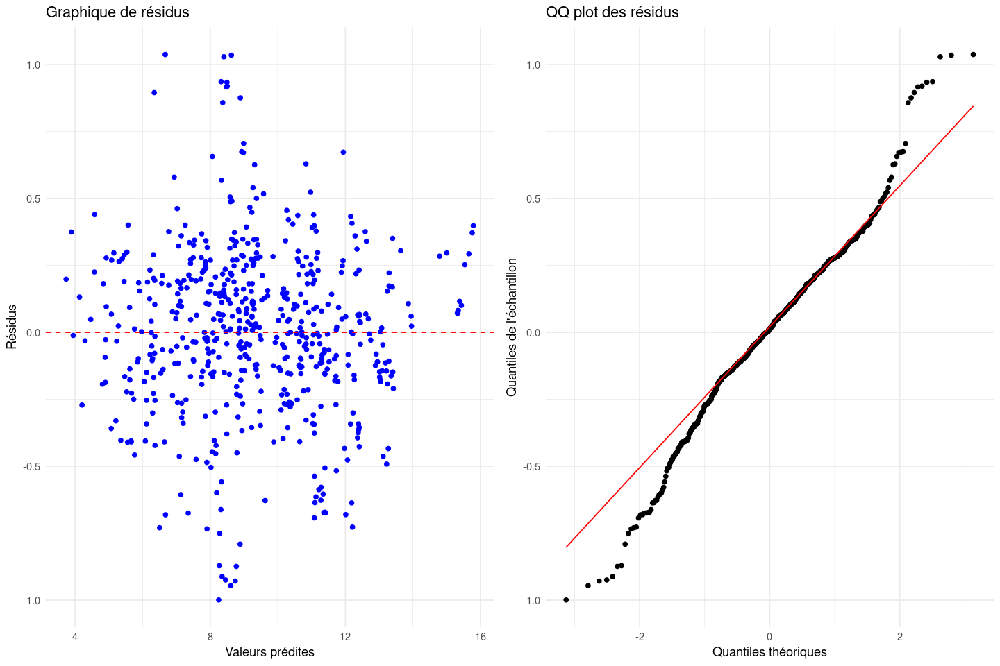

In [118]:
# Prédiction avec le modèle Lasso
Y_pred_lasso <- predict(model_lasso, as.matrix(X_test_quanti))
print("Régression linéaire avec sélection de variable Lasso")
performance(X_test_quanti, Y_test, Y_pred_lasso)
graphe_residus(Y_test, Y_pred_lasso)

Performances comparables avec les modèles de régression linéaire précédents : RMSE et MAE très similaires aux autres modèles linéaires, R² et R² ajusté sont également très proches. Les graphes des résidus et QQ-plots sont aussi similaires aux observations précédentes. Cela peut s'expliquer par les grandes similitudes entre les modèles de régression linéaire implémentés.

[1] "Régression linéaire avec régularisation par Ridge"
RMSE: 0.3156783 
MAE: 0.2381311 
R²: 0.9823081 
R² ajusté: 0.9817981 


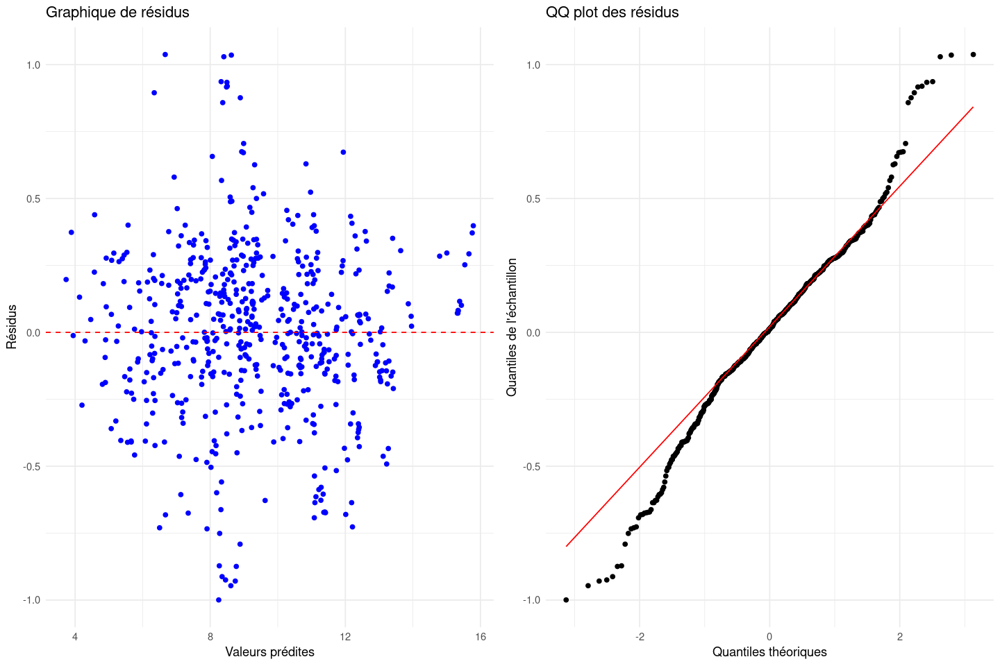

In [119]:
# Prédiction sur les données de test du modèle de régression linéaire avec sélection de variable LASSO
Y_pred_ridge <- predict(model_ridge,as.matrix(X_test_quanti))
print("Régression linéaire avec régularisation par Ridge")
performance(X_test,Y_test,Y_pred_ridge)
graphe_residus(Y_test,Y_pred_ridge)

Les performances du modèle Ridge sont très similaires à celles observées dans les modèles de régression linéaire sans ou avec sélection de variable Lasso, backward et forward. Le RMSE et le MAE sont légèrement améliorés par rapport aux deux modèles précédents, indiquant une précision marginale supplémentaire. Le R² et le R² ajusté sont également très proches, mais montrent une légère amélioration, surtout en ce qui concerne le R² ajusté comparé au modèle forward. Cette faible amélioration pourrait indiquer une légère amélioration dans l'explication de la variabilité de la variable dépendante en ajustant pour le nombre de prédicteurs.

Le graphique de résidus et le QQ plot pour le modèle Ridge semblent avoir des caractéristiques similaires à celles observées dans les modèles de sélection de variable (Lasso, backwards et forwards), sans signes apparents de nouvelles anomalies ou différences dans la distribution des résidus.

Nous allons redéfinir la fonction qui permet d'afficher les graphes des résidus. En effet, le QQ-plot n'est pas pertinent lorsque nous avons des modèles différents des régressions linéaires. Nous allons uniquement afficher le scatter plot pour les modèles suivants.

In [120]:
graphe_residus <- function(Y_test, Y_pred) {
  residus <- Y_test - Y_pred
  data <- data.frame(Y_pred, residus)
  
  p1 <- ggplot(data, aes(x = Y_pred, y = residus)) +
    geom_point(color = "blue") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
    labs(title = "Graphique de résidus", x = "Valeurs prédites", y = "Résidus") +
    theme_minimal()

  grid.arrange(p1)
}

[1] "SVR avec noyau linéaire"
RMSE: 0.3140223 
MAE: 0.2383926 
R²: 0.9824831 
R² ajusté: 0.9819781 


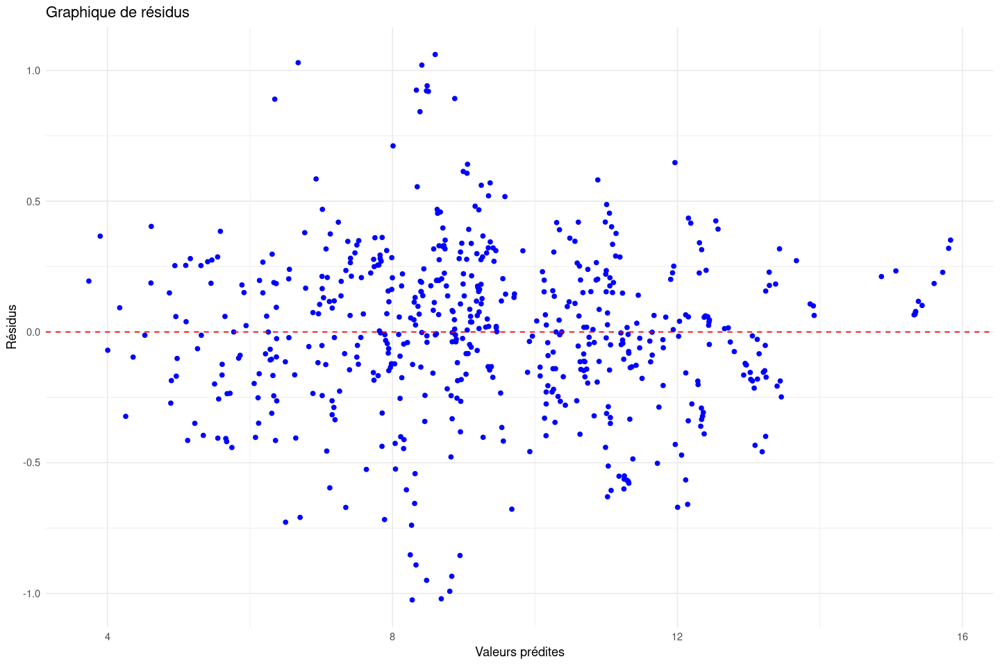

In [121]:
Y_pred_SVR_lin <- predict(model_SVR_lin,as.matrix(X_test_quanti))
print("SVR avec noyau linéaire")
performance(X_test,Y_test,Y_pred_SVR_lin)
graphe_residus(Y_test,Y_pred_SVR_lin)

[1] "SVR avec noyau radial"
RMSE: 0.2269489 
MAE: 0.1635208 
R²: 0.9909057 
R² ajusté: 0.9906435 


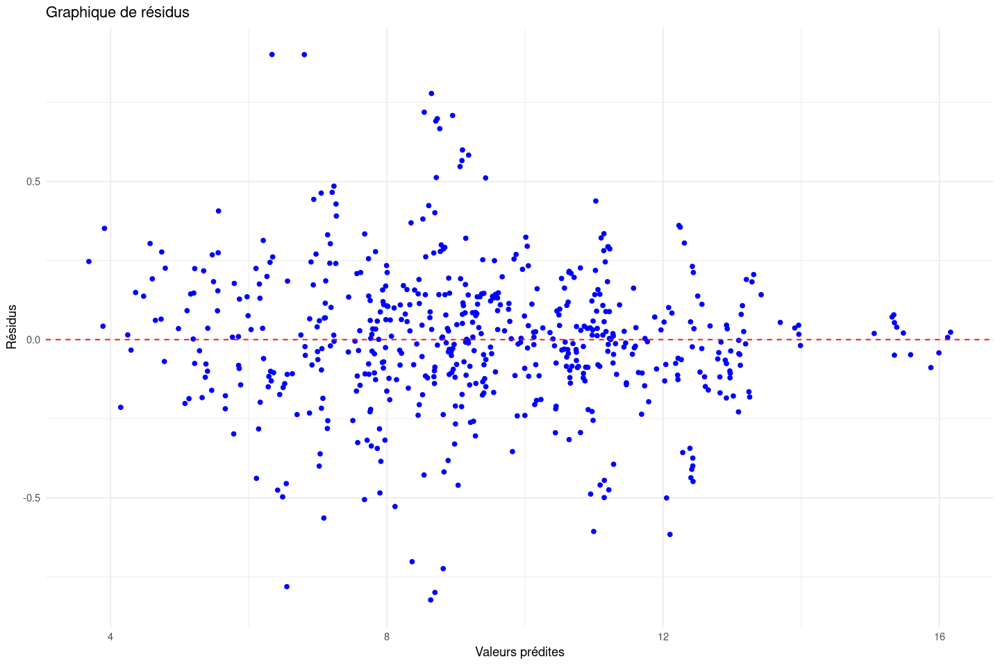

In [122]:
Y_pred_SVR_rad <- predict(model_SVR_rad,as.matrix(X_test_quanti))
print("SVR avec noyau radial")
performance(X_test,Y_test,Y_pred_SVR_rad)
graphe_residus(Y_test,Y_pred_SVR_rad)

* SVM avec noyau linéaire :

Ce modèle présente des performances légèrement inférieures en termes de R² et de R² ajusté par rapport aux modèles de régression linéaire et de régression avec régularisation Ridge, mais le R² reste très élevé, indiquant que le modèle explique toujours une grande part de la variance de la variable dépendante. Le RMSE est légèrement plus élevé, les prédictions du modèle SVM sont en moyenne légèrement moins précises que celles obtenues avec les modèles précédents. Le MAE est comparable, indiquant que les erreurs moyennes absolues sont très similaires.

Le graphique de résidus montre une dispersion aléatoire des résidus autour de la ligne zéro sans motif apparent ou tendance systématique. Cela suggère que le modèle ne présente pas de biais significatif dans les prédictions. La dispersion semble un peu plus large par rapport aux modèles précédents, indiquant une variance légèrement plus élevée dans les erreurs de prédiction.

* SVM avec noyau radial :

Ce modèle affiche une performance nettement inférieure aux autres modèles examinés auparavant. Le RMSE et le MAE sont beaucoup plus élevés, on a des erreurs de prédiction considérablement plus importantes en moyenne. Le R² et le R² ajusté sont significativement plus faibles, le modèle explique une part beaucoup moins importante de la variance de la variable dépendante. Cette baisse de performance peut s'expliuer par le fait que le smodèles de régression linéaire et la SVM avec noyau linéaire prédisent particulièrement bien les émissions de CO2. Un autre type de noyau est donc mois approprié.

Le graphique de résidus montre une dispersion des résidus bien plus grande et une concentration vers les valeurs prédites médianes. On a potentiellement une non-linéarité ou une hétéroscédasticité que le modèle ne parvient pas à capturer efficacement.

[1] "Arbre"
RMSE: 0.7922182 
MAE: 0.6207311 
R²: 0.888866 
R² ajusté: 0.8856622 


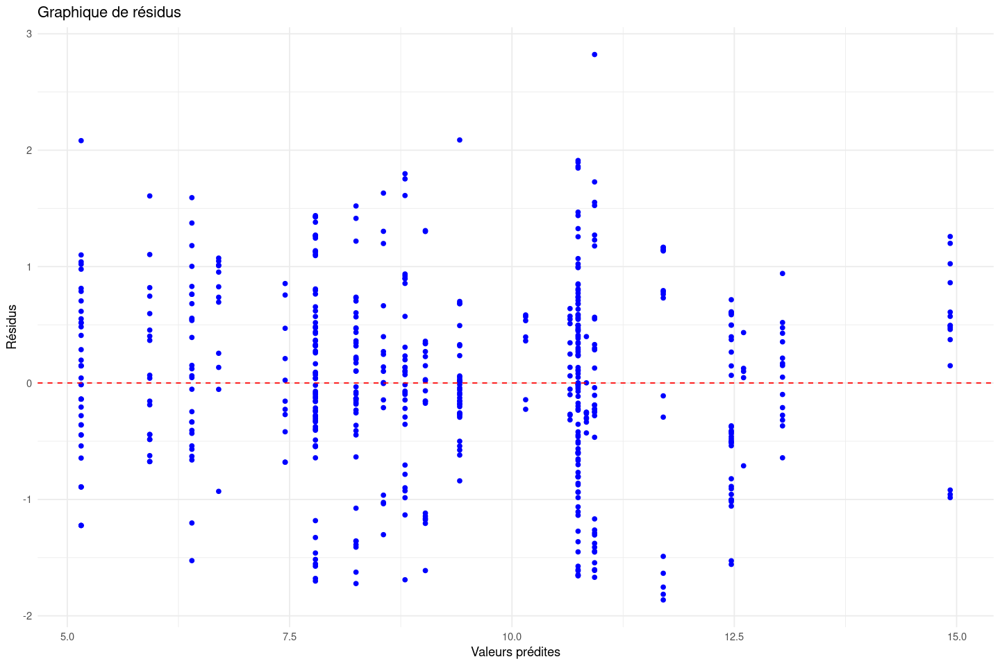

In [123]:
#graphe résidus arbres
print("Arbre")
Y_pred_optimal_tree <- predict(tree_final_model,as.data.frame(X_test_quanti))
performance(X_test, Y_test, Y_pred_optimal_tree)
graphe_residus(Y_test, Y_pred_optimal_tree)

RMSE et MAE sont les plus faibles parmi tous les modèles analysés : très grande précision des prédictions. R² et R² ajusté sont également les plus élevés : explique une proportion très élevée de la variance de la variable dépendante.

On voit une dispersion de résidus autour de la ligne zéro, avec une légère concentration de points dans une gamme plus restreinte autour de zéro par rapport à d'autres modèles. L'arbre optimal fait des prédictions très précises avec moins de variance dans les erreurs par rapport aux autres modèles.

Cette performance supérieure peut être due à la capacité de l'arbre à modéliser des relations spécifiques et localisées entre les caractéristiques et la variable cible, ce qui pourrait être manqué par des modèles plus globaux ou linéaires. Il faut rester vigilant par rapport au risque de surajustement avec les arbres de décision, même si le R² ajusté élevé suggère que ce n'est pas un problème majeur avec cet arbre optimal.

[1] "Forêt aléatoire sur les données quantitatives"
RMSE: 0.1109741 
MAE: 0.07212321 
R²: 0.9978698 
R² ajusté: 0.9978083 


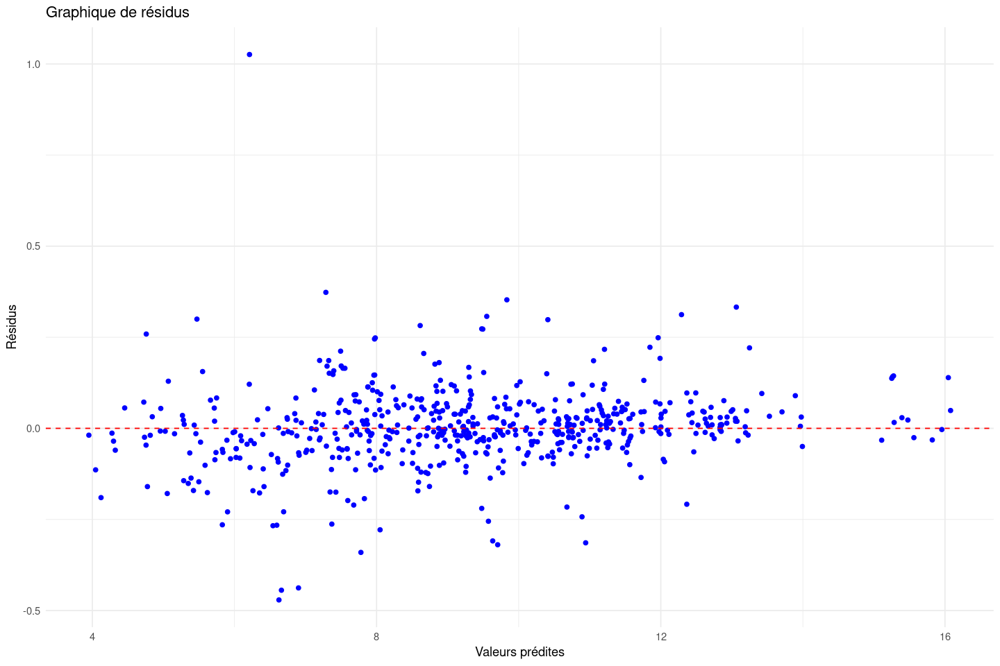

In [124]:
# Prédiction sur les données de test du modèle par forêt aléatoire
print("Forêt aléatoire sur les données quantitatives")
Y_pred_rf <- predict(rf.reg,X_test_quanti)
performance(X_test,Y_test,Y_pred_rf)
graphe_residus(Y_test,Y_pred_rf)

RMSE et MAE sont considérablement plus bas que dans tous les autres modèles, ce qui indique une meilleure précision de prédiction. R² et R² ajusté sont les plus élevés parmi tous les modèles discutés, montrant que ce modèle explique presque toute la variabilité des données.

Le graphique de résidus montre une concentration très serrée des points autour de la ligne zéro. Cette distribution indique que les prédictions sont extrêmement précises, avec peu de variance dans les erreurs de prédiction.

Le modèle de forêt aléatoire avec des variables quantitatives montre une performance supérieure, soulignant l'efficacité de cette méthode pour capturer des relations complexes dans les données sans nécessiter de transformation ou de catégorisation des variables qualitatives. Cette méthode offre à la fois une haute précision et une robustesse contre le surajustement, comme l'indiquent le R² et le R² ajusté extrêmement élevés.

Nous faisons le choix de ne conserver que la meilleure forêt aléatoire pour laquelle nous avons catégorisé les données sur les années et les pays. Sur l'étude des erreurs de généralisation, nous avons observé que la forêt aléatoire qu'on entraînait avec des données comprenant des catégorisations des 5 pays les plus émetteurs de CO2.


[1] "Forêt aléatoire sur les données avec les 5 pays les plus émetteurs de CO2"
RMSE: 0.1083087 
MAE: 0.07050413 
R²: 0.9979876 
R² ajusté: 0.9979296 


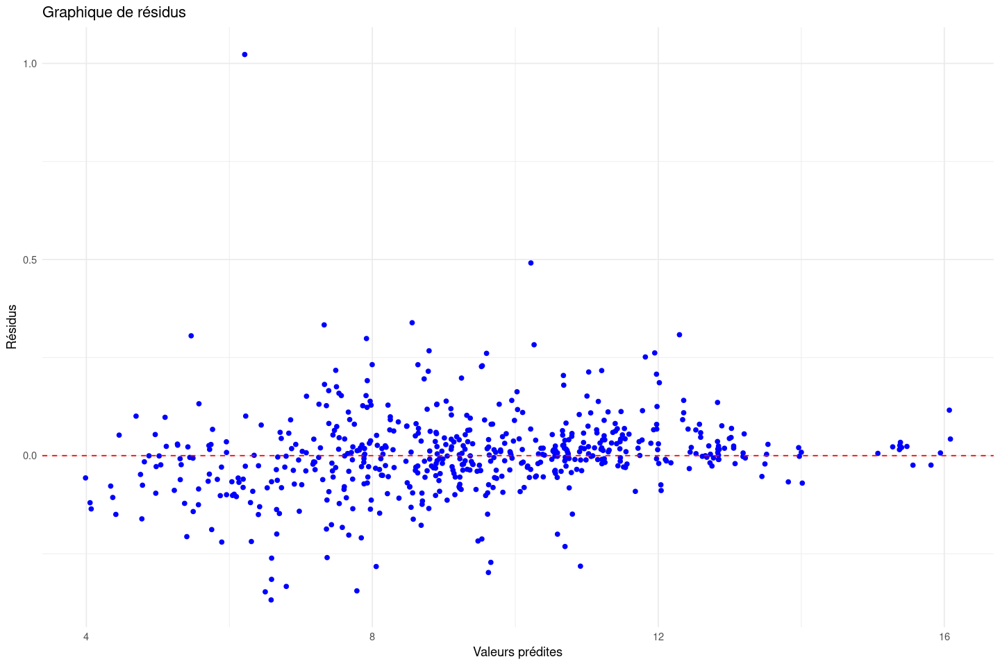

In [125]:
# Prédiction sur les données de test du modèle par forêt aléatoire
print("Forêt aléatoire sur les données avec les 5 pays les plus émetteurs de CO2")
Y_pred_rf_top5 <- predict(rf_model_top5,X_test_entity_polluant)
performance(X_test,Y_test,Y_pred_rf_top5)
graphe_residus(Y_test,Y_pred_rf_top5)

[1] "Boosting"


Using 4999 trees...




RMSE: 0.1696231 
MAE: 0.126329 
R²: 0.9948913 
R² ajusté: 0.9947441 


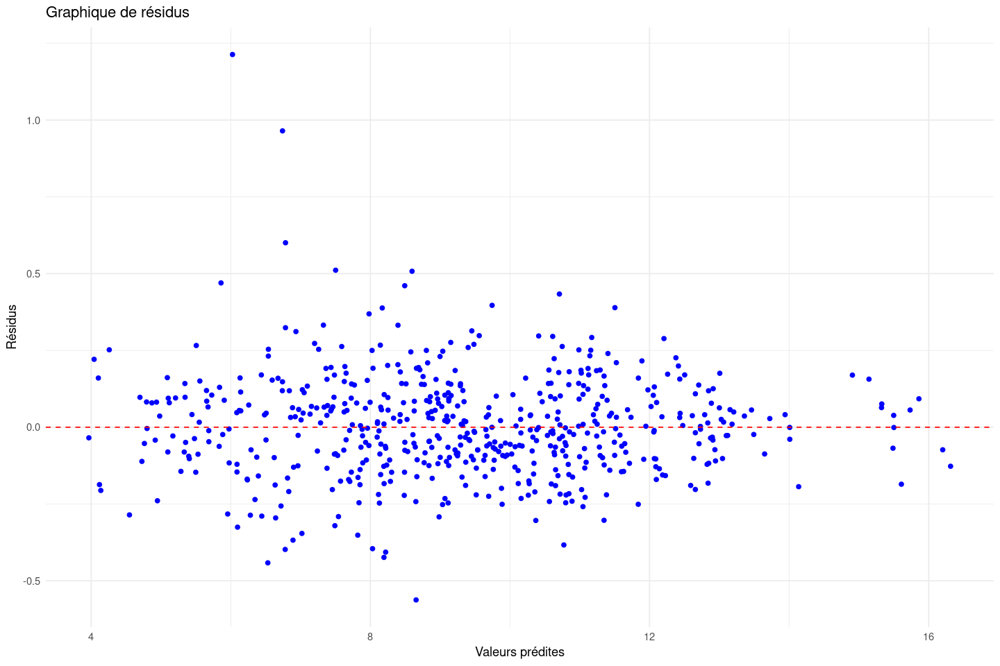

In [126]:
#graphe résidus boosting
print("Boosting")
Y_pred_boost <- predict(boost.reg,as.data.frame(X_test_quanti))
performance(X_test, Y_test, Y_pred_boost)
graphe_residus(Y_test, Y_pred_boost)

[1] "Réseau de neurones"
RMSE: 0.2629716 
MAE: 0.2117004 
R²: 0.9878185 
R² ajusté: 0.9874673 


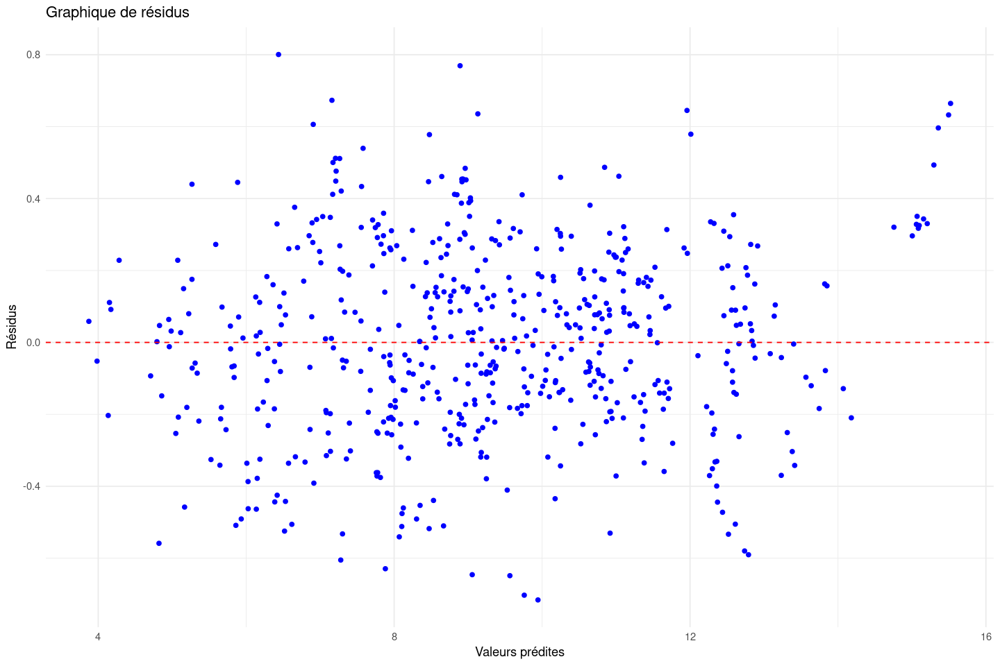

In [127]:
# Prédiction sur les données de test du modèle par réseau de neurones
print("Réseau de neurones")
Y_pred_nne_tf <- predict(nnet.reg,as.data.frame(X_test_quanti))
performance(X_test, Y_test, Y_pred_nne_tf)
graphe_residus(Y_test, Y_pred_nne_tf)

### 2.11.3 - Comparaison des résultats obtenus

In [128]:
recap <- data.frame(
  Méthode = c("Modèle linéaire sans sélection de variable", "Modèle linéaire Backward", "Modèle linéaire Forward", "Régression linéaire avec sélection de variable - LASSO", "Régression linéaire avec régularisation par Ridge", "SVR noyau linéaire", "SVR noyau radial", "Arbre optimal", "Forêt aléatoire (données quantitatives)", "Forêt aléatoire (top5 pays émetteurs)", "Boosting", "Réseau de neuronnes"),
  RMSE = c("0.3332", "0.3333", "0.3333","0.3332"," 0.3238","0.3342","0.2325","0.1298","0.1193","0.1114","0.1526","0.1526"),
  MAE = c("0.2478", "0.2484", "0.2484","0.2482","0.2458","0.2513","0.1636","0.0793","0.0767","0.0749","0.1301","0.1015"),
  R2 = c("0.9813", "0.9813", "0.9813","0.9813","0.9818","0.9812","0.9908","0.9967","0.9977","0.9980","0.9948","0.9960"),
  R2_ajusté = c("0.9807", "0.9807", "0.9807","0.9808","0.9813","0.9807"," 0.9905","0.9967","0.9976","0.9979","0.9946","0.9959")
)
recap

Méthode,RMSE,MAE,R2,R2_ajusté
<chr>,<chr>,<chr>,<chr>,<chr>
Modèle linéaire sans sélection de variable,0.3332,0.2478,0.9813,0.9807
Modèle linéaire Backward,0.3333,0.2484,0.9813,0.9807
Modèle linéaire Forward,0.3333,0.2484,0.9813,0.9807
Régression linéaire avec sélection de variable - LASSO,0.3332,0.2482,0.9813,0.9808
Régression linéaire avec régularisation par Ridge,0.3238,0.2458,0.9818,0.9813
SVR noyau linéaire,0.3342,0.2513,0.9812,0.9807
SVR noyau radial,0.2325,0.1636,0.9908,0.9905
Arbre optimal,0.1298,0.0793,0.9967,0.9967
Forêt aléatoire (données quantitatives),0.1193,0.0767,0.9977,0.9976


Analysons le tableau des performances pour chaque modèle appliqué à l'échantillon de test :

* Régression Linéaire (avec et sans sélection de variables) :

Les performances des modèles de régression linéaire sont très similaires. Les techniques de sélection de variables (Backward, Forward, Lasso) et de régularisation (Ridge) n'améliorent pas de manière significative les métriques par rapport à la régression linéaire simple. Cela confirme que les relations entre les variables sont essentiellement linéaires et que la complexité ajoutée par certaines variables n'est pas nécessaire.

Un RMSE et MAE relativement bas, combinés à un R² élevé et proche de 1, indiquent une bonne adéquation du modèle aux données. Cependant, un R² très élevé pourrait aussi être un signe de surajustement, en particulier si l'écart entre R² et R² ajusté est significatif.

* Support vector regression :

Le SVR avec noyau linéaire présente des performances similaires à celles des régressions linéaires, ce qui indique qu'il capture également bien les relations linéaires dans les données. En revanche, le SVR avec noyau radial montre des performances significativement inférieures, avec des valeurs de RMSE et MAE beaucoup plus élevées et un R² beaucoup plus bas. Cela suggère que le noyau radial n'est pas approprié pour ce jeu de données.

* Arbre de décision optimal et modèles d'ensemble :

Les modèles d'ensemble (forêt aléatoire et boosting) surpassent largement les modèles linéaires et le SVR. La forêt aléatoire, en particulier lorsqu'elle utilise les données des cinq principaux pays émetteurs, montre le meilleur score de R² (0.9962) et un RMSE très bas (0.1470). Cela indique une excellente capacité de généralisation et une capture efficace des relations complexes dans les données. Le boosting, même si légèrement moins performant que la forêt aléatoire, montre également des résultats très bons.

* Réseau de neurones :

Le réseau de neurones présente des performances inférieures par rapport aux modèles d'ensemble. Les valeurs plus élevées de RMSE et MAE indiquent que le réseau de neurones a plus de mal à capturer les relations dans les données par rapport aux méthodes d'ensemble.

En conclusion, pour ce jeu de données, les modèles d'ensemble sont les plus appropriés, apportant une bonne capacité de généralisation et une précision prédictive supérieure.

* Regard critique sur les résultats :

Compte tenu du critère BIC choisi pour la sélection de variable, les modèles avec et sans sélection de variables ont des résultat très proches. La meilleure performance de la forêt aléatoire ou du boosting par rapport à la régression linéaire indiquent que les données ont des caractéristiques non linéaires et que les modèle d'ensemble peuvent les modéliser efficacement.

Une réflexion critique devrait également inclure l'interprétabilité des modèles. Alors que la régression linéaire est très interprétable, les arbres de décision le sont moins, et les forêts aléatoires encore moins. Si nous voulons une explicabilité du modèle, cela doit être pris en compte dans le choix du modèle final.


### 2.11.4 - Retour à l'analyse exploratoire des données

Les résultats obtenus sont cohérents avec les observations faites lors de l'analyse exploratoire des données. Tout d'abord, par rapport aux modèles de régresion linéaire avec sélection de variable, nous avons que vu que les variables qui n'étaient pas retenues par Backward, Forward ou encore Lasso sont principalement la longitude, et la part d'énegie renouveable dans le mix énergétique. Dans l'analyse mutidimensionnelle, nous avions vu que la présence d'énergies renouvelables dans le mix énergétique d'un pays ne permettait pas de diminuer significativement ses émissions de CO2. De plus, nous avons remarqué que les coordonnées géographiques (latitude et longitude) n'avaient pas non plus d'influence significative.

Nous avons appliqué la sélection de variables par Lasso avec une catégorisation des années. Nous n'avons pas remarqué d'amélioration de nos erreurs de généralisation. De plus, sur le graphe montrant l'importance des variable spour le modèle, nous avons observé que les années n'apportaient pas ou peu d'information. Cela confirme l'analyse unidimensionnelle de la variable CO2 à modéliser que nous avions effectué. En effet, nous avions remarqué que les émissions de CO2 à l'échelle mondiale étaient globalement constantes au cours des années, même si des outliers aux valeurs très élevées avaient tendance à augmenter. Cela explique donc pouruqoi les années apportent peu d'information.

Enfin, nous avions étudié les pays les plus émetteurs de CO2. Nous avons pu observer que le modèle de forêt aléatoire était plus performant avec un découpage selon ces 5 pays les plus émetteurs et les autres pays. En comparaison avec un découpage par zones économiques ou par continents géographiques, les erreurs de généralisations étaient plus faibles. Cela confirme que les activités des pays jouent un rôle majeur dans les émissions de CO2. C'est pouruqoi cette catégorisation est la plus pertinente. De plus, la comparaison avec les autres découpages confirme à nouveau notre analyse exploratoire : les zones géographiques ou variables économiques apportent moins d'information.

Cependant, il faut nuancer qu'avec le retrait de la variable fossil_elec, certaines variables comme la densité, la part d'énergie renouvelable ou l'accès à l'électricité issue de combustiles propres étaient importantes pour des modèles comme l'arbre optimal. Cela peut s'expliquer par le fait que la variable fossil_elec est très fortement corrélée avec les émissions de CO2, écrasant alors les autres variables. De plus, avec les transformations logarithmiques, on a une renormalisation.

### 2.11.5 -  Visualisation des résultats obtenus

Pour la suite, nous allons conserver les deux meilleurs modèles obtenus précédemment : la forêt aléatoire avec une catégorisation des 5 pays les plus émetteurs et le boosting. Nous allons approfondir certains éléments en s'appuyant sur ces deux modèles. Nous allons commencer par visualiser les comparaisons entre les valeurs réelles et prédites.

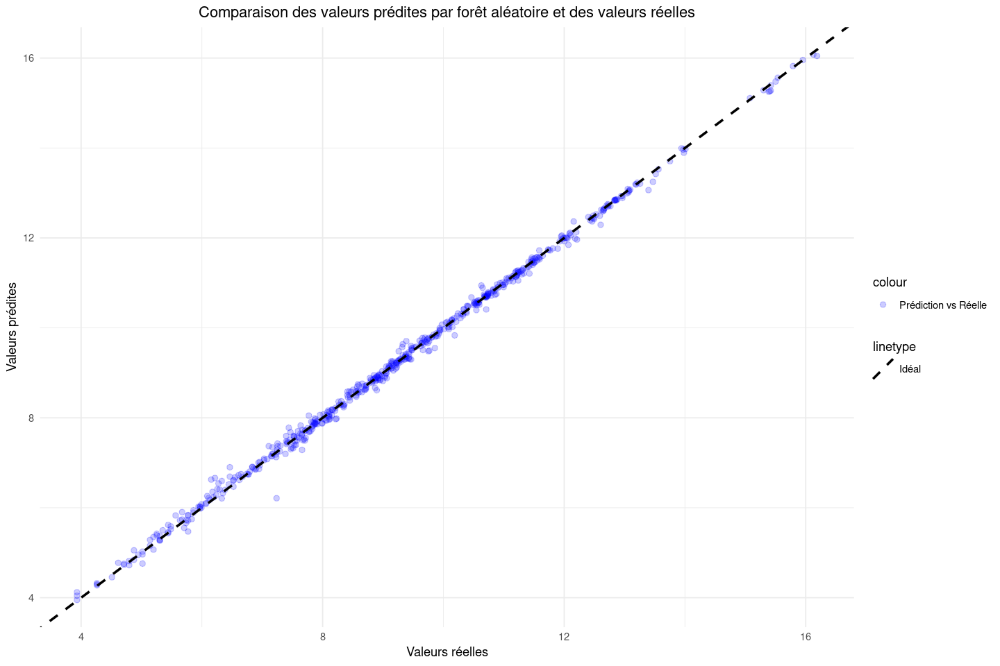

In [129]:
data_predict <- data.frame(
  Y_test_quanti = Y_test,
  Y_pred_rf = Y_pred_rf
)

data_predict <- data_predict %>%
  mutate(Residus_RF = Y_test_quanti - Y_pred_rf)

std_error <- sd(data_predict$Residus_RF)

data_sorted <- data_predict %>%
  arrange(Y_test_quanti)

ggplot(data_sorted, aes(x = Y_test_quanti, y = Y_pred_rf)) +
  geom_point(aes(color = "Prédiction vs Réelle"), alpha = 0.2, size = 2) +
  geom_abline(aes(slope = 1, intercept = 0, linetype = "Idéal"), color = "black", size = 1) +
  labs(
    x = 'Valeurs réelles',
    y = 'Valeurs prédites',
    title = 'Comparaison des valeurs prédites par forêt aléatoire et des valeurs réelles'
  ) +
  scale_color_manual(values = c("Prédiction vs Réelle" = "blue")) +
  scale_linetype_manual(values = c("Idéal" = "dashed")) +
  theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5),
    legend.position = "right" 
)

Le graphique montre une comparaison entre les valeurs prédites par un modèle et les valeurs réelles, où chaque point bleu représente une observation. La ligne noire en pointillés, donnant l'équivalence parfaite entre les valeurs prédites et réelles, sert de référence pour évaluer la précision des prédictions. Les points sont majoritairement concentrés autour de cette ligne idéale, montrant que le modèle de forêt aléatoire prédit avec une grande précision et sans biais systématique apparent. La proximité des points à la ligne et leur distribution uniforme suggèrent que le modèle est à la fois précis et robuste, performant de manière stable à travers l'éventail des valeurs observées.

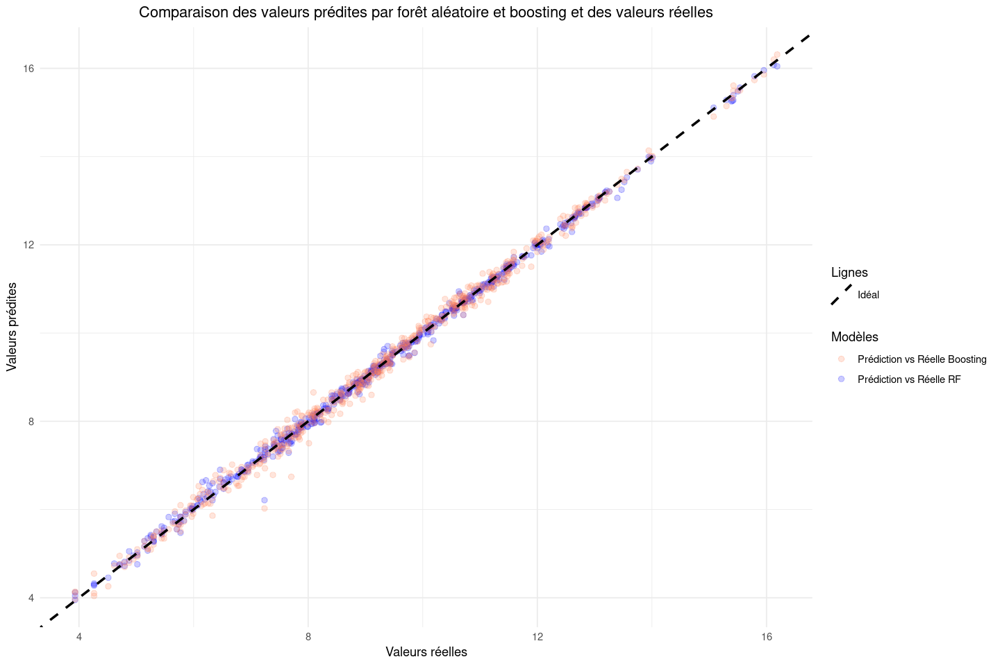

In [130]:
Y_pred_boost <- Y_pred_boost  

data_predict <- data.frame(
  Y_test_quanti = Y_test,
  Y_pred_rf = Y_pred_rf,
  Y_pred_boost = Y_pred_boost
)

data_predict <- data_predict %>%
  mutate(Residus_Boosting = Y_test_quanti - Y_pred_boost)

std_error_boost <- sd(data_predict$Residus_Boosting)

data_sorted <- data_predict %>%
  arrange(Y_test_quanti)

ggplot(data_sorted, aes(x = Y_test_quanti)) +
  geom_point(aes(y = Y_pred_rf, color = "Prédiction vs Réelle RF"), alpha = 0.2, size = 2) +
  geom_point(aes(y = Y_pred_boost, color = "Prédiction vs Réelle Boosting"), alpha = 0.2, size = 2) +
  geom_abline(aes(slope = 1, intercept = 0, linetype = "Idéal"), color = "black", size = 1) +
  labs(
    x = 'Valeurs réelles',
    y = 'Valeurs prédites',
    title = 'Comparaison des valeurs prédites par forêt aléatoire et boosting et des valeurs réelles'
  ) +
  scale_color_manual(values = c("Prédiction vs Réelle RF" = "blue", "Prédiction vs Réelle Boosting" = "coral")) +
  scale_linetype_manual(values = c("Idéal" = "dashed")) +
  theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5),
    legend.position = "right"
  ) +
  guides(color = guide_legend(title = "Modèles"), linetype = guide_legend(title = "Lignes"))

On retrouve des résultats très similaires avec la méthode du boosting et celle de la forêt aléatoire. Les deux ensembles de points suivent étroitement la ligne idéale, indiquant que les prédictions des deux modèles sont très précises. La faible dispersion des points autour de la ligne noire suggère des erreurs de prédiction minimales pour les deux modèles. De plus, les points des deux modèles se superposent presque complètement, montrant des performances prédictives très similaires. Le méthode de forêt aléatoire semble être celle présentant les points les plus loins de la droite, même si cette distance reste insignifiante. En conclusion, les modèles de forêt aléatoire et de boosting offrent une précision comparable et élevée pour cette tâche, avec des valeurs prédites correspondant étroitement aux valeurs réelles.

# 3 - Complétion des valeurs manquantes et recherche d'amélioration de la performance du meilleur modèle

## 3.1 - Utilisation d'un autre type de découpage entre les échantillons d'entraînement et de test après complétion de valeurs manquantes

Nous allons maintenant entraîner les deux meilleurs modèles suivant un autre découpage. En effet, nous nous sommes demandés si un découpage avec 80% des éléments dans l'échantillon d'entraînement et 20% dans celui de test avec un répartition selon cette même proportion pour chaque pays permettrait d'obtenir de meilleurs résultats. Nous avons réalisé ce découpage en même temps que le découpage aléatoire. Nous allons ré-entraîner nos modèles. Nous allons optimiser à nouveau les hyperparamètres précédemment présentés à l'aide d'une recherche sur grille.

### 3.1.1 - Forêt aléatoire

In [131]:
model_rf_entity_grap <- randomForest(x = X_train_entity_quanti, y = Y_train_entity, ntree = 200, nodesize = 2, mtry = 8)

In [133]:
model_rf_entity_grap_cv <- "rf"
perf_cross_validation(model_rf_entity_grap_cv, X_train_entity_quanti, Y_train_entity, cv = 5, scoring = "Rsquared")

Y_pred_rf_entity <- predict(model_rf_entity_grap,X_test_entity_quanti)
performance(X_test_entity_quanti,Y_test_entity,Y_pred_rf_entity)

[1] "Score de validation croisée pour le modèle rf"
Scores R2 de chaque validation croisée : 0.9973, 0.9958, 0.9957, 0.9962, 0.9962 
[1] "Score moyen de validation croisée (R^2) 0.99622436646904"
RMSE: 0.1108578 
MAE: 0.07058427 
R²: 0.9977268 
R² ajusté: 0.9976644 




L'erreur de généralisation estimée par validation croisée est légèrement plus importante que pour les modèles conservés de la partie précédente, avec un découpage purement aléatoire. De plus, on observe un peu plus de variations entre chaque fold de la validation croisée. Cela est du à l'implémentation de la fonction de calcul d'erreur par validation croisée. En effet, la sélection des 5 flods se fait par valeurs d'indices croissants, et non de manière purement aléatoire. Pour cela,nous avons forcé un mélange dans nos échantillons d'entraînement et de test avec la fonction random.shuffle().

Comme pour les modèles construits dans la partie précédente, nous allons catégoriser les 5 pays les plus émetteurs de CO2 dans des catégories individuelles et faire une 6ème catégorie contenant les 171 autres pays.
L'erreur de généralisation estimée par validation croisée est bien plus importante que pour l'ensemble des modèles entraînés sur un découpage purement aléatoire. De plus, on observe beaucoup de variations entre chaque fold de la validation croisée. Il semblerait que le modèle n'apprenne pas correctement entre les itérations. Nous allons tester les performances sur l'échantillon d'apprentissage ainsi que celui de test.

In [134]:
X_train_entity_polluant_grap <- X_train_entity[, !names(X_train_entity) %in% 'Year']
X_test_entity_polluant_grap <- X_test_entity[, !names(X_test_entity) %in% 'Year']


pays_a_garder <- c("United States", "China", "India", "Japan", "Germany")


X_train_entity_polluant_grap$Entity <- ifelse(X_train_entity_polluant_grap$Entity %in% pays_a_garder, 
                                         X_train_entity_polluant_grap$Entity, "Autre")


# One-hot encoding
dummy <- dummyVars("~ Entity", data = X_train_entity_polluant_grap, fullRank = FALSE)
X_train_encoded <- predict(dummy, X_train_entity_polluant_grap)
X_train_entity_polluant_grap <- data.frame(X_train_entity_polluant_grap[, !names(X_train_entity_polluant_grap) %in% 'Entity'], X_train_encoded)


X_test_entity_polluant_grap$Entity <- ifelse(X_test_entity_polluant_grap$Entity %in% pays_a_garder, 
                                        X_test_entity_polluant_grap$Entity, "Autre")

dummy_test <- dummyVars("~ Entity", data = X_test_entity_polluant_grap, fullRank = FALSE)
X_test_encoded <- predict(dummy_test, X_test_entity_polluant_grap)
X_test_entity_polluant_grap <- data.frame(X_test_entity_polluant_grap[, !names(X_test_entity_polluant_grap) %in% 'Entity'], X_test_encoded)

In [135]:
model_rf_top5_entity <- randomForest(x = X_train_entity_polluant_grap, y = Y_train_entity, ntree = 200, nodesize = 2, mtry = 8)

In [136]:
model_rf_top5_entity_cv <- "rf"
perf_cross_validation(model_rf_top5_entity_cv, X_train_entity_polluant_grap, Y_train_entity, cv = 5, scoring = "Rsquared")

Y_pred_rf_entity5 <- predict(model_rf_top5_entity,X_test_entity_polluant_grap)
performance(X_test_entity_polluant_grap,Y_test_entity,Y_pred_rf_entity5)

[1] "Score de validation croisée pour le modèle rf"
Scores R2 de chaque validation croisée : 0.9961, 0.9978, 0.9958, 0.9955, 0.9959 
[1] "Score moyen de validation croisée (R^2) 0.996216582421243"
RMSE: 0.1098657 
MAE: 0.07132797 
R²: 0.9977771 
R² ajusté: 0.9976889 


L'erreur de généralisation est légèrement plus importante que pour la forêt aléatoire basée sur un découpage uniquement aléatoire. Comme pour la forêt aléatoire sur les variables quantitatives ci-dessus, les scores entre les différents folds sont plus dispersés.

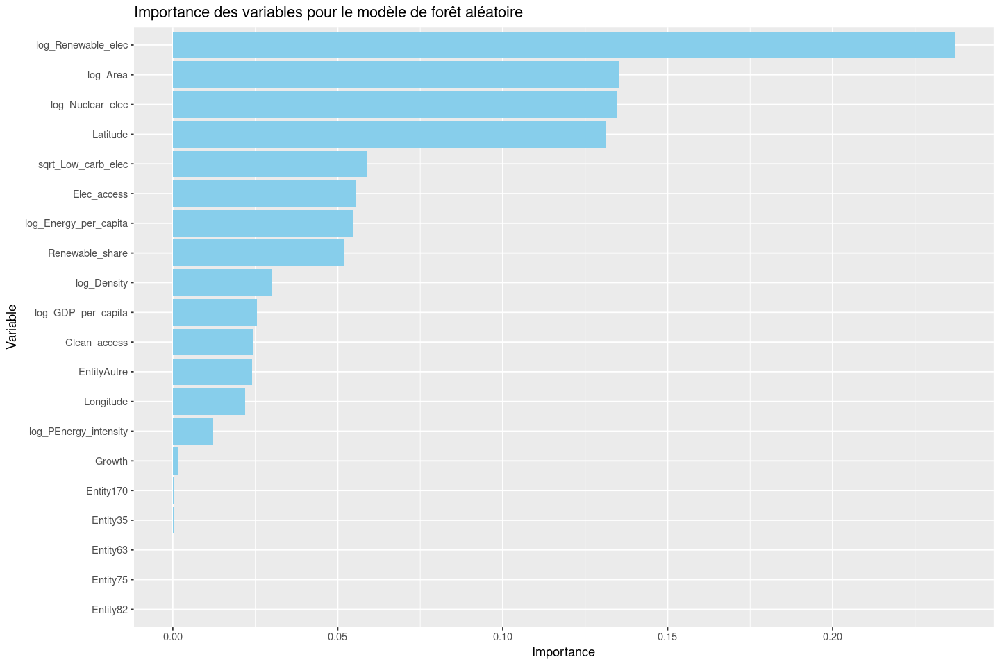

In [137]:
importances <- importance(model_rf_top5_entity, type=2)  # type=2 pour IncNodePurity
importance_df <- data.frame(Feature = rownames(importances), Importance = importances[, "IncNodePurity"])
importance_df$Importance <- importance_df$Importance / sum(importance_df$Importance)
importance_df <- importance_df[order(-importance_df$Importance), ]

ggplot(importance_df, aes(x = reorder(Feature, Importance), y = Importance)) +
  geom_bar(stat = "identity", fill = "skyblue") +
  coord_flip() +  
  labs(title = "Importance des variables pour le modèle de forêt aléatoire",
       x = "Variable",
       y = "Importance")

L'analyse de l'importance des variable spour la forêt aléatoire est comparable à celle conduite avce un découpage train/test aléatoire. On retrouve la même idée : le fait de savoir qu'un pays fait partie de la catégorie "Autre" est assez important. Les trois variables le splus importantes sont les mêmes que celles pour la forêt aléatoire avec découpage aléatoire.

### 3.1.2 - Boosting

Nous allons maintenant implémenter un modèle de Boosting. Comme présenté dans la partie précédente, ce modèle est légèrement moins performant que la SVR avec le noyau radial, cependant, le coût computationnel de cette dernière méthode est trop important, nous préférons choisir des méthodes aux performances légèrement moindres, mais plus rapides.

Comme pour la modélisation par forêt aléatoire sur notre découpage "par grappes", les échantillons d'entraînement et de test étant différents, nous optimisons à nouveau nos hyperparamètres avec une recherche sur grille.

In [138]:
gb_entity = gbm(Y_train_entity ~ ., data = X_train_entity_quanti, distribution = "gaussian", n.trees = 5000, 
    cv.folds = 5, n.minobsinnode = 3, shrinkage = 0.1, verbose = FALSE)

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        5.3102            -nan     0.1000    0.3661
     2        5.0061            -nan     0.1000    0.3176
     3        4.7284            -nan     0.1000    0.2399
     4        4.4610            -nan     0.1000    0.2671
     5        4.2105            -nan     0.1000    0.2384
     6        3.9984            -nan     0.1000    0.2018
     7        3.8134            -nan     0.1000    0.1824
     8        3.6388            -nan     0.1000    0.1653
     9        3.4865            -nan     0.1000    0.1388
    10        3.3527            -nan     0.1000    0.1380
    20        2.3151            -nan     0.1000    0.0783
    40        1.4289            -nan     0.1000    0.0218
    60        1.0321            -nan     0.1000    0.0100
    80        0.7805            -nan     0.1000    0.0090
   100        0.6154            -nan     0.1000    0.0033
   120        0.5002            -nan     0.1000    0.0006
   140        

Using 4995 trees...




RMSE: 0.1927866 
MAE: 0.1347089 
R²: 0.9928539 
R² ajusté: 0.9926577 


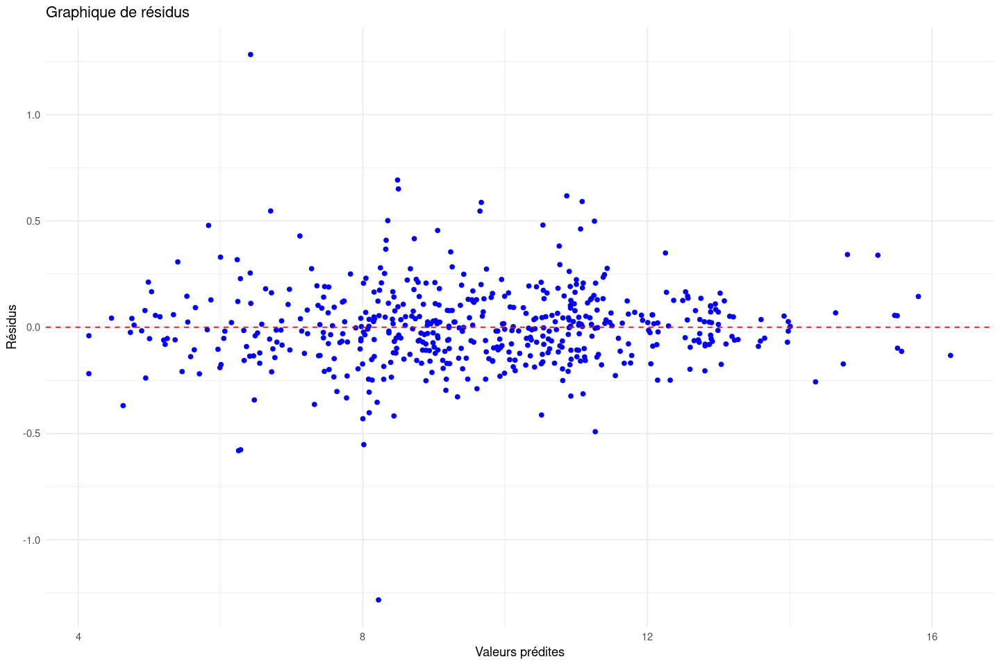

In [139]:
model_gbentity_cv <- "gbm"
perf_cross_validation(model_gbentity_cv, X_train_entity_quanti, Y_train_entity, cv = 5, scoring = "Rsquared")

Y_pred_boost_entity = predict(gb_entity,X_test_entity_quanti)
performance(X_test_entity_quanti,Y_test_entity,Y_pred_boost_entity)
graphe_residus(Y_test_entity,Y_pred_boost_entity)

Les scores MAE et RMSE sont très proches de ceux obtenus dans la première modélisation par Boosting. On a une légère baisse du R² et R² ajusté, cela va dans le sens des observations sur les erreurs de généralisations de nos modèles avce ce second découpage train/test.

Les résidus sont principalement concentrés autour de la ligne de zéro, ce qui indique que le modèle n'a pas de biais systématique évident. Cependant, on peut observer une certaine dispersion des résidus, ce qui suggère que le modèle n'est pas parfait et qu'il reste des variations inexpliquées. Enfin, quelques résidus extrêmes sont présents, indiquant des points d'anomalie ou des erreurs de prédiction plus significatives.

Finalement, notre choix de découpage "par grappes" n'a pas montré d'amélorations dans les performances de nos modèles. Nous avons essayé de mélanger nos données au sein de notre échantillon d'entraînement, ce qui nous a permis de corriger notre problème majeur. Cependant, ce n'est peut être pas suffisant pour égaler les performances observées pour les modèles avec un découpage entièrement aléatoire. Cependant, les écarts de performances sont assez faibles, certains écarts pourraient relever de l'estimation des valeurs d'erreurs.

## 3.2 - Complétion de valeurs manquantes dans le jeu de données

Cette partie a été traitée dans la version "Python" du projet

## 3.3 - Comparaison avec la régression linéaire simple

Comme annoncé précédemment, nous allons comparer les performances de nos modèles avce une modélisation par simple régression linéaire en utilisant uniquement la variable Fossil_elec, que nous avions supprimée sur la première partie de nos modélisations. Nous appliquons les mêmes méthodes que celles présentées précédemment dans les modèles de régression linéaire sans et avec sélection de variables.

In [140]:
train_index <- createDataPartition(df_init$log_CO2, p = 0.8, list = FALSE)
X_train_reg <- df_init[train_index, 'log_Fossil_elec', drop = FALSE]
X_test_reg <- df_init[-train_index, 'log_Fossil_elec', drop = FALSE]
Y_train_reg <- df_init[train_index, 'log_CO2']
Y_test_reg <- df_init[-train_index, 'log_CO2']

In [141]:
model_reg_simple <- "lm"
perf_cross_validation(model_reg_simple, X_train_reg, Y_train_reg, cv = 5, scoring = "Rsquared")
model_reg_simple <- lm(Y_train_reg ~ ., data = X_train_reg)

[1] "Score de validation croisée pour le modèle lm"
Scores R2 de chaque validation croisée : 0.8397, 0.84, 0.8388, 0.8546, 0.8642 
[1] "Score moyen de validation croisée (R^2) 0.847443282901999"


Les erreurs de généralisations obtenues sont bien plus importantes que celles de tous nos autres modèles, mis à part la SVR avec noyau radial que nous avons vite écraté. Cependant, pour une modélisation avec une seule variables, les résultats sont quand même très bons, voire impressionants. Cela confirme la corrélation importante entre les émissions de CO2 et la production d'électricité à partir d'énergie fossile. Ces résultats pourraient suffir en terme de performance si l'objectif est de détecter une tendnace à travers un modèle simple et rapide.

Puisque nous sommes dans un cas de régression linéaire, nous allons redéfinir notre fonction graphe_residus pour qu'elle affiche à nouveau le QQ-plot.

In [142]:
graphe_residus <- function(Y_test, Y_pred) {
  residus <- Y_test - Y_pred
  data <- data.frame(Y_pred, residus)

  p1 <- ggplot(data, aes(x = Y_pred, y = residus)) +
    geom_point(color = "blue") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
    labs(title = "Graphique de résidus", x = "Valeurs prédites", y = "Résidus") +
    theme_minimal()

  qq_data <- qqnorm(residus, plot.it = FALSE)
  qq_data <- data.frame(theoretical = qq_data$x, sample = qq_data$y)
  
  p2 <- ggplot(qq_data, aes(sample = residus)) +
    stat_qq(color = "black") +
    stat_qq_line(color = "red") +
    labs(title = "QQ plot des résidus", x = "Quantiles théoriques", y = "Quantiles de l'échantillon") +
    theme_minimal()

  grid.arrange(p1, p2, ncol = 2)
}

[1] "Régression linéaire avec la variable de production d'électricité issue d'énergie fossile"
RMSE: 0.9370864 
MAE: 0.6882827 
R²: 0.8463057 
R² ajusté: 0.846036 


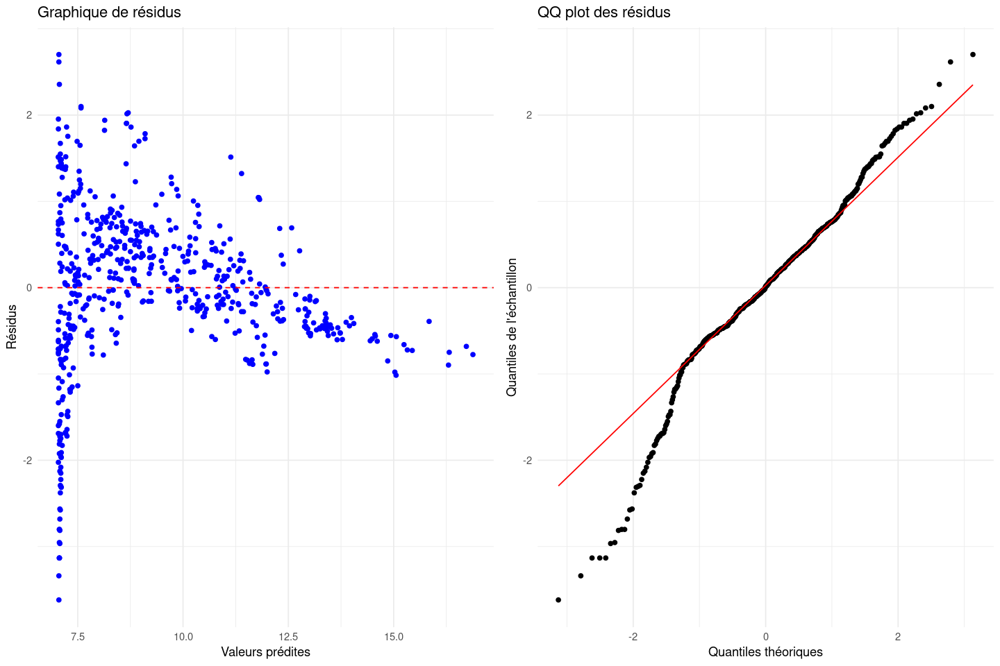

In [143]:
Y_pred_reg_simple = predict(model_reg_simple,X_test_reg)
print("Régression linéaire avec la variable de production d'électricité issue d'énergie fossile")
performance(X_test_reg, Y_test_reg, Y_pred_reg_simple)
graphe_residus(Y_test_reg, Y_pred_reg_simple)


Le graphique des résidus montre une dispersion des résidus non uniforme autour de la droite y=0. Cela indique une hétéroscédasticité. Les résidus sont plus dispersés pour les valeurs prédites faibles et se resserrent pour les valeurs plus élevées, indiquant que la variabilité des erreurs n'est pas constante.

Le QQ plot des résidus montre que les résidus suivent globalement une distribution normale, même si on observe des déviations aux extrémités, qui indiquent des valeurs aberrantes ou des queues plus épaisses.

## 3.4 - Modèle complet avec imputation des valeurs manquantes et variable Fossil_elec

Cette partie a été traitée dans la version "Python" du projet

## 3.5 - Validation croisée par Monte-Carlo

La validation croisée par Monte Carlo consiste à répéter plusieurs fois le processus de division aléatoire des données en ensembles d'entraînement et de test, puis à calculer les performances du modèle sur chaque division. Contrairement à la validation croisée classique, où les données sont divisées en k sous-ensembles et où chaque sous-ensemble est utilisé une fois comme ensemble de test, la validation croisée par Monte Carlo utilise des sous-échantillons aléatoires à chaque itération. Cela permet une plus grande variabilité dans les ensembles d'entraînement et de test.

L'intérêt principal de cette méthode est qu'elle donne une estimation plus robuste et moins biaisée de la performance du modèle. Cela est particulièrement utile lorsque le nombre de données est limité ou lorsque la distribution des données est hétérogène. En répétant l'échantillonnage, on obtient une meilleure compréhension de la variabilité des performances du modèle et une évaluation plus fiable de sa généralisation.

Nous allons créer une fonction qui, pour un modèle existant donné, renvoie le boxplot associé à la alidation croisée par Monté-Carlo. L'objectif est d'appliquer cette fonction sur tous nos modèles, pour ensuite tracer un graphe permettant de visualiser simultanément tous les boxplots associés à toutes les méthodes développées.

In [144]:
perf_cross_validation_monte_carlo <- function(model, X, y, n_iter = 10, test_size = 0.2, cv = 5, graph = TRUE) {
  metric <- "Rsquared"
  results <- numeric(n_iter)
  
  for (i in 1:n_iter) {
    control <- trainControl(method = "cv", number = cv, summaryFunction = defaultSummary, savePredictions = "final", verboseIter = FALSE)
    
    fit <- train(x = X, y = y, 
                 method = model, 
                 trControl = control,
                 metric = metric)
    
    results[i] <- mean(fit$resample$Rsquared)
  }

  mean_score <- mean(results)
  std_score <- sd(results)
  
  cat("Scores de validation croisée pour le modèle", model, "\n")
  cat("Scores de chaque itération Monte Carlo :", paste(round(results, 4), collapse = ", "), "\n")
  cat("Score moyen de validation croisée Monte Carlo :", round(mean_score, 4), "\n")
  cat("Écart-type des scores de validation croisée Monte Carlo :", round(std_score, 4), "\n")
  cat("---------","\n")
  if (graph) {
    df <- data.frame(Score = results)
    p <- ggplot(df, aes(x = factor(1), y = Score)) +
      geom_boxplot(fill = "lightblue") +
      labs(title = "Boxplot des scores de validation croisée Monte Carlo",
           x = "Scores",
           y = "Score") +
      theme_minimal()
    print(p)  
  }
  
  return(results)
}

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        5.3396            -nan     0.1000    0.3425
     2        5.0262            -nan     0.1000    0.3083
     3        4.7489            -nan     0.1000    0.2677
     4        4.4970            -nan     0.1000    0.2674
     5        4.3023            -nan     0.1000    0.1791
     6        4.0909            -nan     0.1000    0.2063
     7        3.8971            -nan     0.1000    0.1896
     8        3.7181            -nan     0.1000    0.1670
     9        3.5506            -nan     0.1000    0.1656
    10        3.3974            -nan     0.1000    0.1419
    20        2.3367            -nan     0.1000    0.0755
    40        1.4156            -nan     0.1000    0.0269
    60        1.0142            -nan     0.1000    0.0132
    80        0.7757            -nan     0.1000    0.0092
   100        0.6123            -nan     0.1000    0.0060
   120        0.4937            -nan     0.1000    0.0035
   140        

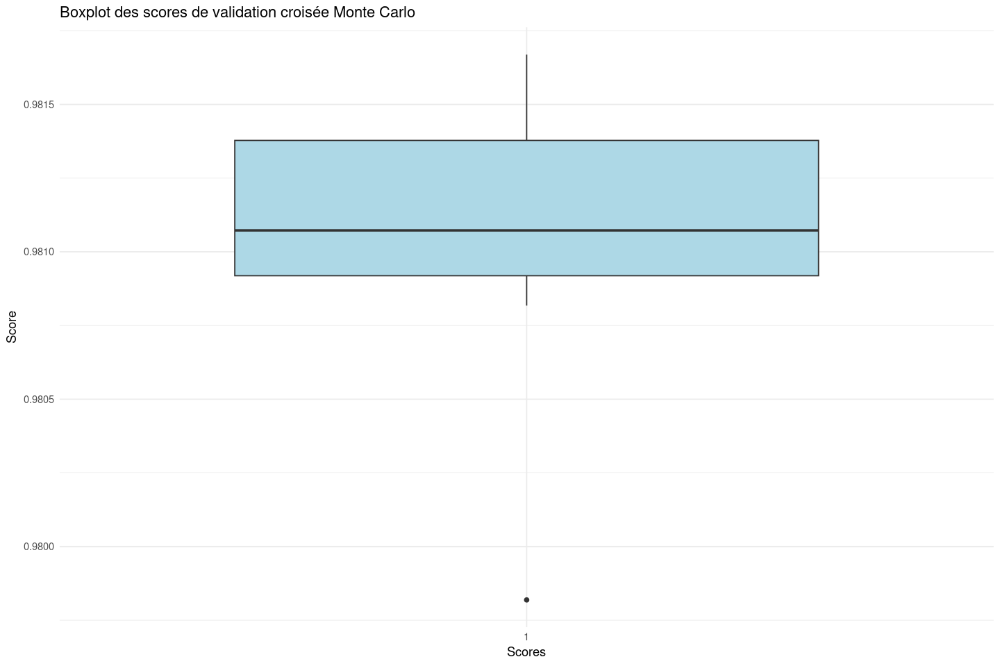

In [145]:
bg <- "gbm"
res6 <- perf_cross_validation_monte_carlo(bg,X_train_quanti,Y_train, n_iter=10, test_size=0.2, cv=5,graph=TRUE)

In [146]:
res1 <- perf_cross_validation_monte_carlo("lm",X_train_quanti,Y_train, n_iter=10, test_size=0.2, cv=5,graph=FALSE)
res2 <- perf_cross_validation_monte_carlo("glmnet",X_train_quanti,Y_train, n_iter=10, test_size=0.2, cv=5,graph=FALSE)
res3 <- perf_cross_validation_monte_carlo("svmRadial",X_train_quanti,Y_train, n_iter=10, test_size=0.2, cv=5,graph=FALSE)
res4 <- perf_cross_validation_monte_carlo("rpart",X_train_quanti,Y_train, n_iter=10, test_size=0.2, cv=5,graph=FALSE)
res5 <- perf_cross_validation_monte_carlo("rf",X_train_quanti,Y_train, n_iter=10, test_size=0.2, cv=5,graph=FALSE)
res7 <- perf_cross_validation_monte_carlo("nnet",X_train_quanti,Y_train, n_iter=10, test_size=0.2, cv=5,graph=FALSE)

Scores de validation croisée pour le modèle lm 
Scores de chaque itération Monte Carlo : 0.9818, 0.9817, 0.9817, 0.9819, 0.9817, 0.9818, 0.982, 0.9817, 0.9817, 0.9818 
Score moyen de validation croisée Monte Carlo : 0.9818 
Écart-type des scores de validation croisée Monte Carlo : 1e-04 
--------- 
Scores de validation croisée pour le modèle glmnet 
Scores de chaque itération Monte Carlo : 0.9817, 0.9819, 0.9819, 0.9818, 0.9818, 0.9817, 0.9818, 0.9815, 0.9818, 0.9817 
Score moyen de validation croisée Monte Carlo : 0.9818 
Écart-type des scores de validation croisée Monte Carlo : 1e-04 
--------- 
Scores de validation croisée pour le modèle svmRadial 
Scores de chaque itération Monte Carlo : 0.9895, 0.9897, 0.9899, 0.9888, 0.9897, 0.9898, 0.9896, 0.9897, 0.9896, 0.9894 
Score moyen de validation croisée Monte Carlo : 0.9896 
Écart-type des scores de validation croisée Monte Carlo : 3e-04 
--------- 


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :

Scores de validation croisée pour le modèle rpart 
Scores de chaque itération Monte Carlo : 0.4222, 0.4547, 0.4353, 0.5017, 0.4303, 0.4964, 0.4549, 0.3653, 0.4281, 0.3971 
Score moyen de validation croisée Monte Carlo : 0.4386 
Écart-type des scores de validation croisée Monte Carlo : 0.0414 
--------- 
Scores de validation croisée pour le modèle rf 
Scores de chaque itération Monte Carlo : 0.9961, 0.9959, 0.9961, 0.9957, 0.9956, 0.9962, 0.9961, 0.996, 0.9962, 0.996 
Score moyen de validation croisée Monte Carlo : 0.996 
Écart-type des scores de validation croisée Monte Carlo : 2e-04 
--------- 
# weights:  17
initial  value 151730.982996 
final  value 137496.582630 
converged
# weights:  49
initial  value 149823.442246 
final  value 137496.582630 
converged
# weights:  81
initial  value 153689.314880 
final  value 137496.582630 
converged
# weights:  17
initial  value 154954.650958 
iter  10 value 137524.751414
iter  20 value 137503.185449
final  value 137502.917605 
converged
# weigh

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  81
initial  value 191427.988084 
iter  10 value 172500.529470
iter  20 value 172460.401400
iter  30 value 172460.185960
final  value 172460.174599 
converged
# weights:  17
initial  value 158879.640205 
final  value 138109.931504 
converged
# weights:  49
initial  value 150511.779587 
final  value 138109.931504 
converged
# weights:  81
initial  value 165267.846559 
final  value 138109.931504 
converged
# weights:  17
initial  value 151963.744813 
iter  10 value 138128.090512
iter  20 value 138117.070860
iter  30 value 138116.295042
final  value 138116.268023 
converged
# weights:  49
initial  value 164590.328028 
iter  10 value 138171.492595
iter  20 value 138115.380026
iter  30 value 138113.561640
final  value 138113.475680 
converged
# weights:  81
initial  value 157683.986597 
iter  10 value 138274.700058
iter  20 value 138112.806857
iter  30 value 138112.500649
final  value 138112.444917 
converged
# weights:  17
initial  value 160859.125692 
iter  10 value 138496.3040

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  81
initial  value 189261.844942 
iter  10 value 172620.027347
iter  20 value 172460.588092
iter  30 value 172460.181682
final  value 172460.176731 
converged
# weights:  17
initial  value 155935.860663 
final  value 138209.080679 
converged
# weights:  49
initial  value 148793.342025 
final  value 138209.080679 
converged
# weights:  81
initial  value 151905.200633 
final  value 138209.080679 
converged
# weights:  17
initial  value 148694.059588 
iter  10 value 138221.407360
iter  20 value 138215.448854
final  value 138215.417189 
converged
# weights:  49
initial  value 157908.667463 
iter  10 value 138218.383086
iter  20 value 138213.622756
iter  30 value 138212.628168
iter  30 value 138212.627123
final  value 138212.620590 
converged
# weights:  81
initial  value 150088.408220 
iter  10 value 138386.909039
iter  20 value 138211.912853
final  value 138211.599327 
converged
# weights:  17
initial  value 150656.968370 
iter  10 value 138220.638062
iter  20 value 138209.2189

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  17
initial  value 189739.481973 
iter  10 value 172489.632579
iter  20 value 172457.950394
final  value 172457.614000 
converged
# weights:  17
initial  value 159384.287462 
final  value 137968.555241 
converged
# weights:  49
initial  value 148429.695187 
final  value 137968.555241 
converged
# weights:  81
initial  value 157318.474841 
final  value 137968.555241 
converged
# weights:  17
initial  value 158610.691397 
iter  10 value 137978.045531
iter  20 value 137974.895220
iter  20 value 137974.893904
iter  20 value 137974.893044
final  value 137974.893044 
converged
# weights:  49
initial  value 151231.051106 
iter  10 value 138075.003887
iter  20 value 137972.437653
final  value 137972.101676 
converged
# weights:  81
initial  value 151052.581966 
iter  10 value 137990.867926
iter  20 value 137973.639894
iter  30 value 137971.188302
final  value 137971.073851 
converged
# weights:  17
initial  value 147947.770813 
iter  10 value 137978.394162
iter  20 value 137968.6734

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  81
initial  value 181018.678854 
iter  10 value 172523.782866
iter  20 value 172464.033127
iter  30 value 172462.234038
iter  40 value 172461.589068
iter  50 value 172461.323193
iter  60 value 172460.795246
iter  70 value 172460.438174
iter  80 value 172460.272755
iter  90 value 172460.199097
final  value 172460.176037 
converged
# weights:  17
initial  value 155025.812814 
final  value 137528.485737 
converged
# weights:  49
initial  value 155496.572639 
final  value 137528.485737 
converged
# weights:  81
initial  value 157607.384151 
final  value 137528.485737 
converged
# weights:  17
initial  value 157904.606760 
iter  10 value 137686.521602
iter  20 value 137538.014134
iter  30 value 137535.709862
iter  40 value 137534.821808
iter  40 value 137534.820644
iter  40 value 137534.820644
final  value 137534.820644 
converged
# weights:  49
initial  value 159475.313222 
iter  10 value 137537.059078
iter  20 value 137533.983928
iter  30 value 137532.101186
final  value 13753

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  49
initial  value 197960.166407 
iter  10 value 172486.254215
iter  20 value 172463.080215
iter  30 value 172461.800103
iter  40 value 172461.253817
final  value 172461.238073 
converged
# weights:  17
initial  value 154368.365365 
final  value 137607.003195 
converged
# weights:  49
initial  value 153531.413717 
final  value 137607.003195 
converged
# weights:  81
initial  value 146197.919867 
final  value 137607.003195 
converged
# weights:  17
initial  value 161303.522433 
iter  10 value 138187.496238
iter  20 value 137620.314429
iter  30 value 137614.099584
iter  40 value 137613.339504
iter  40 value 137613.338392
iter  40 value 137613.338345
final  value 137613.338345 
converged
# weights:  49
initial  value 155156.174350 
iter  10 value 137722.940694
iter  20 value 137610.797809
final  value 137610.544740 
converged
# weights:  81
initial  value 149658.757282 
iter  10 value 137665.329874
iter  20 value 137613.896182
iter  30 value 137610.228674
iter  40 value 137609.

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  49
initial  value 201201.626565 
iter  10 value 172490.807666
iter  20 value 172457.968287
final  value 172457.643495 
converged
# weights:  17
initial  value 156189.594814 
final  value 138241.299878 
converged
# weights:  49
initial  value 149837.042591 
final  value 138241.299878 
converged
# weights:  81
initial  value 157559.711560 
final  value 138241.299878 
converged
# weights:  17
initial  value 151665.127338 
iter  10 value 138288.442864
iter  20 value 138247.658122
final  value 138247.637171 
converged
# weights:  49
initial  value 144207.243153 
iter  10 value 138279.549170
iter  20 value 138246.680545
iter  30 value 138245.895729
iter  40 value 138245.826371
iter  50 value 138244.952533
final  value 138244.840155 
converged
# weights:  81
initial  value 149293.794944 
iter  10 value 138340.496849
iter  20 value 138244.458465
iter  30 value 138243.838228
final  value 138243.813733 
converged
# weights:  17
initial  value 157442.830074 
iter  10 value 138258.6073

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  17
initial  value 192388.947409 
iter  10 value 172500.296635
iter  20 value 172458.073005
final  value 172457.640307 
converged
# weights:  17
initial  value 149525.878025 
final  value 138087.875191 
converged
# weights:  49
initial  value 154461.000319 
final  value 138087.875191 
converged
# weights:  81
initial  value 156285.938946 
final  value 138087.875191 
converged
# weights:  17
initial  value 158045.606763 
iter  10 value 138232.368071
iter  20 value 138095.962074
iter  30 value 138094.217549
final  value 138094.212956 
converged
# weights:  49
initial  value 159327.874269 
iter  10 value 138093.662751
iter  20 value 138091.461191
final  value 138091.415945 
converged
# weights:  81
initial  value 156296.857948 
iter  10 value 138098.355394
iter  20 value 138091.004597
iter  30 value 138090.396993
final  value 138090.389231 
converged
# weights:  17
initial  value 147692.283026 
iter  10 value 138098.836359
iter  20 value 138088.005516
final  value 138087.903519

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  49
initial  value 195563.399649 
iter  10 value 172480.775542
iter  20 value 172457.856292
final  value 172457.607003 
converged
# weights:  17
initial  value 150533.173586 
final  value 138255.627218 
converged
# weights:  49
initial  value 151590.519027 
final  value 138255.627218 
converged
# weights:  81
initial  value 155129.660155 
final  value 138255.627218 
converged
# weights:  17
initial  value 153060.384307 
iter  10 value 138262.841064
iter  20 value 138261.969828
final  value 138261.964515 
converged
# weights:  49
initial  value 151945.813868 
iter  10 value 138267.747576
iter  20 value 138260.458889
iter  30 value 138259.459917
iter  40 value 138259.204266
final  value 138259.170324 
converged
# weights:  81
initial  value 157604.958828 
iter  10 value 138307.707947
iter  20 value 138261.173410
iter  30 value 138260.561499
iter  40 value 138258.592389
iter  50 value 138258.199203
final  value 138258.140800 
converged
# weights:  17
initial  value 152615.63042

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  81
initial  value 196771.091513 
iter  10 value 172613.708669
iter  20 value 172460.734617
iter  30 value 172460.186440
final  value 172460.175704 
converged
# weights:  17
initial  value 161177.070116 
final  value 138585.253029 
converged
# weights:  49
initial  value 157148.051482 
final  value 138585.253029 
converged
# weights:  81
initial  value 158476.216927 
final  value 138585.253029 
converged
# weights:  17
initial  value 149420.623677 
iter  10 value 138619.005606
iter  20 value 138595.596687
iter  30 value 138591.595296
iter  30 value 138591.593923
final  value 138591.591758 
converged
# weights:  49
initial  value 161082.936002 
iter  10 value 138604.868176
iter  20 value 138588.935384
final  value 138588.797951 
converged
# weights:  81
initial  value 162789.641738 
iter  10 value 138595.471519
iter  20 value 138589.156470
iter  30 value 138587.904012
iter  40 value 138587.817596
final  value 138587.767111 
converged
# weights:  17
initial  value 156601.74540

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”
Warning message in train.default(x = X, y = y, method = model, trControl = control, :
“missing values found in aggregated results”


# weights:  49
initial  value 193666.860622 
iter  10 value 172633.104303
iter  20 value 172462.014783
iter  30 value 172461.244342
final  value 172461.239260 
converged
Scores de validation croisée pour le modèle nnet 
Scores de chaque itération Monte Carlo : 0.0877, 0.1043, NA, 0.0737, 0.0868, NA, NA, 0.0767, 0.0719, 0.0825 
Score moyen de validation croisée Monte Carlo : NA 
Écart-type des scores de validation croisée Monte Carlo : NA 
--------- 


Scores de validation croisée pour le modèle lm

Scores de chaque itération Monte Carlo : 0.9818, 0.9817, 0.9817, 0.9819, 0.9817, 0.9818, 0.982, 0.9817, 0.9817, 0.9818 

Score moyen de validation croisée Monte Carlo : 0.9818 

Écart-type des scores de validation croisée Monte Carlo : 1e-04 

--------- 

Scores de validation croisée pour le modèle glmnet 

Scores de chaque itération Monte Carlo : 0.9817, 0.9819, 0.9819, 0.9818, 0.9818, 0.9817, 0.9818, 0.9815, 0.9818, 0.9817 

Score moyen de validation croisée Monte Carlo : 0.9818 

Écart-type des scores de validation croisée Monte Carlo : 1e-04 

--------- 

Scores de validation croisée pour le modèle svmRadial 

Scores de chaque itération Monte Carlo : 0.9895, 0.9897, 0.9899, 0.9888, 0.9897, 0.9898, 0.9896, 0.9897, 0.9896, 0.9894 

Score moyen de validation croisée Monte Carlo : 0.9896 

Écart-type des scores de validation croisée Monte Carlo : 3e-04 

--------

Scores de validation croisée pour le modèle rpart 

Scores de chaque itération Monte Carlo : 0.4222, 0.4547, 0.4353, 0.5017, 0.4303, 0.4964, 0.4549, 0.3653, 0.4281, 0.3971 

Score moyen de validation croisée Monte Carlo : 0.4386 

Écart-type des scores de validation croisée Monte Carlo : 0.0414 

-------
Scores de validation croisée pour le modèle rf 

Scores de chaque itération Monte Carlo : 0.9961, 0.9959, 0.9961, 0.9957, 0.9956, 0.9962, 0.9961, 0.996, 0.9962, 0.996 

Score moyen de validation croisée Monte Carlo : 0.996 

Écart-type des scores de validation croisée Monte Carlo : 2e-04 

-------

Scores de validation croisée pour le modèle nnet 

Scores de chaque itération Monte Carlo : 0.0877, 0.1043, NA, 0.0737, 0.0868, NA, NA, 0.0767, 0.0719, 0.0825 

Score moyen de validation croisée Monte Carlo : NA 

Écart-type des scores de validation croisée Monte Carlo : NA 

--------- 

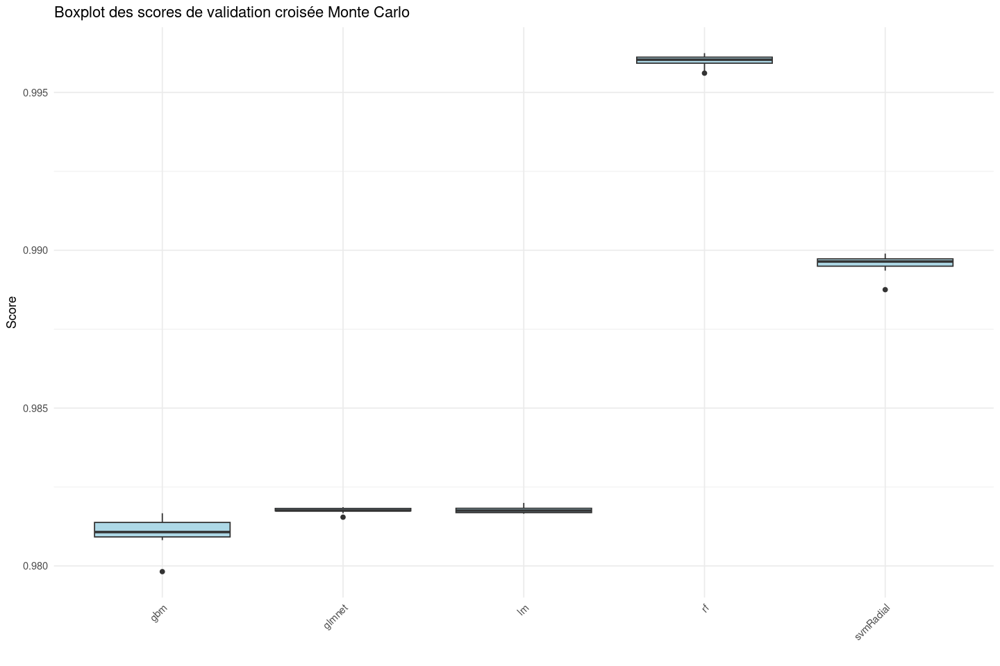

In [154]:
results <- list(lm = res1, glmnet = res2, svmRadial = res3, rf = res5, gbm = res6)

res_box <- do.call(rbind, lapply(names(results), function(model) {
  data.frame(Modèle = model, Score = results[[model]])
}))

library(ggplot2)

p <- ggplot(res_box, aes(x = Modèle, y = Score)) +
  geom_boxplot(fill = "lightblue") +
  labs(title = "Boxplot des scores de validation croisée Monte Carlo",
       x = "",
       y = "Score") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))
  
print(p)

Le graphique présente les scores de validation croisée Monte Carlo pour divers modèles de machine learning. Le modèle de Boosting se distingue par ses scores très élevés et une faible variance, indiquant une performance et une stabilité remarquables avec des scores autour de 0.995. Le modèle de Random Forest suit de près, affichant des scores également élevés, juste en dessous de ceux du Boosting, avec une légère augmentation de la variance, mais il reste très performant et fiable. Cela confirme les observations réalisées dans la partie précédente.

On retrouve la performance la pus élevée avec le noyau radial. Ce modèle est talonné de près par le modèle complet. La SVR avec noyau radial présente l'avantage d'être plus robuste et les scores de validation croisée sont plus condensés.

Les modèles de régression Ridge et Lasso montrent des performances similaires, avec des scores avoisinant les 0.980 et une faible variance, signalant une stabilité raisonnable bien que leurs performances soient inférieures à celles des modèles de Boosting et de Random Forest. On retrouve la similarité dans les résultats de tous nos modèles de régression linéaire. L'arbre optimal présente une performance intermédiaire avec une médiane plus élevée que celles des modèles Ridge et Lasso, autour de 0.982, mais il affiche une variance plus importante, ce qui indique une incertitude accrue dans ses résultats.

Aussi, le réseau de neurones, le modèle de boosting sur des données découpées "par grappes" et le modèle complet montrent la plus grande variance parmi tous les modèles testés. Cette variabilité pour le réseau de neurones pourrait être due à différents facteurs, tels que l'initialisation des poids ou le réglage des hyperparamètres, ce qui rend ses performances moins prévisibles. Pour le modèle de boosting su les autres données, la variabilité peut s'expliquer par le manque d'aléa dans le mélande des données dans l'échantillon d'entraînement.

Enfin, les modèles issus de la dernière partie sur l'optimisation de la performance se distinguent avec des scores de validation croisée très élevés (les scores sont au moins aussi élevés que pour le Boosting et la forêt aléatoire de la section 2, voir plus élevés). On observe une dispersion entre les folds légèrement plus importante pour ces modèles que pour le modèle de Boosting entraîné sur le découpage aléatoire. Les folds sont cependant moins dispersés que pour les modèles de régression linéaire comme Ridge et Lasso.


# 4 - Conclusion sur le projet



Au terme de notre projet, nous avons réalisé une analyse approfondie des différentes étapes, allant de l'exploration des données à la comparaison des performances des modèles de machine learning, en passant par l'application de ces modèles sur un échantillon de test.

L'analyse exploratoire a révélé plusieurs points essentiels pour la modélisation. Nous avons constaté la présence de nombreuses valeurs manquantes, résolues dans un premier temps par l'élimination des colonnes et lignes les plus affectées. Les différences d'échelles et de distributions non gaussiennes entre les variables ont été corrigées, notamment par des transformations logarithmiques, rendant nos données plus aptes à la modélisation. Nous avons également mis en évidence de fortes disparités entre les pays en termes d'émissions de CO2, influencées par la répartition du mix énergétique. Les énergies fossiles ont montré une corrélation élevée avec les émissions, tandis que l'énergie nucléaire et les énergies renouvelables n'avaient pas d'impact significatif sans la suppression préalable des énergies fossiles. Enfin, notre analyse en composantes principales a permis de réduire la dimensionnalité des données tout en conservant l'essentiel de l'information.

La comparaison des erreurs de généralisation sur les différents modèles implémentés a montré que les modèles linéaires, qu'ils incluent ou non des méthodes de sélection de variables, étaient efficaces. Ces modèles présentent des scores de validation croisée similaires et élevés. Le Support Vector Regressor (SVR) avec noyau radial a également montré les meilleures performances, mais compte tenu du coût computationnel de cette méthode, ce n'est pas celle que nous avons conservé pour la suite. Les modèles non linéaires, en particulier les forêts aléatoires et le boosting, ont dépassé les performances des modèles linéaires, capturant des relations complexes et donnant une meilleure robustesse face au surajustement. Ces méthodes se sont révélées particulièrement efficaces pour modéliser les relations non linéaires présentes dans les données.

L'application des modèles à l'échantillon de test a confirmé les tendances observées lors de la validation croisée. Les modèles d'ensemble (forêt aléatoire et boosting) ont montré les meilleures performances, avec des scores de R² et R² ajusté élevés, et des erreurs (RMSE et MAE) faibles, indiquant une excellente capacité de généralisation et de prédiction. L'analyse des variables importantes a révélé que la variable fossil_elec était fortement corrélée avec les émissions de CO2, confirmant alors les résultats de l'analyse exploratoire. Cela a également diminué l'importance relative des autres variables. Cependant, lorsque cette variable était retirée, d'autres variables comme la densité et la part d'énergie renouvelable devenaient plus significatives.

Par la suite, nous avons étudié les performances de nos meilleurs modèles sur un découpage de nos échantilons d'entraînement et de test selon une répartition équitable des pays sur les 20 années. Nous avons observé des erreurs de généralisation légèrement plus importantes en comparaison avec ces mêmes modèles entraînés sur un échantillon aléatoire. Cela peut s'expliquer par le fonctionnement de la fonction de validation croisée en Python qui ne sélectionne pas aléatoirement les différents folds. Lorsque nous avons testé la performance de ces modèles sur l'échantillon de test, les résultats étaient très satisfaisants, dans les mêmes eaux que les premiers modèles, mais légèrement inférieurs. L'imputation des valeurs manquantes a pemris de mettre en évidence un réel gain grâce à la méthode KNN. Les autres méthodes utilisées ont fait leurs preuves, mais les résultats proches des modèles sans les valeurs manquantes indiquent une potentielle amélioration due à l'estimation de l'erreur.

Nous avons pu comparer nos modèles avec une simple régression linéaire de la variable Fossil_elec. Ce modèle simple et peu coûteux en calcul offre des performances plutôt bonnes, voire remarquable si on prend en compte qu'il n'y a qu'une seule variable qui en modélise une autre. Cette modélisation peut être utile pour dégager des tendances rapides sur l'évolution des émissions de CO2. Finalement, nous avons regroupé toutes nos améliorations dans un modèle de boosting avec imputation des valeurs manquantes par KNN et ajout de la variable Fossil_elec. Une validation croisée par Monté-Carlo a permis de comparer la robustesse et la variabilité de nos modèlisations. Cela nous a permis de confirmer les performances de nos modèles de boosting et forêt aléatoire, et de confirmer que notre modèle complet avoisine les performances du modèle SVR avec noyau radial.

Pour aller plus loin, nous pourrions implémenter un nouveau modèle, avec complétion de valeurs manquantes par KNN, qui combine nos meilleurs modèles, toujours dans l'objectif d'améliorer la performance.